In [1]:
import numpy as np
import matplotlib.pyplot as plt

In [2]:
def est_coeff(x, y):
    n = np.size(x)
    mean_x, mean_y = np.mean(x), np.mean(y)
    
    SS_xy = np.sum(y*x - n*mean_y*mean_x)
    SS_xx = np.sum(x*x - n*mean_x*mean_x)
    
    b_1 = SS_xy/SS_xx
    b_0 = mean_y - b_1*mean_x
    
    return(b_0, b_1)

In [152]:
def plot_reg_line(x, y, b, i, j):
    plt.scatter(x, y, color = "m", marker = "o", s = 30)
    
    y_pred = b[0] + b[1]*x
    
    plt.xlabel(i)
    plt.ylabel(j)
    plt.show()

In [57]:
def arrays_to_reg(x, y, i, j):
    b = est_coeff(x, y)
    print("Estimated coefficients:\nb_0 = {}\nb_1 = {}".format(b[0], b[1]))
    plot_reg_line(x, y, b, i, j)

In [79]:
import pandas as pd

cities = ['Chicago', 'New York', 'Los Angeles']

crime_index = ['Violent Crime rate', 'Murder and nonnegligent manslaughter rate',
               'Legacy rape rate', 'Robbery rate', 'Aggravated assault rate',
               'Property crime rate', 'Burglary rate', 'Larceny-theft rate',
               'Motor vehicle theft rate']

ch_crime = pd.read_csv("https://raw.githubusercontent.com/DeclanCarter/DataScience/master/CrimeStatsChicagoc1.csv")
ch_rates = [ch_crime[rate] for rate in crime_index]
la_crime = pd.read_csv("https://raw.githubusercontent.com/DeclanCarter/DataScience/master/CrimeStatsLAc1.csv")
la_rates = [la_crime[rate] for rate in crime_index]
ny_crime = pd.read_csv("https://raw.githubusercontent.com/DeclanCarter/DataScience/master/CrimeStatsNYc1.csv")
ny_rates = [ny_crime[rate] for rate in crime_index]

rates = [ch_rates, la_rates, ny_rates]

pollution_index = ['Carbon Monoxide', 'Nitrogen Dioxide', 'Ozone',
                   'Sulfur Dioxide', 'PM10', 'PM2.5']

ch_co = pd.read_csv("https://raw.githubusercontent.com/DeclanCarter/DataScience/master/ChicagoCO.csv")
ch_no = pd.read_csv("https://raw.githubusercontent.com/DeclanCarter/DataScience/master/ChicagoNo2.csv")
ch_oz = pd.read_csv("https://raw.githubusercontent.com/DeclanCarter/DataScience/master/ChicagoOzone.csv")
ch_so = pd.read_csv("https://raw.githubusercontent.com/DeclanCarter/DataScience/master/ChicagoSo2.csv")
ch_10 = pd.read_csv("https://raw.githubusercontent.com/DeclanCarter/DataScience/master/ChicagoPM10.csv")
ch_25 = pd.read_csv("https://raw.githubusercontent.com/DeclanCarter/DataScience/master/ChicagoPM25.csv")
ch_pollution = [ch_co, ch_no, ch_oz, ch_so, ch_10, ch_25]

la_co = pd.read_csv("https://raw.githubusercontent.com/DeclanCarter/DataScience/master/LACO.csv")
la_no = pd.read_csv("https://raw.githubusercontent.com/DeclanCarter/DataScience/master/LANo2.csv")
la_oz = pd.read_csv("https://raw.githubusercontent.com/DeclanCarter/DataScience/master/LAOzone.csv")
la_so = pd.read_csv("https://raw.githubusercontent.com/DeclanCarter/DataScience/master/LASo2.csv")
la_10 = pd.read_csv("https://raw.githubusercontent.com/DeclanCarter/DataScience/master/LAPM10.csv")
la_25 = pd.read_csv("https://raw.githubusercontent.com/DeclanCarter/DataScience/master/LAPM25.csv")
la_pollution = [la_co, la_no, la_oz, la_so, la_10, la_25]

ny_co = pd.read_csv("https://raw.githubusercontent.com/DeclanCarter/DataScience/master/NYCO.csv")
ny_no = pd.read_csv("https://raw.githubusercontent.com/DeclanCarter/DataScience/master/NYNo2.csv")
ny_oz = pd.read_csv("https://raw.githubusercontent.com/DeclanCarter/DataScience/master/NYOzone.csv")
ny_so = pd.read_csv("https://raw.githubusercontent.com/DeclanCarter/DataScience/master/2NYSo2.csv")
ny_10 = pd.read_csv("https://raw.githubusercontent.com/DeclanCarter/DataScience/master/NYPM10.csv")
ny_25 = pd.read_csv("https://raw.githubusercontent.com/DeclanCarter/DataScience/master/NYPM25.csv")
ny_pollution = [ny_co, ny_no, ny_oz, ny_so, ny_10, ny_25]

pollution = [ch_pollution, la_pollution, ny_pollution]
#print(ch_pollution[0][index[0] + ' AQI Value'])
#print(ch_pollution[0].head(1))
#print(ch_rates[0])

In [217]:
def pollution_data(pollution, index):
#print(type(ch_pollution[0]))
    year = 1985
    prev = 0
    total = 0
    minm = 2147483647
    maxm = 0
    #change = []
    for i, x in enumerate(pollution['Date']): 
        if str(year) not in x:
            if year == 1985:
                data = [[total / 365], [minm], [maxm], [maxm - minm]]
            else:
                if year/4 == 0:
                    data[0].append(total / 366)
                else:
                    data[0].append(total / 365)
                data[1].append(minm)
                data[2].append(maxm)
                data[3].append(maxm-minm)
            total = 0
            minm = 2147483647
            maxm = 0
            year += 1
        pol = pollution[index + ' AQI Value'][i]
        total += pol
        #change.append(pol - prev)
        prev = pol
        if pol < minm:
            minm = pol
        if pol > maxm:
            maxm = pol
    data[0].append(total / 365)
    data[1].append(minm)
    data[2].append(maxm)
    data[3].append(maxm-minm)
    return data

Chicago
Chicago Mean Annual Carbon Monoxide vs Violent Crime rate
Estimated coefficients:
b_0 = -38.37503059505252
b_1 = 552.2726551253246


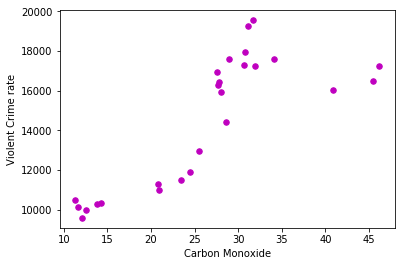

Chicago Annual Variance Carbon Monoxide vs Violent Crime rate
Estimated coefficients:
b_0 = -43.865646556574575
b_1 = 268.1798624985558


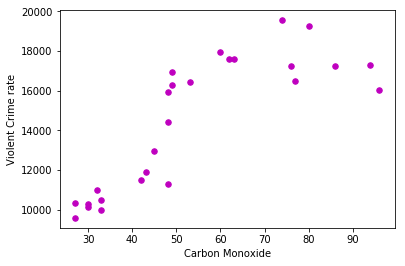

Chicago Mean Annual Carbon Monoxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.07557626635938774
b_1 = 0.8995087726178069


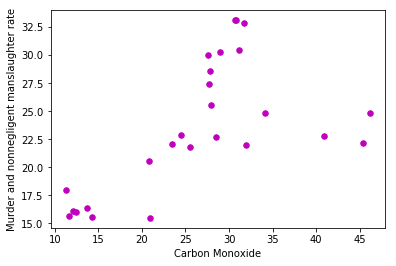

Chicago Annual Variance Carbon Monoxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.08047637704660815
b_1 = 0.43672055929054227


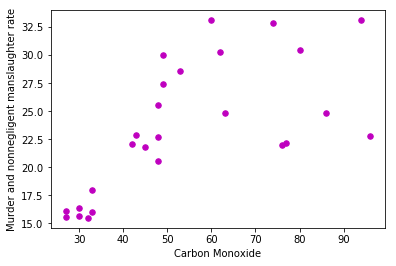

Chicago Mean Annual Carbon Monoxide vs Legacy rape rate
Estimated coefficients:
b_0 = nan
b_1 = -0.0


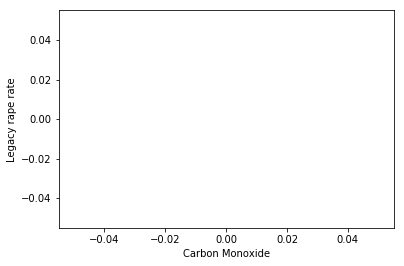

Chicago Annual Variance Carbon Monoxide vs Legacy rape rate
Estimated coefficients:
b_0 = nan
b_1 = -0.0


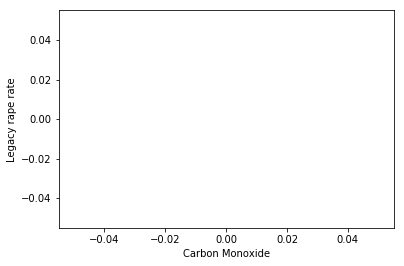

Chicago Mean Annual Carbon Monoxide vs Robbery rate
Estimated coefficients:
b_0 = -1.8025054223639927
b_1 = 33.22384918032472


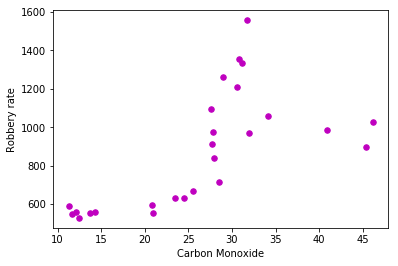

Chicago Annual Variance Carbon Monoxide vs Robbery rate
Estimated coefficients:
b_0 = -1.6700222959118491
b_1 = 16.12471215636562


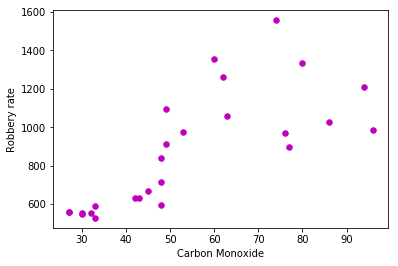

Chicago Mean Annual Carbon Monoxide vs Aggravated assault rate
Estimated coefficients:
b_0 = -2.1521692294668355
b_1 = 39.47046392956912


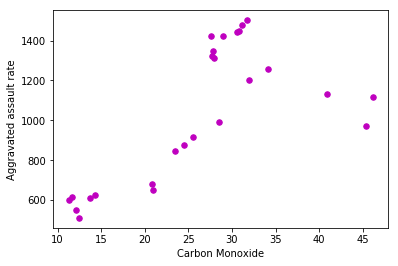

Chicago Annual Variance Carbon Monoxide vs Aggravated assault rate
Estimated coefficients:
b_0 = -2.416973516567623
b_1 = 19.16422869140979


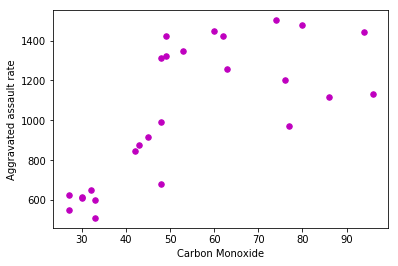

Chicago Mean Annual Carbon Monoxide vs Property crime rate
Estimated coefficients:
b_0 = -17.17246220006382
b_1 = 239.3391261249292


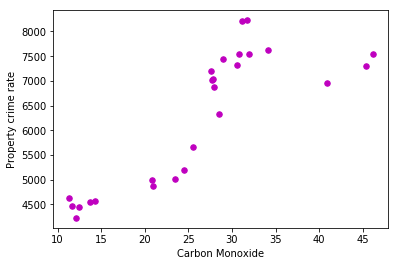

Chicago Annual Variance Carbon Monoxide vs Property crime rate
Estimated coefficients:
b_0 = -19.84913892318309
b_1 = 116.22695915445038


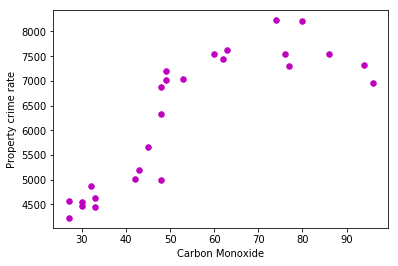

Chicago Mean Annual Carbon Monoxide vs Burglary rate
Estimated coefficients:
b_0 = -2.261369970781516
b_1 = 49.986210585396364


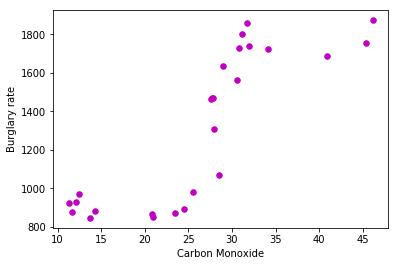

Chicago Annual Variance Carbon Monoxide vs Burglary rate
Estimated coefficients:
b_0 = -2.556318985022017
b_1 = 24.26922725523884


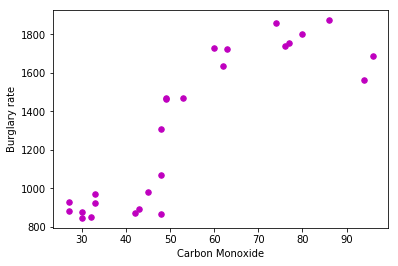

Chicago Mean Annual Carbon Monoxide vs Larceny-theft rate
Estimated coefficients:
b_0 = -13.265320091674312
b_1 = 145.13929372783517


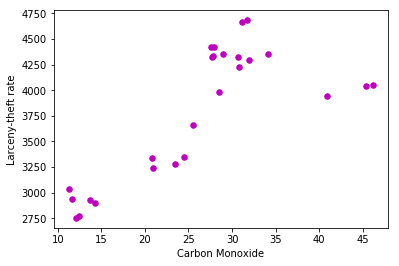

Chicago Annual Variance Carbon Monoxide vs Larceny-theft rate
Estimated coefficients:
b_0 = -15.18073177536553
b_1 = 70.48740144210643


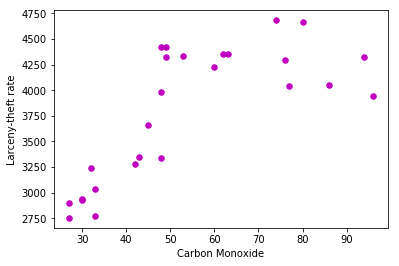

Chicago Mean Annual Carbon Monoxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -1.6456274143451992
b_1 = 44.21420280465247


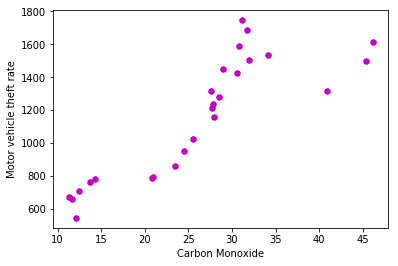

Chicago Annual Variance Carbon Monoxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -2.1119846834792497
b_1 = 21.47061323969428


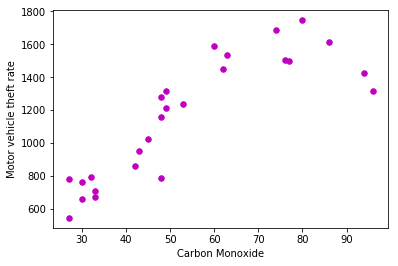

Chicago Mean Annual Nitrogen Dioxide vs Violent Crime rate
Estimated coefficients:
b_0 = -4.087360489273124
b_1 = 262.14738553983324


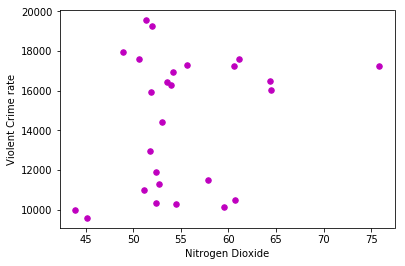

Chicago Annual Variance Nitrogen Dioxide vs Violent Crime rate
Estimated coefficients:
b_0 = -8.233553532078076
b_1 = 162.78314092327153


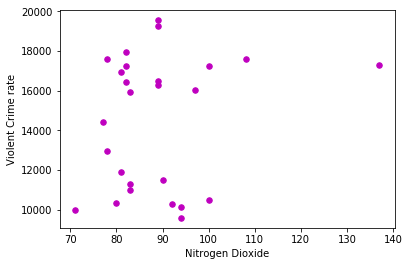

Chicago Mean Annual Nitrogen Dioxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.013020181483593518
b_1 = 0.4268483130708378


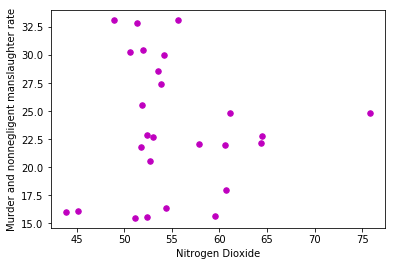

Chicago Annual Variance Nitrogen Dioxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.01310512674341524
b_1 = 0.2649808286250883


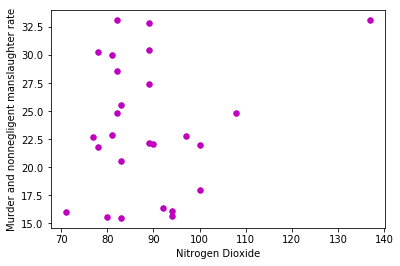

Chicago Mean Annual Nitrogen Dioxide vs Legacy rape rate
Estimated coefficients:
b_0 = nan
b_1 = -0.0


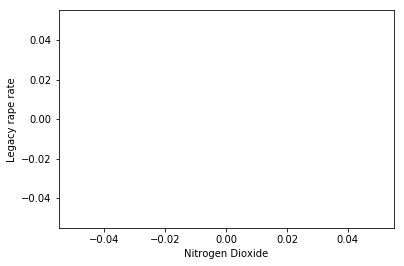

Chicago Annual Variance Nitrogen Dioxide vs Legacy rape rate
Estimated coefficients:
b_0 = nan
b_1 = -0.0


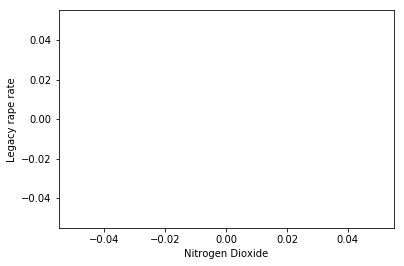

Chicago Mean Annual Nitrogen Dioxide vs Robbery rate
Estimated coefficients:
b_0 = -0.3375989801866126
b_1 = 15.78121512105058


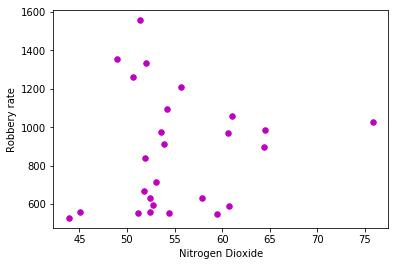

Chicago Annual Variance Nitrogen Dioxide vs Robbery rate
Estimated coefficients:
b_0 = -0.3363779602171917
b_1 = 9.796685070145362


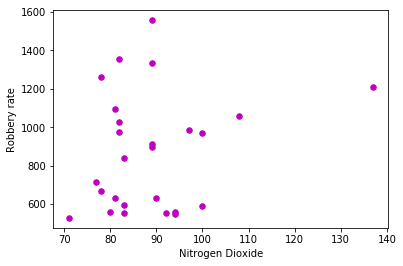

Chicago Mean Annual Nitrogen Dioxide vs Aggravated assault rate
Estimated coefficients:
b_0 = -0.4213973071825876
b_1 = 18.74850924995157


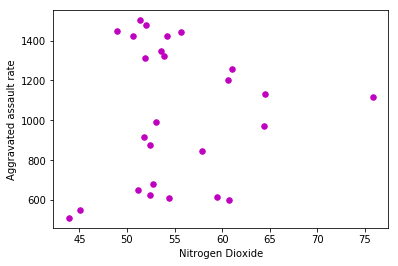

Chicago Annual Variance Nitrogen Dioxide vs Aggravated assault rate
Estimated coefficients:
b_0 = -0.4754653638758555
b_1 = 11.639351277375821


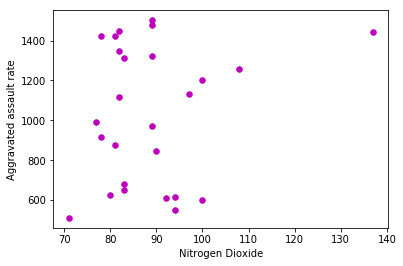

Chicago Mean Annual Nitrogen Dioxide vs Property crime rate
Estimated coefficients:
b_0 = -1.6577147960979346
b_1 = 113.5952676742401


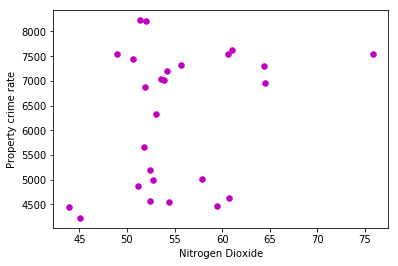

Chicago Annual Variance Nitrogen Dioxide vs Property crime rate
Estimated coefficients:
b_0 = -3.7043012284630095
b_1 = 70.54097524120401


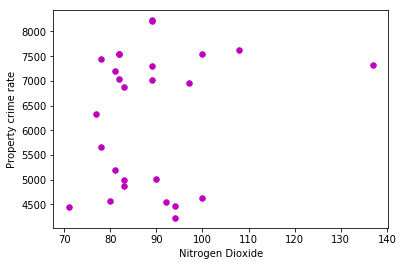

Chicago Mean Annual Nitrogen Dioxide vs Burglary rate
Estimated coefficients:
b_0 = -0.01908317437550977
b_1 = 23.742585044945436


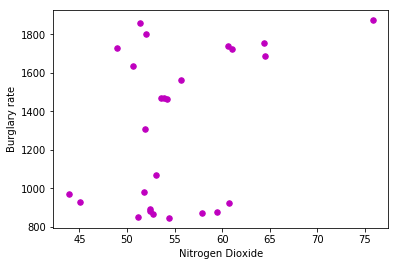

Chicago Annual Variance Nitrogen Dioxide vs Burglary rate
Estimated coefficients:
b_0 = -0.5528473591525653
b_1 = 14.744986587846672


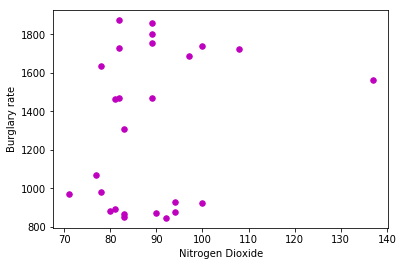

Chicago Mean Annual Nitrogen Dioxide vs Larceny-theft rate
Estimated coefficients:
b_0 = -1.553501508888985
b_1 = 68.84431011020817


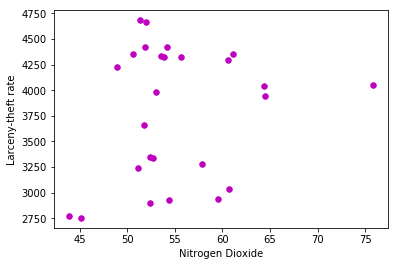

Chicago Annual Variance Nitrogen Dioxide vs Larceny-theft rate
Estimated coefficients:
b_0 = -2.532172384389014
b_1 = 42.74834841143099


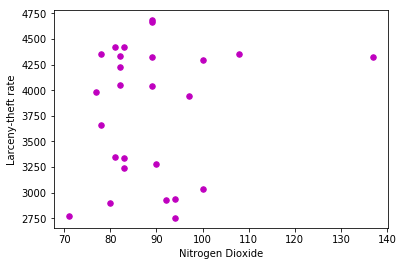

Chicago Mean Annual Nitrogen Dioxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -0.08504454105627701
b_1 = 21.008650026366585


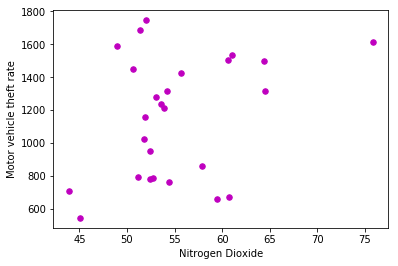

Chicago Annual Variance Nitrogen Dioxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -0.6192841092338313
b_1 = 13.047813506643605


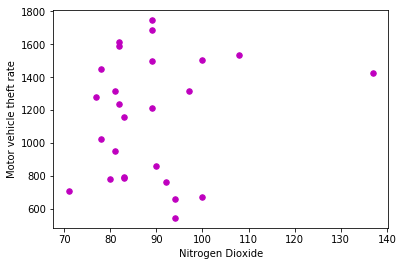

Chicago Mean Annual Ozone vs Violent Crime rate
Estimated coefficients:
b_0 = -0.5078328167128348
b_1 = 282.94536901590885


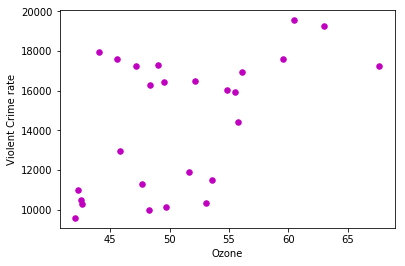

Chicago Annual Variance Ozone vs Violent Crime rate
Estimated coefficients:
b_0 = -0.15161240903216822
b_1 = 71.36324884548533


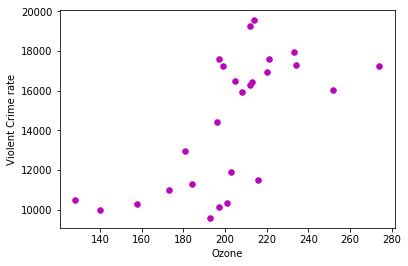

Chicago Mean Annual Ozone vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.006101290789761293
b_1 = 0.46069181804216364


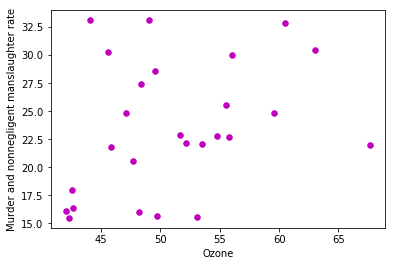

Chicago Annual Variance Ozone vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.0026208955532993627
b_1 = 0.11617935852666907


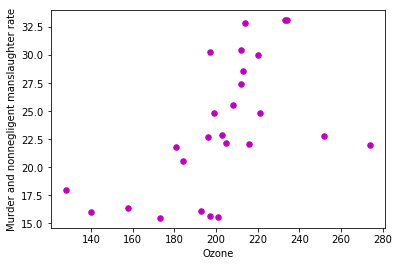

Chicago Mean Annual Ozone vs Legacy rape rate
Estimated coefficients:
b_0 = nan
b_1 = -0.0


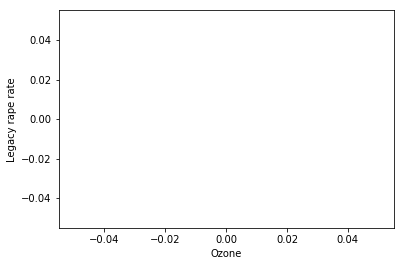

Chicago Annual Variance Ozone vs Legacy rape rate
Estimated coefficients:
b_0 = nan
b_1 = -0.0


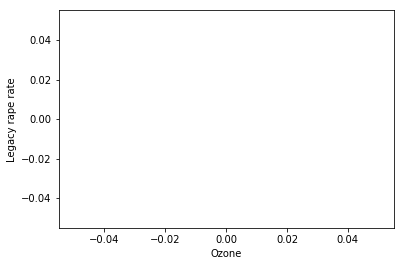

Chicago Mean Annual Ozone vs Robbery rate
Estimated coefficients:
b_0 = 0.06730519159316373
b_1 = 17.029539842907948


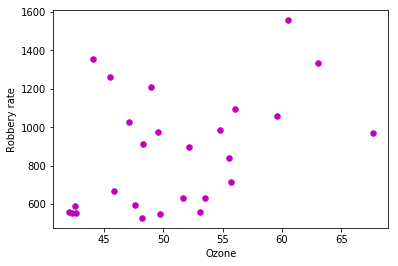

Chicago Annual Variance Ozone vs Robbery rate
Estimated coefficients:
b_0 = 0.23855468586100415
b_1 = 4.294376439621506


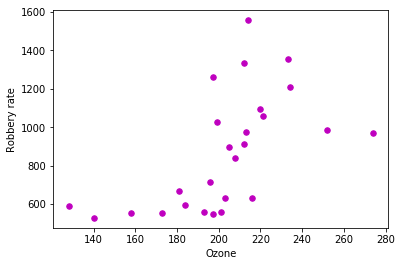

Chicago Mean Annual Ozone vs Aggravated assault rate
Estimated coefficients:
b_0 = 0.1438252324765017
b_1 = 20.22990410525557


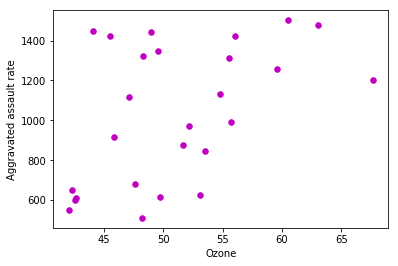

Chicago Annual Variance Ozone vs Aggravated assault rate
Estimated coefficients:
b_0 = 0.4121809515777386
b_1 = 5.101098650315156


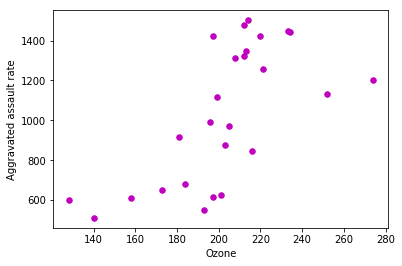

Chicago Mean Annual Ozone vs Property crime rate
Estimated coefficients:
b_0 = -0.3564659789262805
b_1 = 122.61246667342128


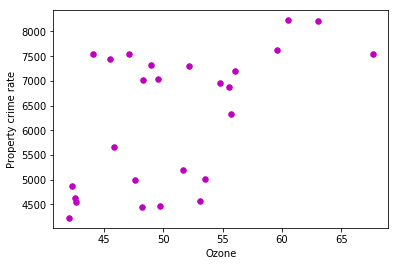

Chicago Annual Variance Ozone vs Property crime rate
Estimated coefficients:
b_0 = -0.39992436180546065
b_1 = 30.92575950482655


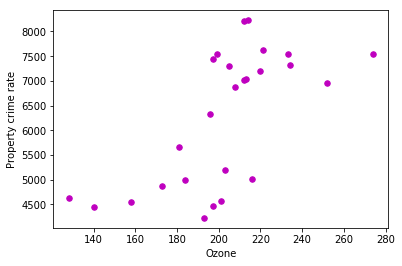

Chicago Mean Annual Ozone vs Burglary rate
Estimated coefficients:
b_0 = 0.10221054869998625
b_1 = 25.63022358621659


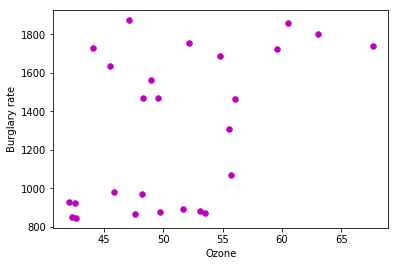

Chicago Annual Variance Ozone vs Burglary rate
Estimated coefficients:
b_0 = 0.29054038726258113
b_1 = 6.463572558877503


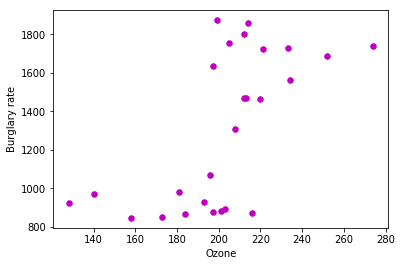

Chicago Mean Annual Ozone vs Larceny-theft rate
Estimated coefficients:
b_0 = -0.7270966398114069
b_1 = 74.30843555755634


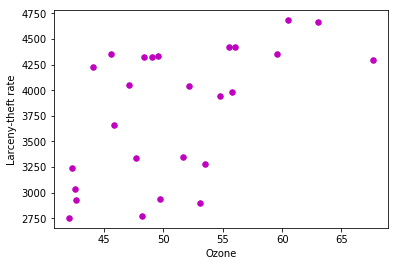

Chicago Annual Variance Ozone vs Larceny-theft rate
Estimated coefficients:
b_0 = -1.0213421437947545
b_1 = 18.743665443719358


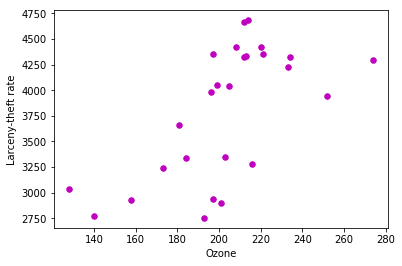

Chicago Mean Annual Ozone vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 0.26849012004754513
b_1 = 22.674107432508993


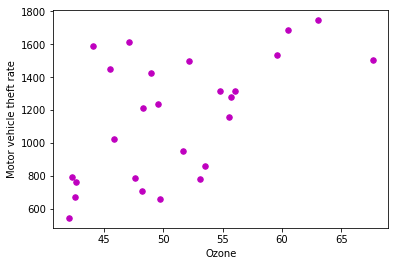

Chicago Annual Variance Ozone vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 0.3309989674219196
b_1 = 5.718596889598602


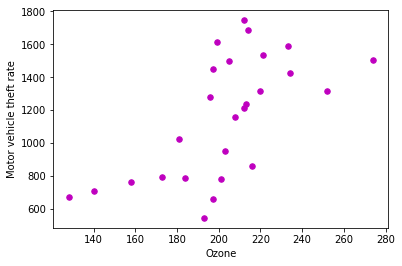

Chicago Mean Annual Sulfur Dioxide vs Violent Crime rate
Estimated coefficients:
b_0 = -22.147094806852692
b_1 = 197.15477395602022


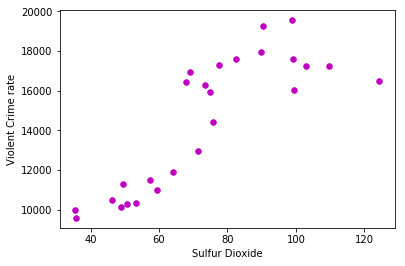

Chicago Annual Variance Sulfur Dioxide vs Violent Crime rate
Estimated coefficients:
b_0 = 1.4773209791510453
b_1 = 94.8519670844803


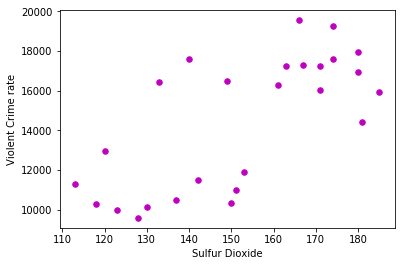

Chicago Mean Annual Sulfur Dioxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.05131273517094925
b_1 = 0.32114347346724426


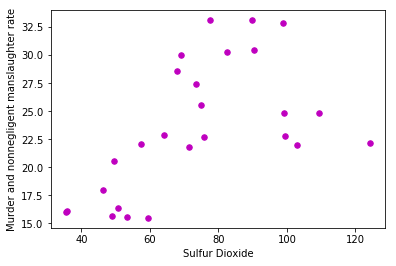

Chicago Annual Variance Sulfur Dioxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -9.345163198304363e-05
b_1 = 0.15441980549051304


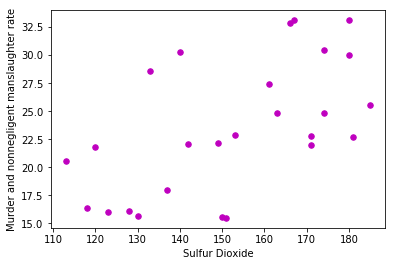

Chicago Mean Annual Sulfur Dioxide vs Legacy rape rate
Estimated coefficients:
b_0 = nan
b_1 = -0.0


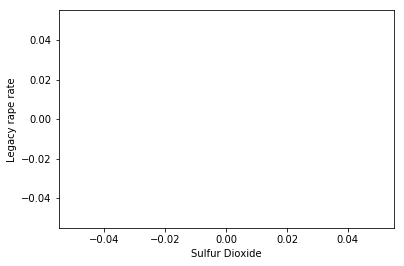

Chicago Annual Variance Sulfur Dioxide vs Legacy rape rate
Estimated coefficients:
b_0 = nan
b_1 = -0.0


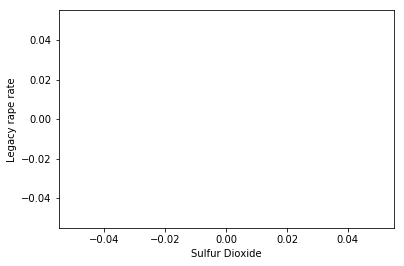

Chicago Mean Annual Sulfur Dioxide vs Robbery rate
Estimated coefficients:
b_0 = -0.7741965036053671
b_1 = 11.859809949132064


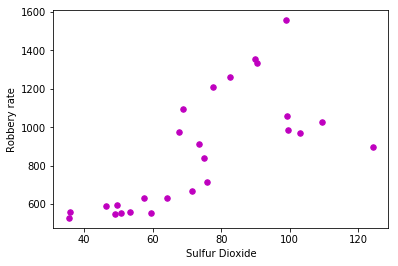

Chicago Annual Variance Sulfur Dioxide vs Robbery rate
Estimated coefficients:
b_0 = 0.33108606618839076
b_1 = 5.707876707646236


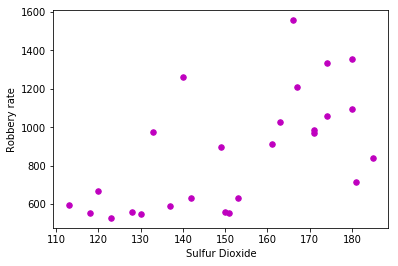

Chicago Mean Annual Sulfur Dioxide vs Aggravated assault rate
Estimated coefficients:
b_0 = -1.1597042204791705
b_1 = 14.092766365962953


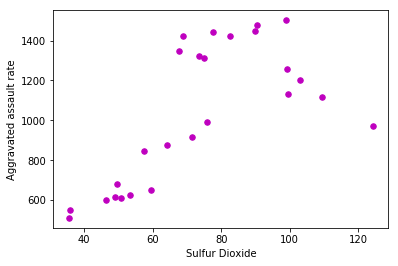

Chicago Annual Variance Sulfur Dioxide vs Aggravated assault rate
Estimated coefficients:
b_0 = 0.5069787754946447
b_1 = 6.78023195753463


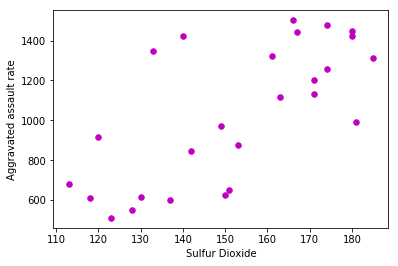

Chicago Mean Annual Sulfur Dioxide vs Property crime rate
Estimated coefficients:
b_0 = -10.080997589217986
b_1 = 85.44042305318787


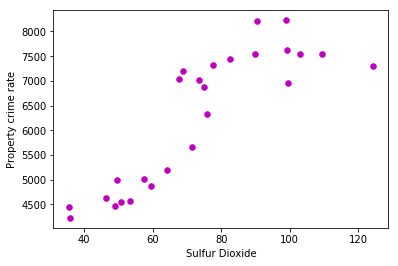

Chicago Annual Variance Sulfur Dioxide vs Property crime rate
Estimated coefficients:
b_0 = 0.31964881894236896
b_1 = 41.10466897240089


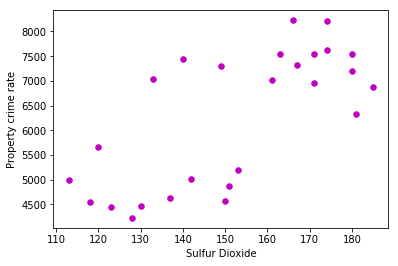

Chicago Mean Annual Sulfur Dioxide vs Burglary rate
Estimated coefficients:
b_0 = -0.8548091963823481
b_1 = 17.84533094903078


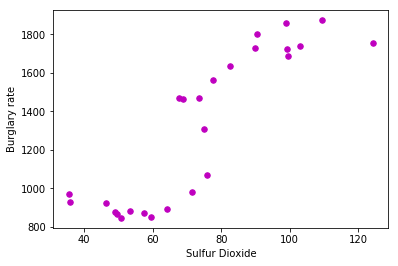

Chicago Annual Variance Sulfur Dioxide vs Burglary rate
Estimated coefficients:
b_0 = 0.33610592014838403
b_1 = 8.59168213284751


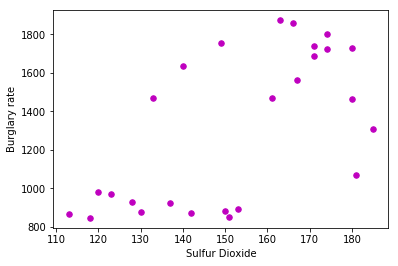

Chicago Mean Annual Sulfur Dioxide vs Larceny-theft rate
Estimated coefficients:
b_0 = -8.769780776419339
b_1 = 51.809858539992426


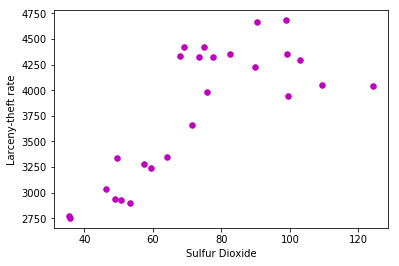

Chicago Annual Variance Sulfur Dioxide vs Larceny-theft rate
Estimated coefficients:
b_0 = -0.5285268628549602
b_1 = 24.912586287483396


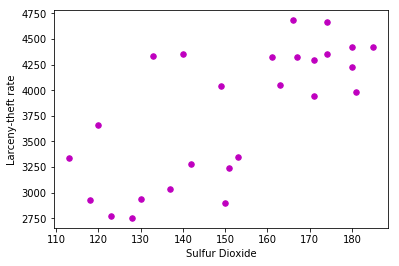

Chicago Mean Annual Sulfur Dioxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -0.45629378557646305
b_1 = 15.785441625246934


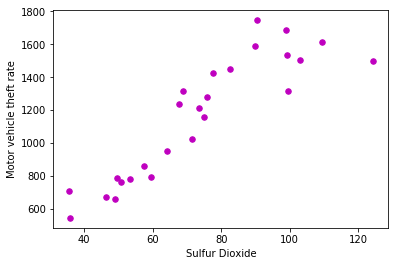

Chicago Annual Variance Sulfur Dioxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 0.5121217128639728
b_1 = 7.600501221077157


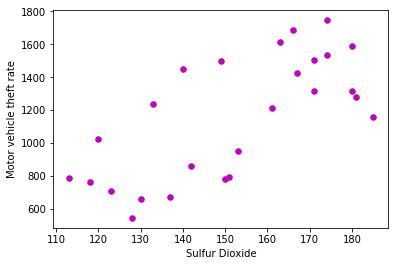

Chicago Mean Annual PM10 vs Violent Crime rate
Estimated coefficients:
b_0 = -82.43861094585009
b_1 = 411.6305035190541


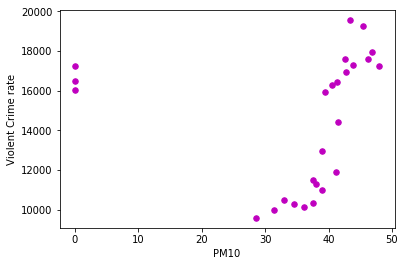

Chicago Annual Variance PM10 vs Violent Crime rate
Estimated coefficients:
b_0 = 4823715456.008172
b_1 = 58.40156499632933


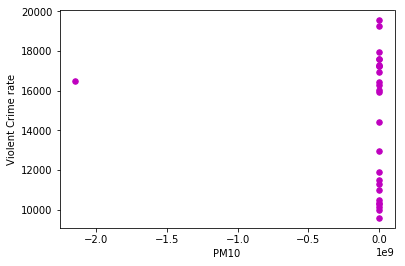

Chicago Mean Annual PM10 vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.11556472943864904
b_1 = 0.6695389503291745


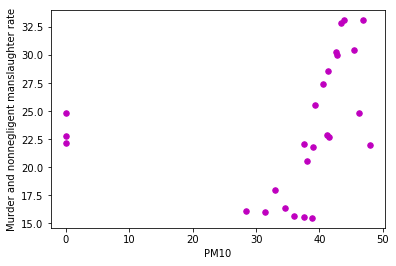

Chicago Annual Variance PM10 vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 7914403.423845218
b_1 = 0.09582106595187194


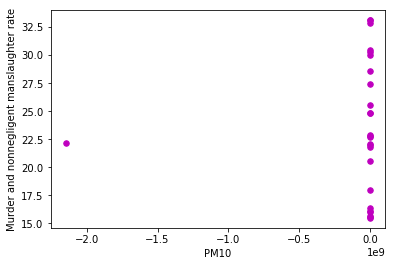

Chicago Mean Annual PM10 vs Legacy rape rate
Estimated coefficients:
b_0 = nan
b_1 = -0.0


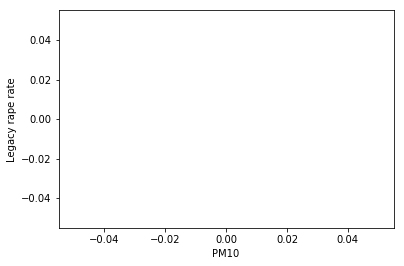

Chicago Annual Variance PM10 vs Legacy rape rate
Estimated coefficients:
b_0 = nan
b_1 = 0.0


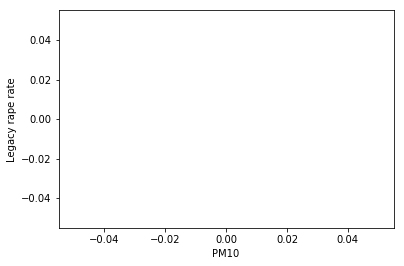

Chicago Mean Annual PM10 vs Robbery rate
Estimated coefficients:
b_0 = -4.507110355618465
b_1 = 24.764564198218544


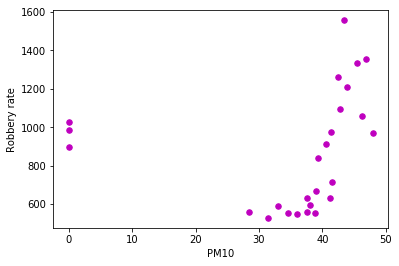

Chicago Annual Variance PM10 vs Robbery rate
Estimated coefficients:
b_0 = 291637642.15029436
b_1 = 3.5309078847897744


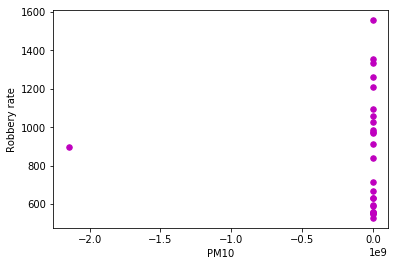

Chicago Mean Annual PM10 vs Aggravated assault rate
Estimated coefficients:
b_0 = -4.867558078976117
b_1 = 29.406598326466078


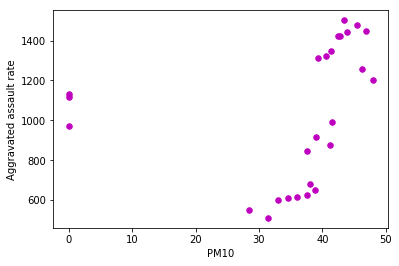

Chicago Annual Variance PM10 vs Aggravated assault rate
Estimated coefficients:
b_0 = 347743549.4547591
b_1 = 4.210191952751104


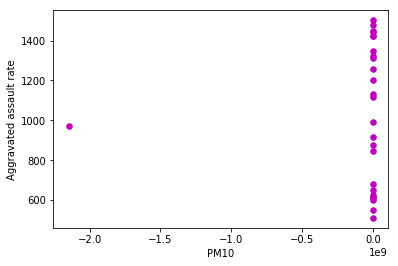

Chicago Mean Annual PM10 vs Property crime rate
Estimated coefficients:
b_0 = -36.47402903659258
b_1 = 178.3946785818341


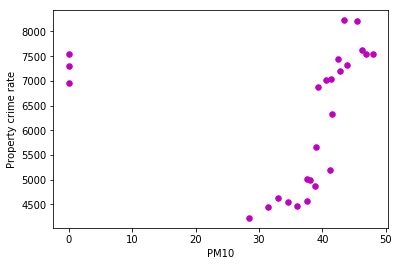

Chicago Annual Variance PM10 vs Property crime rate
Estimated coefficients:
b_0 = 2088207244.4543593
b_1 = 25.28228952611607


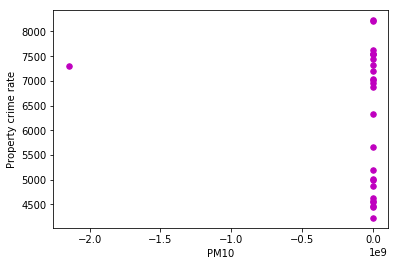

Chicago Mean Annual PM10 vs Burglary rate
Estimated coefficients:
b_0 = -8.723209533118961
b_1 = 37.32676093131689


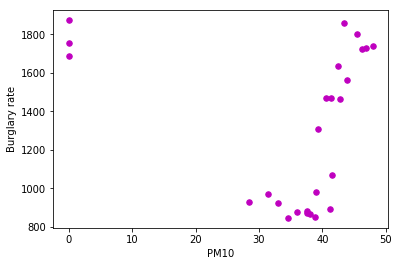

Chicago Annual Variance PM10 vs Burglary rate
Estimated coefficients:
b_0 = 433471066.02149516
b_1 = 5.248109729934672


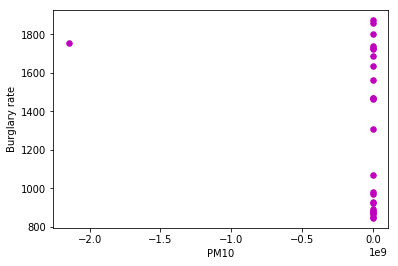

Chicago Mean Annual PM10 vs Larceny-theft rate
Estimated coefficients:
b_0 = -20.839619088824747
b_1 = 108.06453914695895


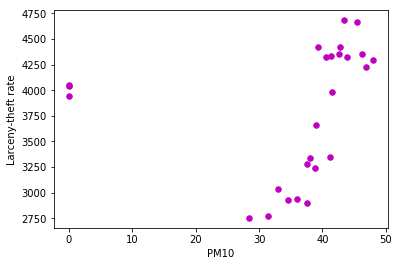

Chicago Annual Variance PM10 vs Larceny-theft rate
Estimated coefficients:
b_0 = 1270446423.3116734
b_1 = 15.381516739516055


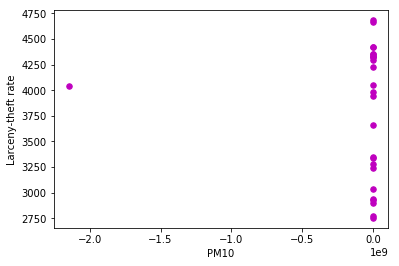

Chicago Mean Annual PM10 vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -6.911520123277796
b_1 = 33.003823383930374


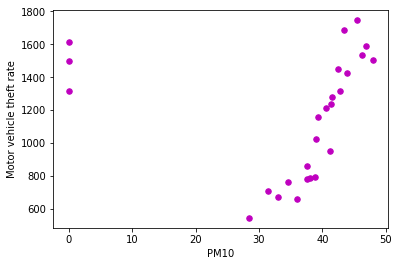

Chicago Annual Variance PM10 vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 384295127.1917469
b_1 = 4.652728097269799


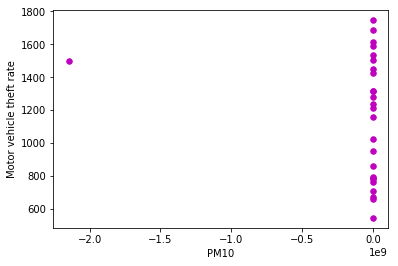

Chicago Mean Annual PM2.5 vs Violent Crime rate
Estimated coefficients:
b_0 = -840.7725122303636
b_1 = 500.18610343863725


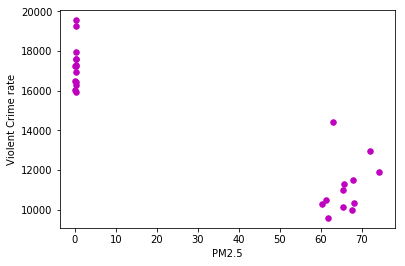

Chicago Annual Variance PM2.5 vs Violent Crime rate
Estimated coefficients:
b_0 = 9810131471.473732
b_1 = 118.77306844562737


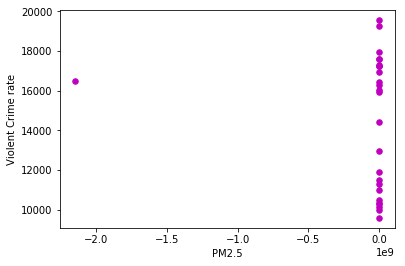

Chicago Mean Annual PM2.5 vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -1.3469725730010325
b_1 = 0.8135118717776715


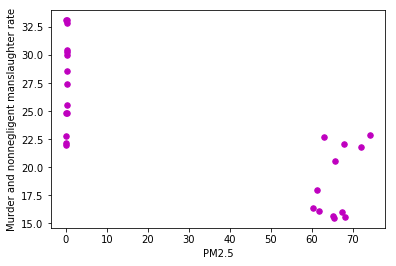

Chicago Annual Variance PM2.5 vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 16095754.250619253
b_1 = 0.1948742633037553


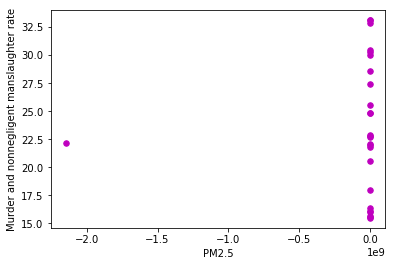

Chicago Mean Annual PM2.5 vs Legacy rape rate
Estimated coefficients:
b_0 = nan
b_1 = -0.0


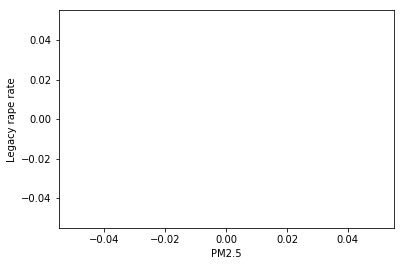

Chicago Annual Variance PM2.5 vs Legacy rape rate
Estimated coefficients:
b_0 = nan
b_1 = 0.0


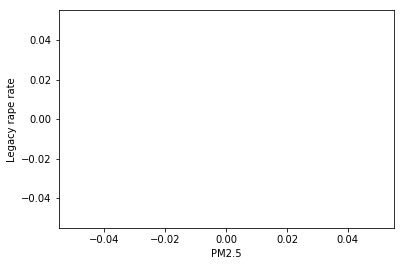

Chicago Mean Annual PM2.5 vs Robbery rate
Estimated coefficients:
b_0 = -53.84147201527185
b_1 = 30.21367699990667


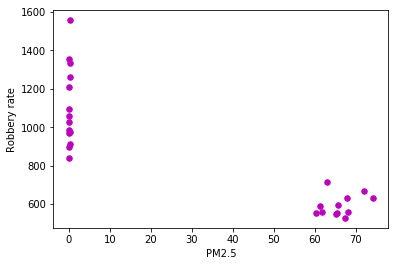

Chicago Annual Variance PM2.5 vs Robbery rate
Estimated coefficients:
b_0 = 593112019.2628415
b_1 = 7.180916496441018


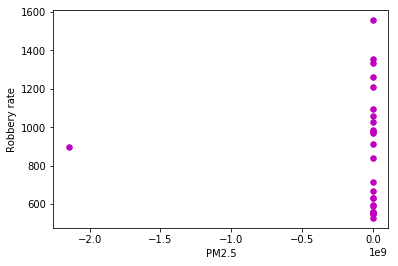

Chicago Mean Annual PM2.5 vs Aggravated assault rate
Estimated coefficients:
b_0 = -63.779359051525034
b_1 = 35.88792115652095


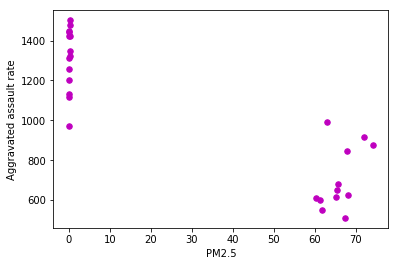

Chicago Annual Variance PM2.5 vs Aggravated assault rate
Estimated coefficients:
b_0 = 707216247.8386899
b_1 = 8.562397461297595


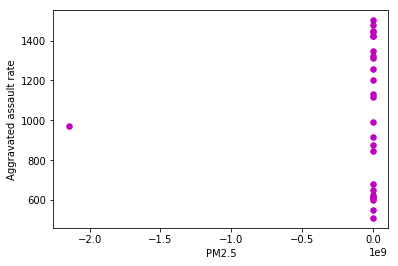

Chicago Mean Annual PM2.5 vs Property crime rate
Estimated coefficients:
b_0 = -360.9020300769889
b_1 = 216.63523444004548


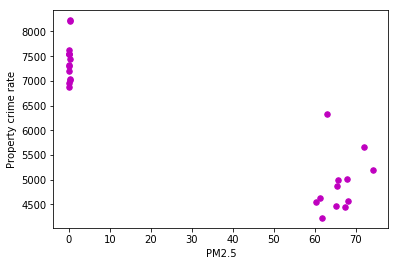

Chicago Annual Variance PM2.5 vs Property crime rate
Estimated coefficients:
b_0 = 4246848262.391836
b_1 = 51.41737397474915


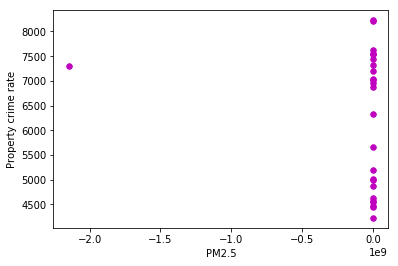

Chicago Mean Annual PM2.5 vs Burglary rate
Estimated coefficients:
b_0 = -80.34248951538802
b_1 = 45.45035516727007


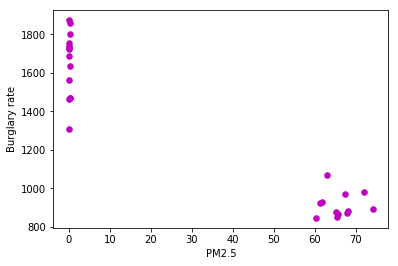

Chicago Annual Variance PM2.5 vs Burglary rate
Estimated coefficients:
b_0 = 881562802.3562427
b_1 = 10.673243076577355


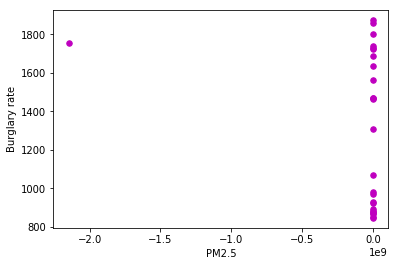

Chicago Mean Annual PM2.5 vs Larceny-theft rate
Estimated coefficients:
b_0 = -210.1086404802586
b_1 = 130.99176594464095


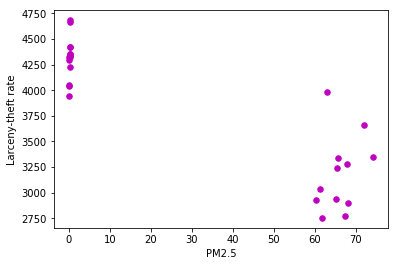

Chicago Annual Variance PM2.5 vs Larceny-theft rate
Estimated coefficients:
b_0 = 2583744128.829997
b_1 = 31.281866151347483


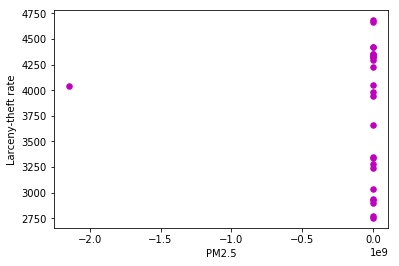

Chicago Mean Annual PM2.5 vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -70.451548517927
b_1 = 40.19363785847547


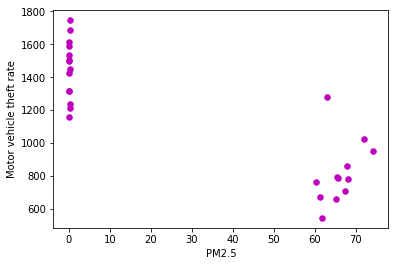

Chicago Annual Variance PM2.5 vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 781552256.5435065
b_1 = 9.462397021911043


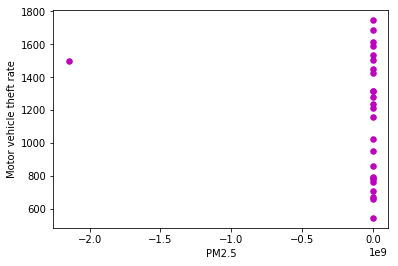

In [153]:
print('Chicago')
for j, y in enumerate(pollution[0]):
    data = pollution_data(y, pollution_index[j])
    mean = np.array(data[0])
    variance = np.array(data[3])
    for k, z in enumerate(rates[0]):
        print('Chicago Mean Annual', pollution_index[j], 'vs', crime_index[k])
        arrays_to_reg(mean, z, pollution_index[j], crime_index[k])
        print('Chicago Annual Variance', pollution_index[j], 'vs', crime_index[k])
        arrays_to_reg(variance, z, pollution_index[j], crime_index[k])

Los Angeles
Los Angeles Mean Annual Carbon Monoxide vs Violent Crime rate
Estimated coefficients:
b_0 = -2.405646380181679
b_1 = 39.535212812958044


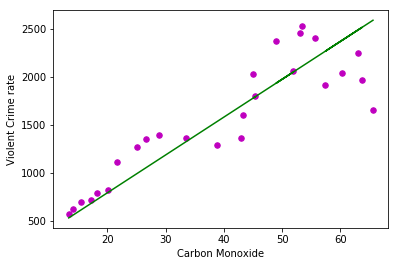

Los Angeles Annual Variance Carbon Monoxide vs Violent Crime rate
Estimated coefficients:
b_0 = -6.100354255723005
b_1 = 10.896562539814248


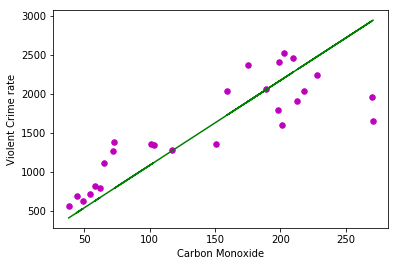

Los Angeles Mean Annual Carbon Monoxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.03453177064523061
b_1 = 0.4729538045752887


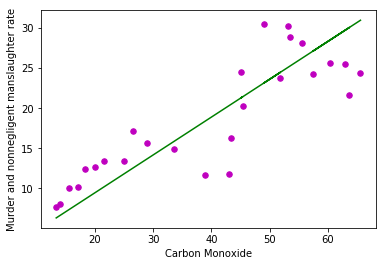

Los Angeles Annual Variance Carbon Monoxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.07838649999894187
b_1 = 0.13035153157752555


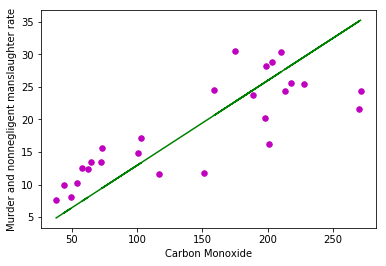

Los Angeles Mean Annual Carbon Monoxide vs Legacy rape rate
Estimated coefficients:
b_0 = -0.08752145421522073
b_1 = 1.0925932493600208


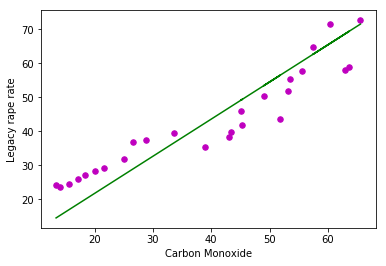

Los Angeles Annual Variance Carbon Monoxide vs Legacy rape rate
Estimated coefficients:
b_0 = -0.18852493228563816
b_1 = 0.3011291717923747


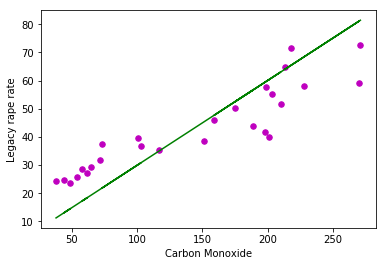

Los Angeles Mean Annual Carbon Monoxide vs Robbery rate
Estimated coefficients:
b_0 = -0.6587162680593792
b_1 = 16.220782167659806


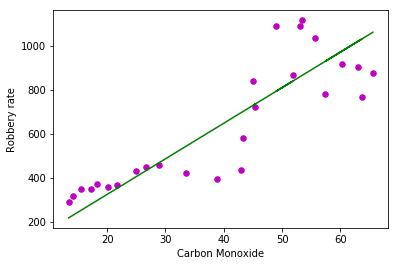

Los Angeles Annual Variance Carbon Monoxide vs Robbery rate
Estimated coefficients:
b_0 = -2.035656055554796
b_1 = 4.469746588939647


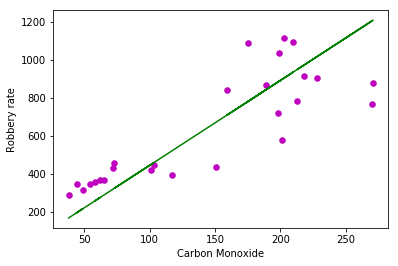

Los Angeles Mean Annual Carbon Monoxide vs Aggravated assault rate
Estimated coefficients:
b_0 = -1.6244852916017862
b_1 = 21.749069116866433


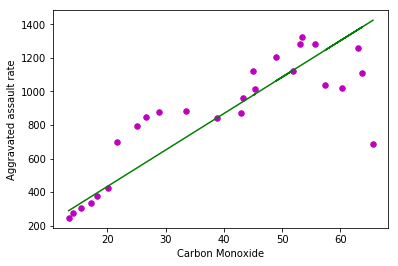

Los Angeles Annual Variance Carbon Monoxide vs Aggravated assault rate
Estimated coefficients:
b_0 = -3.797287969265426
b_1 = 5.995385511206908


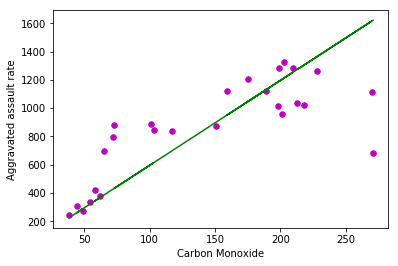

Los Angeles Mean Annual Carbon Monoxide vs Property crime rate
Estimated coefficients:
b_0 = -6.035901250903407
b_1 = 121.2752572068547


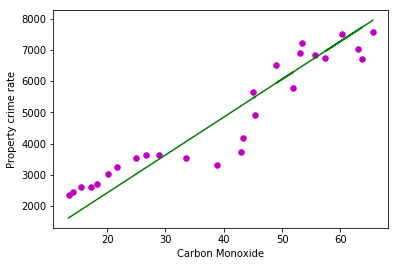

Los Angeles Annual Variance Carbon Monoxide vs Property crime rate
Estimated coefficients:
b_0 = -16.487953207495593
b_1 = 33.419319210802165


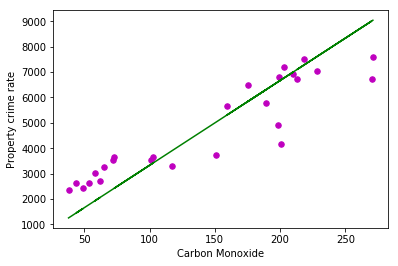

Los Angeles Mean Annual Carbon Monoxide vs Burglary rate
Estimated coefficients:
b_0 = 0.1535383198920499
b_1 = 25.987465179287565


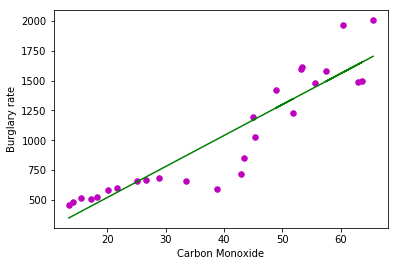

Los Angeles Annual Variance Carbon Monoxide vs Burglary rate
Estimated coefficients:
b_0 = -1.7775880182196033
b_1 = 7.159101663121126


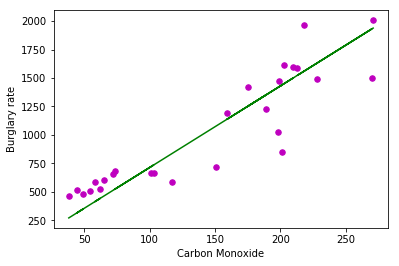

Los Angeles Mean Annual Carbon Monoxide vs Larceny-theft rate
Estimated coefficients:
b_0 = -5.365661360319791
b_1 = 65.8983377149827


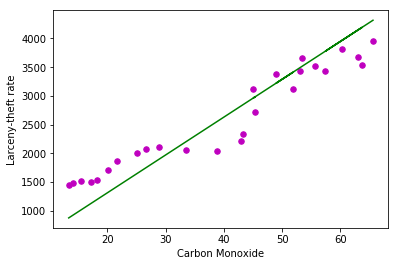

Los Angeles Annual Variance Carbon Monoxide vs Larceny-theft rate
Estimated coefficients:
b_0 = -11.427491636140076
b_1 = 18.162003435243115


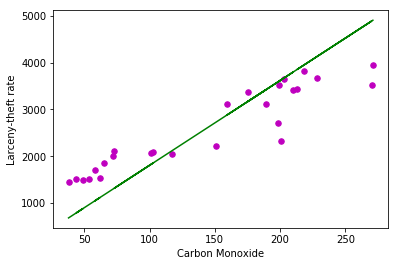

Los Angeles Mean Annual Carbon Monoxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -0.8235825391964227
b_1 = 29.3887651716633


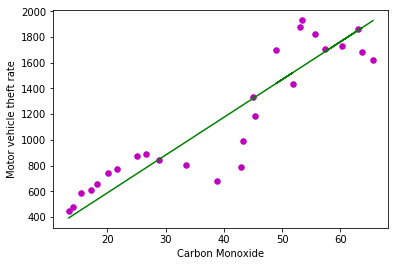

Los Angeles Annual Variance Carbon Monoxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -3.282603644472374
b_1 = 8.098024105013781


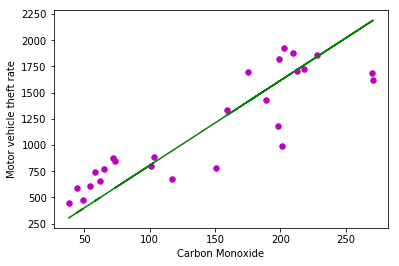

Los Angeles Mean Annual Nitrogen Dioxide vs Violent Crime rate
Estimated coefficients:
b_0 = 1.766228723909535
b_1 = 21.276127572026304


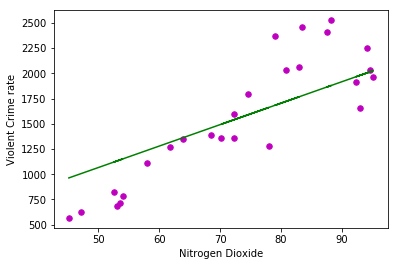

Los Angeles Annual Variance Nitrogen Dioxide vs Violent Crime rate
Estimated coefficients:
b_0 = 0.8592561122047755
b_1 = 15.998874094761273


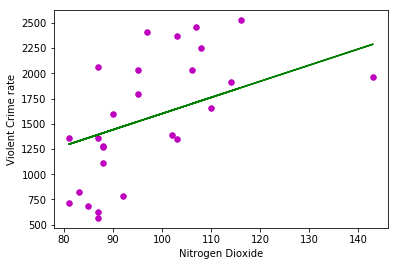

Los Angeles Mean Annual Nitrogen Dioxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 0.017974105154525688
b_1 = 0.2544874843652546


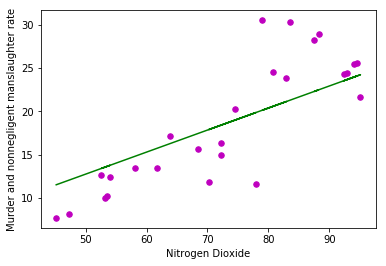

Los Angeles Annual Variance Nitrogen Dioxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 0.010901726388699018
b_1 = 0.19132641899084182


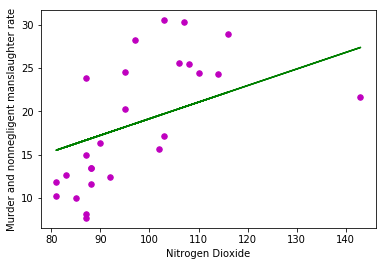

Los Angeles Mean Annual Nitrogen Dioxide vs Legacy rape rate
Estimated coefficients:
b_0 = 0.0382376056979723
b_1 = 0.587842538918363


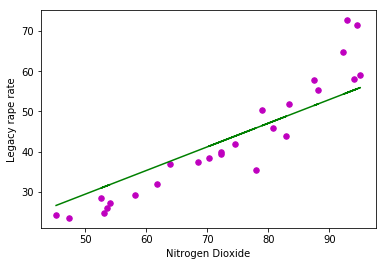

Los Angeles Annual Variance Nitrogen Dioxide vs Legacy rape rate
Estimated coefficients:
b_0 = 0.025594892640441458
b_1 = 0.4419082571507524


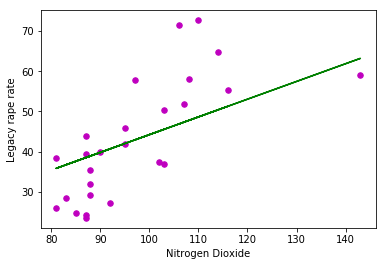

Los Angeles Mean Annual Nitrogen Dioxide vs Robbery rate
Estimated coefficients:
b_0 = 0.833191040665838
b_1 = 8.732331058084863


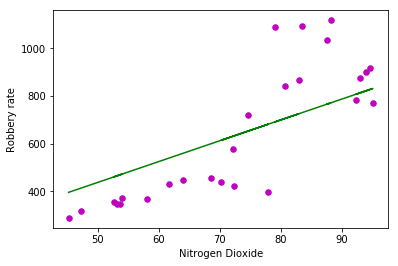

Los Angeles Annual Variance Nitrogen Dioxide vs Robbery rate
Estimated coefficients:
b_0 = 0.45440666386002704
b_1 = 6.566462713729544


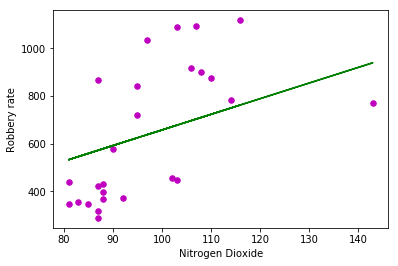

Los Angeles Mean Annual Nitrogen Dioxide vs Aggravated assault rate
Estimated coefficients:
b_0 = 0.8770382043032896
b_1 = 11.701569060349186


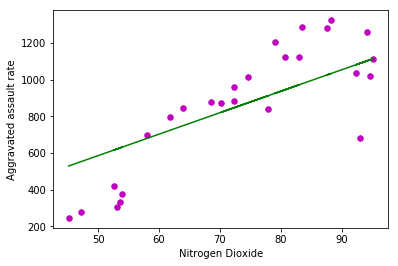

Los Angeles Annual Variance Nitrogen Dioxide vs Aggravated assault rate
Estimated coefficients:
b_0 = 0.3684226913509292
b_1 = 8.799255255657899


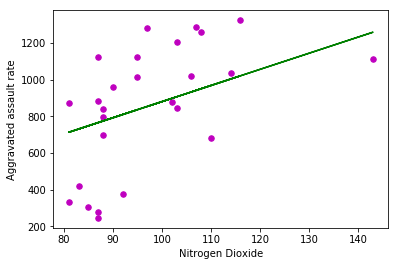

Los Angeles Mean Annual Nitrogen Dioxide vs Property crime rate
Estimated coefficients:
b_0 = 5.8590247489064495
b_1 = 65.27742926002654


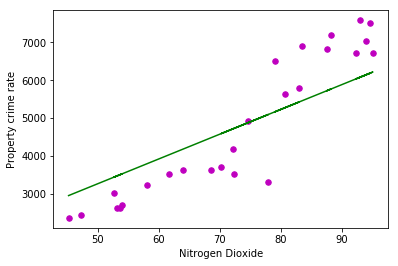

Los Angeles Annual Variance Nitrogen Dioxide vs Property crime rate
Estimated coefficients:
b_0 = 3.7196833851367046
b_1 = 49.079622763371546


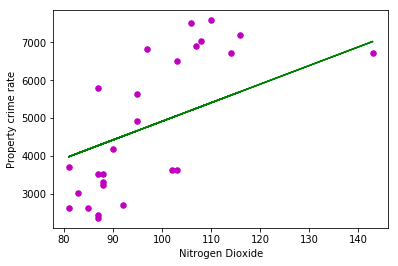

Los Angeles Mean Annual Nitrogen Dioxide vs Burglary rate
Estimated coefficients:
b_0 = 1.935580392761608
b_1 = 13.998487652454852


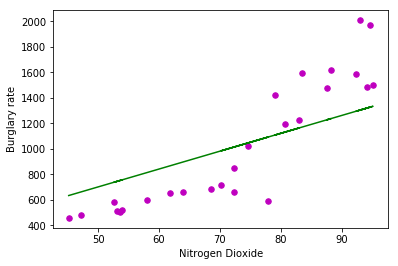

Los Angeles Annual Variance Nitrogen Dioxide vs Burglary rate
Estimated coefficients:
b_0 = 1.1747186104767025
b_1 = 10.52804491324915


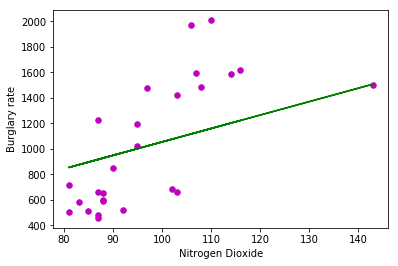

Los Angeles Mean Annual Nitrogen Dioxide vs Larceny-theft rate
Estimated coefficients:
b_0 = 2.1747873402659934
b_1 = 35.4555673418934


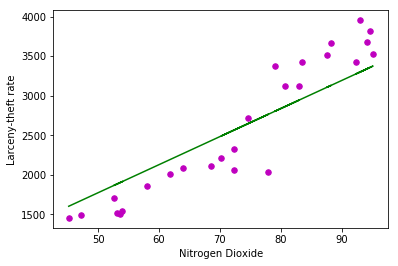

Los Angeles Annual Variance Nitrogen Dioxide vs Larceny-theft rate
Estimated coefficients:
b_0 = 1.408629053142704
b_1 = 26.65361698161644


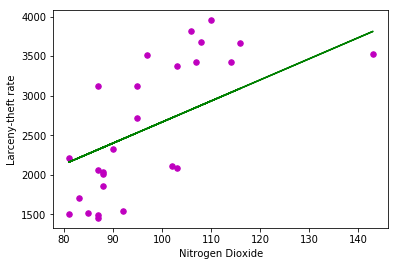

Los Angeles Mean Annual Nitrogen Dioxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 1.7487309129371624
b_1 = 15.82300407273233


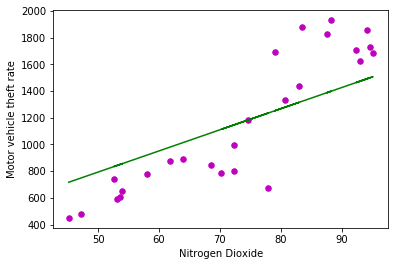

Los Angeles Annual Variance Nitrogen Dioxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 1.1363847415393593
b_1 = 11.89768291586206


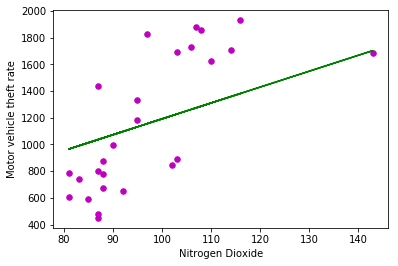

Los Angeles Mean Annual Ozone vs Violent Crime rate
Estimated coefficients:
b_0 = 0.3905984681825885
b_1 = 16.20774035528015


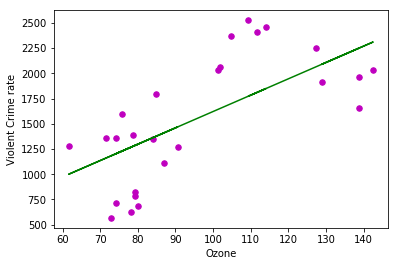

Los Angeles Annual Variance Ozone vs Violent Crime rate
Estimated coefficients:
b_0 = 1.7074967577739244
b_1 = 6.531181007657098


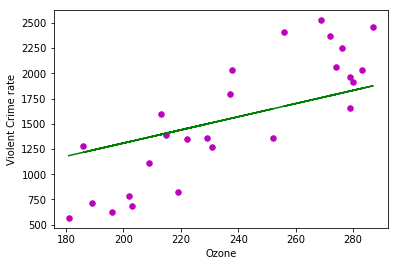

Los Angeles Mean Annual Ozone vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 0.010189818583768329
b_1 = 0.1937731343620052


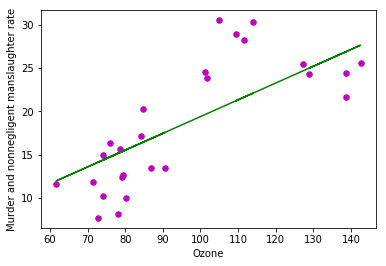

Los Angeles Annual Variance Ozone vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 0.0208350384619429
b_1 = 0.07810559964383837


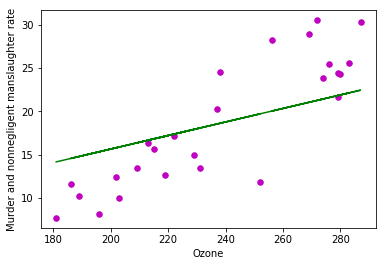

Los Angeles Mean Annual Ozone vs Legacy rape rate
Estimated coefficients:
b_0 = 0.025120668662054868
b_1 = 0.4475472448695779


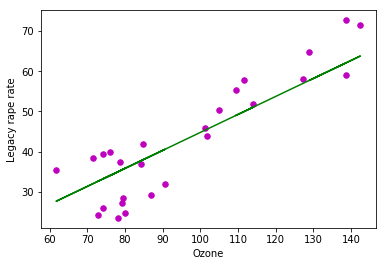

Los Angeles Annual Variance Ozone vs Legacy rape rate
Estimated coefficients:
b_0 = 0.03813344428971277
b_1 = 0.18044496202824464


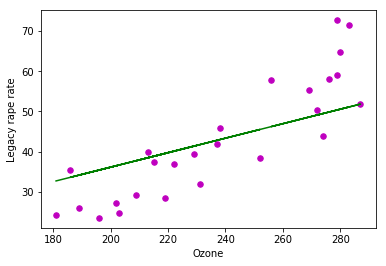

Los Angeles Mean Annual Ozone vs Robbery rate
Estimated coefficients:
b_0 = 0.572776581015205
b_1 = 6.648945400148867


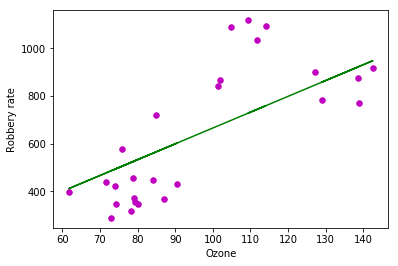

Los Angeles Annual Variance Ozone vs Robbery rate
Estimated coefficients:
b_0 = 0.8620227050545282
b_1 = 2.6803605973237143


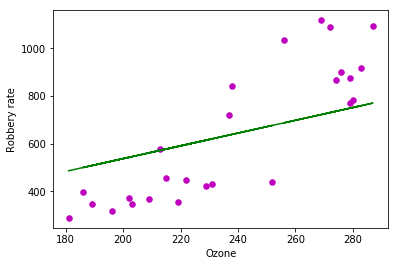

Los Angeles Mean Annual Ozone vs Aggravated assault rate
Estimated coefficients:
b_0 = -0.2173130758269508
b_1 = 8.917553025386063


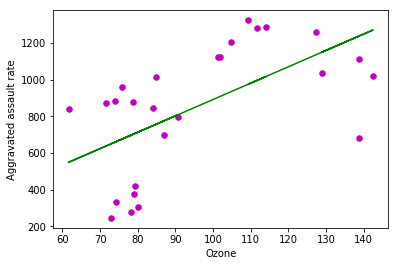

Los Angeles Annual Variance Ozone vs Aggravated assault rate
Estimated coefficients:
b_0 = 0.7866287304798334
b_1 = 3.592301708435734


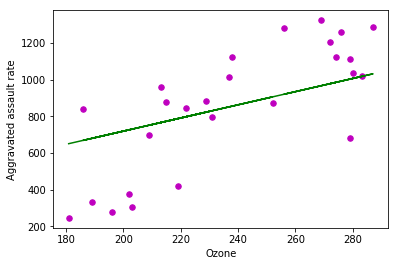

Los Angeles Mean Annual Ozone vs Property crime rate
Estimated coefficients:
b_0 = 4.743676173056883
b_1 = 49.69466856238926


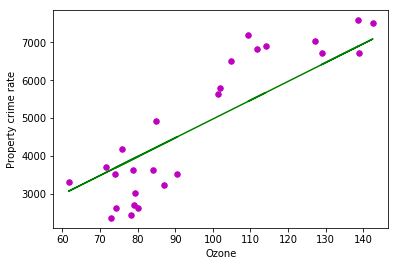

Los Angeles Annual Variance Ozone vs Property crime rate
Estimated coefficients:
b_0 = 5.811269257176718
b_1 = 20.037802654899366


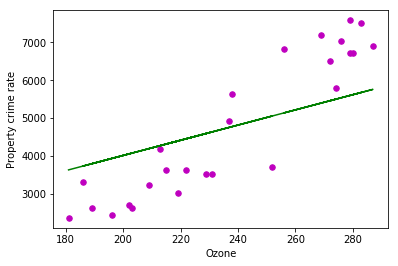

Los Angeles Mean Annual Ozone vs Burglary rate
Estimated coefficients:
b_0 = 2.0246604759108777
b_1 = 10.653400049800402


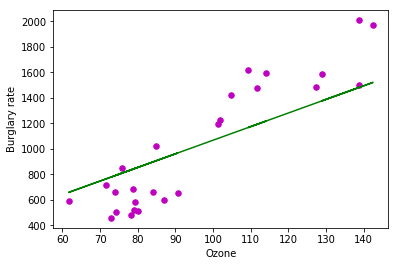

Los Angeles Annual Variance Ozone vs Burglary rate
Estimated coefficients:
b_0 = 1.7338180639990242
b_1 = 4.297834018186179


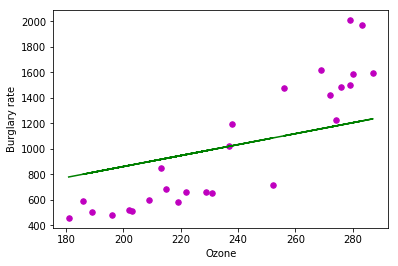

Los Angeles Mean Annual Ozone vs Larceny-theft rate
Estimated coefficients:
b_0 = 1.2203454850841808
b_1 = 26.99539803205816


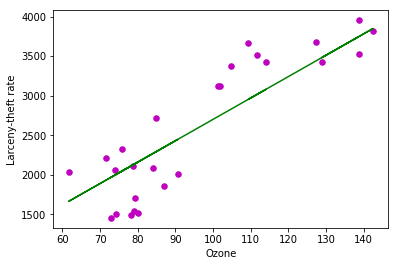

Los Angeles Annual Variance Ozone vs Larceny-theft rate
Estimated coefficients:
b_0 = 2.381879092127292
b_1 = 10.882592058216721


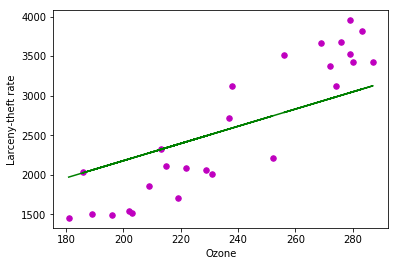

Los Angeles Mean Annual Ozone vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 1.498669295707714
b_1 = 12.045589505338967


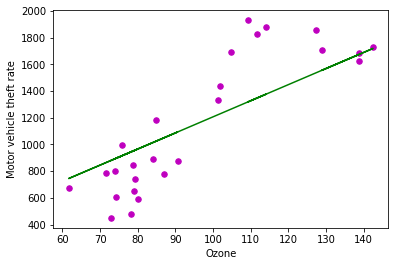

Los Angeles Annual Variance Ozone vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 1.6955542023154067
b_1 = 4.857263330215283


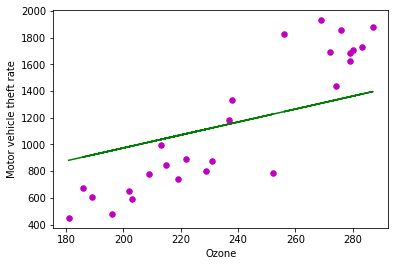

Los Angeles Mean Annual Sulfur Dioxide vs Violent Crime rate
Estimated coefficients:
b_0 = -2.6000907948123313
b_1 = 77.94570532061577


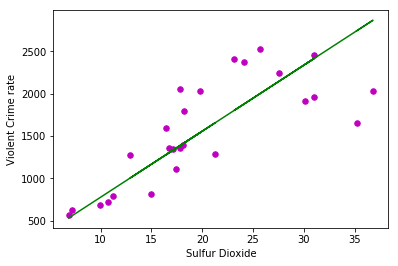

Los Angeles Annual Variance Sulfur Dioxide vs Violent Crime rate
Estimated coefficients:
b_0 = -3.619909630442635
b_1 = 16.310079633517937


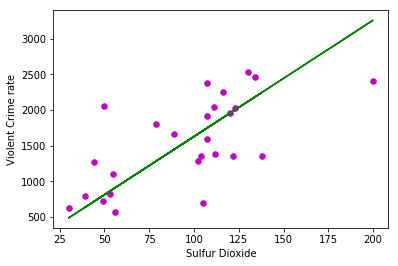

Los Angeles Mean Annual Sulfur Dioxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.029083455038644956
b_1 = 0.9320632914116624


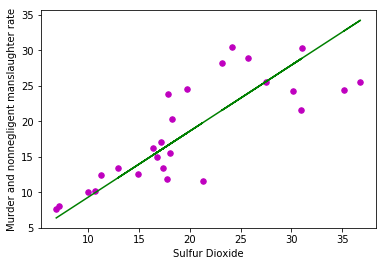

Los Angeles Annual Variance Sulfur Dioxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.05187597701077351
b_1 = 0.19514455092759073


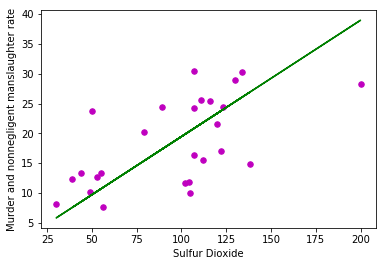

Los Angeles Mean Annual Sulfur Dioxide vs Legacy rape rate
Estimated coefficients:
b_0 = -0.05964408340274474
b_1 = 2.1524380802017085


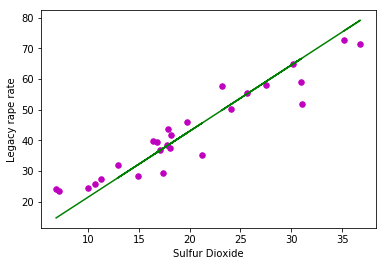

Los Angeles Annual Variance Sulfur Dioxide vs Legacy rape rate
Estimated coefficients:
b_0 = -0.14583289172809089
b_1 = 0.45100389008256647


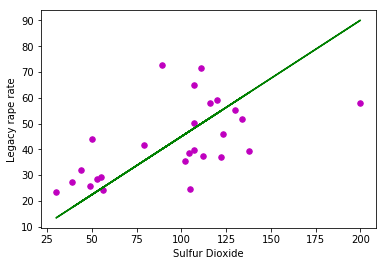

Los Angeles Mean Annual Sulfur Dioxide vs Robbery rate
Estimated coefficients:
b_0 = -0.6914544191233745
b_1 = 31.977749813596215


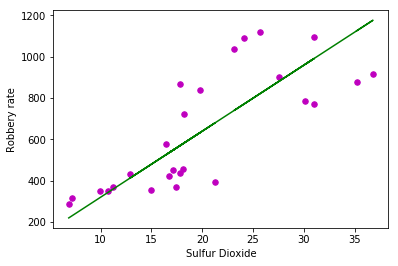

Los Angeles Annual Variance Sulfur Dioxide vs Robbery rate
Estimated coefficients:
b_0 = -1.5845517529373865
b_1 = 6.6962926452765394


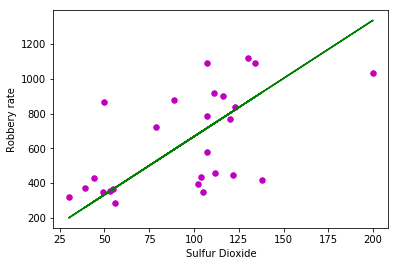

Los Angeles Mean Annual Sulfur Dioxide vs Aggravated assault rate
Estimated coefficients:
b_0 = -1.8195727315745671
b_1 = 42.88382264252534


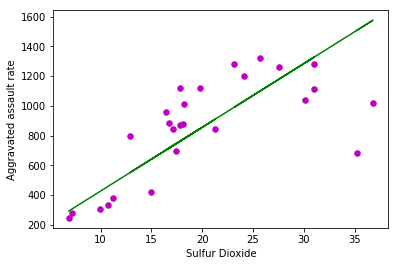

Los Angeles Annual Variance Sulfur Dioxide vs Aggravated assault rate
Estimated coefficients:
b_0 = -1.8373863619193571
b_1 = 8.967716376071678


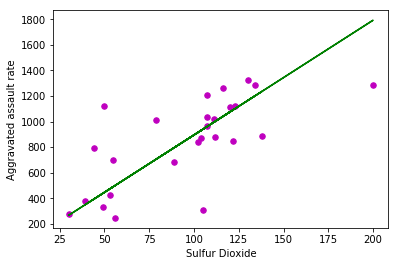

Los Angeles Mean Annual Sulfur Dioxide vs Property crime rate
Estimated coefficients:
b_0 = -4.4826004835795175
b_1 = 238.9927147691849


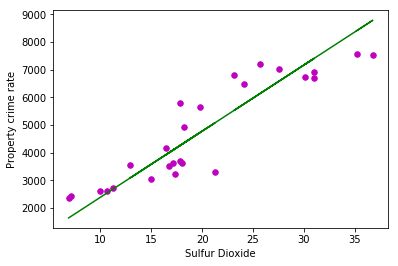

Los Angeles Annual Variance Sulfur Dioxide vs Property crime rate
Estimated coefficients:
b_0 = -14.597344124154006
b_1 = 50.08224453957614


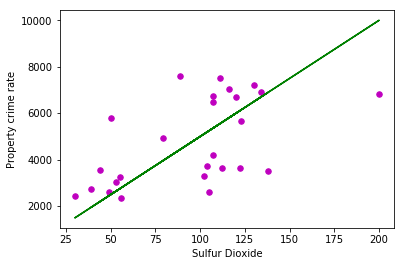

Los Angeles Mean Annual Sulfur Dioxide vs Burglary rate
Estimated coefficients:
b_0 = 0.6454754649495271
b_1 = 51.20457787827148


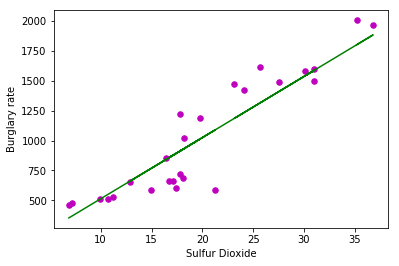

Los Angeles Annual Variance Sulfur Dioxide vs Burglary rate
Estimated coefficients:
b_0 = -2.7001889904900054
b_1 = 10.742548313357267


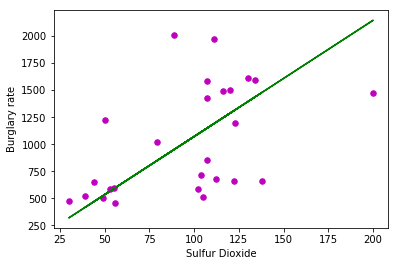

Los Angeles Mean Annual Sulfur Dioxide vs Larceny-theft rate
Estimated coefficients:
b_0 = -4.5173885596527725
b_1 = 129.86323191616967


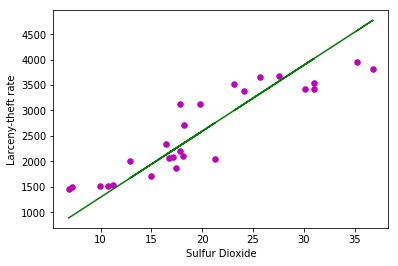

Los Angeles Annual Variance Sulfur Dioxide vs Larceny-theft rate
Estimated coefficients:
b_0 = -9.084997190371723
b_1 = 27.203831557997443


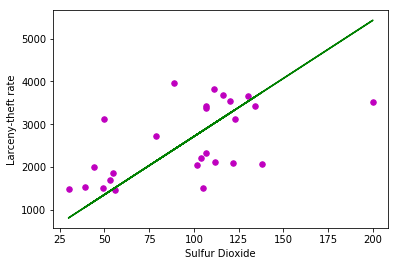

Los Angeles Mean Annual Sulfur Dioxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -0.6106678572857618
b_1 = 57.92355529143976


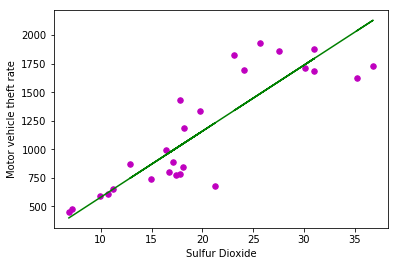

Los Angeles Annual Variance Sulfur Dioxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -2.8118313601969476
b_1 = 12.135579216504883


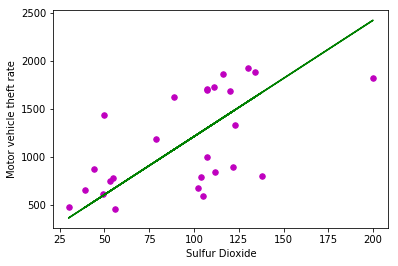

Los Angeles Mean Annual PM10 vs Violent Crime rate
Estimated coefficients:
b_0 = -30.168720671728124
b_1 = 71.60942288879906


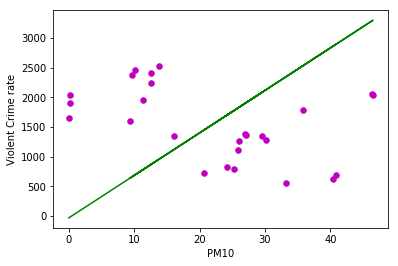

Los Angeles Annual Variance PM10 vs Violent Crime rate
Estimated coefficients:
b_0 = 533325409.22538716
b_1 = 6.457064125478474


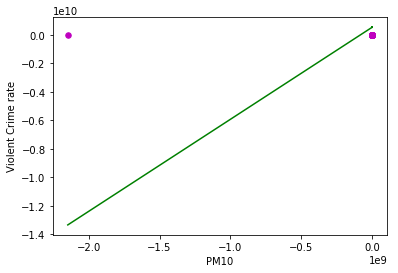

Los Angeles Mean Annual PM10 vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.3672101242474426
b_1 = 0.856677757135136


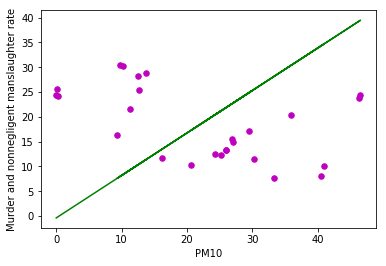

Los Angeles Annual Variance PM10 vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 6315161.211563007
b_1 = 0.07645876047989336


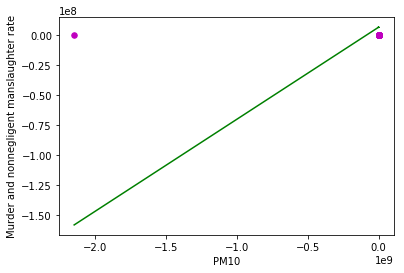

Los Angeles Mean Annual PM10 vs Legacy rape rate
Estimated coefficients:
b_0 = -0.8990542442126923
b_1 = 1.980996701456603


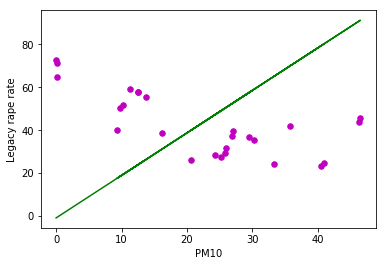

Los Angeles Annual Variance PM10 vs Legacy rape rate
Estimated coefficients:
b_0 = 14361277.266338604
b_1 = 0.1738744857480102


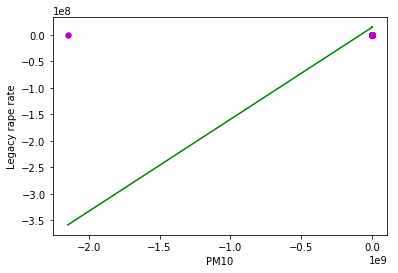

Los Angeles Mean Annual PM10 vs Robbery rate
Estimated coefficients:
b_0 = -12.925503394785096
b_1 = 29.420024241347733


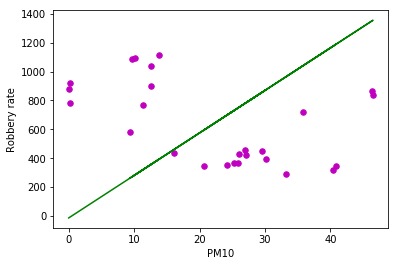

Los Angeles Annual Variance PM10 vs Robbery rate
Estimated coefficients:
b_0 = 216227485.76645565
b_1 = 2.617903940677489


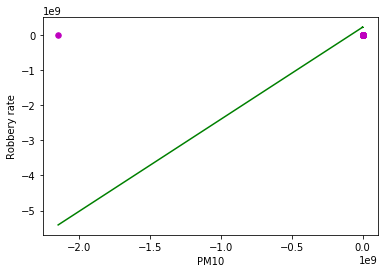

Los Angeles Mean Annual PM10 vs Aggravated assault rate
Estimated coefficients:
b_0 = -15.977412514357411
b_1 = 39.352092828741725


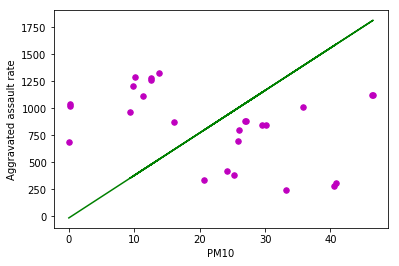

Los Angeles Annual Variance PM10 vs Aggravated assault rate
Estimated coefficients:
b_0 = 296424239.0854595
b_1 = 3.5888602830016967


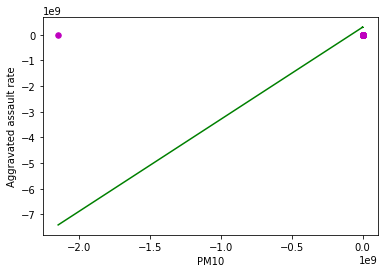

Los Angeles Mean Annual PM10 vs Property crime rate
Estimated coefficients:
b_0 = -99.37711109378961
b_1 = 220.03348844346414


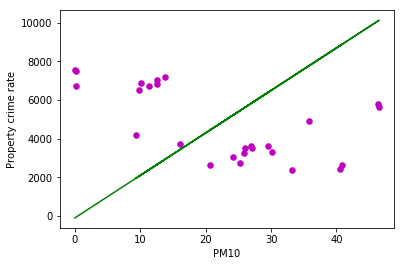

Los Angeles Annual Variance PM10 vs Property crime rate
Estimated coefficients:
b_0 = 1602109329.1035516
b_1 = 19.397016997981506


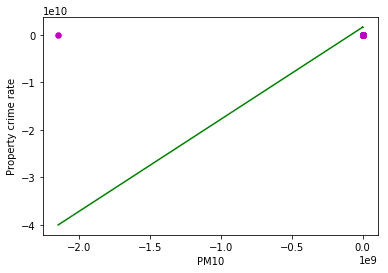

Los Angeles Mean Annual PM10 vs Burglary rate
Estimated coefficients:
b_0 = -23.343418755028097
b_1 = 47.307933707168296


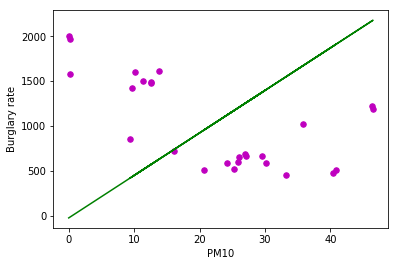

Los Angeles Annual Variance PM10 vs Burglary rate
Estimated coefficients:
b_0 = 338555172.15300864
b_1 = 4.098946312450414


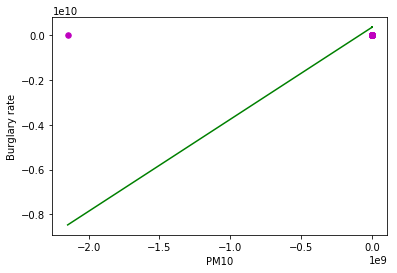

Los Angeles Mean Annual PM10 vs Larceny-theft rate
Estimated coefficients:
b_0 = -51.29887206262811
b_1 = 119.34496726758859


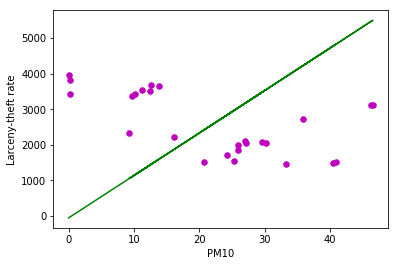

Los Angeles Annual Variance PM10 vs Larceny-theft rate
Estimated coefficients:
b_0 = 872094028.503827
b_1 = 10.558594545900421


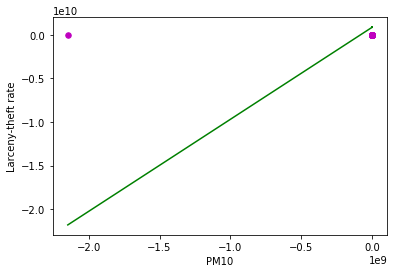

Los Angeles Mean Annual PM10 vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -24.73414940055727
b_1 = 53.379339635138635


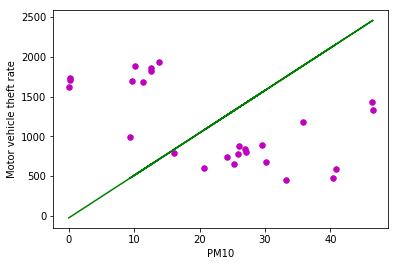

Los Angeles Annual Variance PM10 vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 391451866.13263386
b_1 = 4.739376106381789


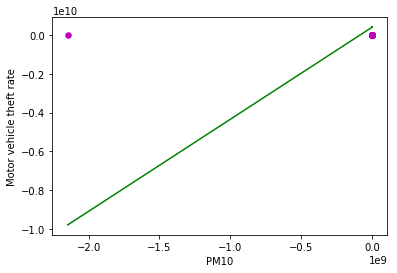

Los Angeles Mean Annual PM2.5 vs Violent Crime rate
Estimated coefficients:
b_0 = -101.39516843519164
b_1 = 51.152710942324894


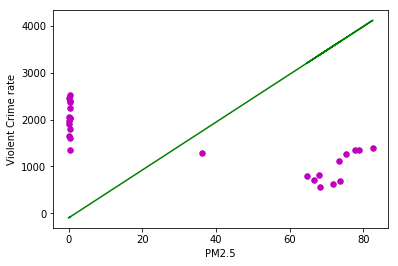

Los Angeles Annual Variance PM2.5 vs Violent Crime rate
Estimated coefficients:
b_0 = 904150584.814413
b_1 = 10.94671627197533


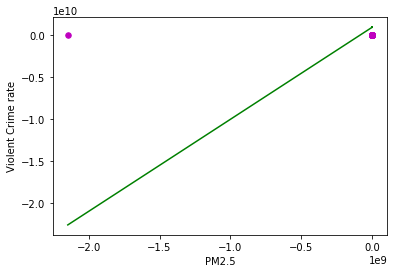

Los Angeles Mean Annual PM2.5 vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -1.1950596973493326
b_1 = 0.611200525504714


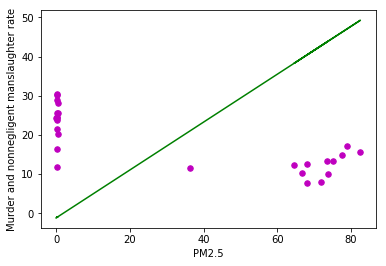

Los Angeles Annual Variance PM2.5 vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 10706140.334430898
b_1 = 0.12962119426797947


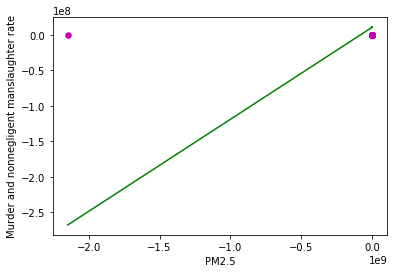

Los Angeles Mean Annual PM2.5 vs Legacy rape rate
Estimated coefficients:
b_0 = -2.6866036570515845
b_1 = 1.409431617041979


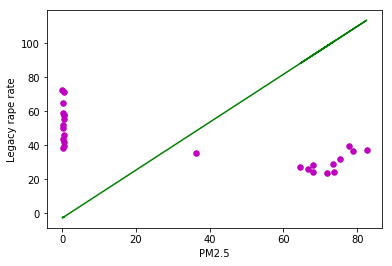

Los Angeles Annual Variance PM2.5 vs Legacy rape rate
Estimated coefficients:
b_0 = 24346781.35156718
b_1 = 0.2947709156597347


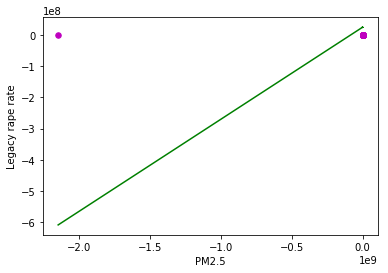

Los Angeles Mean Annual PM2.5 vs Robbery rate
Estimated coefficients:
b_0 = -42.89439772308742
b_1 = 21.037416886187767


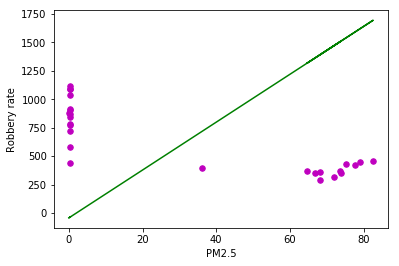

Los Angeles Annual Variance PM2.5 vs Robbery rate
Estimated coefficients:
b_0 = 366572081.8827343
b_1 = 4.438155053875194


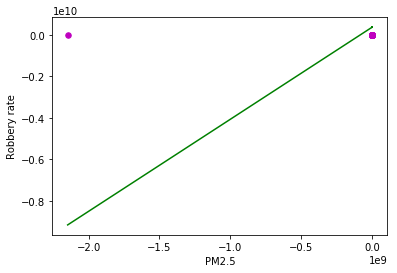

Los Angeles Mean Annual PM2.5 vs Aggravated assault rate
Estimated coefficients:
b_0 = -54.620904230836345
b_1 = 28.094955247464583


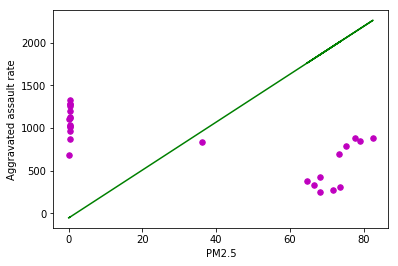

Los Angeles Annual Variance PM2.5 vs Aggravated assault rate
Estimated coefficients:
b_0 = 502530250.2986647
b_1 = 6.084225637253682


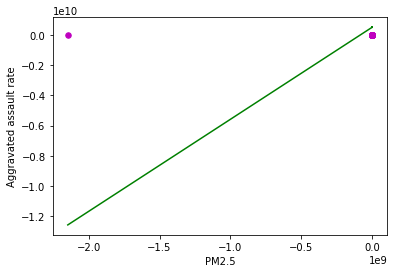

Los Angeles Mean Annual PM2.5 vs Property crime rate
Estimated coefficients:
b_0 = -311.30994591632134
b_1 = 156.9623395312834


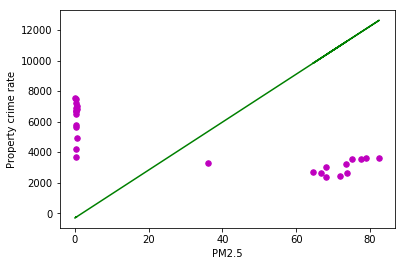

Los Angeles Annual Variance PM2.5 vs Property crime rate
Estimated coefficients:
b_0 = 2716067987.657231
b_1 = 32.88393000096274


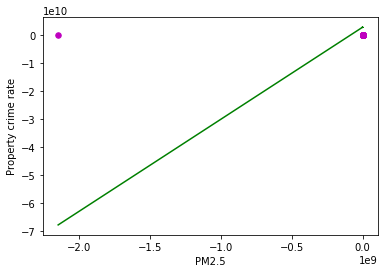

Los Angeles Mean Annual PM2.5 vs Burglary rate
Estimated coefficients:
b_0 = -70.1139116164818
b_1 = 33.78465198647673


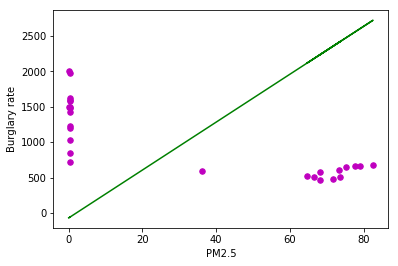

Los Angeles Annual Variance PM2.5 vs Burglary rate
Estimated coefficients:
b_0 = 573955121.3093588
b_1 = 6.948979041043779


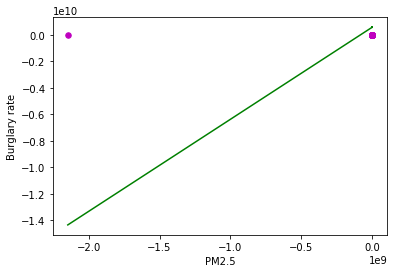

Los Angeles Mean Annual PM2.5 vs Larceny-theft rate
Estimated coefficients:
b_0 = -164.10392574477282
b_1 = 85.0691760000713


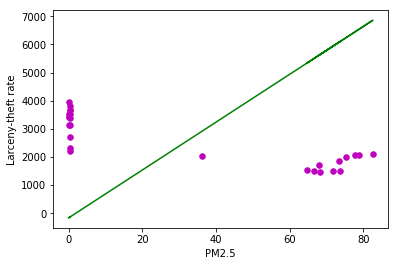

Los Angeles Annual Variance PM2.5 vs Larceny-theft rate
Estimated coefficients:
b_0 = 1478467567.244525
b_1 = 17.900076297946597


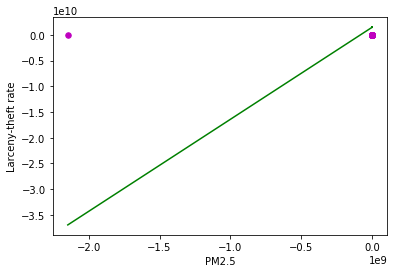

Los Angeles Mean Annual PM2.5 vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -77.09068730572108
b_1 = 38.10763535202834


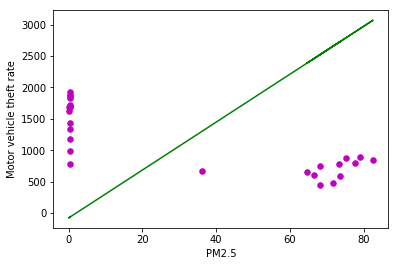

Los Angeles Annual Variance PM2.5 vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 663631291.940485
b_1 = 8.03470507472781


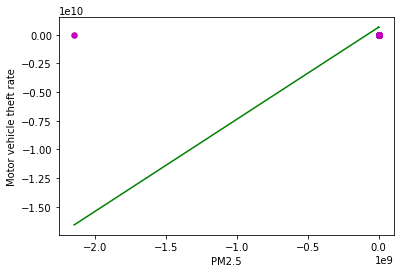

In [77]:
print('Los Angeles')
for j, y in enumerate(pollution[1]):
    data = pollution_data(y, pollution_index[j])
    mean = np.array(data[0])
    variance = np.array(data[3])
    for k, z in enumerate(rates[1]):
        print('Los Angeles Mean Annual', pollution_index[j], 'vs', crime_index[k])
        arrays_to_reg(mean, z, pollution_index[j], crime_index[k])
        print('Los Angeles Annual Variance', pollution_index[j], 'vs', crime_index[k])
        arrays_to_reg(variance, z, pollution_index[j], crime_index[k])

New York
New York Mean Annual Carbon Monoxide vs Violent Crime rate
Estimated coefficients:
b_0 = -6.698838577257675
b_1 = 32.5518711668753


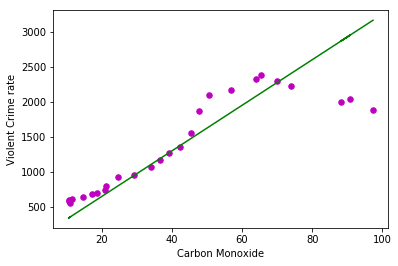

New York Annual Variance Carbon Monoxide vs Violent Crime rate
Estimated coefficients:
b_0 = -10.976225663417381
b_1 = 17.44052903043954


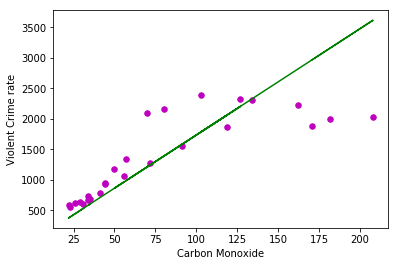

New York Mean Annual Carbon Monoxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.05329904084571169
b_1 = 0.3543941302270695


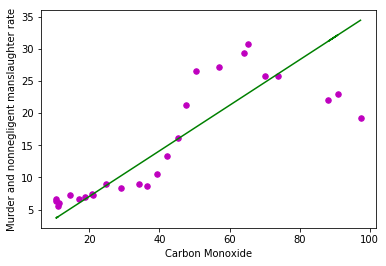

New York Annual Variance Carbon Monoxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.09951635985109064
b_1 = 0.18987160164113856


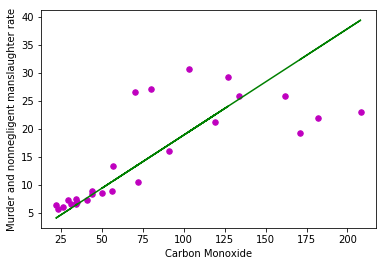

New York Mean Annual Carbon Monoxide vs Legacy rape rate
Estimated coefficients:
b_0 = -0.1289229536848211
b_1 = 0.6938469883123107


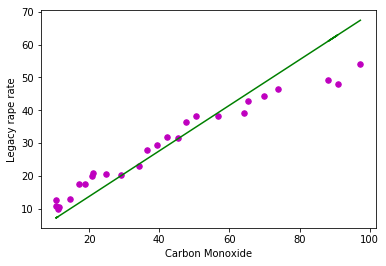

New York Annual Variance Carbon Monoxide vs Legacy rape rate
Estimated coefficients:
b_0 = -0.21465071813754477
b_1 = 0.37167771084184653


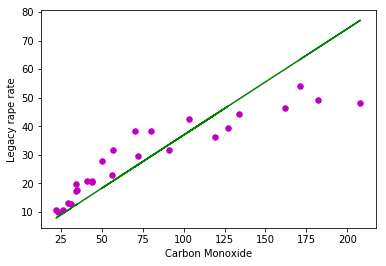

New York Mean Annual Carbon Monoxide vs Robbery rate
Estimated coefficients:
b_0 = -1.9070129568295897
b_1 = 16.814502101889563


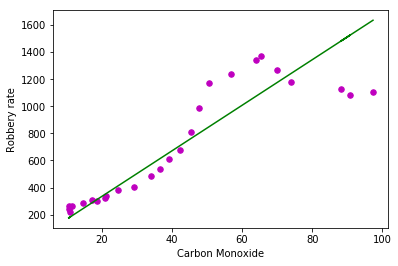

New York Annual Variance Carbon Monoxide vs Robbery rate
Estimated coefficients:
b_0 = -4.151748255824941
b_1 = 9.009264281003153


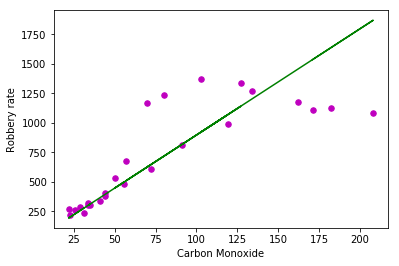

New York Mean Annual Carbon Monoxide vs Aggravated assault rate
Estimated coefficients:
b_0 = -4.609595849069592
b_1 = 14.689402424580907


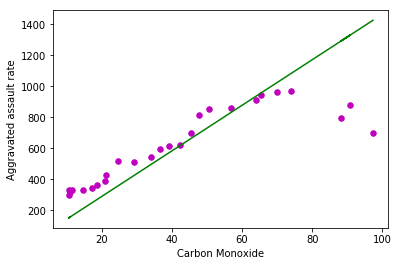

New York Annual Variance Carbon Monoxide vs Aggravated assault rate
Estimated coefficients:
b_0 = -6.510496976573791
b_1 = 7.869864509237613


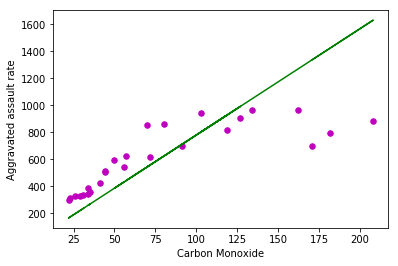

New York Mean Annual Carbon Monoxide vs Property crime rate
Estimated coefficients:
b_0 = -14.706904983305321
b_1 = 99.41022657408777


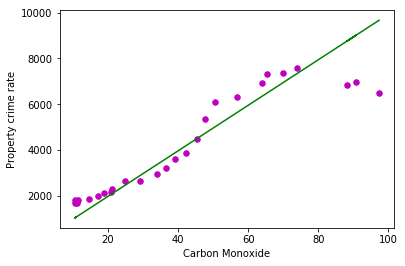

New York Annual Variance Carbon Monoxide vs Property crime rate
Estimated coefficients:
b_0 = -26.37080285758202
b_1 = 53.243883068115956


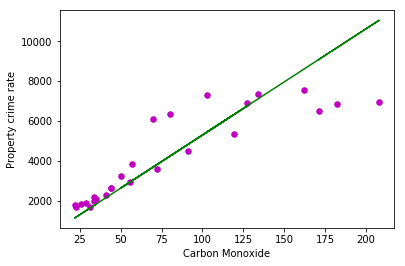

New York Mean Annual Carbon Monoxide vs Burglary rate
Estimated coefficients:
b_0 = 0.34981802784352567
b_1 = 20.90782909904373


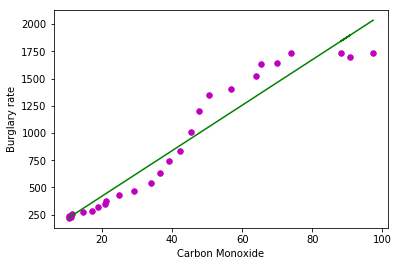

New York Annual Variance Carbon Monoxide vs Burglary rate
Estimated coefficients:
b_0 = -1.9016996254600826
b_1 = 11.195620630934945


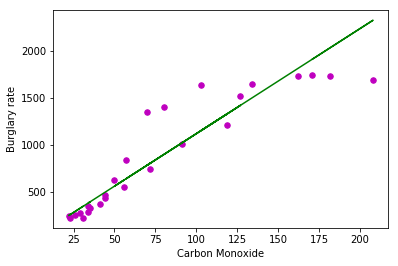

New York Mean Annual Carbon Monoxide vs Larceny-theft rate
Estimated coefficients:
b_0 = -14.730928669083369
b_1 = 58.43195628732936


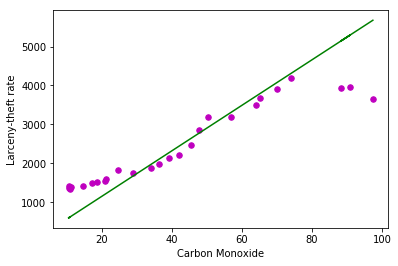

New York Annual Variance Carbon Monoxide vs Larceny-theft rate
Estimated coefficients:
b_0 = -21.341744476615986
b_1 = 31.29290237476382


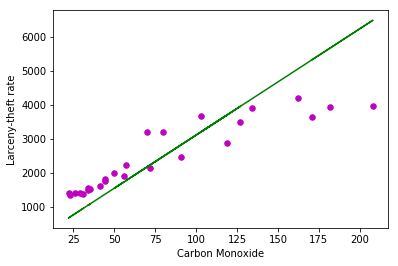

New York Mean Annual Carbon Monoxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -0.3264487034684862
b_1 = 20.070731427486177


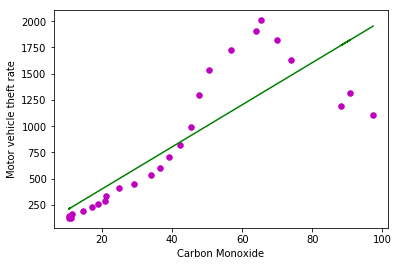

New York Annual Variance Carbon Monoxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -3.1280179157769226
b_1 = 10.755515142205475


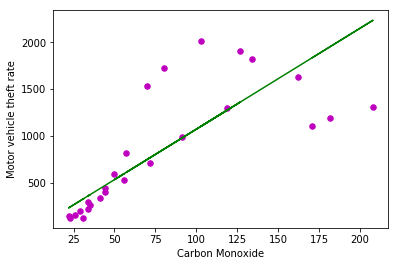

New York Mean Annual Nitrogen Dioxide vs Violent Crime rate
Estimated coefficients:
b_0 = 2.21087964705589
b_1 = 22.730023592562034


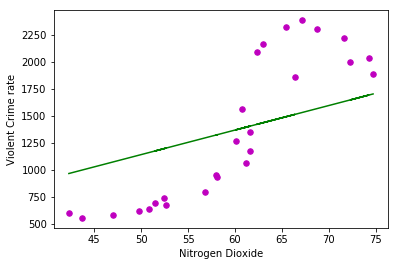

New York Annual Variance Nitrogen Dioxide vs Violent Crime rate
Estimated coefficients:
b_0 = 0.6999176930810336
b_1 = 14.72815582673049


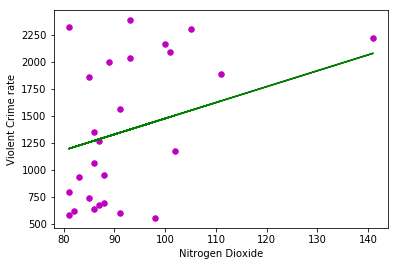

New York Mean Annual Nitrogen Dioxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 0.027290473849287622
b_1 = 0.24773766993554566


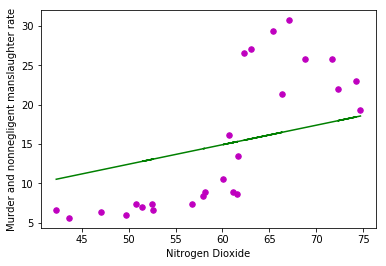

New York Annual Variance Nitrogen Dioxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 0.009734178801172888
b_1 = 0.16053598973393152


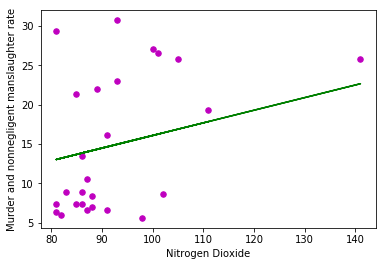

New York Mean Annual Nitrogen Dioxide vs Legacy rape rate
Estimated coefficients:
b_0 = 0.05034601521988691
b_1 = 0.4846712051527951


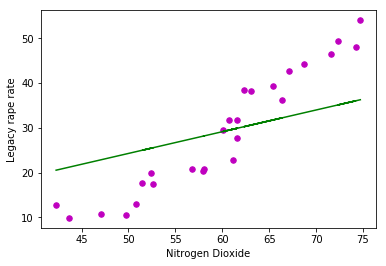

New York Annual Variance Nitrogen Dioxide vs Legacy rape rate
Estimated coefficients:
b_0 = 0.01612704207039073
b_1 = 0.31406942811585586


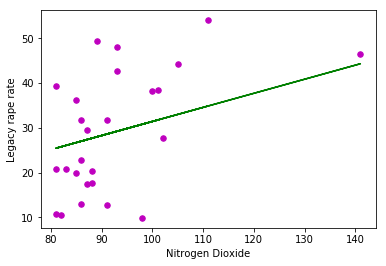

New York Mean Annual Nitrogen Dioxide vs Robbery rate
Estimated coefficients:
b_0 = 1.459362200834562
b_1 = 11.7617545475629


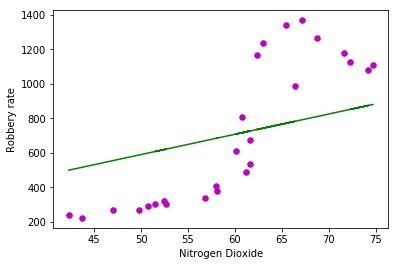

New York Annual Variance Nitrogen Dioxide vs Robbery rate
Estimated coefficients:
b_0 = 0.5068035576719012
b_1 = 7.6230000447732325


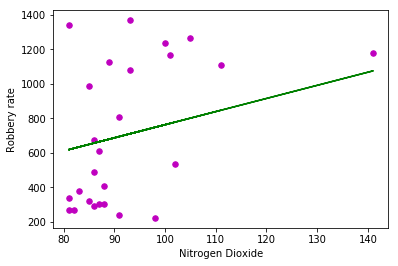

New York Mean Annual Nitrogen Dioxide vs Aggravated assault rate
Estimated coefficients:
b_0 = 0.6738920375146336
b_1 = 10.236053031657942


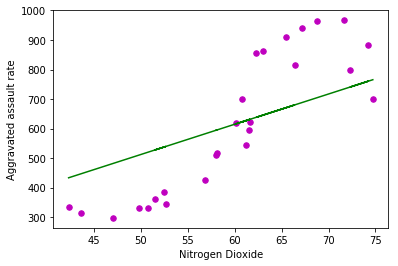

New York Annual Variance Nitrogen Dioxide vs Aggravated assault rate
Estimated coefficients:
b_0 = 0.16721773061055956
b_1 = 6.630675693046284


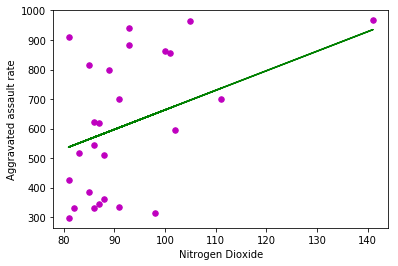

New York Mean Annual Nitrogen Dioxide vs Property crime rate
Estimated coefficients:
b_0 = 7.833175998610386
b_1 = 69.49338731561036


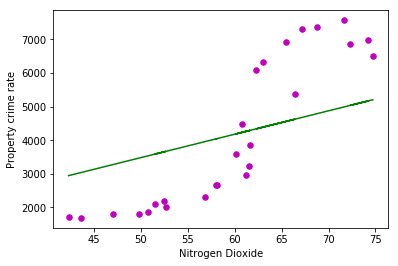

New York Annual Variance Nitrogen Dioxide vs Property crime rate
Estimated coefficients:
b_0 = 3.1552989806095866
b_1 = 45.029596928989655


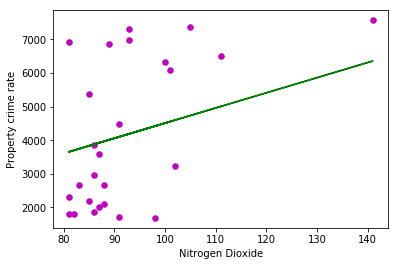

New York Mean Annual Nitrogen Dioxide vs Burglary rate
Estimated coefficients:
b_0 = 2.397856703584239
b_1 = 14.66080709546575


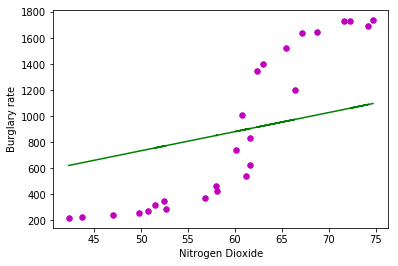

New York Annual Variance Nitrogen Dioxide vs Burglary rate
Estimated coefficients:
b_0 = 1.028878276972705
b_1 = 9.503893862889926


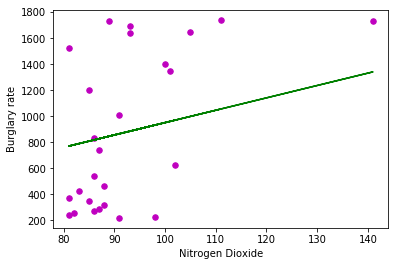

New York Mean Annual Nitrogen Dioxide vs Larceny-theft rate
Estimated coefficients:
b_0 = 3.1848503389664984
b_1 = 40.769168998716914


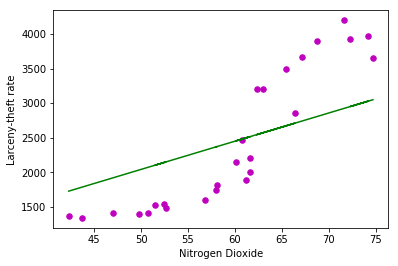

New York Annual Variance Nitrogen Dioxide vs Larceny-theft rate
Estimated coefficients:
b_0 = 1.235413767423779
b_1 = 26.408571112889206


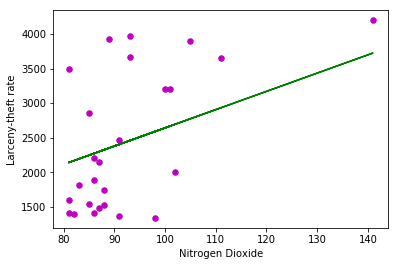

New York Mean Annual Nitrogen Dioxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 2.2503749323207103
b_1 = 14.063605841645424


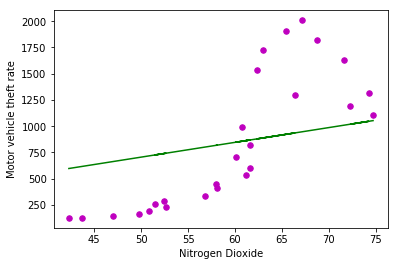

New York Annual Variance Nitrogen Dioxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 0.8909450772164291
b_1 = 9.117257571008901


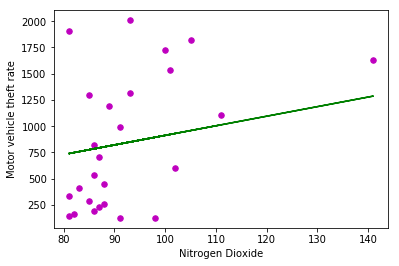

New York Mean Annual Ozone vs Violent Crime rate
Estimated coefficients:
b_0 = 1.246255599396136
b_1 = 22.278840949862868


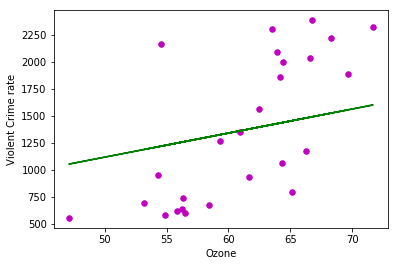

New York Annual Variance Ozone vs Violent Crime rate
Estimated coefficients:
b_0 = 1.2376692471700608
b_1 = 6.345058445444908


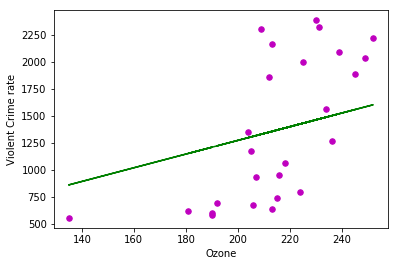

New York Mean Annual Ozone vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 0.015268834100780282
b_1 = 0.24284488067935084


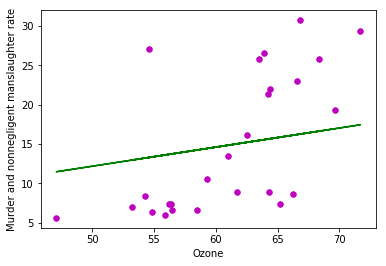

New York Annual Variance Ozone vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 0.015585483739075201
b_1 = 0.06916079293175087


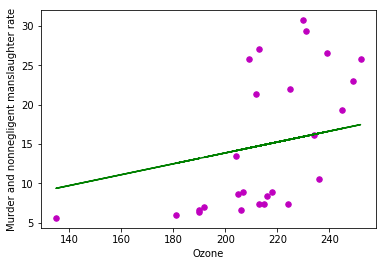

New York Mean Annual Ozone vs Legacy rape rate
Estimated coefficients:
b_0 = 0.02766275844202326
b_1 = 0.4750853116423542


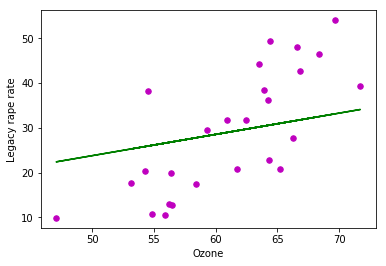

New York Annual Variance Ozone vs Legacy rape rate
Estimated coefficients:
b_0 = 0.029287444372151583
b_1 = 0.13529680962956814


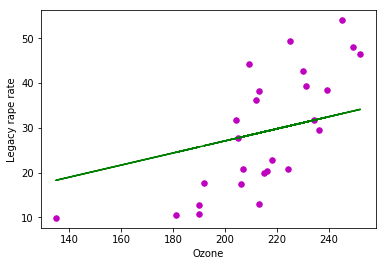

New York Mean Annual Ozone vs Robbery rate
Estimated coefficients:
b_0 = 0.8042845169478596
b_1 = 11.530843231910245


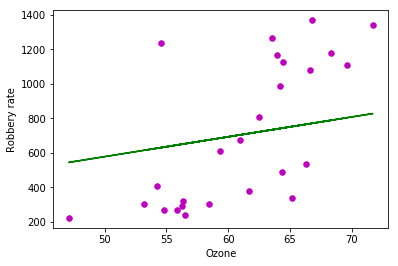

New York Annual Variance Ozone vs Robbery rate
Estimated coefficients:
b_0 = 0.8114970266254886
b_1 = 3.283952805117167


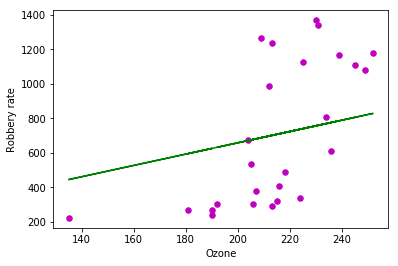

New York Mean Annual Ozone vs Aggravated assault rate
Estimated coefficients:
b_0 = 0.39901128920234896
b_1 = 10.030257068719223


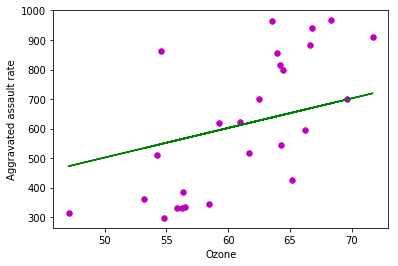

New York Annual Variance Ozone vs Aggravated assault rate
Estimated coefficients:
b_0 = 0.3813323366895247
b_1 = 2.856701733844206


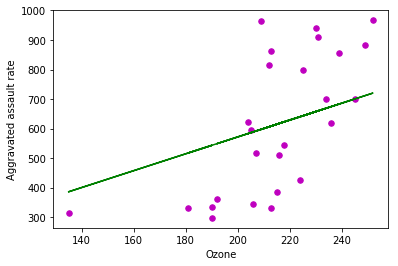

New York Mean Annual Ozone vs Property crime rate
Estimated coefficients:
b_0 = 4.253879909016177
b_1 = 68.12429471015952


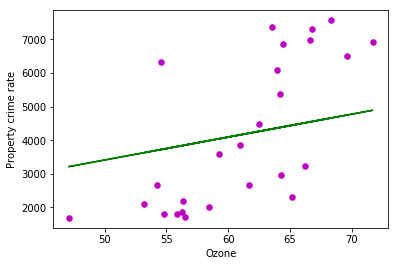

New York Annual Variance Ozone vs Property crime rate
Estimated coefficients:
b_0 = 4.302708232738951
b_1 = 19.401584919394868


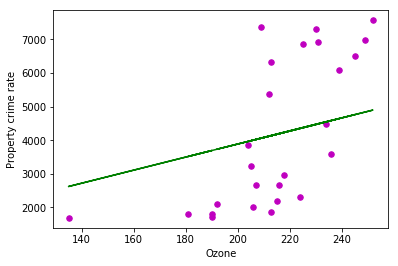

New York Mean Annual Ozone vs Burglary rate
Estimated coefficients:
b_0 = 1.2492541780603688
b_1 = 14.378421938658697


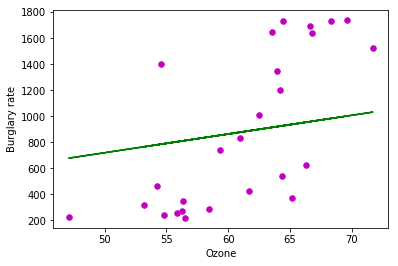

New York Annual Variance Ozone vs Burglary rate
Estimated coefficients:
b_0 = 1.3161921400957226
b_1 = 4.094665051939959


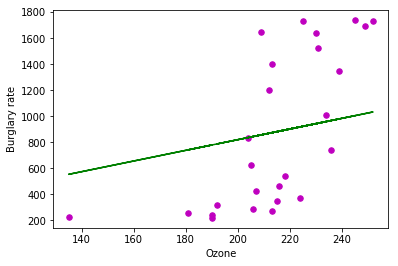

New York Mean Annual Ozone vs Larceny-theft rate
Estimated coefficients:
b_0 = 1.7637919042945214
b_1 = 39.954850427164544


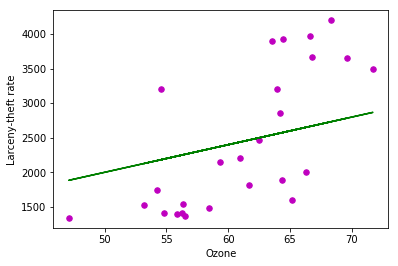

New York Annual Variance Ozone vs Larceny-theft rate
Estimated coefficients:
b_0 = 1.729278191568028
b_1 = 11.379310494887674


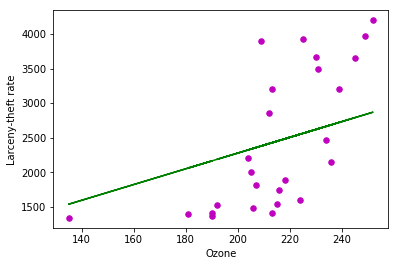

New York Mean Annual Ozone vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 1.240791965705057
b_1 = 13.791212111275371


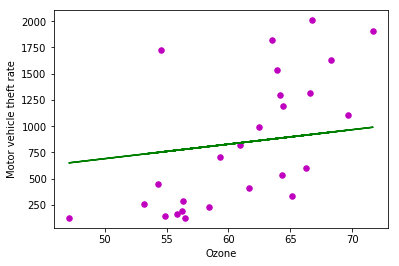

New York Annual Variance Ozone vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 1.2571768388334021
b_1 = 3.9276635078424573


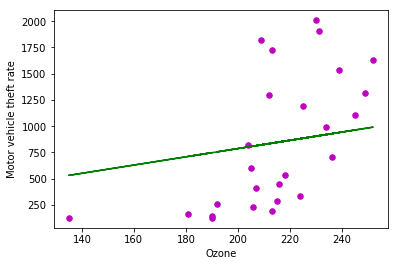

New York Mean Annual Sulfur Dioxide vs Violent Crime rate
Estimated coefficients:
b_0 = 1.8984208170668353
b_1 = 25.331410579835314


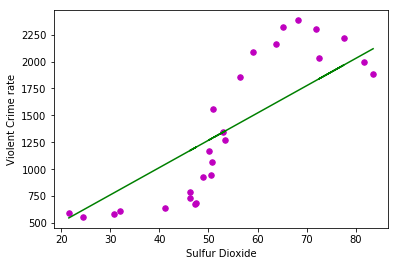

New York Annual Variance Sulfur Dioxide vs Violent Crime rate
Estimated coefficients:
b_0 = 1.2054736727989166
b_1 = 10.608990901712856


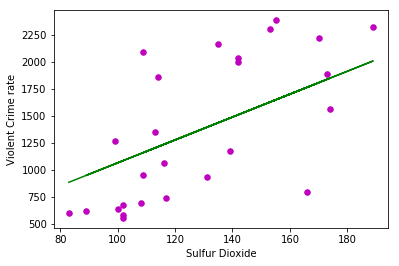

New York Mean Annual Sulfur Dioxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 0.02908346068013401
b_1 = 0.27599363949930966


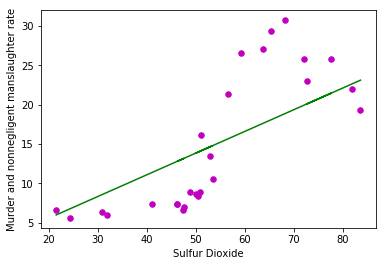

New York Annual Variance Sulfur Dioxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 0.01870316391770288
b_1 = 0.11561035946522802


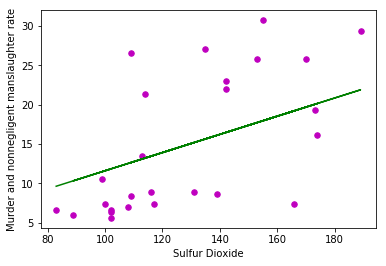

New York Mean Annual Sulfur Dioxide vs Legacy rape rate
Estimated coefficients:
b_0 = 0.04803381042399835
b_1 = 0.5400593595955817


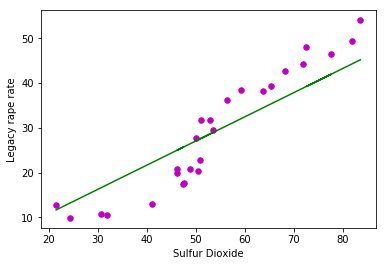

New York Annual Variance Sulfur Dioxide vs Legacy rape rate
Estimated coefficients:
b_0 = 0.024587491407984885
b_1 = 0.22624871705383925


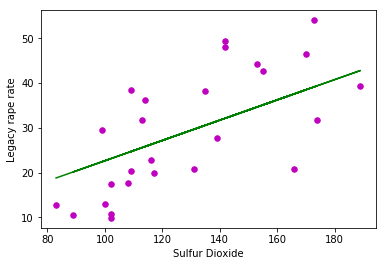

New York Mean Annual Sulfur Dioxide vs Robbery rate
Estimated coefficients:
b_0 = 1.6705718643910359
b_1 = 13.100902937827655


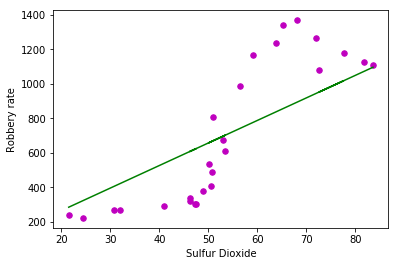

New York Annual Variance Sulfur Dioxide vs Robbery rate
Estimated coefficients:
b_0 = 1.032219446782733
b_1 = 5.488944266021503


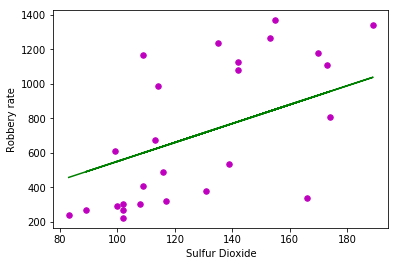

New York Mean Annual Sulfur Dioxide vs Aggravated assault rate
Estimated coefficients:
b_0 = 0.15078291464499216
b_1 = 11.41466877922398


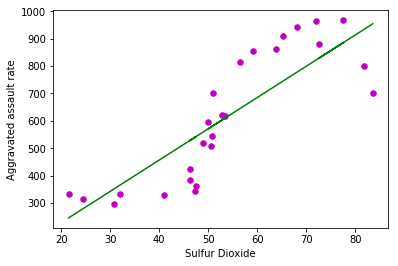

New York Annual Variance Sulfur Dioxide vs Aggravated assault rate
Estimated coefficients:
b_0 = 0.1300859469047282
b_1 = 4.778276640270251


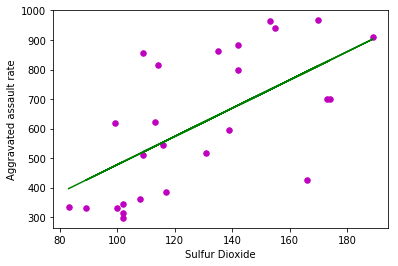

New York Mean Annual Sulfur Dioxide vs Property crime rate
Estimated coefficients:
b_0 = 8.286511664507088
b_1 = 77.420450580656


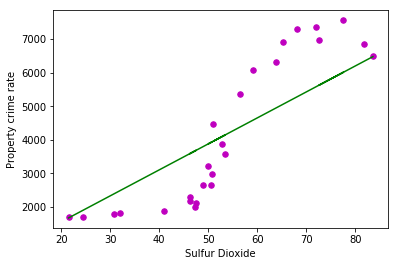

New York Annual Variance Sulfur Dioxide vs Property crime rate
Estimated coefficients:
b_0 = 4.9192845081597625
b_1 = 32.434033194114


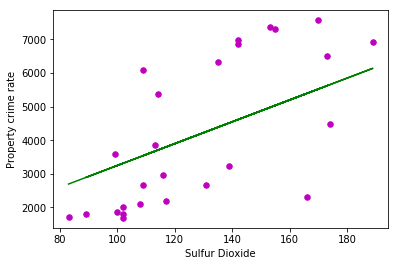

New York Mean Annual Sulfur Dioxide vs Burglary rate
Estimated coefficients:
b_0 = 3.2459515433060915
b_1 = 16.319128634167953


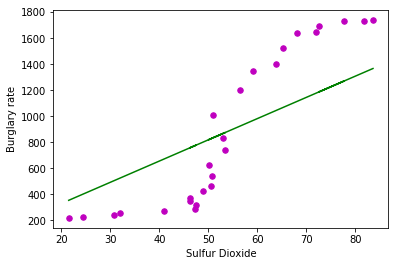

New York Annual Variance Sulfur Dioxide vs Burglary rate
Estimated coefficients:
b_0 = 1.8346371165908977
b_1 = 6.842106673159855


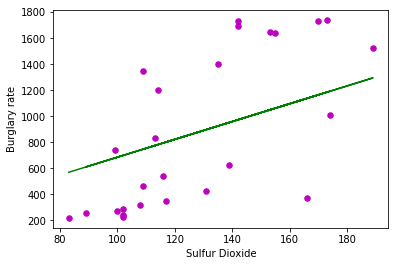

New York Mean Annual Sulfur Dioxide vs Larceny-theft rate
Estimated coefficients:
b_0 = 2.0549988145544376
b_1 = 45.44569986456096


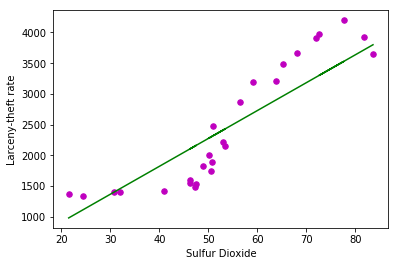

New York Annual Variance Sulfur Dioxide vs Larceny-theft rate
Estimated coefficients:
b_0 = 1.0945050912841907
b_1 = 19.030805182360925


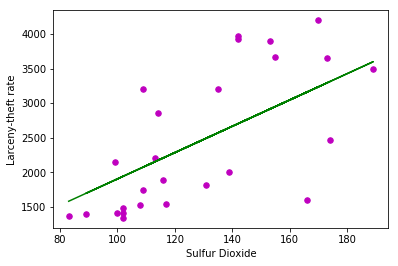

New York Mean Annual Sulfur Dioxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 2.985325109429027
b_1 = 15.65584157629854


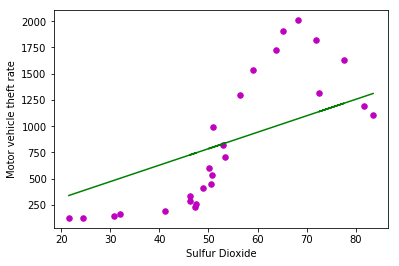

New York Annual Variance Sulfur Dioxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 1.9898532643620683
b_1 = 6.561213629989971


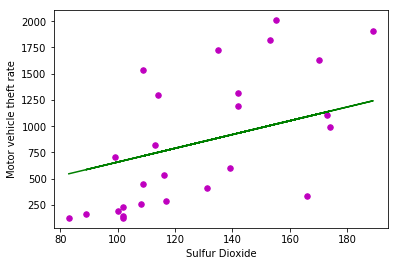

New York Mean Annual PM10 vs Violent Crime rate
Estimated coefficients:
b_0 = -18.241563230422344
b_1 = 115.62175261561924


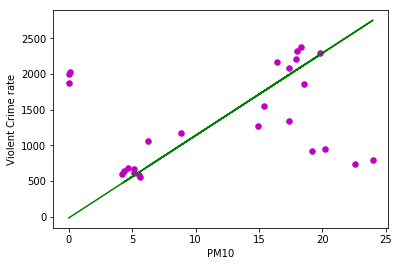

New York Annual Variance PM10 vs Violent Crime rate
Estimated coefficients:
b_0 = 839467604.0574527
b_1 = 10.163588023162642


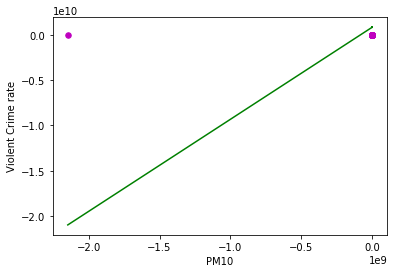

New York Mean Annual PM10 vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.18724122334877613
b_1 = 1.2594746723113748


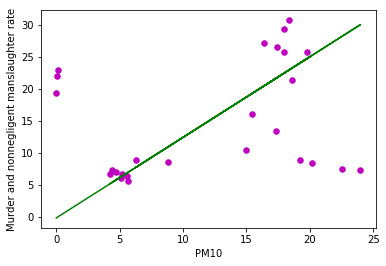

New York Annual Variance PM10 vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 9181739.540106503
b_1 = 0.11116500275854889


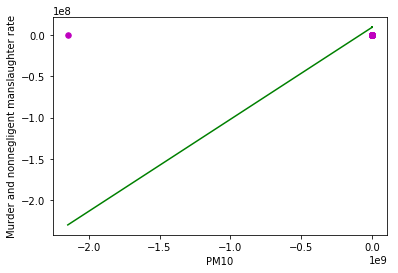

New York Mean Annual PM10 vs Legacy rape rate
Estimated coefficients:
b_0 = -0.44634843634738175
b_1 = 2.470476964527482


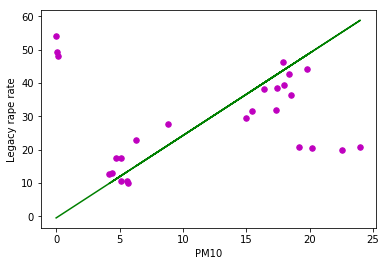

New York Annual Variance PM10 vs Legacy rape rate
Estimated coefficients:
b_0 = 17554062.957229257
b_1 = 0.21253024826307787


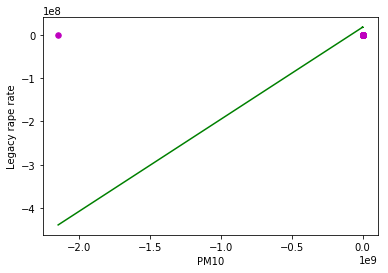

New York Mean Annual PM10 vs Robbery rate
Estimated coefficients:
b_0 = -9.363957356151104
b_1 = 59.849135555976545


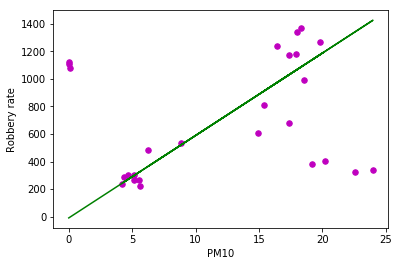

New York Annual Variance PM10 vs Robbery rate
Estimated coefficients:
b_0 = 431243556.21788573
b_1 = 5.221144647958015


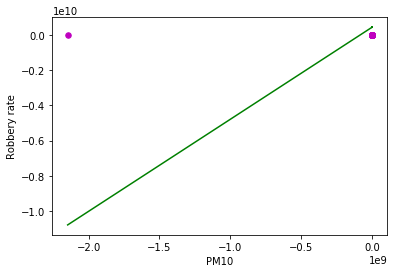

New York Mean Annual PM10 vs Aggravated assault rate
Estimated coefficients:
b_0 = -8.243635386044048
b_1 = 52.043600910110236


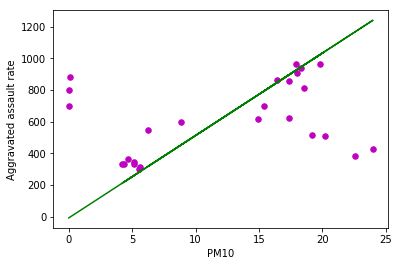

New York Annual Variance PM10 vs Aggravated assault rate
Estimated coefficients:
b_0 = 381495763.14181644
b_1 = 4.618839143567241


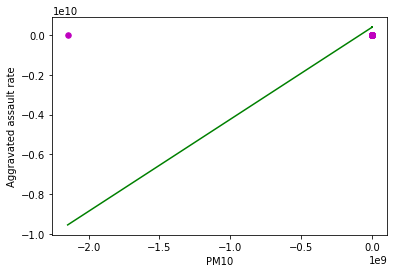

New York Mean Annual PM10 vs Property crime rate
Estimated coefficients:
b_0 = -59.598854288978146
b_1 = 353.90588779024637


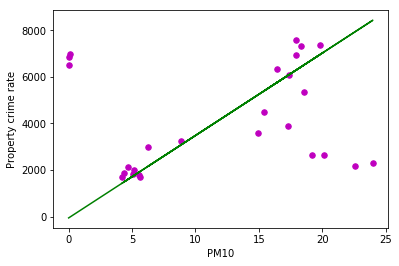

New York Annual Variance PM10 vs Property crime rate
Estimated coefficients:
b_0 = 2548712088.782983
b_1 = 30.857723669448816


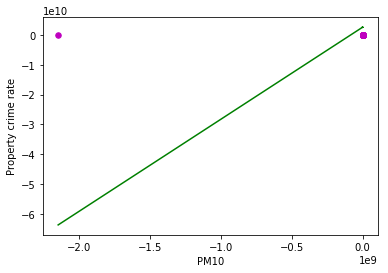

New York Mean Annual PM10 vs Burglary rate
Estimated coefficients:
b_0 = -13.070348250033021
b_1 = 74.7665972090046


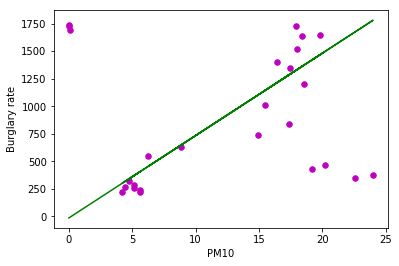

New York Annual Variance PM10 vs Burglary rate
Estimated coefficients:
b_0 = 528949902.4637997
b_1 = 6.404093084301934


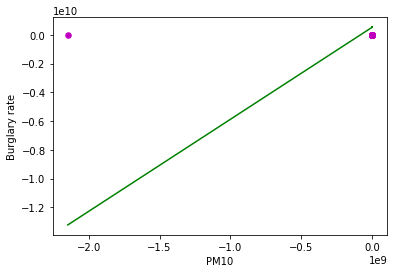

New York Mean Annual PM10 vs Larceny-theft rate
Estimated coefficients:
b_0 = -37.90827150245059
b_1 = 207.75189062937991


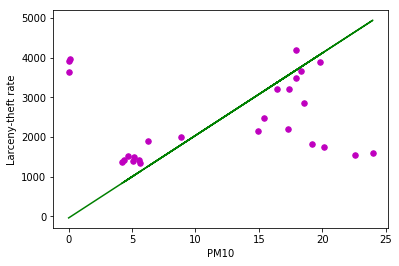

New York Annual Variance PM10 vs Larceny-theft rate
Estimated coefficients:
b_0 = 1498332600.659585
b_1 = 18.14058706717439


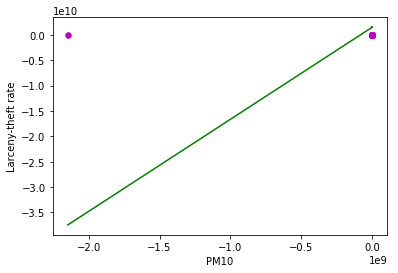

New York Mean Annual PM10 vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -8.62038858201845
b_1 = 71.38838028451208


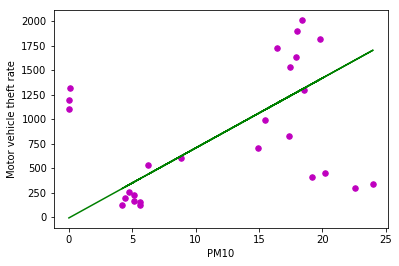

New York Annual Variance PM10 vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 521437103.45913684
b_1 = 6.313134537356165


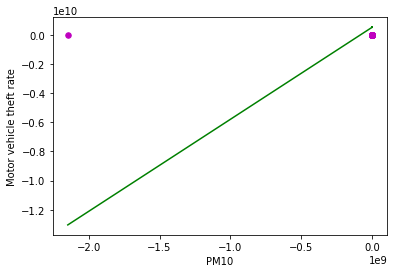

New York Mean Annual PM2.5 vs Violent Crime rate
Estimated coefficients:
b_0 = -94.94524587164915
b_1 = 52.497445918823026


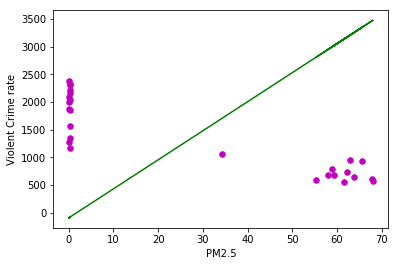

New York Annual Variance PM2.5 vs Violent Crime rate
Estimated coefficients:
b_0 = 857151524.8455275
b_1 = 10.377690673551594


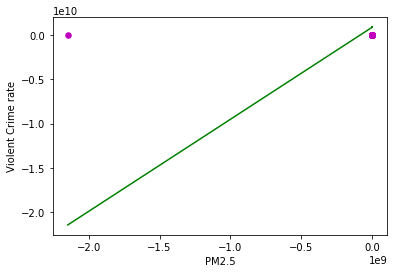

New York Mean Annual PM2.5 vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -1.0653791178791767
b_1 = 0.5733940879814611


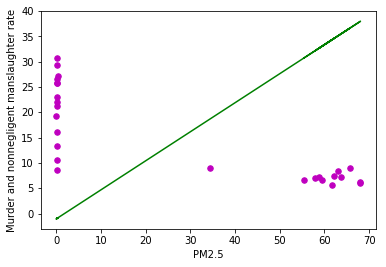

New York Annual Variance PM2.5 vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 9375158.730473608
b_1 = 0.11350676631822317


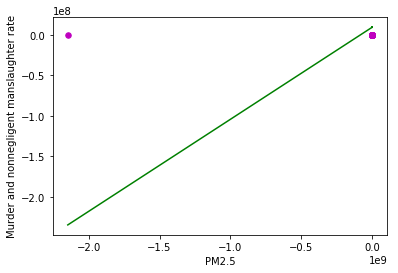

New York Mean Annual PM2.5 vs Legacy rape rate
Estimated coefficients:
b_0 = -1.9953162376455182
b_1 = 1.1184631474165545


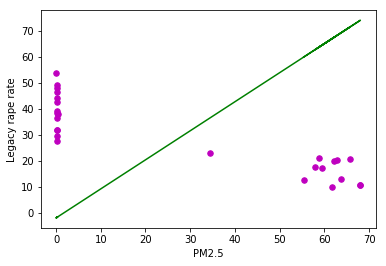

New York Annual Variance PM2.5 vs Legacy rape rate
Estimated coefficients:
b_0 = 17923850.52040951
b_1 = 0.21700733783538353


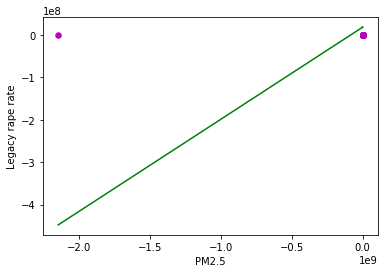

New York Mean Annual PM2.5 vs Robbery rate
Estimated coefficients:
b_0 = -51.707223566295966
b_1 = 27.269361482797713


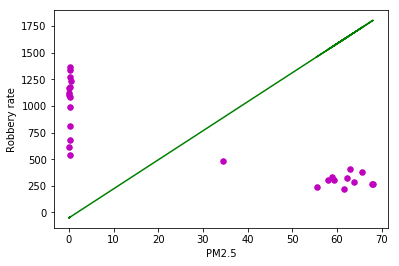

New York Annual Variance PM2.5 vs Robbery rate
Estimated coefficients:
b_0 = 440327975.8520498
b_1 = 5.3311314740826505


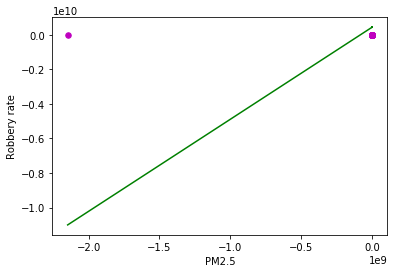

New York Mean Annual PM2.5 vs Aggravated assault rate
Estimated coefficients:
b_0 = -40.17840406805419
b_1 = 23.536682150397997


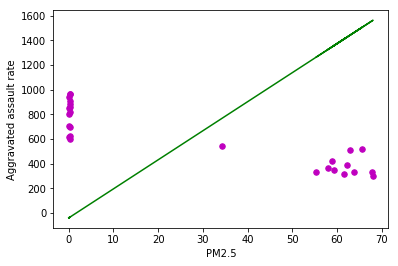

New York Annual Variance PM2.5 vs Aggravated assault rate
Estimated coefficients:
b_0 = 389532215.9092885
b_1 = 4.716138032080803


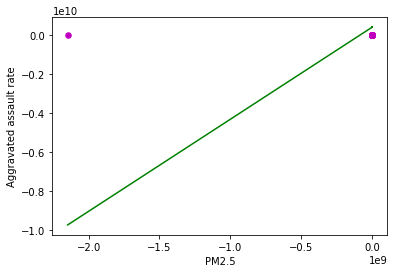

New York Mean Annual PM2.5 vs Property crime rate
Estimated coefficients:
b_0 = -293.9420729780177
b_1 = 160.67328170030248


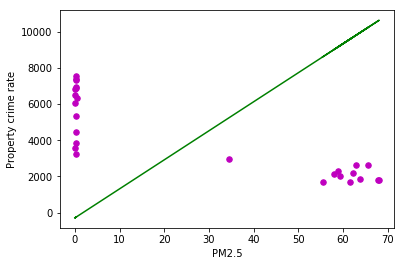

New York Annual Variance PM2.5 vs Property crime rate
Estimated coefficients:
b_0 = 2602402335.1330566
b_1 = 31.507761869763442


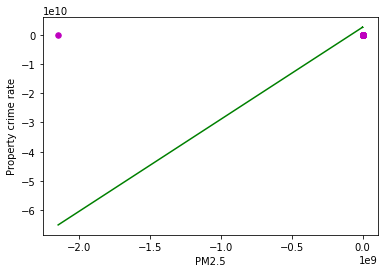

New York Mean Annual PM2.5 vs Burglary rate
Estimated coefficients:
b_0 = -67.24450527745398
b_1 = 34.11232341170204


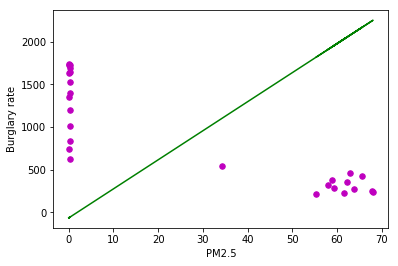

New York Annual Variance PM2.5 vs Burglary rate
Estimated coefficients:
b_0 = 540092567.6772586
b_1 = 6.538999487875448


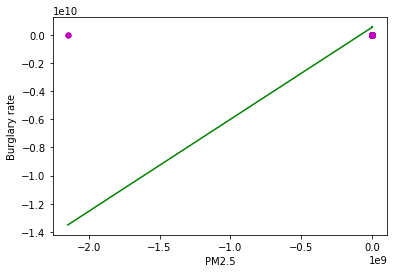

New York Mean Annual PM2.5 vs Larceny-theft rate
Estimated coefficients:
b_0 = -160.19495620771977
b_1 = 93.76836998263855


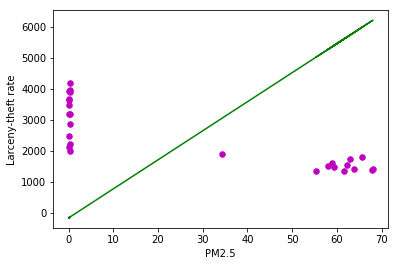

New York Annual Variance PM2.5 vs Larceny-theft rate
Estimated coefficients:
b_0 = 1529895938.448691
b_1 = 18.522730504523835


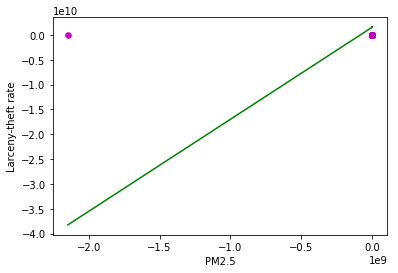

New York Mean Annual PM2.5 vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -66.50213971188634
b_1 = 32.79298739850354


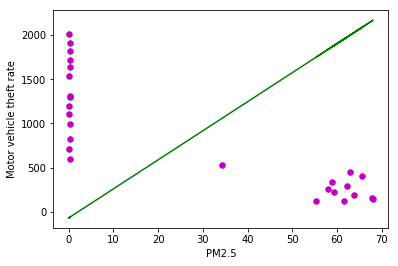

New York Annual Variance PM2.5 vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 532421505.17442447
b_1 = 6.446124814137169


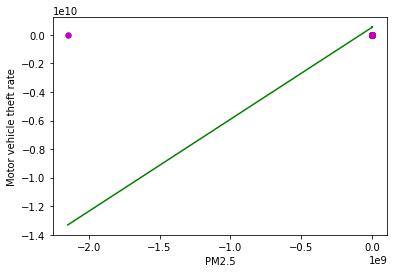

In [151]:
print('New York')
for j, y in enumerate(pollution[2]):
    data = pollution_data(y, pollution_index[j])
    mean = np.array(data[0])
    variance = np.array(data[3])
    for k, z in enumerate(rates[2]):
        print('New York Mean Annual', pollution_index[j], 'vs', crime_index[k])
        arrays_to_reg(mean, z, pollution_index[j], crime_index[k])
        print('New York Annual Variance', pollution_index[j], 'vs', crime_index[k])
        arrays_to_reg(variance, z, pollution_index[j], crime_index[k])

Chicago
Chicago Mean Annual Carbon Monoxide vs Violent Crime rate
Estimated coefficients:
b_0 = -38.37503059505252
b_1 = 552.2726551253246


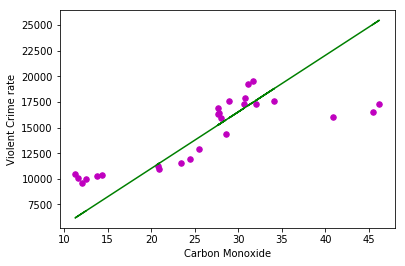

Chicago Annual Variance Carbon Monoxide vs Violent Crime rate
Estimated coefficients:
b_0 = -43.865646556574575
b_1 = 268.1798624985558


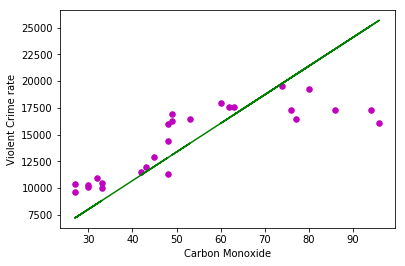

Minimum: [13, 11, 13, 13, 13, 11, 9, 8, 9, 10, 10, 9, 11, 11, 9, 7, 10, 7, 9, 10, 6, 6, 5, 5, 5, 5]
Maximum: [90, 97, 109, 89, 76, 91, 83, 68, 71, 104, 59, 62, 60, 59, 57, 52, 53, 49, 57, 42, 33, 36, 35, 38, 32, 38]
Chicago Mean Annual Carbon Monoxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.07557626635938774
b_1 = 0.8995087726178069


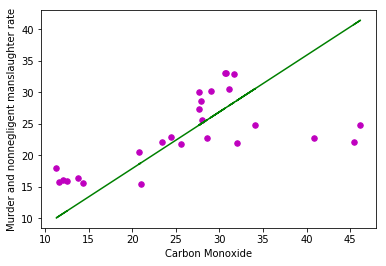

Chicago Annual Variance Carbon Monoxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.08047637704660815
b_1 = 0.43672055929054227


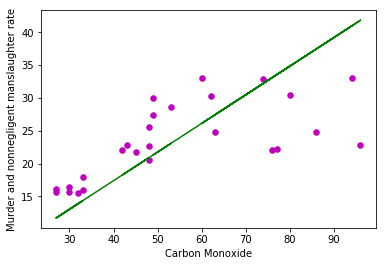

Minimum: [13, 11, 13, 13, 13, 11, 9, 8, 9, 10, 10, 9, 11, 11, 9, 7, 10, 7, 9, 10, 6, 6, 5, 5, 5, 5]
Maximum: [90, 97, 109, 89, 76, 91, 83, 68, 71, 104, 59, 62, 60, 59, 57, 52, 53, 49, 57, 42, 33, 36, 35, 38, 32, 38]
Chicago Mean Annual Carbon Monoxide vs Legacy rape rate
Estimated coefficients:
b_0 = nan
b_1 = -0.0


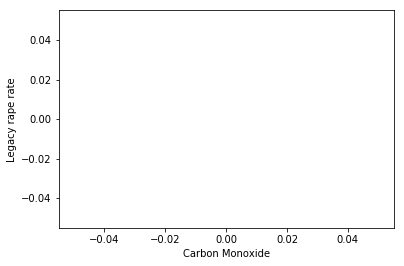

Chicago Annual Variance Carbon Monoxide vs Legacy rape rate
Estimated coefficients:
b_0 = nan
b_1 = -0.0


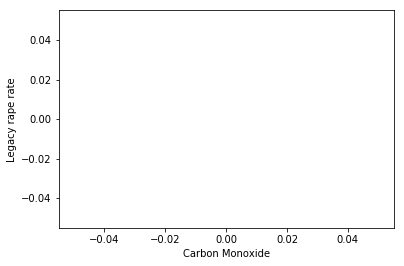

Minimum: [13, 11, 13, 13, 13, 11, 9, 8, 9, 10, 10, 9, 11, 11, 9, 7, 10, 7, 9, 10, 6, 6, 5, 5, 5, 5]
Maximum: [90, 97, 109, 89, 76, 91, 83, 68, 71, 104, 59, 62, 60, 59, 57, 52, 53, 49, 57, 42, 33, 36, 35, 38, 32, 38]
Chicago Mean Annual Carbon Monoxide vs Robbery rate
Estimated coefficients:
b_0 = -1.8025054223639927
b_1 = 33.22384918032472


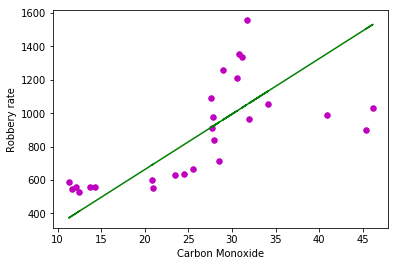

Chicago Annual Variance Carbon Monoxide vs Robbery rate
Estimated coefficients:
b_0 = -1.6700222959118491
b_1 = 16.12471215636562


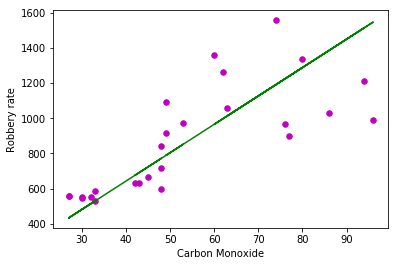

Minimum: [13, 11, 13, 13, 13, 11, 9, 8, 9, 10, 10, 9, 11, 11, 9, 7, 10, 7, 9, 10, 6, 6, 5, 5, 5, 5]
Maximum: [90, 97, 109, 89, 76, 91, 83, 68, 71, 104, 59, 62, 60, 59, 57, 52, 53, 49, 57, 42, 33, 36, 35, 38, 32, 38]
Chicago Mean Annual Carbon Monoxide vs Aggravated assault rate
Estimated coefficients:
b_0 = -2.1521692294668355
b_1 = 39.47046392956912


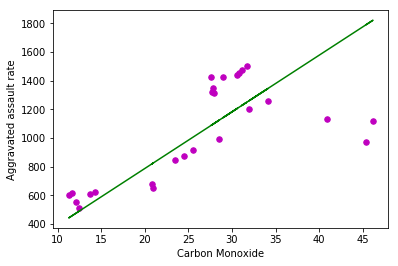

Chicago Annual Variance Carbon Monoxide vs Aggravated assault rate
Estimated coefficients:
b_0 = -2.416973516567623
b_1 = 19.16422869140979


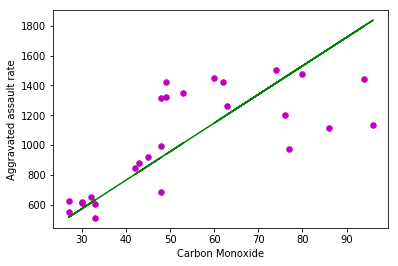

Minimum: [13, 11, 13, 13, 13, 11, 9, 8, 9, 10, 10, 9, 11, 11, 9, 7, 10, 7, 9, 10, 6, 6, 5, 5, 5, 5]
Maximum: [90, 97, 109, 89, 76, 91, 83, 68, 71, 104, 59, 62, 60, 59, 57, 52, 53, 49, 57, 42, 33, 36, 35, 38, 32, 38]
Chicago Mean Annual Carbon Monoxide vs Property crime rate
Estimated coefficients:
b_0 = -17.17246220006382
b_1 = 239.3391261249292


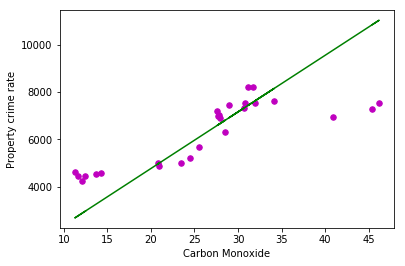

Chicago Annual Variance Carbon Monoxide vs Property crime rate
Estimated coefficients:
b_0 = -19.84913892318309
b_1 = 116.22695915445038


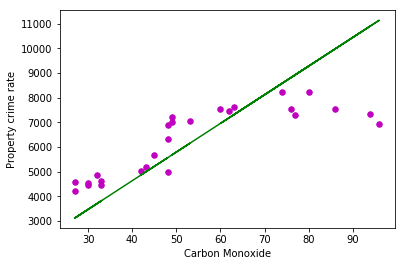

Minimum: [13, 11, 13, 13, 13, 11, 9, 8, 9, 10, 10, 9, 11, 11, 9, 7, 10, 7, 9, 10, 6, 6, 5, 5, 5, 5]
Maximum: [90, 97, 109, 89, 76, 91, 83, 68, 71, 104, 59, 62, 60, 59, 57, 52, 53, 49, 57, 42, 33, 36, 35, 38, 32, 38]
Chicago Mean Annual Carbon Monoxide vs Burglary rate
Estimated coefficients:
b_0 = -2.261369970781516
b_1 = 49.986210585396364


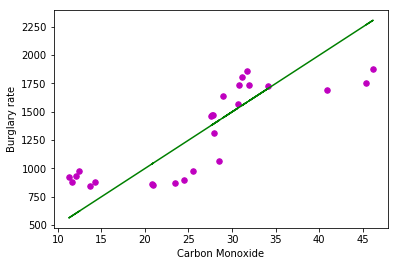

Chicago Annual Variance Carbon Monoxide vs Burglary rate
Estimated coefficients:
b_0 = -2.556318985022017
b_1 = 24.26922725523884


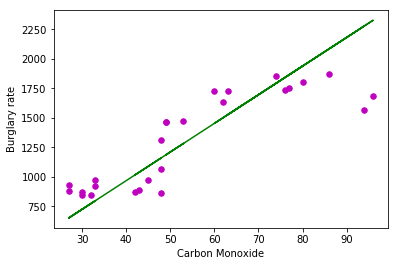

Minimum: [13, 11, 13, 13, 13, 11, 9, 8, 9, 10, 10, 9, 11, 11, 9, 7, 10, 7, 9, 10, 6, 6, 5, 5, 5, 5]
Maximum: [90, 97, 109, 89, 76, 91, 83, 68, 71, 104, 59, 62, 60, 59, 57, 52, 53, 49, 57, 42, 33, 36, 35, 38, 32, 38]
Chicago Mean Annual Carbon Monoxide vs Larceny-theft rate
Estimated coefficients:
b_0 = -13.265320091674312
b_1 = 145.13929372783517


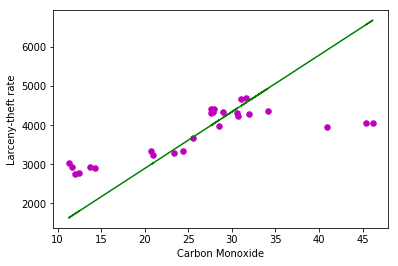

Chicago Annual Variance Carbon Monoxide vs Larceny-theft rate
Estimated coefficients:
b_0 = -15.18073177536553
b_1 = 70.48740144210643


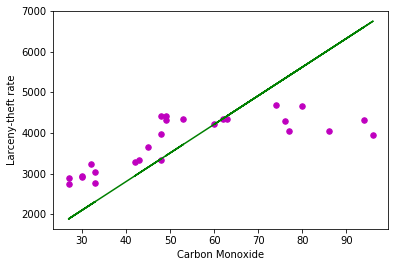

Minimum: [13, 11, 13, 13, 13, 11, 9, 8, 9, 10, 10, 9, 11, 11, 9, 7, 10, 7, 9, 10, 6, 6, 5, 5, 5, 5]
Maximum: [90, 97, 109, 89, 76, 91, 83, 68, 71, 104, 59, 62, 60, 59, 57, 52, 53, 49, 57, 42, 33, 36, 35, 38, 32, 38]
Chicago Mean Annual Carbon Monoxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -1.6456274143451992
b_1 = 44.21420280465247


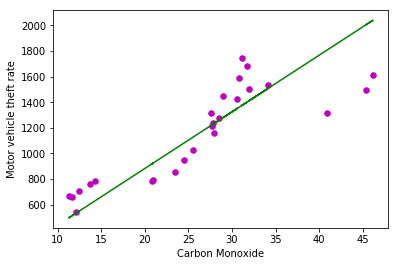

Chicago Annual Variance Carbon Monoxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -2.1119846834792497
b_1 = 21.47061323969428


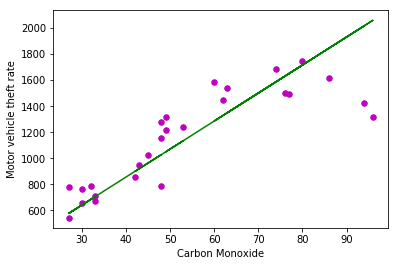

Minimum: [13, 11, 13, 13, 13, 11, 9, 8, 9, 10, 10, 9, 11, 11, 9, 7, 10, 7, 9, 10, 6, 6, 5, 5, 5, 5]
Maximum: [90, 97, 109, 89, 76, 91, 83, 68, 71, 104, 59, 62, 60, 59, 57, 52, 53, 49, 57, 42, 33, 36, 35, 38, 32, 38]
Chicago Mean Annual Nitrogen Dioxide vs Violent Crime rate
Estimated coefficients:
b_0 = -4.087360489273124
b_1 = 262.14738553983324


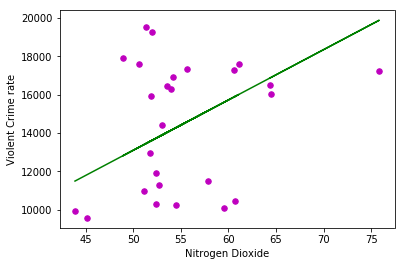

Chicago Annual Variance Nitrogen Dioxide vs Violent Crime rate
Estimated coefficients:
b_0 = -8.233553532078076
b_1 = 162.78314092327153


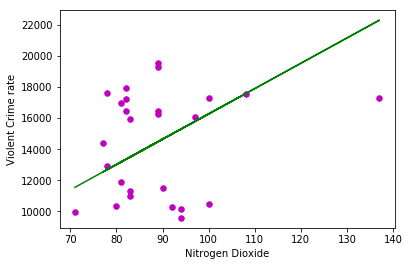

Minimum: [24, 31, 18, 17, 25, 21, 17, 20, 26, 26, 24, 24, 14, 20, 26, 24, 22, 20, 22, 18, 22, 16, 18, 17, 13, 13]
Maximum: [113, 113, 115, 117, 133, 110, 106, 102, 104, 163, 105, 106, 103, 103, 103, 102, 103, 110, 105, 101, 102, 108, 112, 117, 107, 84]
Chicago Mean Annual Nitrogen Dioxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.013020181483593518
b_1 = 0.4268483130708378


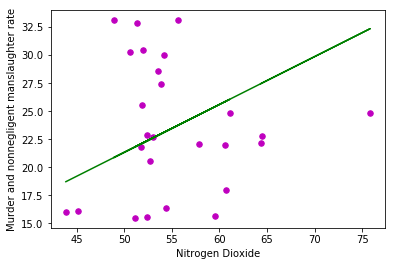

Chicago Annual Variance Nitrogen Dioxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.01310512674341524
b_1 = 0.2649808286250883


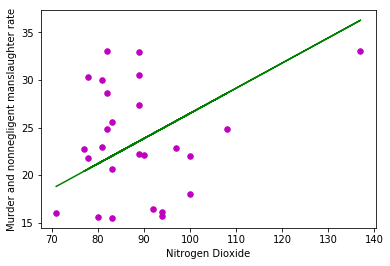

Minimum: [24, 31, 18, 17, 25, 21, 17, 20, 26, 26, 24, 24, 14, 20, 26, 24, 22, 20, 22, 18, 22, 16, 18, 17, 13, 13]
Maximum: [113, 113, 115, 117, 133, 110, 106, 102, 104, 163, 105, 106, 103, 103, 103, 102, 103, 110, 105, 101, 102, 108, 112, 117, 107, 84]
Chicago Mean Annual Nitrogen Dioxide vs Legacy rape rate
Estimated coefficients:
b_0 = nan
b_1 = -0.0


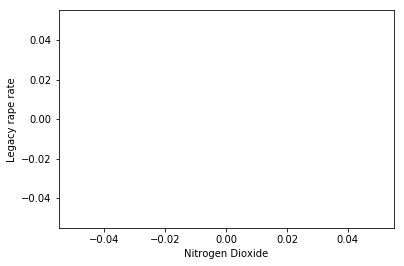

Chicago Annual Variance Nitrogen Dioxide vs Legacy rape rate
Estimated coefficients:
b_0 = nan
b_1 = -0.0


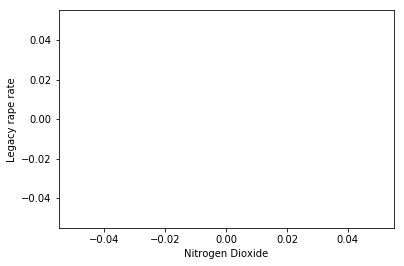

Minimum: [24, 31, 18, 17, 25, 21, 17, 20, 26, 26, 24, 24, 14, 20, 26, 24, 22, 20, 22, 18, 22, 16, 18, 17, 13, 13]
Maximum: [113, 113, 115, 117, 133, 110, 106, 102, 104, 163, 105, 106, 103, 103, 103, 102, 103, 110, 105, 101, 102, 108, 112, 117, 107, 84]
Chicago Mean Annual Nitrogen Dioxide vs Robbery rate
Estimated coefficients:
b_0 = -0.3375989801866126
b_1 = 15.78121512105058


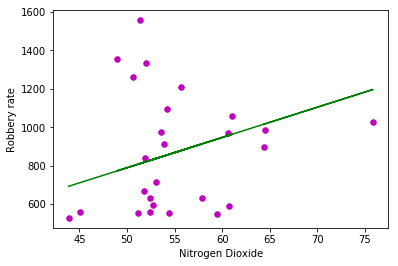

Chicago Annual Variance Nitrogen Dioxide vs Robbery rate
Estimated coefficients:
b_0 = -0.3363779602171917
b_1 = 9.796685070145362


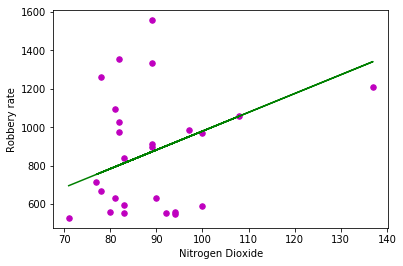

Minimum: [24, 31, 18, 17, 25, 21, 17, 20, 26, 26, 24, 24, 14, 20, 26, 24, 22, 20, 22, 18, 22, 16, 18, 17, 13, 13]
Maximum: [113, 113, 115, 117, 133, 110, 106, 102, 104, 163, 105, 106, 103, 103, 103, 102, 103, 110, 105, 101, 102, 108, 112, 117, 107, 84]
Chicago Mean Annual Nitrogen Dioxide vs Aggravated assault rate
Estimated coefficients:
b_0 = -0.4213973071825876
b_1 = 18.74850924995157


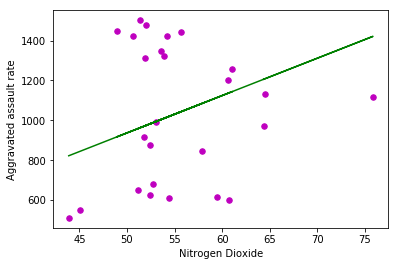

Chicago Annual Variance Nitrogen Dioxide vs Aggravated assault rate
Estimated coefficients:
b_0 = -0.4754653638758555
b_1 = 11.639351277375821


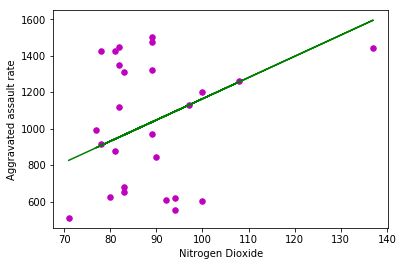

Minimum: [24, 31, 18, 17, 25, 21, 17, 20, 26, 26, 24, 24, 14, 20, 26, 24, 22, 20, 22, 18, 22, 16, 18, 17, 13, 13]
Maximum: [113, 113, 115, 117, 133, 110, 106, 102, 104, 163, 105, 106, 103, 103, 103, 102, 103, 110, 105, 101, 102, 108, 112, 117, 107, 84]
Chicago Mean Annual Nitrogen Dioxide vs Property crime rate
Estimated coefficients:
b_0 = -1.6577147960979346
b_1 = 113.5952676742401


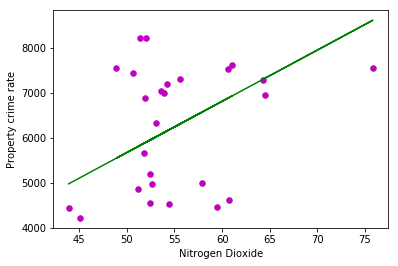

Chicago Annual Variance Nitrogen Dioxide vs Property crime rate
Estimated coefficients:
b_0 = -3.7043012284630095
b_1 = 70.54097524120401


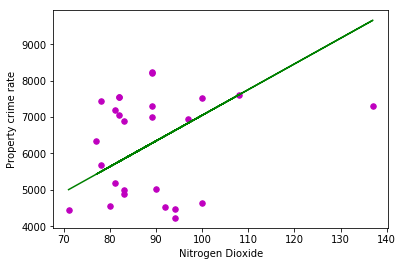

Minimum: [24, 31, 18, 17, 25, 21, 17, 20, 26, 26, 24, 24, 14, 20, 26, 24, 22, 20, 22, 18, 22, 16, 18, 17, 13, 13]
Maximum: [113, 113, 115, 117, 133, 110, 106, 102, 104, 163, 105, 106, 103, 103, 103, 102, 103, 110, 105, 101, 102, 108, 112, 117, 107, 84]
Chicago Mean Annual Nitrogen Dioxide vs Burglary rate
Estimated coefficients:
b_0 = -0.01908317437550977
b_1 = 23.742585044945436


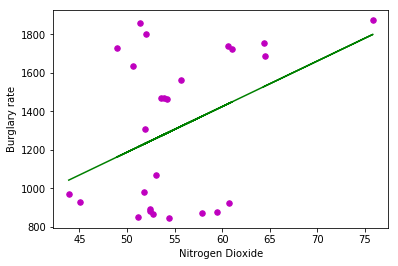

Chicago Annual Variance Nitrogen Dioxide vs Burglary rate
Estimated coefficients:
b_0 = -0.5528473591525653
b_1 = 14.744986587846672


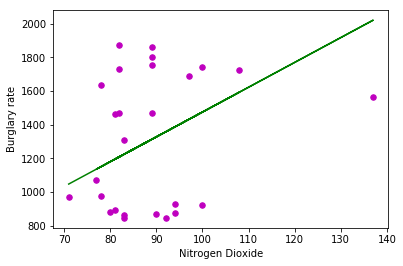

Minimum: [24, 31, 18, 17, 25, 21, 17, 20, 26, 26, 24, 24, 14, 20, 26, 24, 22, 20, 22, 18, 22, 16, 18, 17, 13, 13]
Maximum: [113, 113, 115, 117, 133, 110, 106, 102, 104, 163, 105, 106, 103, 103, 103, 102, 103, 110, 105, 101, 102, 108, 112, 117, 107, 84]
Chicago Mean Annual Nitrogen Dioxide vs Larceny-theft rate
Estimated coefficients:
b_0 = -1.553501508888985
b_1 = 68.84431011020817


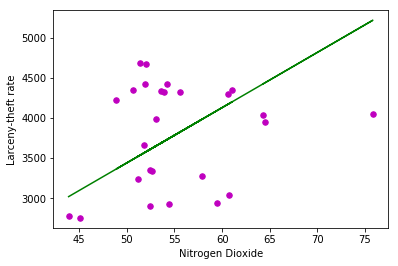

Chicago Annual Variance Nitrogen Dioxide vs Larceny-theft rate
Estimated coefficients:
b_0 = -2.532172384389014
b_1 = 42.74834841143099


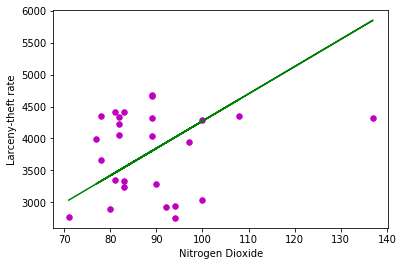

Minimum: [24, 31, 18, 17, 25, 21, 17, 20, 26, 26, 24, 24, 14, 20, 26, 24, 22, 20, 22, 18, 22, 16, 18, 17, 13, 13]
Maximum: [113, 113, 115, 117, 133, 110, 106, 102, 104, 163, 105, 106, 103, 103, 103, 102, 103, 110, 105, 101, 102, 108, 112, 117, 107, 84]
Chicago Mean Annual Nitrogen Dioxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -0.08504454105627701
b_1 = 21.008650026366585


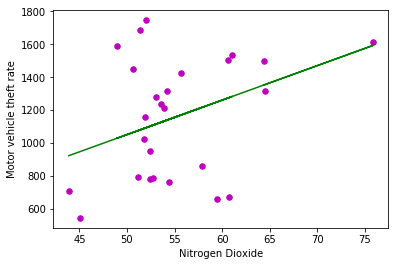

Chicago Annual Variance Nitrogen Dioxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -0.6192841092338313
b_1 = 13.047813506643605


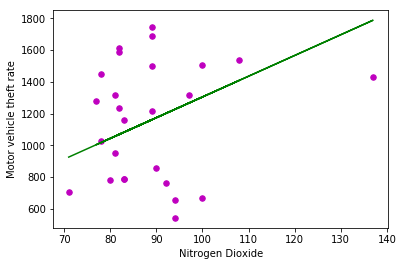

Minimum: [24, 31, 18, 17, 25, 21, 17, 20, 26, 26, 24, 24, 14, 20, 26, 24, 22, 20, 22, 18, 22, 16, 18, 17, 13, 13]
Maximum: [113, 113, 115, 117, 133, 110, 106, 102, 104, 163, 105, 106, 103, 103, 103, 102, 103, 110, 105, 101, 102, 108, 112, 117, 107, 84]
Chicago Mean Annual Ozone vs Violent Crime rate
Estimated coefficients:
b_0 = -0.5078328167128348
b_1 = 282.94536901590885


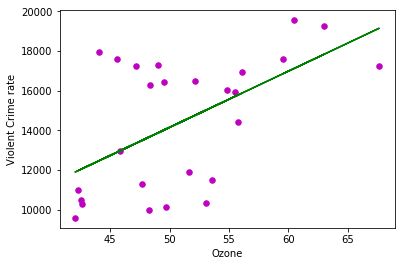

Chicago Annual Variance Ozone vs Violent Crime rate
Estimated coefficients:
b_0 = -0.15161240903216822
b_1 = 71.36324884548533


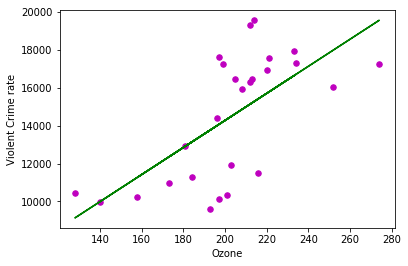

Minimum: [10, 6, 9, 11, 6, 6, 10, 4, 6, 6, 5, 5, 4, 9, 6, 9, 6, 7, 6, 6, 7, 6, 6, 12, 9, 19]
Maximum: [215, 205, 261, 285, 227, 218, 224, 237, 203, 240, 225, 218, 216, 217, 202, 190, 209, 223, 190, 179, 208, 164, 203, 140, 202, 159]
Chicago Mean Annual Ozone vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.006101290789761293
b_1 = 0.46069181804216364


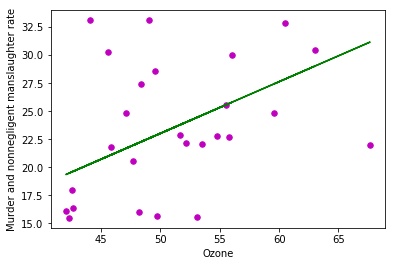

Chicago Annual Variance Ozone vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.0026208955532993627
b_1 = 0.11617935852666907


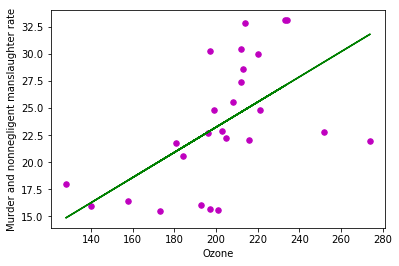

Minimum: [10, 6, 9, 11, 6, 6, 10, 4, 6, 6, 5, 5, 4, 9, 6, 9, 6, 7, 6, 6, 7, 6, 6, 12, 9, 19]
Maximum: [215, 205, 261, 285, 227, 218, 224, 237, 203, 240, 225, 218, 216, 217, 202, 190, 209, 223, 190, 179, 208, 164, 203, 140, 202, 159]
Chicago Mean Annual Ozone vs Legacy rape rate
Estimated coefficients:
b_0 = nan
b_1 = -0.0


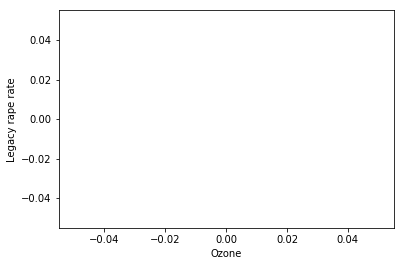

Chicago Annual Variance Ozone vs Legacy rape rate
Estimated coefficients:
b_0 = nan
b_1 = -0.0


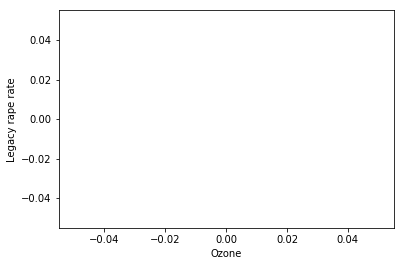

Minimum: [10, 6, 9, 11, 6, 6, 10, 4, 6, 6, 5, 5, 4, 9, 6, 9, 6, 7, 6, 6, 7, 6, 6, 12, 9, 19]
Maximum: [215, 205, 261, 285, 227, 218, 224, 237, 203, 240, 225, 218, 216, 217, 202, 190, 209, 223, 190, 179, 208, 164, 203, 140, 202, 159]
Chicago Mean Annual Ozone vs Robbery rate
Estimated coefficients:
b_0 = 0.06730519159316373
b_1 = 17.029539842907948


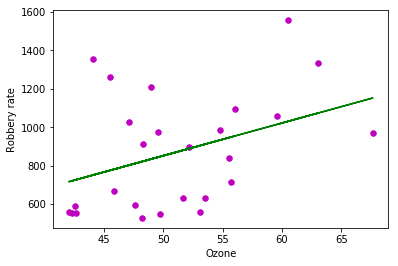

Chicago Annual Variance Ozone vs Robbery rate
Estimated coefficients:
b_0 = 0.23855468586100415
b_1 = 4.294376439621506


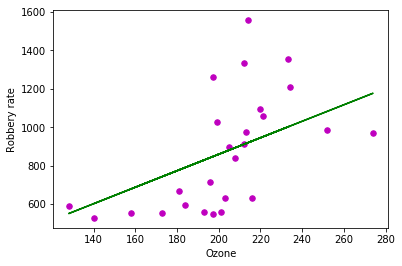

Minimum: [10, 6, 9, 11, 6, 6, 10, 4, 6, 6, 5, 5, 4, 9, 6, 9, 6, 7, 6, 6, 7, 6, 6, 12, 9, 19]
Maximum: [215, 205, 261, 285, 227, 218, 224, 237, 203, 240, 225, 218, 216, 217, 202, 190, 209, 223, 190, 179, 208, 164, 203, 140, 202, 159]
Chicago Mean Annual Ozone vs Aggravated assault rate
Estimated coefficients:
b_0 = 0.1438252324765017
b_1 = 20.22990410525557


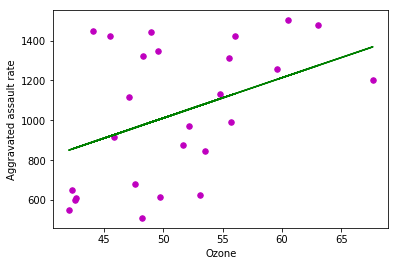

Chicago Annual Variance Ozone vs Aggravated assault rate
Estimated coefficients:
b_0 = 0.4121809515777386
b_1 = 5.101098650315156


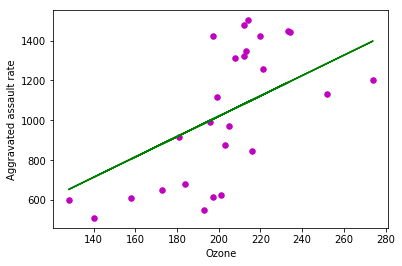

Minimum: [10, 6, 9, 11, 6, 6, 10, 4, 6, 6, 5, 5, 4, 9, 6, 9, 6, 7, 6, 6, 7, 6, 6, 12, 9, 19]
Maximum: [215, 205, 261, 285, 227, 218, 224, 237, 203, 240, 225, 218, 216, 217, 202, 190, 209, 223, 190, 179, 208, 164, 203, 140, 202, 159]
Chicago Mean Annual Ozone vs Property crime rate
Estimated coefficients:
b_0 = -0.3564659789262805
b_1 = 122.61246667342128


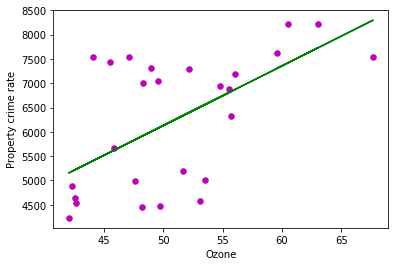

Chicago Annual Variance Ozone vs Property crime rate
Estimated coefficients:
b_0 = -0.39992436180546065
b_1 = 30.92575950482655


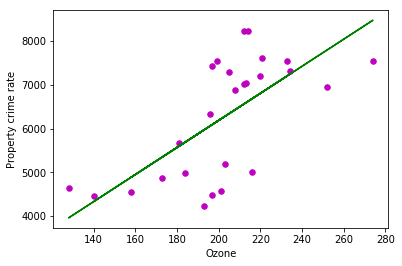

Minimum: [10, 6, 9, 11, 6, 6, 10, 4, 6, 6, 5, 5, 4, 9, 6, 9, 6, 7, 6, 6, 7, 6, 6, 12, 9, 19]
Maximum: [215, 205, 261, 285, 227, 218, 224, 237, 203, 240, 225, 218, 216, 217, 202, 190, 209, 223, 190, 179, 208, 164, 203, 140, 202, 159]
Chicago Mean Annual Ozone vs Burglary rate
Estimated coefficients:
b_0 = 0.10221054869998625
b_1 = 25.63022358621659


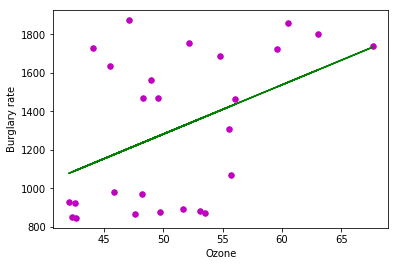

Chicago Annual Variance Ozone vs Burglary rate
Estimated coefficients:
b_0 = 0.29054038726258113
b_1 = 6.463572558877503


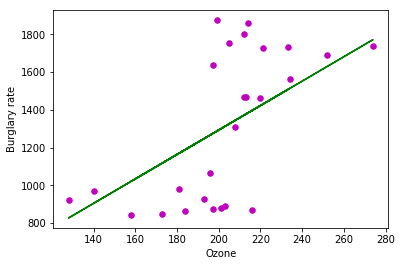

Minimum: [10, 6, 9, 11, 6, 6, 10, 4, 6, 6, 5, 5, 4, 9, 6, 9, 6, 7, 6, 6, 7, 6, 6, 12, 9, 19]
Maximum: [215, 205, 261, 285, 227, 218, 224, 237, 203, 240, 225, 218, 216, 217, 202, 190, 209, 223, 190, 179, 208, 164, 203, 140, 202, 159]
Chicago Mean Annual Ozone vs Larceny-theft rate
Estimated coefficients:
b_0 = -0.7270966398114069
b_1 = 74.30843555755634


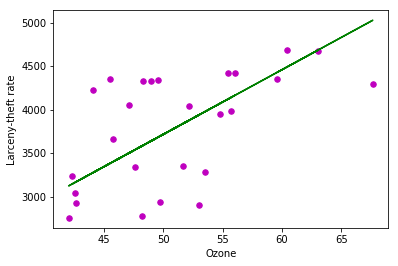

Chicago Annual Variance Ozone vs Larceny-theft rate
Estimated coefficients:
b_0 = -1.0213421437947545
b_1 = 18.743665443719358


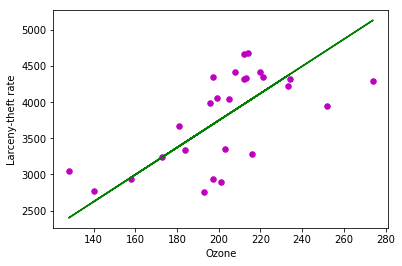

Minimum: [10, 6, 9, 11, 6, 6, 10, 4, 6, 6, 5, 5, 4, 9, 6, 9, 6, 7, 6, 6, 7, 6, 6, 12, 9, 19]
Maximum: [215, 205, 261, 285, 227, 218, 224, 237, 203, 240, 225, 218, 216, 217, 202, 190, 209, 223, 190, 179, 208, 164, 203, 140, 202, 159]
Chicago Mean Annual Ozone vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 0.26849012004754513
b_1 = 22.674107432508993


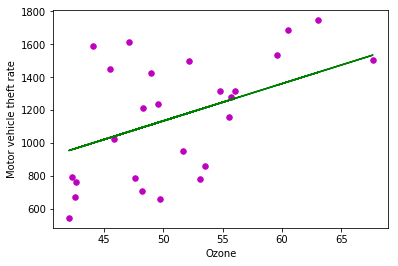

Chicago Annual Variance Ozone vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 0.3309989674219196
b_1 = 5.718596889598602


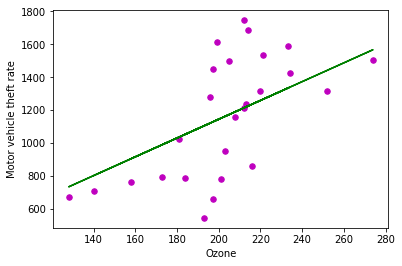

Minimum: [10, 6, 9, 11, 6, 6, 10, 4, 6, 6, 5, 5, 4, 9, 6, 9, 6, 7, 6, 6, 7, 6, 6, 12, 9, 19]
Maximum: [215, 205, 261, 285, 227, 218, 224, 237, 203, 240, 225, 218, 216, 217, 202, 190, 209, 223, 190, 179, 208, 164, 203, 140, 202, 159]
Chicago Mean Annual Sulfur Dioxide vs Violent Crime rate
Estimated coefficients:
b_0 = -22.147094806852692
b_1 = 197.15477395602022


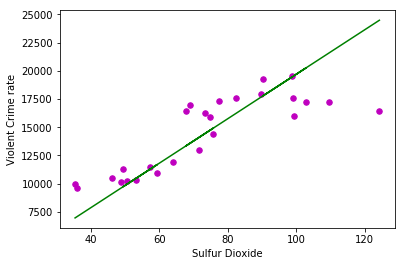

Chicago Annual Variance Sulfur Dioxide vs Violent Crime rate
Estimated coefficients:
b_0 = 1.4773209791510453
b_1 = 94.8519670844803


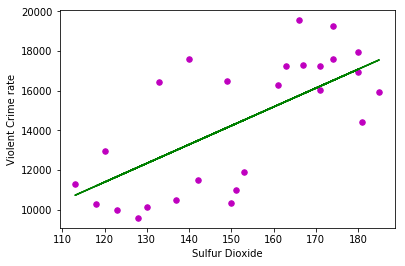

Minimum: [51, 37, 29, 29, 26, 26, 34, 20, 21, 16, 20, 17, 21, 13, 19, 16, 14, 11, 9, 13, 13, 9, 11, 7, 6, 4]
Maximum: [200, 200, 200, 200, 200, 200, 200, 200, 161, 183, 200, 150, 182, 198, 200, 136, 167, 153, 122, 164, 163, 127, 141, 144, 134, 127]
Chicago Mean Annual Sulfur Dioxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.05131273517094925
b_1 = 0.32114347346724426


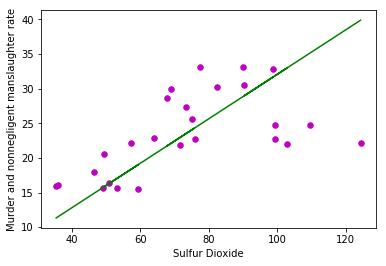

Chicago Annual Variance Sulfur Dioxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -9.345163198304363e-05
b_1 = 0.15441980549051304


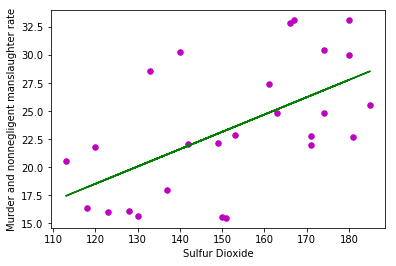

Minimum: [51, 37, 29, 29, 26, 26, 34, 20, 21, 16, 20, 17, 21, 13, 19, 16, 14, 11, 9, 13, 13, 9, 11, 7, 6, 4]
Maximum: [200, 200, 200, 200, 200, 200, 200, 200, 161, 183, 200, 150, 182, 198, 200, 136, 167, 153, 122, 164, 163, 127, 141, 144, 134, 127]
Chicago Mean Annual Sulfur Dioxide vs Legacy rape rate
Estimated coefficients:
b_0 = nan
b_1 = -0.0


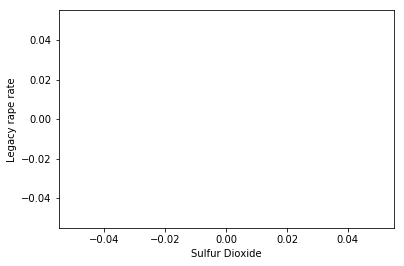

Chicago Annual Variance Sulfur Dioxide vs Legacy rape rate
Estimated coefficients:
b_0 = nan
b_1 = -0.0


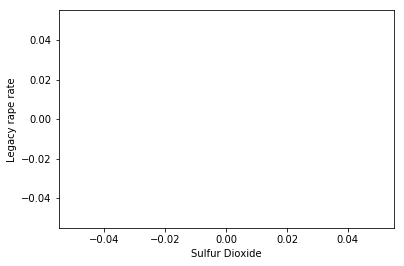

Minimum: [51, 37, 29, 29, 26, 26, 34, 20, 21, 16, 20, 17, 21, 13, 19, 16, 14, 11, 9, 13, 13, 9, 11, 7, 6, 4]
Maximum: [200, 200, 200, 200, 200, 200, 200, 200, 161, 183, 200, 150, 182, 198, 200, 136, 167, 153, 122, 164, 163, 127, 141, 144, 134, 127]
Chicago Mean Annual Sulfur Dioxide vs Robbery rate
Estimated coefficients:
b_0 = -0.7741965036053671
b_1 = 11.859809949132064


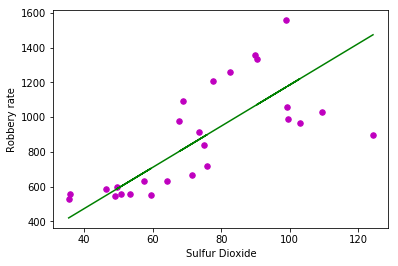

Chicago Annual Variance Sulfur Dioxide vs Robbery rate
Estimated coefficients:
b_0 = 0.33108606618839076
b_1 = 5.707876707646236


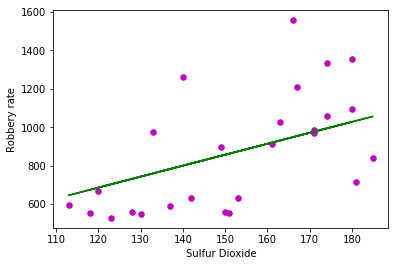

Minimum: [51, 37, 29, 29, 26, 26, 34, 20, 21, 16, 20, 17, 21, 13, 19, 16, 14, 11, 9, 13, 13, 9, 11, 7, 6, 4]
Maximum: [200, 200, 200, 200, 200, 200, 200, 200, 161, 183, 200, 150, 182, 198, 200, 136, 167, 153, 122, 164, 163, 127, 141, 144, 134, 127]
Chicago Mean Annual Sulfur Dioxide vs Aggravated assault rate
Estimated coefficients:
b_0 = -1.1597042204791705
b_1 = 14.092766365962953


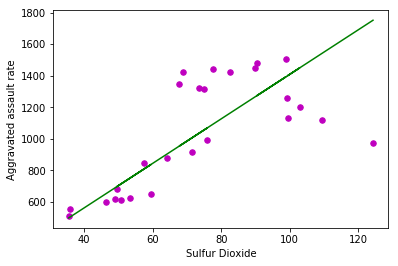

Chicago Annual Variance Sulfur Dioxide vs Aggravated assault rate
Estimated coefficients:
b_0 = 0.5069787754946447
b_1 = 6.78023195753463


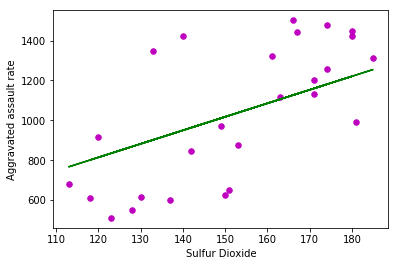

Minimum: [51, 37, 29, 29, 26, 26, 34, 20, 21, 16, 20, 17, 21, 13, 19, 16, 14, 11, 9, 13, 13, 9, 11, 7, 6, 4]
Maximum: [200, 200, 200, 200, 200, 200, 200, 200, 161, 183, 200, 150, 182, 198, 200, 136, 167, 153, 122, 164, 163, 127, 141, 144, 134, 127]
Chicago Mean Annual Sulfur Dioxide vs Property crime rate
Estimated coefficients:
b_0 = -10.080997589217986
b_1 = 85.44042305318787


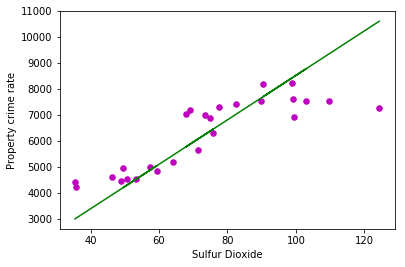

Chicago Annual Variance Sulfur Dioxide vs Property crime rate
Estimated coefficients:
b_0 = 0.31964881894236896
b_1 = 41.10466897240089


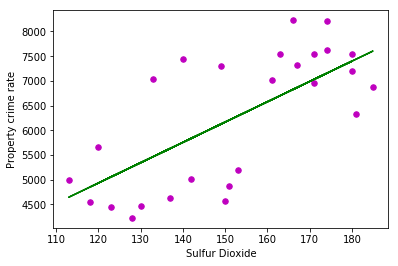

Minimum: [51, 37, 29, 29, 26, 26, 34, 20, 21, 16, 20, 17, 21, 13, 19, 16, 14, 11, 9, 13, 13, 9, 11, 7, 6, 4]
Maximum: [200, 200, 200, 200, 200, 200, 200, 200, 161, 183, 200, 150, 182, 198, 200, 136, 167, 153, 122, 164, 163, 127, 141, 144, 134, 127]
Chicago Mean Annual Sulfur Dioxide vs Burglary rate
Estimated coefficients:
b_0 = -0.8548091963823481
b_1 = 17.84533094903078


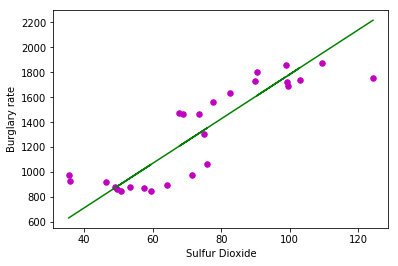

Chicago Annual Variance Sulfur Dioxide vs Burglary rate
Estimated coefficients:
b_0 = 0.33610592014838403
b_1 = 8.59168213284751


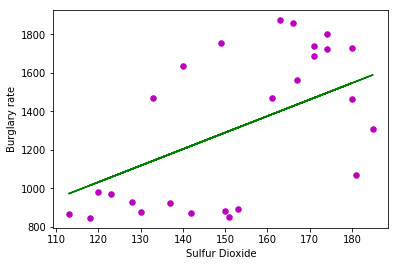

Minimum: [51, 37, 29, 29, 26, 26, 34, 20, 21, 16, 20, 17, 21, 13, 19, 16, 14, 11, 9, 13, 13, 9, 11, 7, 6, 4]
Maximum: [200, 200, 200, 200, 200, 200, 200, 200, 161, 183, 200, 150, 182, 198, 200, 136, 167, 153, 122, 164, 163, 127, 141, 144, 134, 127]
Chicago Mean Annual Sulfur Dioxide vs Larceny-theft rate
Estimated coefficients:
b_0 = -8.769780776419339
b_1 = 51.809858539992426


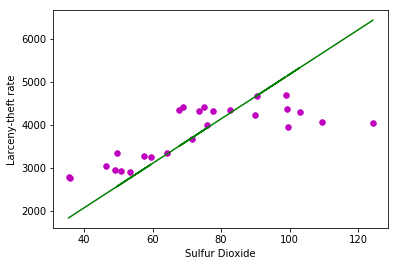

Chicago Annual Variance Sulfur Dioxide vs Larceny-theft rate
Estimated coefficients:
b_0 = -0.5285268628549602
b_1 = 24.912586287483396


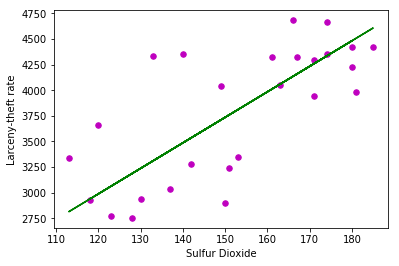

Minimum: [51, 37, 29, 29, 26, 26, 34, 20, 21, 16, 20, 17, 21, 13, 19, 16, 14, 11, 9, 13, 13, 9, 11, 7, 6, 4]
Maximum: [200, 200, 200, 200, 200, 200, 200, 200, 161, 183, 200, 150, 182, 198, 200, 136, 167, 153, 122, 164, 163, 127, 141, 144, 134, 127]
Chicago Mean Annual Sulfur Dioxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -0.45629378557646305
b_1 = 15.785441625246934


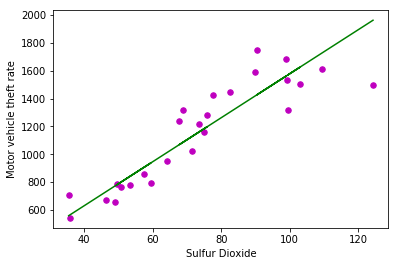

Chicago Annual Variance Sulfur Dioxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 0.5121217128639728
b_1 = 7.600501221077157


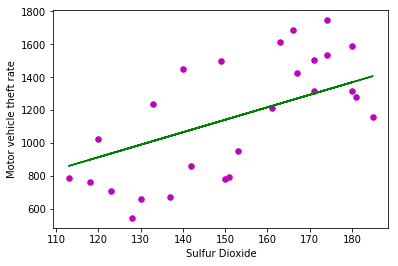

Minimum: [51, 37, 29, 29, 26, 26, 34, 20, 21, 16, 20, 17, 21, 13, 19, 16, 14, 11, 9, 13, 13, 9, 11, 7, 6, 4]
Maximum: [200, 200, 200, 200, 200, 200, 200, 200, 161, 183, 200, 150, 182, 198, 200, 136, 167, 153, 122, 164, 163, 127, 141, 144, 134, 127]
Chicago Mean Annual PM10 vs Violent Crime rate
Estimated coefficients:
b_0 = -82.43861094585009
b_1 = 411.6305035190541


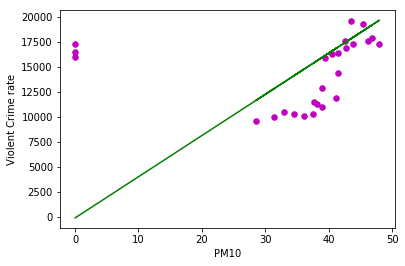

Chicago Annual Variance PM10 vs Violent Crime rate
Estimated coefficients:
b_0 = 4823715456.008172
b_1 = 58.40156499632933


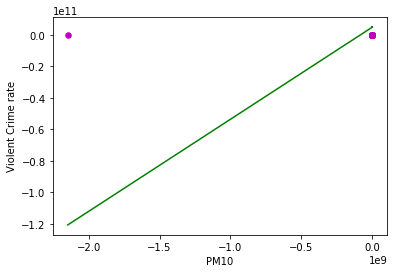

Minimum: [2147483647, 7, 23, 6, 11, 11, 11, 14, 11, 8, 10, 11, 11, 6, 7, 11, 9, 8, 9, 7, 8, 8, 7, 7, 8, 6]
Maximum: [0, 7, 23, 215, 136, 148, 123, 123, 101, 153, 104, 504, 177, 94, 170, 97, 126, 119, 137, 174, 130, 119, 90, 106, 65, 69]
Chicago Mean Annual PM10 vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.11556472943864904
b_1 = 0.6695389503291745


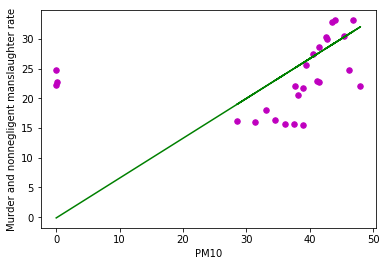

Chicago Annual Variance PM10 vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 7914403.423845218
b_1 = 0.09582106595187194


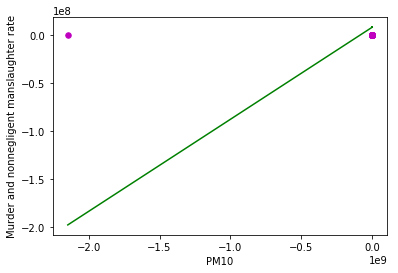

Minimum: [2147483647, 7, 23, 6, 11, 11, 11, 14, 11, 8, 10, 11, 11, 6, 7, 11, 9, 8, 9, 7, 8, 8, 7, 7, 8, 6]
Maximum: [0, 7, 23, 215, 136, 148, 123, 123, 101, 153, 104, 504, 177, 94, 170, 97, 126, 119, 137, 174, 130, 119, 90, 106, 65, 69]
Chicago Mean Annual PM10 vs Legacy rape rate
Estimated coefficients:
b_0 = nan
b_1 = -0.0


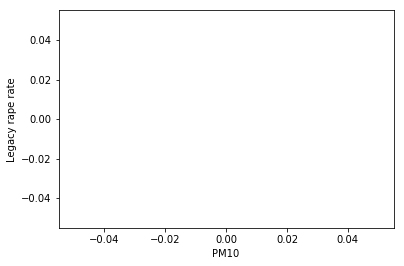

Chicago Annual Variance PM10 vs Legacy rape rate
Estimated coefficients:
b_0 = nan
b_1 = 0.0


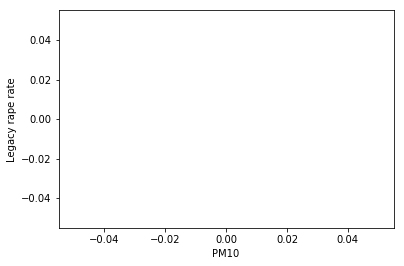

Minimum: [2147483647, 7, 23, 6, 11, 11, 11, 14, 11, 8, 10, 11, 11, 6, 7, 11, 9, 8, 9, 7, 8, 8, 7, 7, 8, 6]
Maximum: [0, 7, 23, 215, 136, 148, 123, 123, 101, 153, 104, 504, 177, 94, 170, 97, 126, 119, 137, 174, 130, 119, 90, 106, 65, 69]
Chicago Mean Annual PM10 vs Robbery rate
Estimated coefficients:
b_0 = -4.507110355618465
b_1 = 24.764564198218544


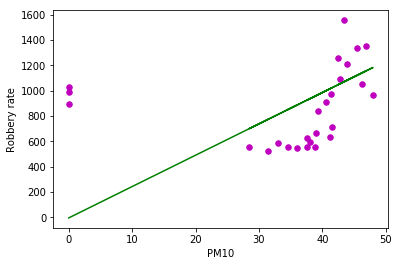

Chicago Annual Variance PM10 vs Robbery rate
Estimated coefficients:
b_0 = 291637642.15029436
b_1 = 3.5309078847897744


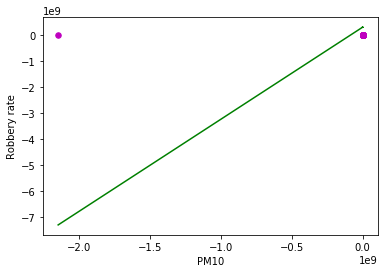

Minimum: [2147483647, 7, 23, 6, 11, 11, 11, 14, 11, 8, 10, 11, 11, 6, 7, 11, 9, 8, 9, 7, 8, 8, 7, 7, 8, 6]
Maximum: [0, 7, 23, 215, 136, 148, 123, 123, 101, 153, 104, 504, 177, 94, 170, 97, 126, 119, 137, 174, 130, 119, 90, 106, 65, 69]
Chicago Mean Annual PM10 vs Aggravated assault rate
Estimated coefficients:
b_0 = -4.867558078976117
b_1 = 29.406598326466078


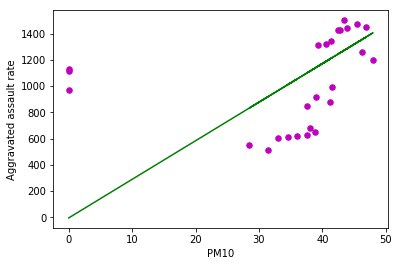

Chicago Annual Variance PM10 vs Aggravated assault rate
Estimated coefficients:
b_0 = 347743549.4547591
b_1 = 4.210191952751104


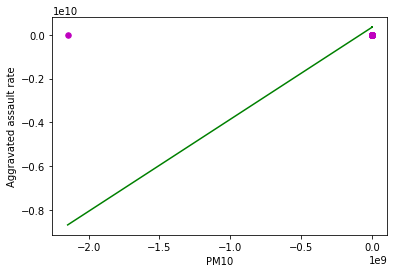

Minimum: [2147483647, 7, 23, 6, 11, 11, 11, 14, 11, 8, 10, 11, 11, 6, 7, 11, 9, 8, 9, 7, 8, 8, 7, 7, 8, 6]
Maximum: [0, 7, 23, 215, 136, 148, 123, 123, 101, 153, 104, 504, 177, 94, 170, 97, 126, 119, 137, 174, 130, 119, 90, 106, 65, 69]
Chicago Mean Annual PM10 vs Property crime rate
Estimated coefficients:
b_0 = -36.47402903659258
b_1 = 178.3946785818341


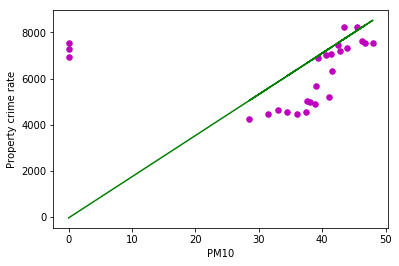

Chicago Annual Variance PM10 vs Property crime rate
Estimated coefficients:
b_0 = 2088207244.4543593
b_1 = 25.28228952611607


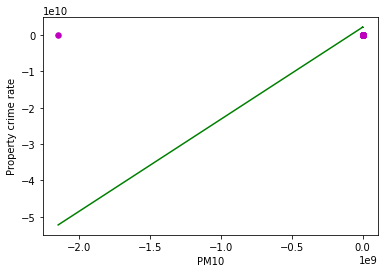

Minimum: [2147483647, 7, 23, 6, 11, 11, 11, 14, 11, 8, 10, 11, 11, 6, 7, 11, 9, 8, 9, 7, 8, 8, 7, 7, 8, 6]
Maximum: [0, 7, 23, 215, 136, 148, 123, 123, 101, 153, 104, 504, 177, 94, 170, 97, 126, 119, 137, 174, 130, 119, 90, 106, 65, 69]
Chicago Mean Annual PM10 vs Burglary rate
Estimated coefficients:
b_0 = -8.723209533118961
b_1 = 37.32676093131689


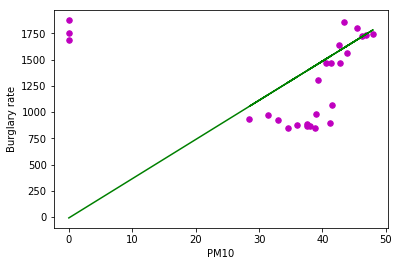

Chicago Annual Variance PM10 vs Burglary rate
Estimated coefficients:
b_0 = 433471066.02149516
b_1 = 5.248109729934672


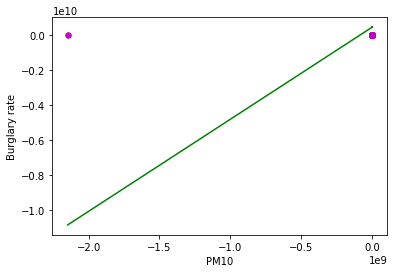

Minimum: [2147483647, 7, 23, 6, 11, 11, 11, 14, 11, 8, 10, 11, 11, 6, 7, 11, 9, 8, 9, 7, 8, 8, 7, 7, 8, 6]
Maximum: [0, 7, 23, 215, 136, 148, 123, 123, 101, 153, 104, 504, 177, 94, 170, 97, 126, 119, 137, 174, 130, 119, 90, 106, 65, 69]
Chicago Mean Annual PM10 vs Larceny-theft rate
Estimated coefficients:
b_0 = -20.839619088824747
b_1 = 108.06453914695895


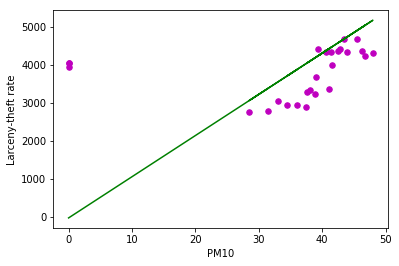

Chicago Annual Variance PM10 vs Larceny-theft rate
Estimated coefficients:
b_0 = 1270446423.3116734
b_1 = 15.381516739516055


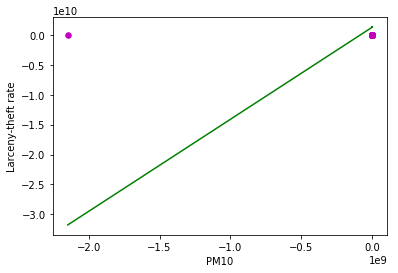

Minimum: [2147483647, 7, 23, 6, 11, 11, 11, 14, 11, 8, 10, 11, 11, 6, 7, 11, 9, 8, 9, 7, 8, 8, 7, 7, 8, 6]
Maximum: [0, 7, 23, 215, 136, 148, 123, 123, 101, 153, 104, 504, 177, 94, 170, 97, 126, 119, 137, 174, 130, 119, 90, 106, 65, 69]
Chicago Mean Annual PM10 vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -6.911520123277796
b_1 = 33.003823383930374


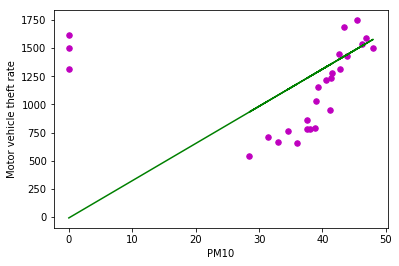

Chicago Annual Variance PM10 vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 384295127.1917469
b_1 = 4.652728097269799


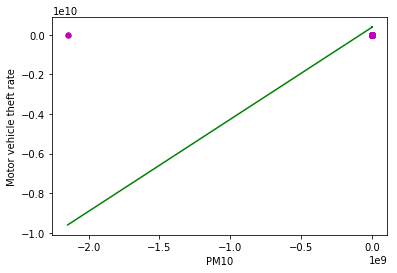

Minimum: [2147483647, 7, 23, 6, 11, 11, 11, 14, 11, 8, 10, 11, 11, 6, 7, 11, 9, 8, 9, 7, 8, 8, 7, 7, 8, 6]
Maximum: [0, 7, 23, 215, 136, 148, 123, 123, 101, 153, 104, 504, 177, 94, 170, 97, 126, 119, 137, 174, 130, 119, 90, 106, 65, 69]
Chicago Mean Annual PM2.5 vs Violent Crime rate
Estimated coefficients:
b_0 = -840.7725122303636
b_1 = 500.18610343863725


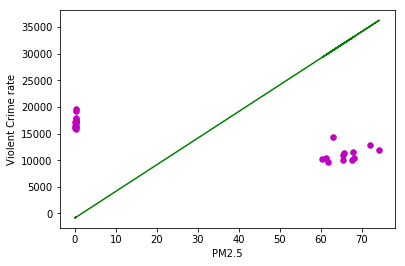

Chicago Annual Variance PM2.5 vs Violent Crime rate
Estimated coefficients:
b_0 = 9810131471.473732
b_1 = 118.77306844562737


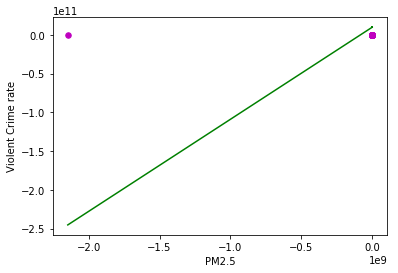

Minimum: [2147483647, 56, 46, 35, 64, 84, 86, 68, 74, 57, 62, 91, 83, 68, 1, 21, 24, 24, 18, 20, 14, 20, 24, 22, 29, 27]
Maximum: [0, 56, 46, 35, 64, 84, 86, 68, 74, 57, 62, 91, 83, 68, 157, 155, 158, 153, 152, 152, 186, 120, 156, 117, 116, 134]
Chicago Mean Annual PM2.5 vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -1.3469725730010325
b_1 = 0.8135118717776715


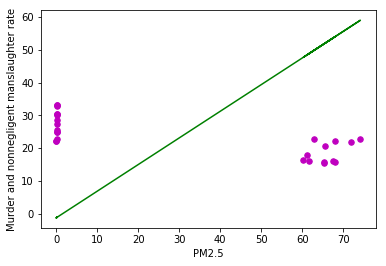

Chicago Annual Variance PM2.5 vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 16095754.250619253
b_1 = 0.1948742633037553


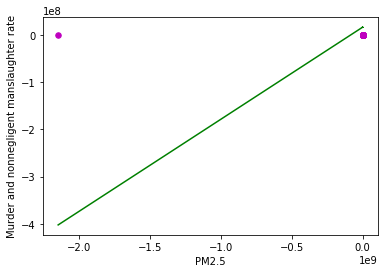

Minimum: [2147483647, 56, 46, 35, 64, 84, 86, 68, 74, 57, 62, 91, 83, 68, 1, 21, 24, 24, 18, 20, 14, 20, 24, 22, 29, 27]
Maximum: [0, 56, 46, 35, 64, 84, 86, 68, 74, 57, 62, 91, 83, 68, 157, 155, 158, 153, 152, 152, 186, 120, 156, 117, 116, 134]
Chicago Mean Annual PM2.5 vs Legacy rape rate
Estimated coefficients:
b_0 = nan
b_1 = -0.0


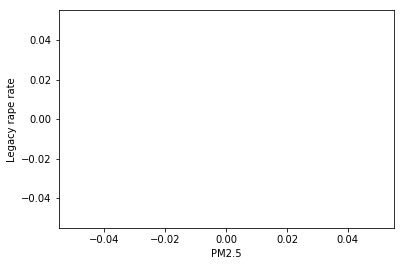

Chicago Annual Variance PM2.5 vs Legacy rape rate
Estimated coefficients:
b_0 = nan
b_1 = 0.0


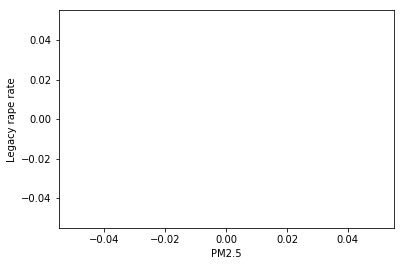

Minimum: [2147483647, 56, 46, 35, 64, 84, 86, 68, 74, 57, 62, 91, 83, 68, 1, 21, 24, 24, 18, 20, 14, 20, 24, 22, 29, 27]
Maximum: [0, 56, 46, 35, 64, 84, 86, 68, 74, 57, 62, 91, 83, 68, 157, 155, 158, 153, 152, 152, 186, 120, 156, 117, 116, 134]
Chicago Mean Annual PM2.5 vs Robbery rate
Estimated coefficients:
b_0 = -53.84147201527185
b_1 = 30.21367699990667


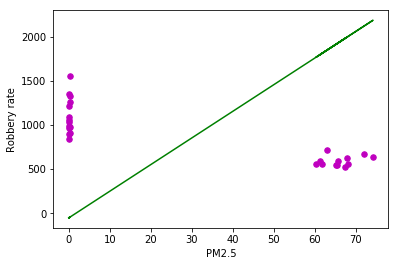

Chicago Annual Variance PM2.5 vs Robbery rate
Estimated coefficients:
b_0 = 593112019.2628415
b_1 = 7.180916496441018


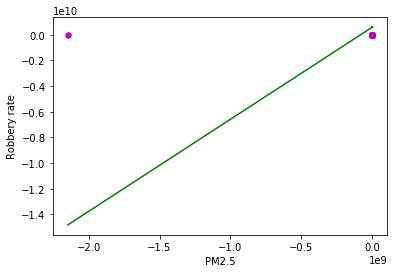

Minimum: [2147483647, 56, 46, 35, 64, 84, 86, 68, 74, 57, 62, 91, 83, 68, 1, 21, 24, 24, 18, 20, 14, 20, 24, 22, 29, 27]
Maximum: [0, 56, 46, 35, 64, 84, 86, 68, 74, 57, 62, 91, 83, 68, 157, 155, 158, 153, 152, 152, 186, 120, 156, 117, 116, 134]
Chicago Mean Annual PM2.5 vs Aggravated assault rate
Estimated coefficients:
b_0 = -63.779359051525034
b_1 = 35.88792115652095


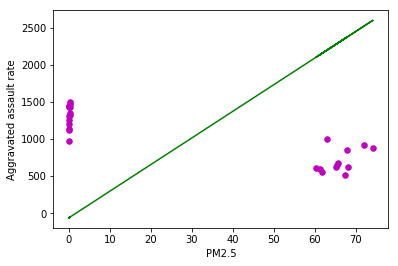

Chicago Annual Variance PM2.5 vs Aggravated assault rate
Estimated coefficients:
b_0 = 707216247.8386899
b_1 = 8.562397461297595


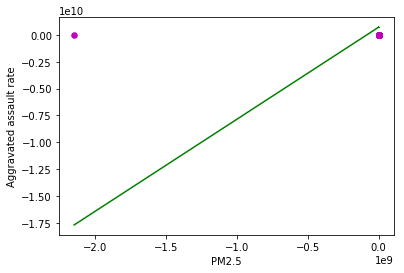

Minimum: [2147483647, 56, 46, 35, 64, 84, 86, 68, 74, 57, 62, 91, 83, 68, 1, 21, 24, 24, 18, 20, 14, 20, 24, 22, 29, 27]
Maximum: [0, 56, 46, 35, 64, 84, 86, 68, 74, 57, 62, 91, 83, 68, 157, 155, 158, 153, 152, 152, 186, 120, 156, 117, 116, 134]
Chicago Mean Annual PM2.5 vs Property crime rate
Estimated coefficients:
b_0 = -360.9020300769889
b_1 = 216.63523444004548


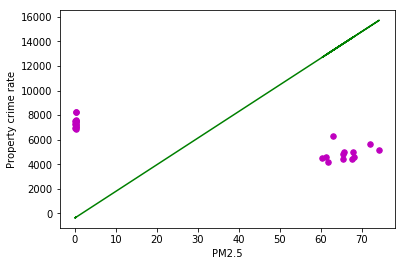

Chicago Annual Variance PM2.5 vs Property crime rate
Estimated coefficients:
b_0 = 4246848262.391836
b_1 = 51.41737397474915


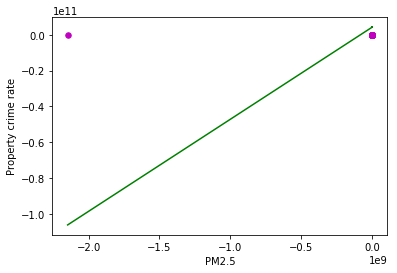

Minimum: [2147483647, 56, 46, 35, 64, 84, 86, 68, 74, 57, 62, 91, 83, 68, 1, 21, 24, 24, 18, 20, 14, 20, 24, 22, 29, 27]
Maximum: [0, 56, 46, 35, 64, 84, 86, 68, 74, 57, 62, 91, 83, 68, 157, 155, 158, 153, 152, 152, 186, 120, 156, 117, 116, 134]
Chicago Mean Annual PM2.5 vs Burglary rate
Estimated coefficients:
b_0 = -80.34248951538802
b_1 = 45.45035516727007


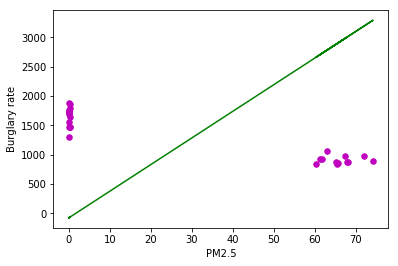

Chicago Annual Variance PM2.5 vs Burglary rate
Estimated coefficients:
b_0 = 881562802.3562427
b_1 = 10.673243076577355


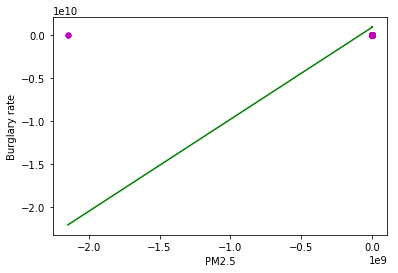

Minimum: [2147483647, 56, 46, 35, 64, 84, 86, 68, 74, 57, 62, 91, 83, 68, 1, 21, 24, 24, 18, 20, 14, 20, 24, 22, 29, 27]
Maximum: [0, 56, 46, 35, 64, 84, 86, 68, 74, 57, 62, 91, 83, 68, 157, 155, 158, 153, 152, 152, 186, 120, 156, 117, 116, 134]
Chicago Mean Annual PM2.5 vs Larceny-theft rate
Estimated coefficients:
b_0 = -210.1086404802586
b_1 = 130.99176594464095


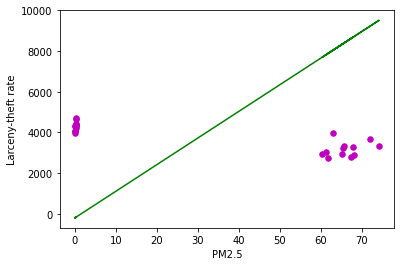

Chicago Annual Variance PM2.5 vs Larceny-theft rate
Estimated coefficients:
b_0 = 2583744128.829997
b_1 = 31.281866151347483


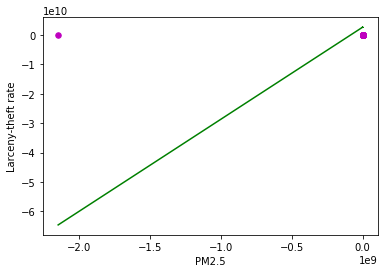

Minimum: [2147483647, 56, 46, 35, 64, 84, 86, 68, 74, 57, 62, 91, 83, 68, 1, 21, 24, 24, 18, 20, 14, 20, 24, 22, 29, 27]
Maximum: [0, 56, 46, 35, 64, 84, 86, 68, 74, 57, 62, 91, 83, 68, 157, 155, 158, 153, 152, 152, 186, 120, 156, 117, 116, 134]
Chicago Mean Annual PM2.5 vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -70.451548517927
b_1 = 40.19363785847547


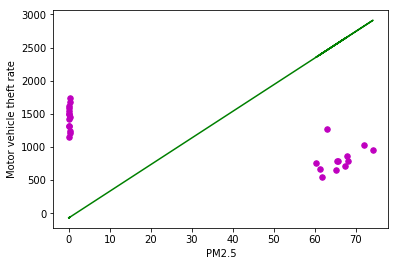

Chicago Annual Variance PM2.5 vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 781552256.5435065
b_1 = 9.462397021911043


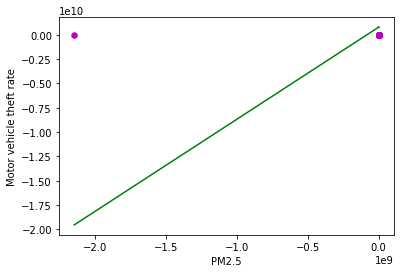

Minimum: [2147483647, 56, 46, 35, 64, 84, 86, 68, 74, 57, 62, 91, 83, 68, 1, 21, 24, 24, 18, 20, 14, 20, 24, 22, 29, 27]
Maximum: [0, 56, 46, 35, 64, 84, 86, 68, 74, 57, 62, 91, 83, 68, 157, 155, 158, 153, 152, 152, 186, 120, 156, 117, 116, 134]
New York
New York Mean Annual Carbon Monoxide vs Violent Crime rate
Estimated coefficients:
b_0 = -2.405646380181679
b_1 = 39.535212812958044


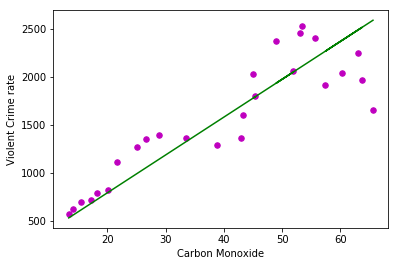

New York Annual Variance Carbon Monoxide vs Violent Crime rate
Estimated coefficients:
b_0 = -6.100354255723005
b_1 = 10.896562539814248


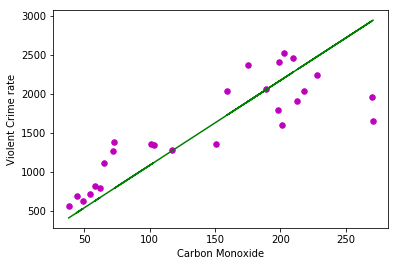

Minimum: [11, 11, 15, 11, 15, 11, 11, 13, 11, 16, 14, 16, 11, 14, 13, 10, 9, 8, 7, 6, 7, 6, 5, 5, 3, 3]
Maximum: [282, 229, 228, 281, 243, 210, 214, 223, 186, 205, 173, 214, 212, 165, 130, 111, 82, 111, 79, 71, 65, 68, 59, 49, 52, 41]
New York Mean Annual Carbon Monoxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.03453177064523061
b_1 = 0.4729538045752887


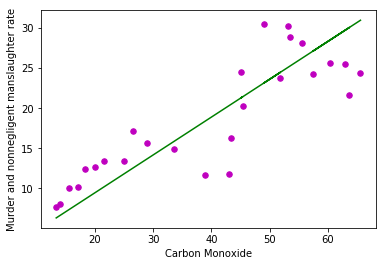

New York Annual Variance Carbon Monoxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.07838649999894187
b_1 = 0.13035153157752555


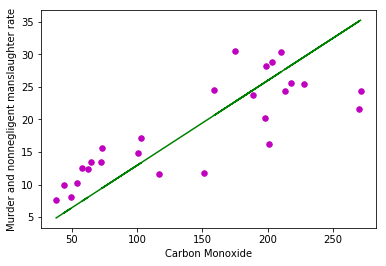

Minimum: [11, 11, 15, 11, 15, 11, 11, 13, 11, 16, 14, 16, 11, 14, 13, 10, 9, 8, 7, 6, 7, 6, 5, 5, 3, 3]
Maximum: [282, 229, 228, 281, 243, 210, 214, 223, 186, 205, 173, 214, 212, 165, 130, 111, 82, 111, 79, 71, 65, 68, 59, 49, 52, 41]
New York Mean Annual Carbon Monoxide vs Legacy rape rate
Estimated coefficients:
b_0 = -0.08752145421522073
b_1 = 1.0925932493600208


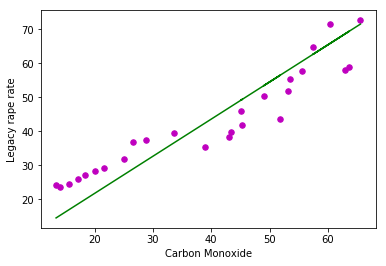

New York Annual Variance Carbon Monoxide vs Legacy rape rate
Estimated coefficients:
b_0 = -0.18852493228563816
b_1 = 0.3011291717923747


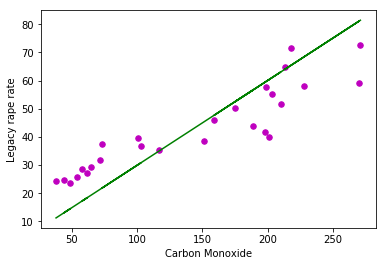

Minimum: [11, 11, 15, 11, 15, 11, 11, 13, 11, 16, 14, 16, 11, 14, 13, 10, 9, 8, 7, 6, 7, 6, 5, 5, 3, 3]
Maximum: [282, 229, 228, 281, 243, 210, 214, 223, 186, 205, 173, 214, 212, 165, 130, 111, 82, 111, 79, 71, 65, 68, 59, 49, 52, 41]
New York Mean Annual Carbon Monoxide vs Robbery rate
Estimated coefficients:
b_0 = -0.6587162680593792
b_1 = 16.220782167659806


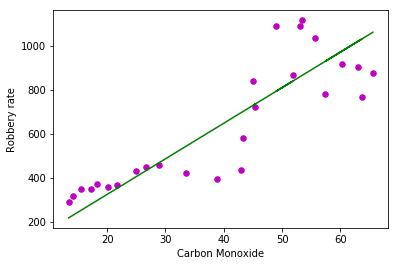

New York Annual Variance Carbon Monoxide vs Robbery rate
Estimated coefficients:
b_0 = -2.035656055554796
b_1 = 4.469746588939647


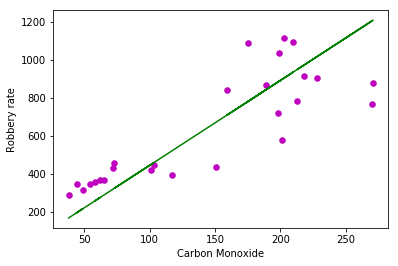

Minimum: [11, 11, 15, 11, 15, 11, 11, 13, 11, 16, 14, 16, 11, 14, 13, 10, 9, 8, 7, 6, 7, 6, 5, 5, 3, 3]
Maximum: [282, 229, 228, 281, 243, 210, 214, 223, 186, 205, 173, 214, 212, 165, 130, 111, 82, 111, 79, 71, 65, 68, 59, 49, 52, 41]
New York Mean Annual Carbon Monoxide vs Aggravated assault rate
Estimated coefficients:
b_0 = -1.6244852916017862
b_1 = 21.749069116866433


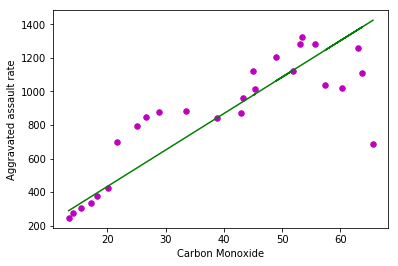

New York Annual Variance Carbon Monoxide vs Aggravated assault rate
Estimated coefficients:
b_0 = -3.797287969265426
b_1 = 5.995385511206908


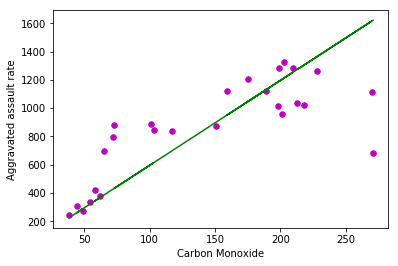

Minimum: [11, 11, 15, 11, 15, 11, 11, 13, 11, 16, 14, 16, 11, 14, 13, 10, 9, 8, 7, 6, 7, 6, 5, 5, 3, 3]
Maximum: [282, 229, 228, 281, 243, 210, 214, 223, 186, 205, 173, 214, 212, 165, 130, 111, 82, 111, 79, 71, 65, 68, 59, 49, 52, 41]
New York Mean Annual Carbon Monoxide vs Property crime rate
Estimated coefficients:
b_0 = -6.035901250903407
b_1 = 121.2752572068547


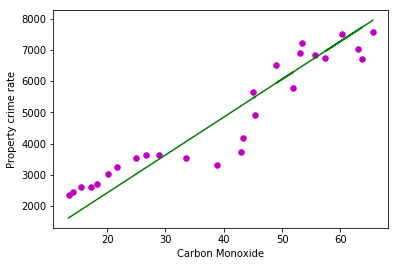

New York Annual Variance Carbon Monoxide vs Property crime rate
Estimated coefficients:
b_0 = -16.487953207495593
b_1 = 33.419319210802165


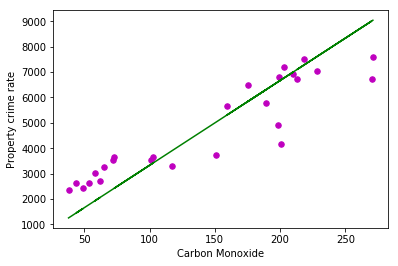

Minimum: [11, 11, 15, 11, 15, 11, 11, 13, 11, 16, 14, 16, 11, 14, 13, 10, 9, 8, 7, 6, 7, 6, 5, 5, 3, 3]
Maximum: [282, 229, 228, 281, 243, 210, 214, 223, 186, 205, 173, 214, 212, 165, 130, 111, 82, 111, 79, 71, 65, 68, 59, 49, 52, 41]
New York Mean Annual Carbon Monoxide vs Burglary rate
Estimated coefficients:
b_0 = 0.1535383198920499
b_1 = 25.987465179287565


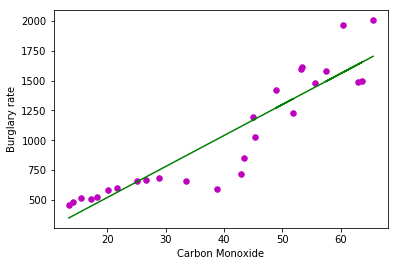

New York Annual Variance Carbon Monoxide vs Burglary rate
Estimated coefficients:
b_0 = -1.7775880182196033
b_1 = 7.159101663121126


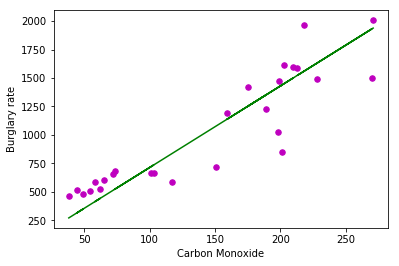

Minimum: [11, 11, 15, 11, 15, 11, 11, 13, 11, 16, 14, 16, 11, 14, 13, 10, 9, 8, 7, 6, 7, 6, 5, 5, 3, 3]
Maximum: [282, 229, 228, 281, 243, 210, 214, 223, 186, 205, 173, 214, 212, 165, 130, 111, 82, 111, 79, 71, 65, 68, 59, 49, 52, 41]
New York Mean Annual Carbon Monoxide vs Larceny-theft rate
Estimated coefficients:
b_0 = -5.365661360319791
b_1 = 65.8983377149827


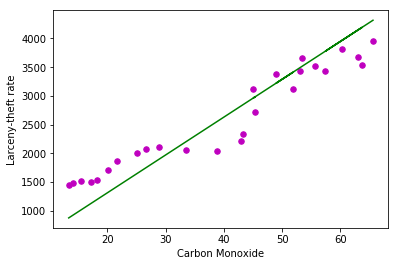

New York Annual Variance Carbon Monoxide vs Larceny-theft rate
Estimated coefficients:
b_0 = -11.427491636140076
b_1 = 18.162003435243115


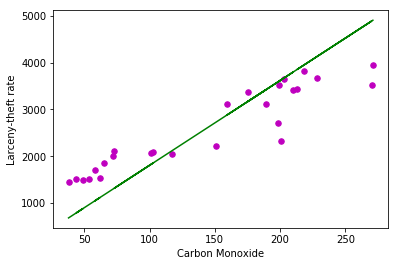

Minimum: [11, 11, 15, 11, 15, 11, 11, 13, 11, 16, 14, 16, 11, 14, 13, 10, 9, 8, 7, 6, 7, 6, 5, 5, 3, 3]
Maximum: [282, 229, 228, 281, 243, 210, 214, 223, 186, 205, 173, 214, 212, 165, 130, 111, 82, 111, 79, 71, 65, 68, 59, 49, 52, 41]
New York Mean Annual Carbon Monoxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -0.8235825391964227
b_1 = 29.3887651716633


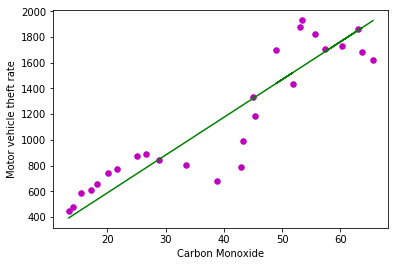

New York Annual Variance Carbon Monoxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -3.282603644472374
b_1 = 8.098024105013781


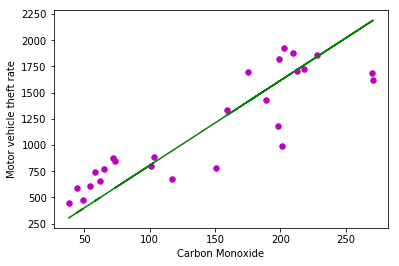

Minimum: [11, 11, 15, 11, 15, 11, 11, 13, 11, 16, 14, 16, 11, 14, 13, 10, 9, 8, 7, 6, 7, 6, 5, 5, 3, 3]
Maximum: [282, 229, 228, 281, 243, 210, 214, 223, 186, 205, 173, 214, 212, 165, 130, 111, 82, 111, 79, 71, 65, 68, 59, 49, 52, 41]
New York Mean Annual Nitrogen Dioxide vs Violent Crime rate
Estimated coefficients:
b_0 = 1.766228723909535
b_1 = 21.276127572026304


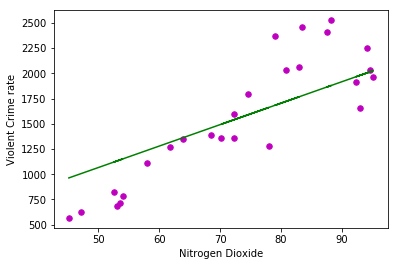

New York Annual Variance Nitrogen Dioxide vs Violent Crime rate
Estimated coefficients:
b_0 = 0.8592561122047755
b_1 = 15.998874094761273


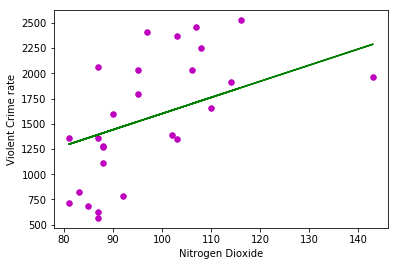

Minimum: [38, 38, 47, 38, 38, 38, 38, 28, 28, 42, 32, 33, 30, 33, 34, 28, 27, 28, 25, 24, 25, 16, 21, 21, 17, 17]
Maximum: [148, 144, 161, 181, 146, 135, 154, 135, 131, 129, 127, 128, 120, 114, 122, 115, 129, 131, 113, 112, 108, 108, 102, 106, 104, 104]
New York Mean Annual Nitrogen Dioxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 0.017974105154525688
b_1 = 0.2544874843652546


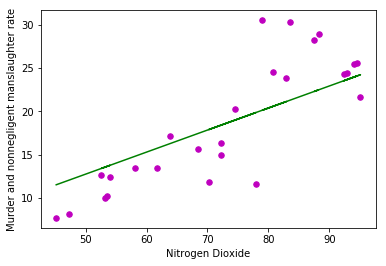

New York Annual Variance Nitrogen Dioxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 0.010901726388699018
b_1 = 0.19132641899084182


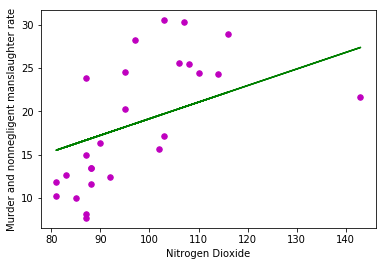

Minimum: [38, 38, 47, 38, 38, 38, 38, 28, 28, 42, 32, 33, 30, 33, 34, 28, 27, 28, 25, 24, 25, 16, 21, 21, 17, 17]
Maximum: [148, 144, 161, 181, 146, 135, 154, 135, 131, 129, 127, 128, 120, 114, 122, 115, 129, 131, 113, 112, 108, 108, 102, 106, 104, 104]
New York Mean Annual Nitrogen Dioxide vs Legacy rape rate
Estimated coefficients:
b_0 = 0.0382376056979723
b_1 = 0.587842538918363


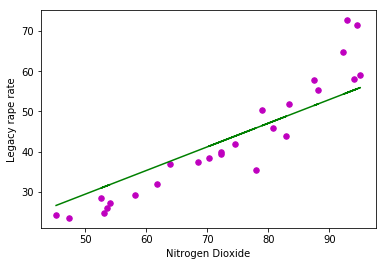

New York Annual Variance Nitrogen Dioxide vs Legacy rape rate
Estimated coefficients:
b_0 = 0.025594892640441458
b_1 = 0.4419082571507524


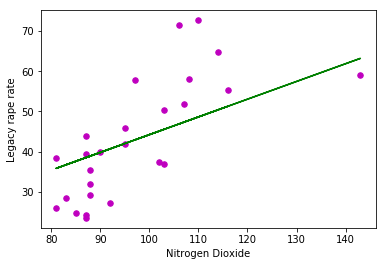

Minimum: [38, 38, 47, 38, 38, 38, 38, 28, 28, 42, 32, 33, 30, 33, 34, 28, 27, 28, 25, 24, 25, 16, 21, 21, 17, 17]
Maximum: [148, 144, 161, 181, 146, 135, 154, 135, 131, 129, 127, 128, 120, 114, 122, 115, 129, 131, 113, 112, 108, 108, 102, 106, 104, 104]
New York Mean Annual Nitrogen Dioxide vs Robbery rate
Estimated coefficients:
b_0 = 0.833191040665838
b_1 = 8.732331058084863


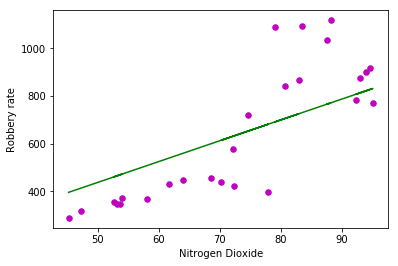

New York Annual Variance Nitrogen Dioxide vs Robbery rate
Estimated coefficients:
b_0 = 0.45440666386002704
b_1 = 6.566462713729544


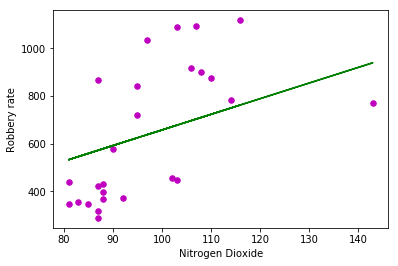

Minimum: [38, 38, 47, 38, 38, 38, 38, 28, 28, 42, 32, 33, 30, 33, 34, 28, 27, 28, 25, 24, 25, 16, 21, 21, 17, 17]
Maximum: [148, 144, 161, 181, 146, 135, 154, 135, 131, 129, 127, 128, 120, 114, 122, 115, 129, 131, 113, 112, 108, 108, 102, 106, 104, 104]
New York Mean Annual Nitrogen Dioxide vs Aggravated assault rate
Estimated coefficients:
b_0 = 0.8770382043032896
b_1 = 11.701569060349186


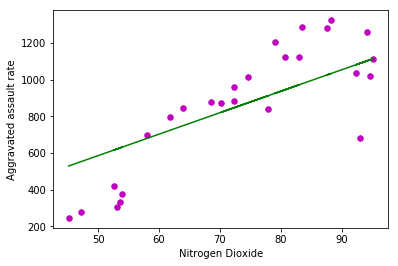

New York Annual Variance Nitrogen Dioxide vs Aggravated assault rate
Estimated coefficients:
b_0 = 0.3684226913509292
b_1 = 8.799255255657899


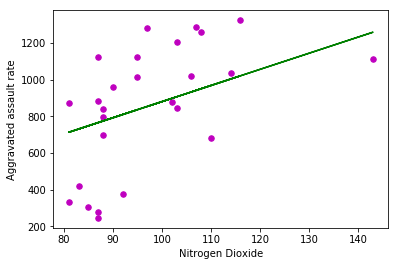

Minimum: [38, 38, 47, 38, 38, 38, 38, 28, 28, 42, 32, 33, 30, 33, 34, 28, 27, 28, 25, 24, 25, 16, 21, 21, 17, 17]
Maximum: [148, 144, 161, 181, 146, 135, 154, 135, 131, 129, 127, 128, 120, 114, 122, 115, 129, 131, 113, 112, 108, 108, 102, 106, 104, 104]
New York Mean Annual Nitrogen Dioxide vs Property crime rate
Estimated coefficients:
b_0 = 5.8590247489064495
b_1 = 65.27742926002654


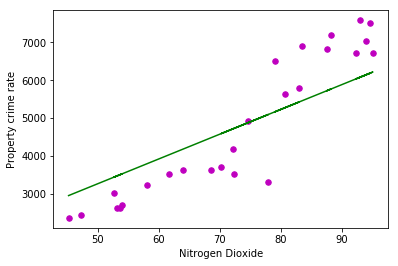

New York Annual Variance Nitrogen Dioxide vs Property crime rate
Estimated coefficients:
b_0 = 3.7196833851367046
b_1 = 49.079622763371546


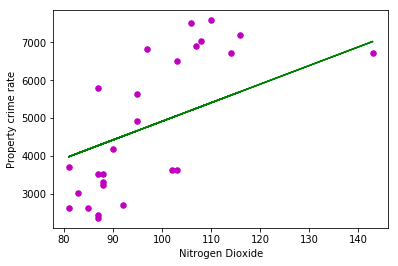

Minimum: [38, 38, 47, 38, 38, 38, 38, 28, 28, 42, 32, 33, 30, 33, 34, 28, 27, 28, 25, 24, 25, 16, 21, 21, 17, 17]
Maximum: [148, 144, 161, 181, 146, 135, 154, 135, 131, 129, 127, 128, 120, 114, 122, 115, 129, 131, 113, 112, 108, 108, 102, 106, 104, 104]
New York Mean Annual Nitrogen Dioxide vs Burglary rate
Estimated coefficients:
b_0 = 1.935580392761608
b_1 = 13.998487652454852


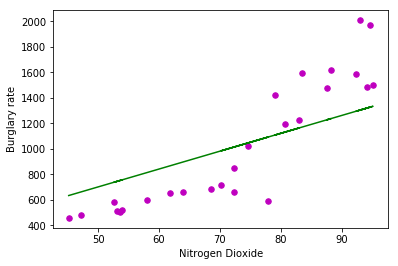

New York Annual Variance Nitrogen Dioxide vs Burglary rate
Estimated coefficients:
b_0 = 1.1747186104767025
b_1 = 10.52804491324915


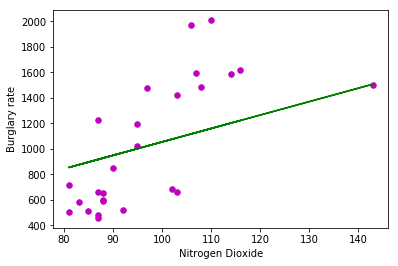

Minimum: [38, 38, 47, 38, 38, 38, 38, 28, 28, 42, 32, 33, 30, 33, 34, 28, 27, 28, 25, 24, 25, 16, 21, 21, 17, 17]
Maximum: [148, 144, 161, 181, 146, 135, 154, 135, 131, 129, 127, 128, 120, 114, 122, 115, 129, 131, 113, 112, 108, 108, 102, 106, 104, 104]
New York Mean Annual Nitrogen Dioxide vs Larceny-theft rate
Estimated coefficients:
b_0 = 2.1747873402659934
b_1 = 35.4555673418934


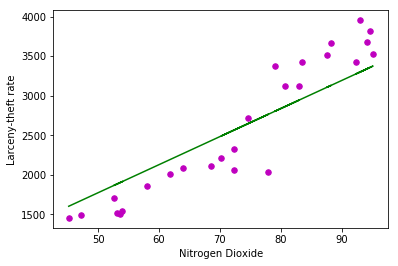

New York Annual Variance Nitrogen Dioxide vs Larceny-theft rate
Estimated coefficients:
b_0 = 1.408629053142704
b_1 = 26.65361698161644


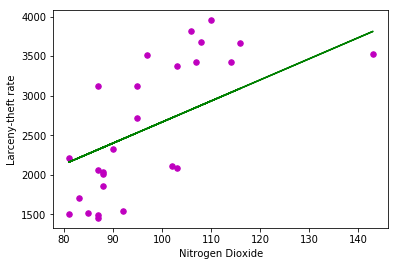

Minimum: [38, 38, 47, 38, 38, 38, 38, 28, 28, 42, 32, 33, 30, 33, 34, 28, 27, 28, 25, 24, 25, 16, 21, 21, 17, 17]
Maximum: [148, 144, 161, 181, 146, 135, 154, 135, 131, 129, 127, 128, 120, 114, 122, 115, 129, 131, 113, 112, 108, 108, 102, 106, 104, 104]
New York Mean Annual Nitrogen Dioxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 1.7487309129371624
b_1 = 15.82300407273233


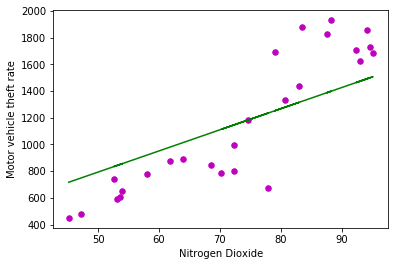

New York Annual Variance Nitrogen Dioxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 1.1363847415393593
b_1 = 11.89768291586206


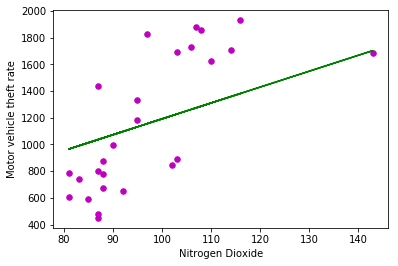

Minimum: [38, 38, 47, 38, 38, 38, 38, 28, 28, 42, 32, 33, 30, 33, 34, 28, 27, 28, 25, 24, 25, 16, 21, 21, 17, 17]
Maximum: [148, 144, 161, 181, 146, 135, 154, 135, 131, 129, 127, 128, 120, 114, 122, 115, 129, 131, 113, 112, 108, 108, 102, 106, 104, 104]
New York Mean Annual Ozone vs Violent Crime rate
Estimated coefficients:
b_0 = 0.3905984681825885
b_1 = 16.20774035528015


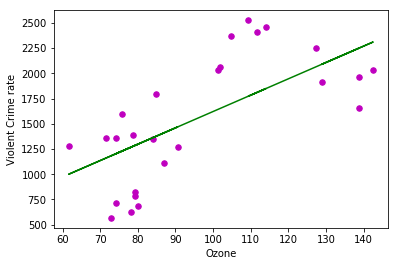

New York Annual Variance Ozone vs Violent Crime rate
Estimated coefficients:
b_0 = 1.7074967577739244
b_1 = 6.531181007657098


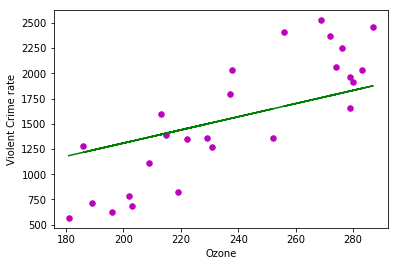

Minimum: [19, 17, 13, 19, 19, 20, 13, 13, 12, 18, 18, 10, 13, 17, 17, 14, 15, 19, 18, 20, 19, 22, 24, 24, 22, 19]
Maximum: [298, 300, 293, 298, 295, 276, 282, 300, 284, 292, 256, 247, 226, 269, 203, 243, 230, 241, 249, 229, 238, 224, 213, 227, 218, 200]
New York Mean Annual Ozone vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 0.010189818583768329
b_1 = 0.1937731343620052


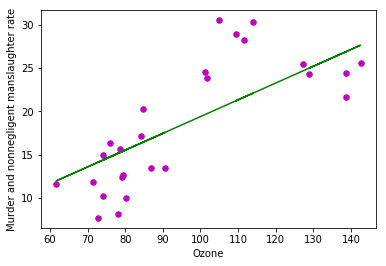

New York Annual Variance Ozone vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 0.0208350384619429
b_1 = 0.07810559964383837


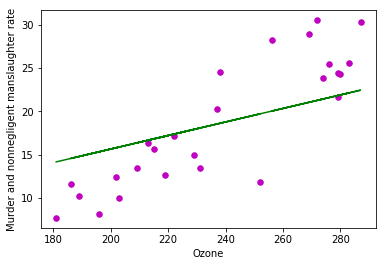

Minimum: [19, 17, 13, 19, 19, 20, 13, 13, 12, 18, 18, 10, 13, 17, 17, 14, 15, 19, 18, 20, 19, 22, 24, 24, 22, 19]
Maximum: [298, 300, 293, 298, 295, 276, 282, 300, 284, 292, 256, 247, 226, 269, 203, 243, 230, 241, 249, 229, 238, 224, 213, 227, 218, 200]
New York Mean Annual Ozone vs Legacy rape rate
Estimated coefficients:
b_0 = 0.025120668662054868
b_1 = 0.4475472448695779


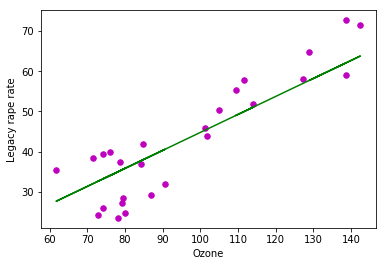

New York Annual Variance Ozone vs Legacy rape rate
Estimated coefficients:
b_0 = 0.03813344428971277
b_1 = 0.18044496202824464


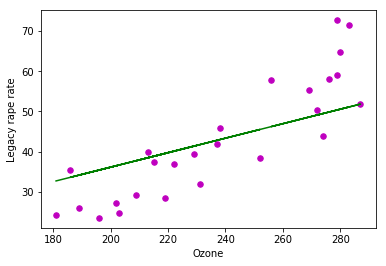

Minimum: [19, 17, 13, 19, 19, 20, 13, 13, 12, 18, 18, 10, 13, 17, 17, 14, 15, 19, 18, 20, 19, 22, 24, 24, 22, 19]
Maximum: [298, 300, 293, 298, 295, 276, 282, 300, 284, 292, 256, 247, 226, 269, 203, 243, 230, 241, 249, 229, 238, 224, 213, 227, 218, 200]
New York Mean Annual Ozone vs Robbery rate
Estimated coefficients:
b_0 = 0.572776581015205
b_1 = 6.648945400148867


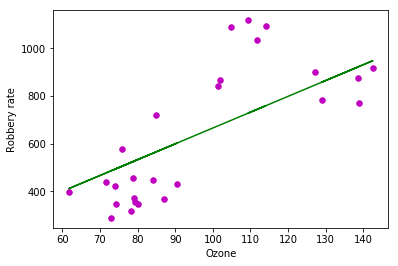

New York Annual Variance Ozone vs Robbery rate
Estimated coefficients:
b_0 = 0.8620227050545282
b_1 = 2.6803605973237143


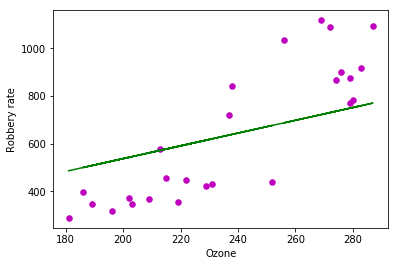

Minimum: [19, 17, 13, 19, 19, 20, 13, 13, 12, 18, 18, 10, 13, 17, 17, 14, 15, 19, 18, 20, 19, 22, 24, 24, 22, 19]
Maximum: [298, 300, 293, 298, 295, 276, 282, 300, 284, 292, 256, 247, 226, 269, 203, 243, 230, 241, 249, 229, 238, 224, 213, 227, 218, 200]
New York Mean Annual Ozone vs Aggravated assault rate
Estimated coefficients:
b_0 = -0.2173130758269508
b_1 = 8.917553025386063


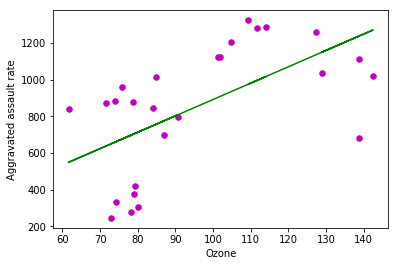

New York Annual Variance Ozone vs Aggravated assault rate
Estimated coefficients:
b_0 = 0.7866287304798334
b_1 = 3.592301708435734


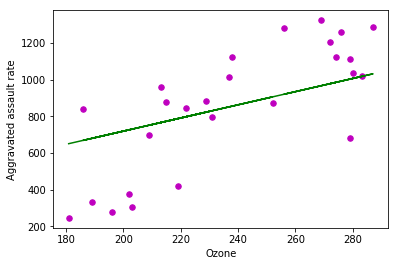

Minimum: [19, 17, 13, 19, 19, 20, 13, 13, 12, 18, 18, 10, 13, 17, 17, 14, 15, 19, 18, 20, 19, 22, 24, 24, 22, 19]
Maximum: [298, 300, 293, 298, 295, 276, 282, 300, 284, 292, 256, 247, 226, 269, 203, 243, 230, 241, 249, 229, 238, 224, 213, 227, 218, 200]
New York Mean Annual Ozone vs Property crime rate
Estimated coefficients:
b_0 = 4.743676173056883
b_1 = 49.69466856238926


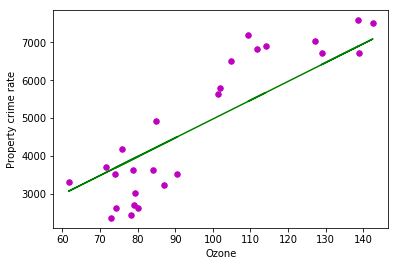

New York Annual Variance Ozone vs Property crime rate
Estimated coefficients:
b_0 = 5.811269257176718
b_1 = 20.037802654899366


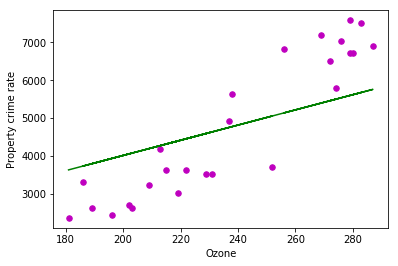

Minimum: [19, 17, 13, 19, 19, 20, 13, 13, 12, 18, 18, 10, 13, 17, 17, 14, 15, 19, 18, 20, 19, 22, 24, 24, 22, 19]
Maximum: [298, 300, 293, 298, 295, 276, 282, 300, 284, 292, 256, 247, 226, 269, 203, 243, 230, 241, 249, 229, 238, 224, 213, 227, 218, 200]
New York Mean Annual Ozone vs Burglary rate
Estimated coefficients:
b_0 = 2.0246604759108777
b_1 = 10.653400049800402


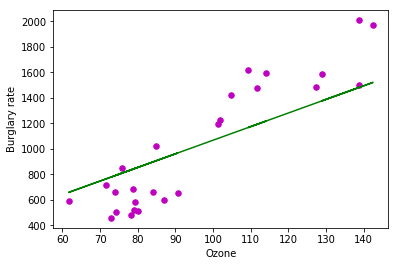

New York Annual Variance Ozone vs Burglary rate
Estimated coefficients:
b_0 = 1.7338180639990242
b_1 = 4.297834018186179


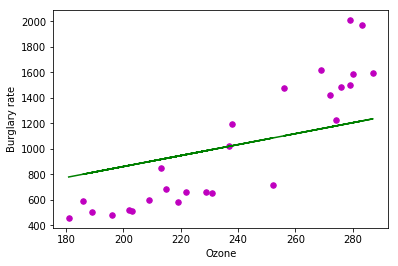

Minimum: [19, 17, 13, 19, 19, 20, 13, 13, 12, 18, 18, 10, 13, 17, 17, 14, 15, 19, 18, 20, 19, 22, 24, 24, 22, 19]
Maximum: [298, 300, 293, 298, 295, 276, 282, 300, 284, 292, 256, 247, 226, 269, 203, 243, 230, 241, 249, 229, 238, 224, 213, 227, 218, 200]
New York Mean Annual Ozone vs Larceny-theft rate
Estimated coefficients:
b_0 = 1.2203454850841808
b_1 = 26.99539803205816


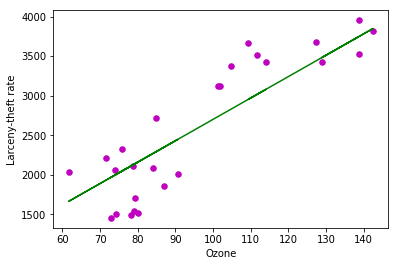

New York Annual Variance Ozone vs Larceny-theft rate
Estimated coefficients:
b_0 = 2.381879092127292
b_1 = 10.882592058216721


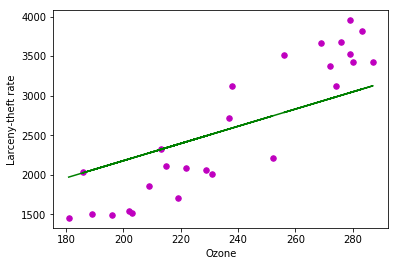

Minimum: [19, 17, 13, 19, 19, 20, 13, 13, 12, 18, 18, 10, 13, 17, 17, 14, 15, 19, 18, 20, 19, 22, 24, 24, 22, 19]
Maximum: [298, 300, 293, 298, 295, 276, 282, 300, 284, 292, 256, 247, 226, 269, 203, 243, 230, 241, 249, 229, 238, 224, 213, 227, 218, 200]
New York Mean Annual Ozone vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 1.498669295707714
b_1 = 12.045589505338967


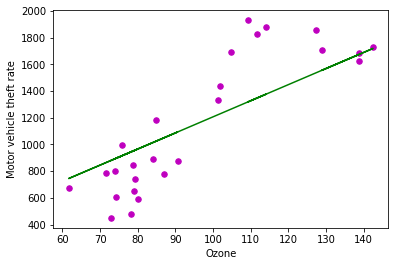

New York Annual Variance Ozone vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 1.6955542023154067
b_1 = 4.857263330215283


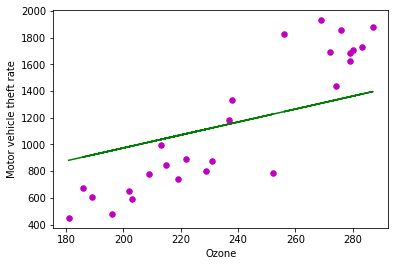

Minimum: [19, 17, 13, 19, 19, 20, 13, 13, 12, 18, 18, 10, 13, 17, 17, 14, 15, 19, 18, 20, 19, 22, 24, 24, 22, 19]
Maximum: [298, 300, 293, 298, 295, 276, 282, 300, 284, 292, 256, 247, 226, 269, 203, 243, 230, 241, 249, 229, 238, 224, 213, 227, 218, 200]
New York Mean Annual Sulfur Dioxide vs Violent Crime rate
Estimated coefficients:
b_0 = -2.6000907948123313
b_1 = 77.94570532061577


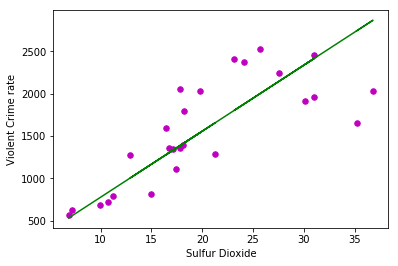

New York Annual Variance Sulfur Dioxide vs Violent Crime rate
Estimated coefficients:
b_0 = -3.619909630442635
b_1 = 16.310079633517937


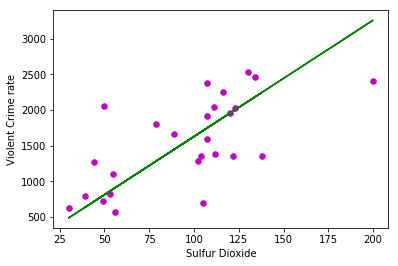

Minimum: [14, 14, 0, 14, 0, 0, 0, 0, 0, 6, 6, 3, 3, 3, 4, 3, 3, 3, 3, 4, 4, 1, 3, 1, 1, 0]
Maximum: [103, 125, 107, 134, 116, 200, 130, 134, 107, 56, 129, 82, 110, 107, 106, 141, 115, 125, 47, 59, 57, 40, 52, 106, 31, 56]
New York Mean Annual Sulfur Dioxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.029083455038644956
b_1 = 0.9320632914116624


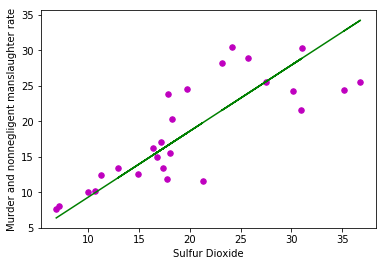

New York Annual Variance Sulfur Dioxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.05187597701077351
b_1 = 0.19514455092759073


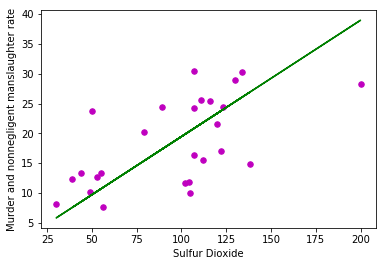

Minimum: [14, 14, 0, 14, 0, 0, 0, 0, 0, 6, 6, 3, 3, 3, 4, 3, 3, 3, 3, 4, 4, 1, 3, 1, 1, 0]
Maximum: [103, 125, 107, 134, 116, 200, 130, 134, 107, 56, 129, 82, 110, 107, 106, 141, 115, 125, 47, 59, 57, 40, 52, 106, 31, 56]
New York Mean Annual Sulfur Dioxide vs Legacy rape rate
Estimated coefficients:
b_0 = -0.05964408340274474
b_1 = 2.1524380802017085


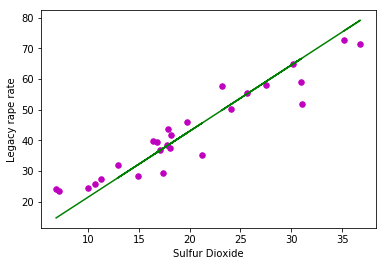

New York Annual Variance Sulfur Dioxide vs Legacy rape rate
Estimated coefficients:
b_0 = -0.14583289172809089
b_1 = 0.45100389008256647


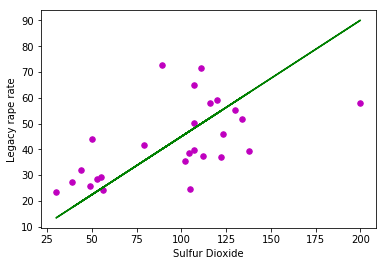

Minimum: [14, 14, 0, 14, 0, 0, 0, 0, 0, 6, 6, 3, 3, 3, 4, 3, 3, 3, 3, 4, 4, 1, 3, 1, 1, 0]
Maximum: [103, 125, 107, 134, 116, 200, 130, 134, 107, 56, 129, 82, 110, 107, 106, 141, 115, 125, 47, 59, 57, 40, 52, 106, 31, 56]
New York Mean Annual Sulfur Dioxide vs Robbery rate
Estimated coefficients:
b_0 = -0.6914544191233745
b_1 = 31.977749813596215


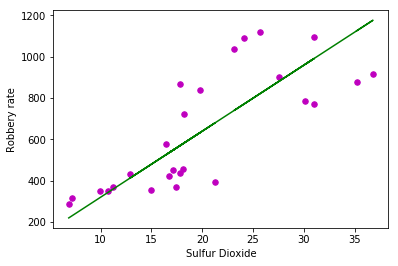

New York Annual Variance Sulfur Dioxide vs Robbery rate
Estimated coefficients:
b_0 = -1.5845517529373865
b_1 = 6.6962926452765394


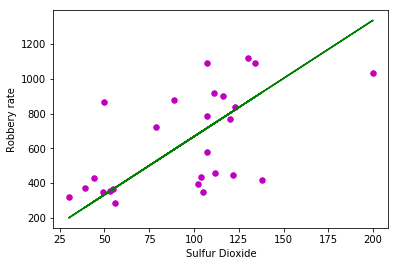

Minimum: [14, 14, 0, 14, 0, 0, 0, 0, 0, 6, 6, 3, 3, 3, 4, 3, 3, 3, 3, 4, 4, 1, 3, 1, 1, 0]
Maximum: [103, 125, 107, 134, 116, 200, 130, 134, 107, 56, 129, 82, 110, 107, 106, 141, 115, 125, 47, 59, 57, 40, 52, 106, 31, 56]
New York Mean Annual Sulfur Dioxide vs Aggravated assault rate
Estimated coefficients:
b_0 = -1.8195727315745671
b_1 = 42.88382264252534


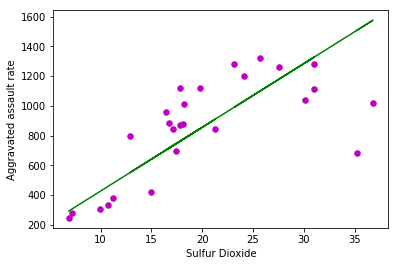

New York Annual Variance Sulfur Dioxide vs Aggravated assault rate
Estimated coefficients:
b_0 = -1.8373863619193571
b_1 = 8.967716376071678


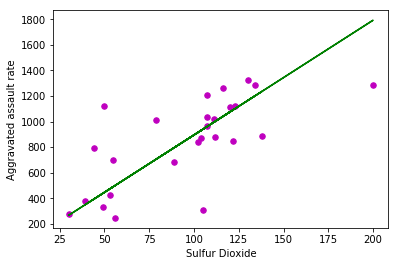

Minimum: [14, 14, 0, 14, 0, 0, 0, 0, 0, 6, 6, 3, 3, 3, 4, 3, 3, 3, 3, 4, 4, 1, 3, 1, 1, 0]
Maximum: [103, 125, 107, 134, 116, 200, 130, 134, 107, 56, 129, 82, 110, 107, 106, 141, 115, 125, 47, 59, 57, 40, 52, 106, 31, 56]
New York Mean Annual Sulfur Dioxide vs Property crime rate
Estimated coefficients:
b_0 = -4.4826004835795175
b_1 = 238.9927147691849


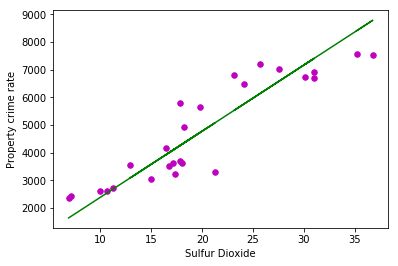

New York Annual Variance Sulfur Dioxide vs Property crime rate
Estimated coefficients:
b_0 = -14.597344124154006
b_1 = 50.08224453957614


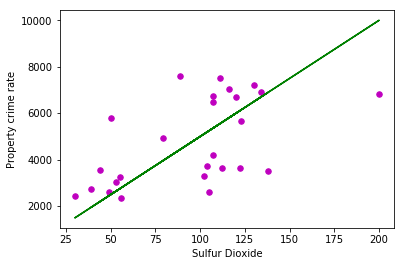

Minimum: [14, 14, 0, 14, 0, 0, 0, 0, 0, 6, 6, 3, 3, 3, 4, 3, 3, 3, 3, 4, 4, 1, 3, 1, 1, 0]
Maximum: [103, 125, 107, 134, 116, 200, 130, 134, 107, 56, 129, 82, 110, 107, 106, 141, 115, 125, 47, 59, 57, 40, 52, 106, 31, 56]
New York Mean Annual Sulfur Dioxide vs Burglary rate
Estimated coefficients:
b_0 = 0.6454754649495271
b_1 = 51.20457787827148


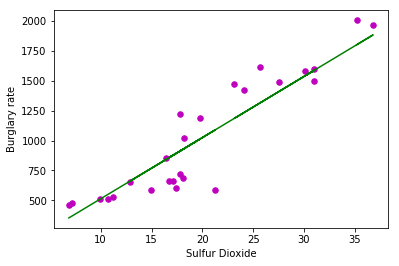

New York Annual Variance Sulfur Dioxide vs Burglary rate
Estimated coefficients:
b_0 = -2.7001889904900054
b_1 = 10.742548313357267


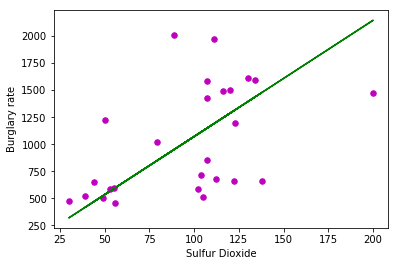

Minimum: [14, 14, 0, 14, 0, 0, 0, 0, 0, 6, 6, 3, 3, 3, 4, 3, 3, 3, 3, 4, 4, 1, 3, 1, 1, 0]
Maximum: [103, 125, 107, 134, 116, 200, 130, 134, 107, 56, 129, 82, 110, 107, 106, 141, 115, 125, 47, 59, 57, 40, 52, 106, 31, 56]
New York Mean Annual Sulfur Dioxide vs Larceny-theft rate
Estimated coefficients:
b_0 = -4.5173885596527725
b_1 = 129.86323191616967


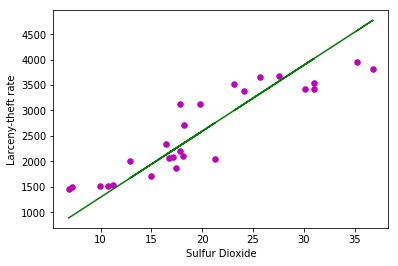

New York Annual Variance Sulfur Dioxide vs Larceny-theft rate
Estimated coefficients:
b_0 = -9.084997190371723
b_1 = 27.203831557997443


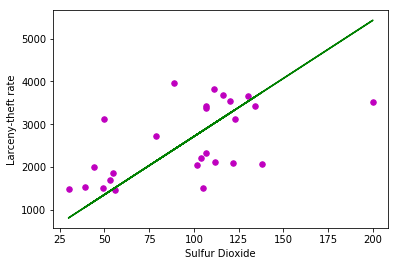

Minimum: [14, 14, 0, 14, 0, 0, 0, 0, 0, 6, 6, 3, 3, 3, 4, 3, 3, 3, 3, 4, 4, 1, 3, 1, 1, 0]
Maximum: [103, 125, 107, 134, 116, 200, 130, 134, 107, 56, 129, 82, 110, 107, 106, 141, 115, 125, 47, 59, 57, 40, 52, 106, 31, 56]
New York Mean Annual Sulfur Dioxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -0.6106678572857618
b_1 = 57.92355529143976


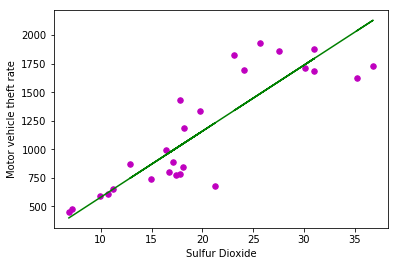

New York Annual Variance Sulfur Dioxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -2.8118313601969476
b_1 = 12.135579216504883


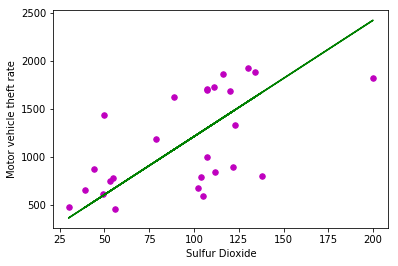

Minimum: [14, 14, 0, 14, 0, 0, 0, 0, 0, 6, 6, 3, 3, 3, 4, 3, 3, 3, 3, 4, 4, 1, 3, 1, 1, 0]
Maximum: [103, 125, 107, 134, 116, 200, 130, 134, 107, 56, 129, 82, 110, 107, 106, 141, 115, 125, 47, 59, 57, 40, 52, 106, 31, 56]
New York Mean Annual PM10 vs Violent Crime rate
Estimated coefficients:
b_0 = -30.168720671728124
b_1 = 71.60942288879906


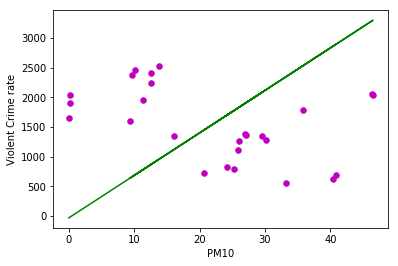

New York Annual Variance PM10 vs Violent Crime rate
Estimated coefficients:
b_0 = 533325409.22538716
b_1 = 6.457064125478474


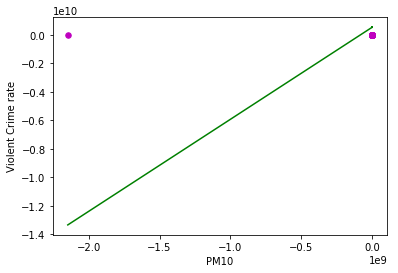

Minimum: [2147483647, 71, 73, 17, 17, 10, 12, 6, 11, 15, 8, 8, 12, 6, 3, 4, 3, 2, 1, 3, 2, 3, 4, 7, 4, 7]
Maximum: [0, 71, 73, 98, 109, 194, 676, 134, 81, 94, 114, 98, 81, 79, 106, 104, 85, 128, 83, 65, 89, 82, 381, 99, 123, 61]
New York Mean Annual PM10 vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.3672101242474426
b_1 = 0.856677757135136


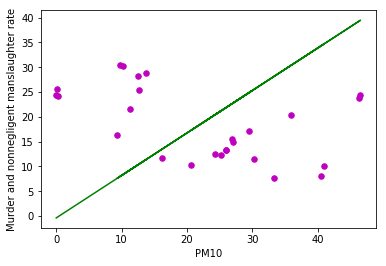

New York Annual Variance PM10 vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 6315161.211563007
b_1 = 0.07645876047989336


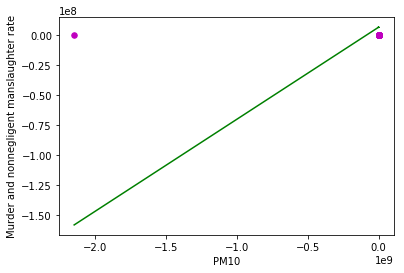

Minimum: [2147483647, 71, 73, 17, 17, 10, 12, 6, 11, 15, 8, 8, 12, 6, 3, 4, 3, 2, 1, 3, 2, 3, 4, 7, 4, 7]
Maximum: [0, 71, 73, 98, 109, 194, 676, 134, 81, 94, 114, 98, 81, 79, 106, 104, 85, 128, 83, 65, 89, 82, 381, 99, 123, 61]
New York Mean Annual PM10 vs Legacy rape rate
Estimated coefficients:
b_0 = -0.8990542442126923
b_1 = 1.980996701456603


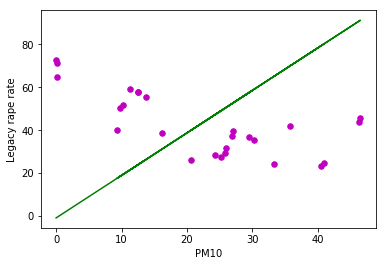

New York Annual Variance PM10 vs Legacy rape rate
Estimated coefficients:
b_0 = 14361277.266338604
b_1 = 0.1738744857480102


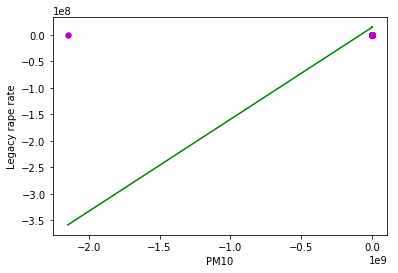

Minimum: [2147483647, 71, 73, 17, 17, 10, 12, 6, 11, 15, 8, 8, 12, 6, 3, 4, 3, 2, 1, 3, 2, 3, 4, 7, 4, 7]
Maximum: [0, 71, 73, 98, 109, 194, 676, 134, 81, 94, 114, 98, 81, 79, 106, 104, 85, 128, 83, 65, 89, 82, 381, 99, 123, 61]
New York Mean Annual PM10 vs Robbery rate
Estimated coefficients:
b_0 = -12.925503394785096
b_1 = 29.420024241347733


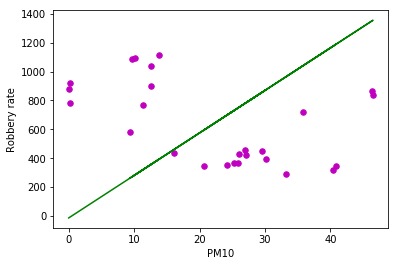

New York Annual Variance PM10 vs Robbery rate
Estimated coefficients:
b_0 = 216227485.76645565
b_1 = 2.617903940677489


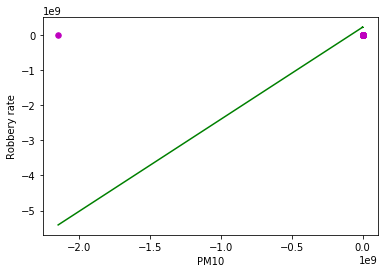

Minimum: [2147483647, 71, 73, 17, 17, 10, 12, 6, 11, 15, 8, 8, 12, 6, 3, 4, 3, 2, 1, 3, 2, 3, 4, 7, 4, 7]
Maximum: [0, 71, 73, 98, 109, 194, 676, 134, 81, 94, 114, 98, 81, 79, 106, 104, 85, 128, 83, 65, 89, 82, 381, 99, 123, 61]
New York Mean Annual PM10 vs Aggravated assault rate
Estimated coefficients:
b_0 = -15.977412514357411
b_1 = 39.352092828741725


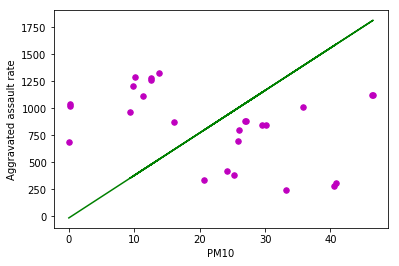

New York Annual Variance PM10 vs Aggravated assault rate
Estimated coefficients:
b_0 = 296424239.0854595
b_1 = 3.5888602830016967


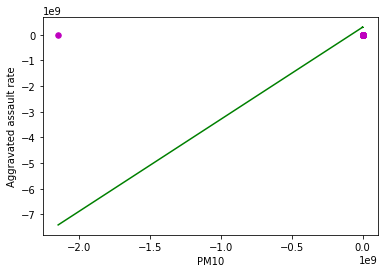

Minimum: [2147483647, 71, 73, 17, 17, 10, 12, 6, 11, 15, 8, 8, 12, 6, 3, 4, 3, 2, 1, 3, 2, 3, 4, 7, 4, 7]
Maximum: [0, 71, 73, 98, 109, 194, 676, 134, 81, 94, 114, 98, 81, 79, 106, 104, 85, 128, 83, 65, 89, 82, 381, 99, 123, 61]
New York Mean Annual PM10 vs Property crime rate
Estimated coefficients:
b_0 = -99.37711109378961
b_1 = 220.03348844346414


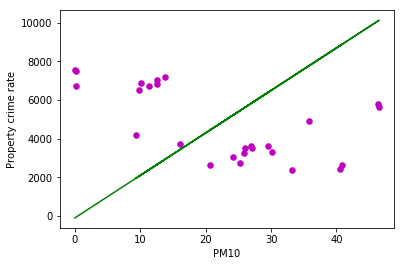

New York Annual Variance PM10 vs Property crime rate
Estimated coefficients:
b_0 = 1602109329.1035516
b_1 = 19.397016997981506


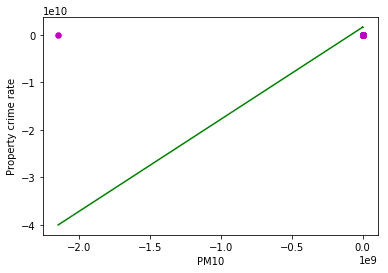

Minimum: [2147483647, 71, 73, 17, 17, 10, 12, 6, 11, 15, 8, 8, 12, 6, 3, 4, 3, 2, 1, 3, 2, 3, 4, 7, 4, 7]
Maximum: [0, 71, 73, 98, 109, 194, 676, 134, 81, 94, 114, 98, 81, 79, 106, 104, 85, 128, 83, 65, 89, 82, 381, 99, 123, 61]
New York Mean Annual PM10 vs Burglary rate
Estimated coefficients:
b_0 = -23.343418755028097
b_1 = 47.307933707168296


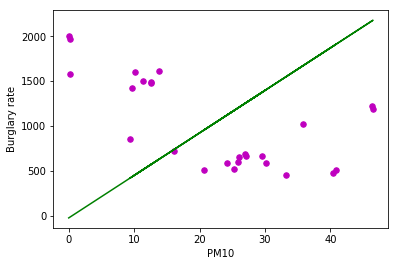

New York Annual Variance PM10 vs Burglary rate
Estimated coefficients:
b_0 = 338555172.15300864
b_1 = 4.098946312450414


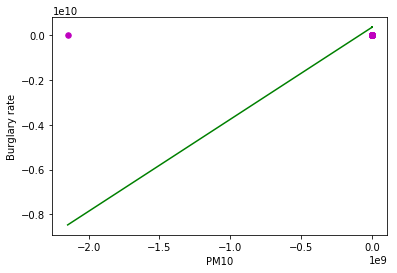

Minimum: [2147483647, 71, 73, 17, 17, 10, 12, 6, 11, 15, 8, 8, 12, 6, 3, 4, 3, 2, 1, 3, 2, 3, 4, 7, 4, 7]
Maximum: [0, 71, 73, 98, 109, 194, 676, 134, 81, 94, 114, 98, 81, 79, 106, 104, 85, 128, 83, 65, 89, 82, 381, 99, 123, 61]
New York Mean Annual PM10 vs Larceny-theft rate
Estimated coefficients:
b_0 = -51.29887206262811
b_1 = 119.34496726758859


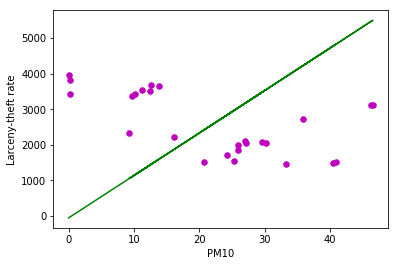

New York Annual Variance PM10 vs Larceny-theft rate
Estimated coefficients:
b_0 = 872094028.503827
b_1 = 10.558594545900421


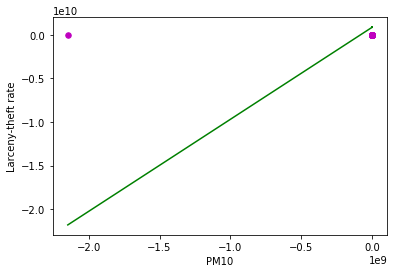

Minimum: [2147483647, 71, 73, 17, 17, 10, 12, 6, 11, 15, 8, 8, 12, 6, 3, 4, 3, 2, 1, 3, 2, 3, 4, 7, 4, 7]
Maximum: [0, 71, 73, 98, 109, 194, 676, 134, 81, 94, 114, 98, 81, 79, 106, 104, 85, 128, 83, 65, 89, 82, 381, 99, 123, 61]
New York Mean Annual PM10 vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -24.73414940055727
b_1 = 53.379339635138635


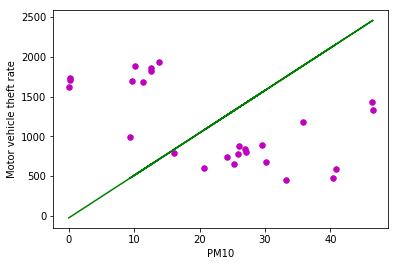

New York Annual Variance PM10 vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 391451866.13263386
b_1 = 4.739376106381789


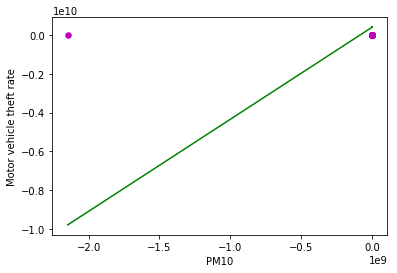

Minimum: [2147483647, 71, 73, 17, 17, 10, 12, 6, 11, 15, 8, 8, 12, 6, 3, 4, 3, 2, 1, 3, 2, 3, 4, 7, 4, 7]
Maximum: [0, 71, 73, 98, 109, 194, 676, 134, 81, 94, 114, 98, 81, 79, 106, 104, 85, 128, 83, 65, 89, 82, 381, 99, 123, 61]
New York Mean Annual PM2.5 vs Violent Crime rate
Estimated coefficients:
b_0 = -101.39516843519164
b_1 = 51.152710942324894


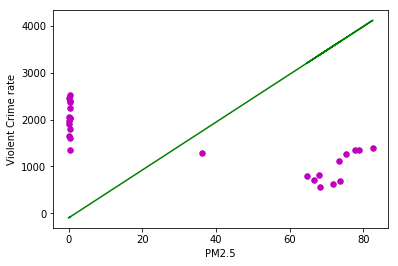

New York Annual Variance PM2.5 vs Violent Crime rate
Estimated coefficients:
b_0 = 904150584.814413
b_1 = 10.94671627197533


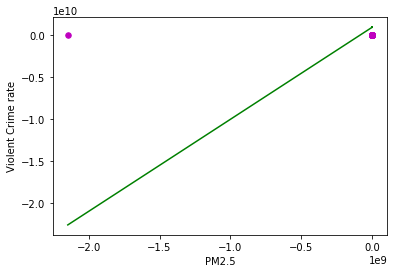

Minimum: [2147483647, 117, 90, 73, 157, 157, 128, 81, 110, 88, 117, 157, 123, 108, 37, 19, 19, 20, 18, 16, 17, 21, 17, 23, 22, 23]
Maximum: [0, 117, 90, 73, 157, 157, 128, 81, 110, 88, 117, 157, 123, 108, 167, 181, 171, 160, 185, 161, 191, 160, 165, 163, 165, 152]
New York Mean Annual PM2.5 vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -1.1950596973493326
b_1 = 0.611200525504714


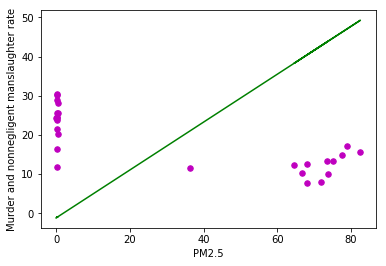

New York Annual Variance PM2.5 vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 10706140.334430898
b_1 = 0.12962119426797947


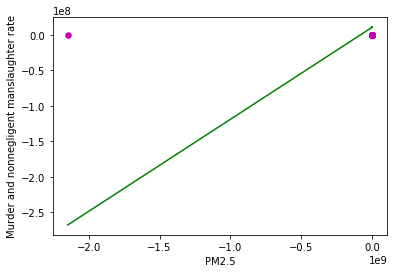

Minimum: [2147483647, 117, 90, 73, 157, 157, 128, 81, 110, 88, 117, 157, 123, 108, 37, 19, 19, 20, 18, 16, 17, 21, 17, 23, 22, 23]
Maximum: [0, 117, 90, 73, 157, 157, 128, 81, 110, 88, 117, 157, 123, 108, 167, 181, 171, 160, 185, 161, 191, 160, 165, 163, 165, 152]
New York Mean Annual PM2.5 vs Legacy rape rate
Estimated coefficients:
b_0 = -2.6866036570515845
b_1 = 1.409431617041979


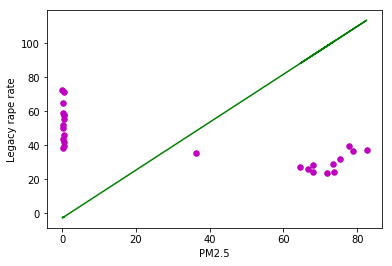

New York Annual Variance PM2.5 vs Legacy rape rate
Estimated coefficients:
b_0 = 24346781.35156718
b_1 = 0.2947709156597347


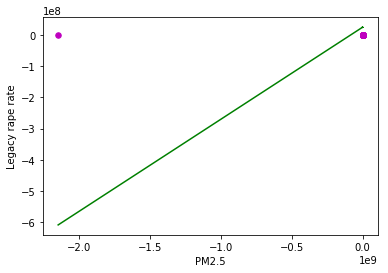

Minimum: [2147483647, 117, 90, 73, 157, 157, 128, 81, 110, 88, 117, 157, 123, 108, 37, 19, 19, 20, 18, 16, 17, 21, 17, 23, 22, 23]
Maximum: [0, 117, 90, 73, 157, 157, 128, 81, 110, 88, 117, 157, 123, 108, 167, 181, 171, 160, 185, 161, 191, 160, 165, 163, 165, 152]
New York Mean Annual PM2.5 vs Robbery rate
Estimated coefficients:
b_0 = -42.89439772308742
b_1 = 21.037416886187767


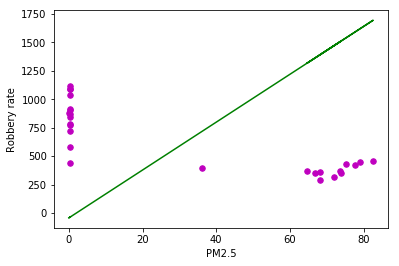

New York Annual Variance PM2.5 vs Robbery rate
Estimated coefficients:
b_0 = 366572081.8827343
b_1 = 4.438155053875194


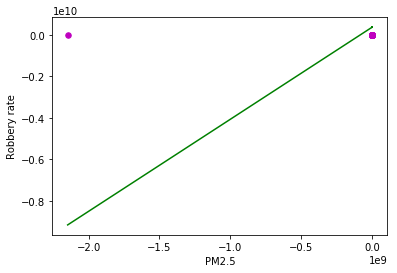

Minimum: [2147483647, 117, 90, 73, 157, 157, 128, 81, 110, 88, 117, 157, 123, 108, 37, 19, 19, 20, 18, 16, 17, 21, 17, 23, 22, 23]
Maximum: [0, 117, 90, 73, 157, 157, 128, 81, 110, 88, 117, 157, 123, 108, 167, 181, 171, 160, 185, 161, 191, 160, 165, 163, 165, 152]
New York Mean Annual PM2.5 vs Aggravated assault rate
Estimated coefficients:
b_0 = -54.620904230836345
b_1 = 28.094955247464583


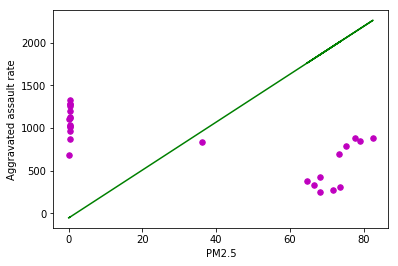

New York Annual Variance PM2.5 vs Aggravated assault rate
Estimated coefficients:
b_0 = 502530250.2986647
b_1 = 6.084225637253682


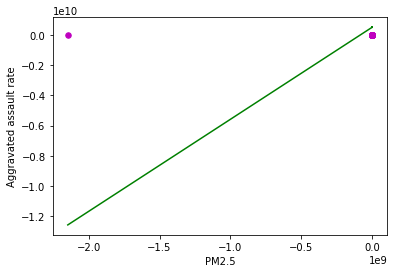

Minimum: [2147483647, 117, 90, 73, 157, 157, 128, 81, 110, 88, 117, 157, 123, 108, 37, 19, 19, 20, 18, 16, 17, 21, 17, 23, 22, 23]
Maximum: [0, 117, 90, 73, 157, 157, 128, 81, 110, 88, 117, 157, 123, 108, 167, 181, 171, 160, 185, 161, 191, 160, 165, 163, 165, 152]
New York Mean Annual PM2.5 vs Property crime rate
Estimated coefficients:
b_0 = -311.30994591632134
b_1 = 156.9623395312834


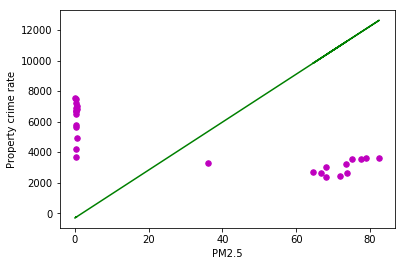

New York Annual Variance PM2.5 vs Property crime rate
Estimated coefficients:
b_0 = 2716067987.657231
b_1 = 32.88393000096274


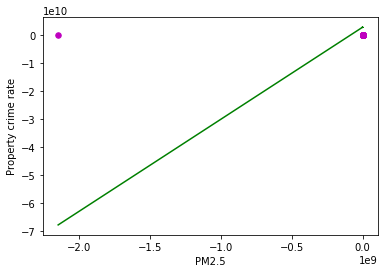

Minimum: [2147483647, 117, 90, 73, 157, 157, 128, 81, 110, 88, 117, 157, 123, 108, 37, 19, 19, 20, 18, 16, 17, 21, 17, 23, 22, 23]
Maximum: [0, 117, 90, 73, 157, 157, 128, 81, 110, 88, 117, 157, 123, 108, 167, 181, 171, 160, 185, 161, 191, 160, 165, 163, 165, 152]
New York Mean Annual PM2.5 vs Burglary rate
Estimated coefficients:
b_0 = -70.1139116164818
b_1 = 33.78465198647673


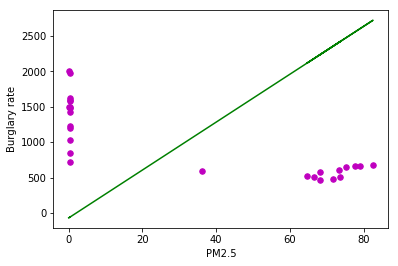

New York Annual Variance PM2.5 vs Burglary rate
Estimated coefficients:
b_0 = 573955121.3093588
b_1 = 6.948979041043779


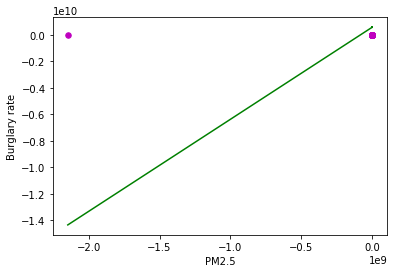

Minimum: [2147483647, 117, 90, 73, 157, 157, 128, 81, 110, 88, 117, 157, 123, 108, 37, 19, 19, 20, 18, 16, 17, 21, 17, 23, 22, 23]
Maximum: [0, 117, 90, 73, 157, 157, 128, 81, 110, 88, 117, 157, 123, 108, 167, 181, 171, 160, 185, 161, 191, 160, 165, 163, 165, 152]
New York Mean Annual PM2.5 vs Larceny-theft rate
Estimated coefficients:
b_0 = -164.10392574477282
b_1 = 85.0691760000713


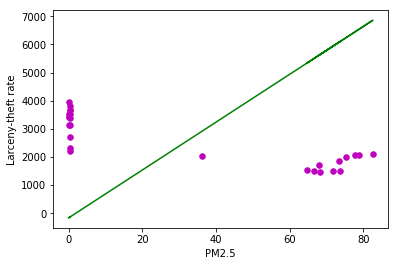

New York Annual Variance PM2.5 vs Larceny-theft rate
Estimated coefficients:
b_0 = 1478467567.244525
b_1 = 17.900076297946597


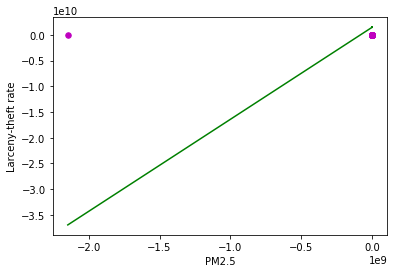

Minimum: [2147483647, 117, 90, 73, 157, 157, 128, 81, 110, 88, 117, 157, 123, 108, 37, 19, 19, 20, 18, 16, 17, 21, 17, 23, 22, 23]
Maximum: [0, 117, 90, 73, 157, 157, 128, 81, 110, 88, 117, 157, 123, 108, 167, 181, 171, 160, 185, 161, 191, 160, 165, 163, 165, 152]
New York Mean Annual PM2.5 vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -77.09068730572108
b_1 = 38.10763535202834


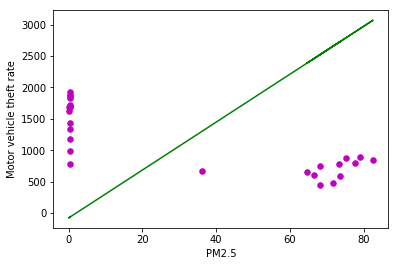

New York Annual Variance PM2.5 vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 663631291.940485
b_1 = 8.03470507472781


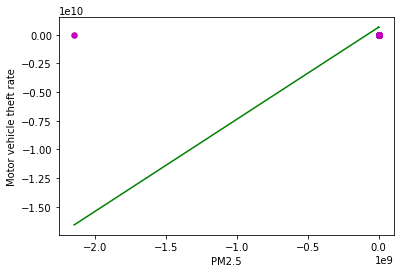

Minimum: [2147483647, 117, 90, 73, 157, 157, 128, 81, 110, 88, 117, 157, 123, 108, 37, 19, 19, 20, 18, 16, 17, 21, 17, 23, 22, 23]
Maximum: [0, 117, 90, 73, 157, 157, 128, 81, 110, 88, 117, 157, 123, 108, 167, 181, 171, 160, 185, 161, 191, 160, 165, 163, 165, 152]
Los Angeles
Los Angeles Mean Annual Carbon Monoxide vs Violent Crime rate
Estimated coefficients:
b_0 = -6.698838577257675
b_1 = 32.5518711668753


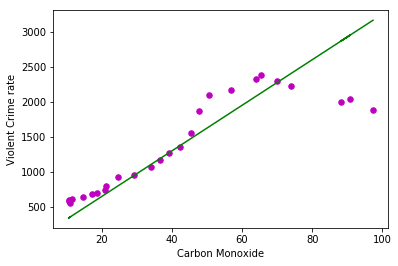

Los Angeles Annual Variance Carbon Monoxide vs Violent Crime rate
Estimated coefficients:
b_0 = -10.976225663417381
b_1 = 17.44052903043954


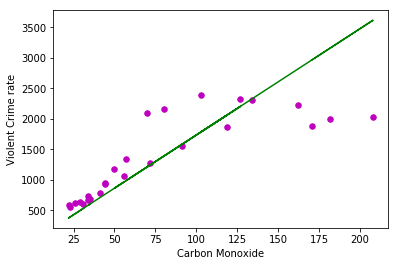

Minimum: [44, 32, 28, 13, 27, 28, 32, 24, 14, 24, 27, 17, 19, 20, 17, 17, 14, 10, 9, 9, 7, 6, 6, 5, 5, 3]
Maximum: [215, 214, 236, 175, 161, 131, 159, 104, 84, 143, 118, 74, 91, 70, 73, 61, 58, 51, 43, 44, 41, 35, 32, 27, 28, 34]
Los Angeles Mean Annual Carbon Monoxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.05329904084571169
b_1 = 0.3543941302270695


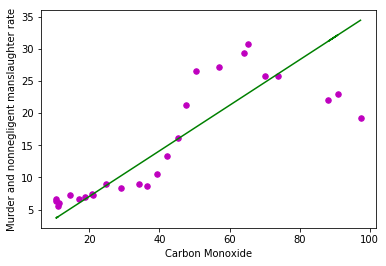

Los Angeles Annual Variance Carbon Monoxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.09951635985109064
b_1 = 0.18987160164113856


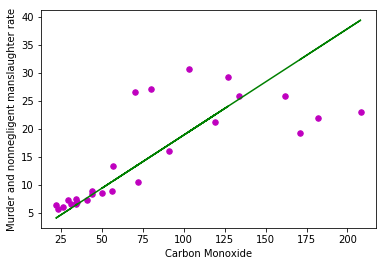

Minimum: [44, 32, 28, 13, 27, 28, 32, 24, 14, 24, 27, 17, 19, 20, 17, 17, 14, 10, 9, 9, 7, 6, 6, 5, 5, 3]
Maximum: [215, 214, 236, 175, 161, 131, 159, 104, 84, 143, 118, 74, 91, 70, 73, 61, 58, 51, 43, 44, 41, 35, 32, 27, 28, 34]
Los Angeles Mean Annual Carbon Monoxide vs Legacy rape rate
Estimated coefficients:
b_0 = -0.1289229536848211
b_1 = 0.6938469883123107


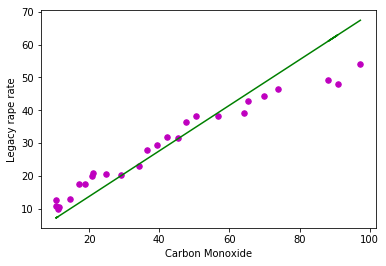

Los Angeles Annual Variance Carbon Monoxide vs Legacy rape rate
Estimated coefficients:
b_0 = -0.21465071813754477
b_1 = 0.37167771084184653


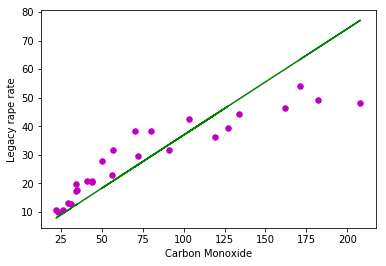

Minimum: [44, 32, 28, 13, 27, 28, 32, 24, 14, 24, 27, 17, 19, 20, 17, 17, 14, 10, 9, 9, 7, 6, 6, 5, 5, 3]
Maximum: [215, 214, 236, 175, 161, 131, 159, 104, 84, 143, 118, 74, 91, 70, 73, 61, 58, 51, 43, 44, 41, 35, 32, 27, 28, 34]
Los Angeles Mean Annual Carbon Monoxide vs Robbery rate
Estimated coefficients:
b_0 = -1.9070129568295897
b_1 = 16.814502101889563


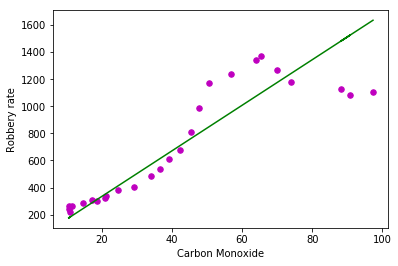

Los Angeles Annual Variance Carbon Monoxide vs Robbery rate
Estimated coefficients:
b_0 = -4.151748255824941
b_1 = 9.009264281003153


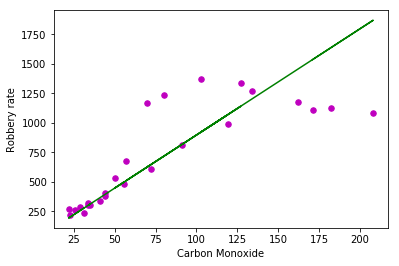

Minimum: [44, 32, 28, 13, 27, 28, 32, 24, 14, 24, 27, 17, 19, 20, 17, 17, 14, 10, 9, 9, 7, 6, 6, 5, 5, 3]
Maximum: [215, 214, 236, 175, 161, 131, 159, 104, 84, 143, 118, 74, 91, 70, 73, 61, 58, 51, 43, 44, 41, 35, 32, 27, 28, 34]
Los Angeles Mean Annual Carbon Monoxide vs Aggravated assault rate
Estimated coefficients:
b_0 = -4.609595849069592
b_1 = 14.689402424580907


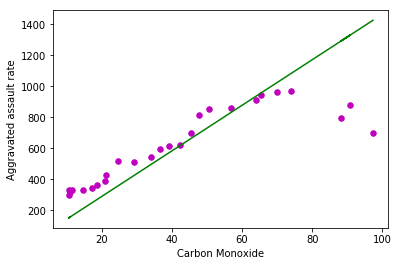

Los Angeles Annual Variance Carbon Monoxide vs Aggravated assault rate
Estimated coefficients:
b_0 = -6.510496976573791
b_1 = 7.869864509237613


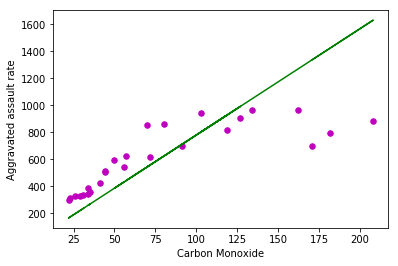

Minimum: [44, 32, 28, 13, 27, 28, 32, 24, 14, 24, 27, 17, 19, 20, 17, 17, 14, 10, 9, 9, 7, 6, 6, 5, 5, 3]
Maximum: [215, 214, 236, 175, 161, 131, 159, 104, 84, 143, 118, 74, 91, 70, 73, 61, 58, 51, 43, 44, 41, 35, 32, 27, 28, 34]
Los Angeles Mean Annual Carbon Monoxide vs Property crime rate
Estimated coefficients:
b_0 = -14.706904983305321
b_1 = 99.41022657408777


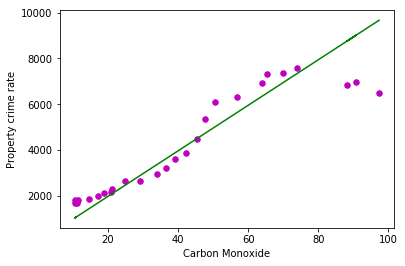

Los Angeles Annual Variance Carbon Monoxide vs Property crime rate
Estimated coefficients:
b_0 = -26.37080285758202
b_1 = 53.243883068115956


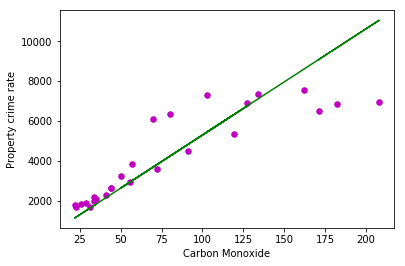

Minimum: [44, 32, 28, 13, 27, 28, 32, 24, 14, 24, 27, 17, 19, 20, 17, 17, 14, 10, 9, 9, 7, 6, 6, 5, 5, 3]
Maximum: [215, 214, 236, 175, 161, 131, 159, 104, 84, 143, 118, 74, 91, 70, 73, 61, 58, 51, 43, 44, 41, 35, 32, 27, 28, 34]
Los Angeles Mean Annual Carbon Monoxide vs Burglary rate
Estimated coefficients:
b_0 = 0.34981802784352567
b_1 = 20.90782909904373


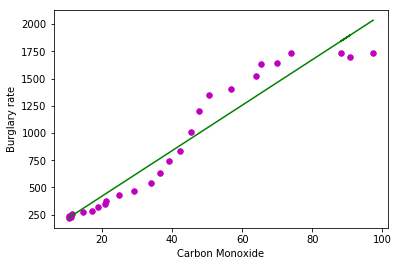

Los Angeles Annual Variance Carbon Monoxide vs Burglary rate
Estimated coefficients:
b_0 = -1.9016996254600826
b_1 = 11.195620630934945


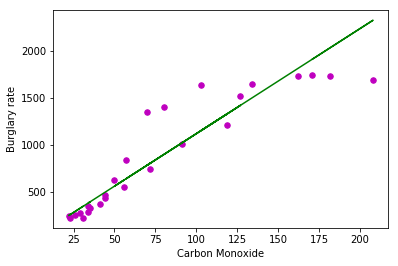

Minimum: [44, 32, 28, 13, 27, 28, 32, 24, 14, 24, 27, 17, 19, 20, 17, 17, 14, 10, 9, 9, 7, 6, 6, 5, 5, 3]
Maximum: [215, 214, 236, 175, 161, 131, 159, 104, 84, 143, 118, 74, 91, 70, 73, 61, 58, 51, 43, 44, 41, 35, 32, 27, 28, 34]
Los Angeles Mean Annual Carbon Monoxide vs Larceny-theft rate
Estimated coefficients:
b_0 = -14.730928669083369
b_1 = 58.43195628732936


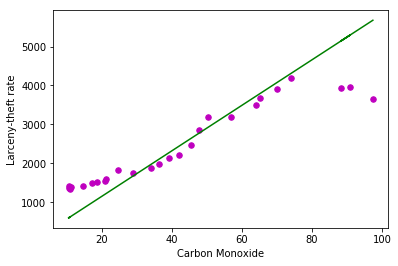

Los Angeles Annual Variance Carbon Monoxide vs Larceny-theft rate
Estimated coefficients:
b_0 = -21.341744476615986
b_1 = 31.29290237476382


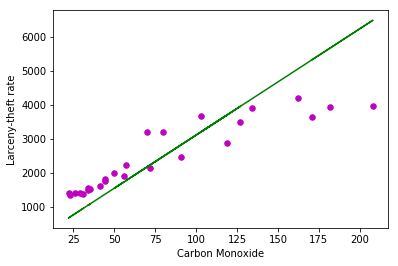

Minimum: [44, 32, 28, 13, 27, 28, 32, 24, 14, 24, 27, 17, 19, 20, 17, 17, 14, 10, 9, 9, 7, 6, 6, 5, 5, 3]
Maximum: [215, 214, 236, 175, 161, 131, 159, 104, 84, 143, 118, 74, 91, 70, 73, 61, 58, 51, 43, 44, 41, 35, 32, 27, 28, 34]
Los Angeles Mean Annual Carbon Monoxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -0.3264487034684862
b_1 = 20.070731427486177


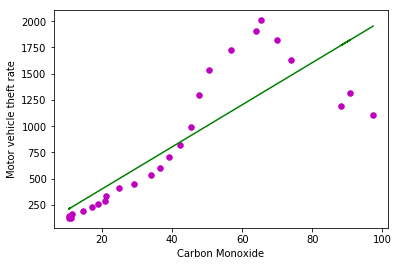

Los Angeles Annual Variance Carbon Monoxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -3.1280179157769226
b_1 = 10.755515142205475


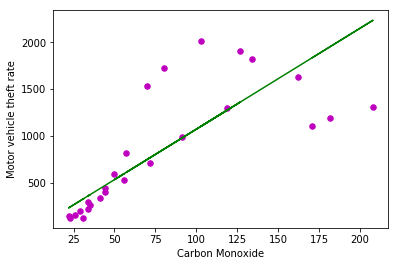

Minimum: [44, 32, 28, 13, 27, 28, 32, 24, 14, 24, 27, 17, 19, 20, 17, 17, 14, 10, 9, 9, 7, 6, 6, 5, 5, 3]
Maximum: [215, 214, 236, 175, 161, 131, 159, 104, 84, 143, 118, 74, 91, 70, 73, 61, 58, 51, 43, 44, 41, 35, 32, 27, 28, 34]
Los Angeles Mean Annual Nitrogen Dioxide vs Violent Crime rate
Estimated coefficients:
b_0 = 2.21087964705589
b_1 = 22.730023592562034


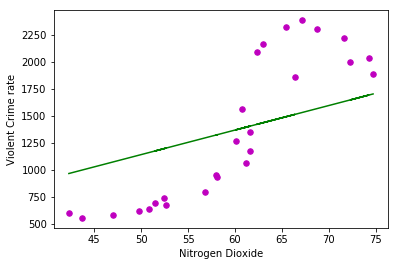

Los Angeles Annual Variance Nitrogen Dioxide vs Violent Crime rate
Estimated coefficients:
b_0 = 0.6999176930810336
b_1 = 14.72815582673049


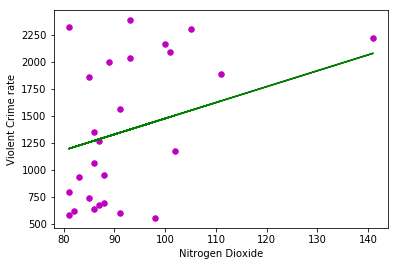

Minimum: [21, 36, 28, 25, 28, 29, 31, 28, 23, 30, 22, 27, 29, 22, 24, 16, 26, 25, 23, 23, 17, 21, 22, 16, 13, 11]
Maximum: [132, 125, 121, 166, 133, 122, 112, 128, 124, 115, 113, 113, 116, 124, 110, 104, 109, 106, 108, 111, 104, 107, 104, 97, 111, 102]
Los Angeles Mean Annual Nitrogen Dioxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 0.027290473849287622
b_1 = 0.24773766993554566


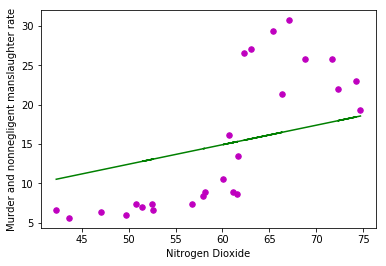

Los Angeles Annual Variance Nitrogen Dioxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 0.009734178801172888
b_1 = 0.16053598973393152


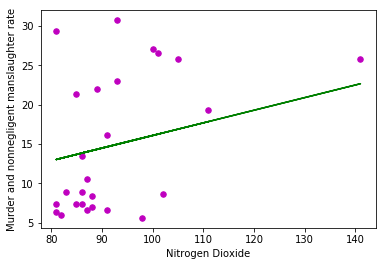

Minimum: [21, 36, 28, 25, 28, 29, 31, 28, 23, 30, 22, 27, 29, 22, 24, 16, 26, 25, 23, 23, 17, 21, 22, 16, 13, 11]
Maximum: [132, 125, 121, 166, 133, 122, 112, 128, 124, 115, 113, 113, 116, 124, 110, 104, 109, 106, 108, 111, 104, 107, 104, 97, 111, 102]
Los Angeles Mean Annual Nitrogen Dioxide vs Legacy rape rate
Estimated coefficients:
b_0 = 0.05034601521988691
b_1 = 0.4846712051527951


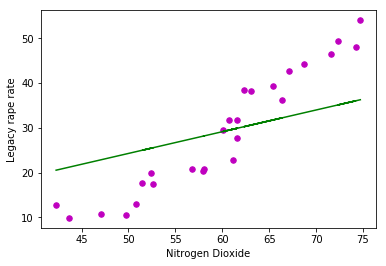

Los Angeles Annual Variance Nitrogen Dioxide vs Legacy rape rate
Estimated coefficients:
b_0 = 0.01612704207039073
b_1 = 0.31406942811585586


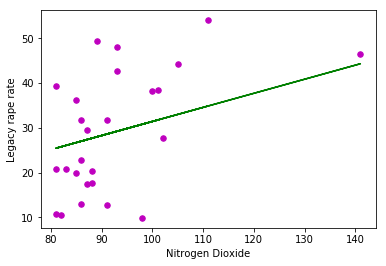

Minimum: [21, 36, 28, 25, 28, 29, 31, 28, 23, 30, 22, 27, 29, 22, 24, 16, 26, 25, 23, 23, 17, 21, 22, 16, 13, 11]
Maximum: [132, 125, 121, 166, 133, 122, 112, 128, 124, 115, 113, 113, 116, 124, 110, 104, 109, 106, 108, 111, 104, 107, 104, 97, 111, 102]
Los Angeles Mean Annual Nitrogen Dioxide vs Robbery rate
Estimated coefficients:
b_0 = 1.459362200834562
b_1 = 11.7617545475629


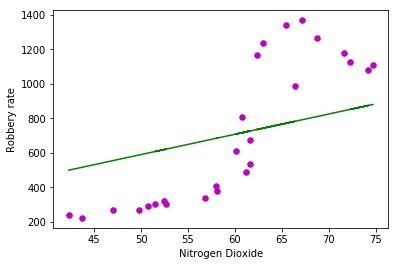

Los Angeles Annual Variance Nitrogen Dioxide vs Robbery rate
Estimated coefficients:
b_0 = 0.5068035576719012
b_1 = 7.6230000447732325


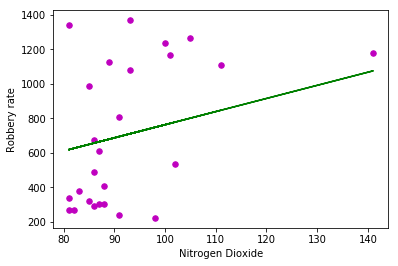

Minimum: [21, 36, 28, 25, 28, 29, 31, 28, 23, 30, 22, 27, 29, 22, 24, 16, 26, 25, 23, 23, 17, 21, 22, 16, 13, 11]
Maximum: [132, 125, 121, 166, 133, 122, 112, 128, 124, 115, 113, 113, 116, 124, 110, 104, 109, 106, 108, 111, 104, 107, 104, 97, 111, 102]
Los Angeles Mean Annual Nitrogen Dioxide vs Aggravated assault rate
Estimated coefficients:
b_0 = 0.6738920375146336
b_1 = 10.236053031657942


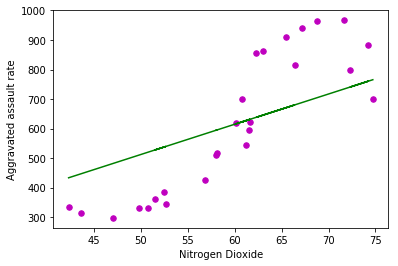

Los Angeles Annual Variance Nitrogen Dioxide vs Aggravated assault rate
Estimated coefficients:
b_0 = 0.16721773061055956
b_1 = 6.630675693046284


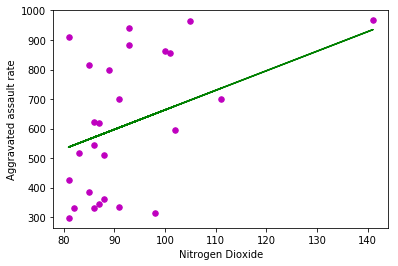

Minimum: [21, 36, 28, 25, 28, 29, 31, 28, 23, 30, 22, 27, 29, 22, 24, 16, 26, 25, 23, 23, 17, 21, 22, 16, 13, 11]
Maximum: [132, 125, 121, 166, 133, 122, 112, 128, 124, 115, 113, 113, 116, 124, 110, 104, 109, 106, 108, 111, 104, 107, 104, 97, 111, 102]
Los Angeles Mean Annual Nitrogen Dioxide vs Property crime rate
Estimated coefficients:
b_0 = 7.833175998610386
b_1 = 69.49338731561036


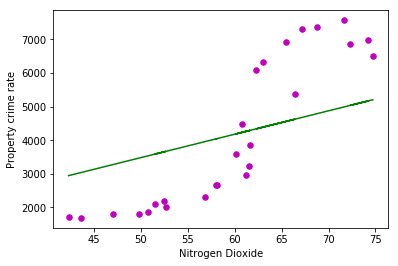

Los Angeles Annual Variance Nitrogen Dioxide vs Property crime rate
Estimated coefficients:
b_0 = 3.1552989806095866
b_1 = 45.029596928989655


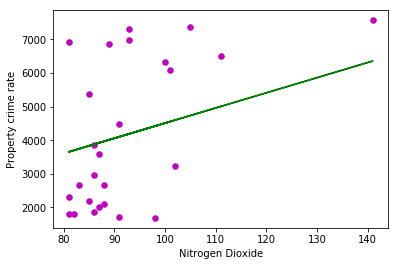

Minimum: [21, 36, 28, 25, 28, 29, 31, 28, 23, 30, 22, 27, 29, 22, 24, 16, 26, 25, 23, 23, 17, 21, 22, 16, 13, 11]
Maximum: [132, 125, 121, 166, 133, 122, 112, 128, 124, 115, 113, 113, 116, 124, 110, 104, 109, 106, 108, 111, 104, 107, 104, 97, 111, 102]
Los Angeles Mean Annual Nitrogen Dioxide vs Burglary rate
Estimated coefficients:
b_0 = 2.397856703584239
b_1 = 14.66080709546575


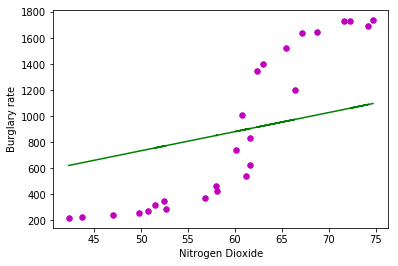

Los Angeles Annual Variance Nitrogen Dioxide vs Burglary rate
Estimated coefficients:
b_0 = 1.028878276972705
b_1 = 9.503893862889926


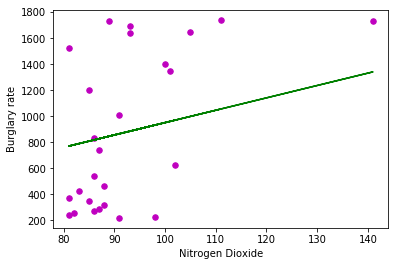

Minimum: [21, 36, 28, 25, 28, 29, 31, 28, 23, 30, 22, 27, 29, 22, 24, 16, 26, 25, 23, 23, 17, 21, 22, 16, 13, 11]
Maximum: [132, 125, 121, 166, 133, 122, 112, 128, 124, 115, 113, 113, 116, 124, 110, 104, 109, 106, 108, 111, 104, 107, 104, 97, 111, 102]
Los Angeles Mean Annual Nitrogen Dioxide vs Larceny-theft rate
Estimated coefficients:
b_0 = 3.1848503389664984
b_1 = 40.769168998716914


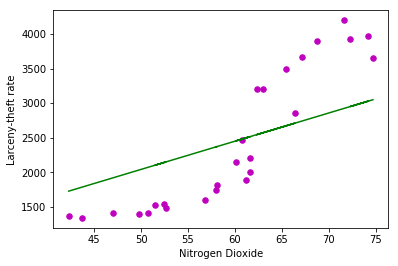

Los Angeles Annual Variance Nitrogen Dioxide vs Larceny-theft rate
Estimated coefficients:
b_0 = 1.235413767423779
b_1 = 26.408571112889206


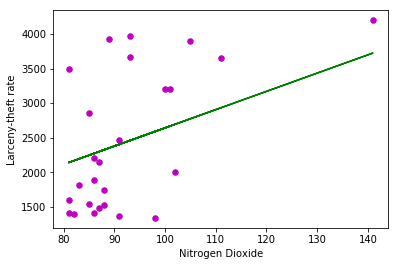

Minimum: [21, 36, 28, 25, 28, 29, 31, 28, 23, 30, 22, 27, 29, 22, 24, 16, 26, 25, 23, 23, 17, 21, 22, 16, 13, 11]
Maximum: [132, 125, 121, 166, 133, 122, 112, 128, 124, 115, 113, 113, 116, 124, 110, 104, 109, 106, 108, 111, 104, 107, 104, 97, 111, 102]
Los Angeles Mean Annual Nitrogen Dioxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 2.2503749323207103
b_1 = 14.063605841645424


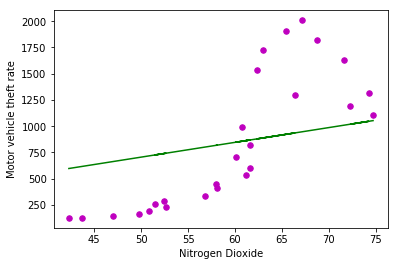

Los Angeles Annual Variance Nitrogen Dioxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 0.8909450772164291
b_1 = 9.117257571008901


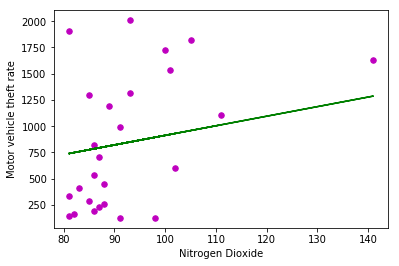

Minimum: [21, 36, 28, 25, 28, 29, 31, 28, 23, 30, 22, 27, 29, 22, 24, 16, 26, 25, 23, 23, 17, 21, 22, 16, 13, 11]
Maximum: [132, 125, 121, 166, 133, 122, 112, 128, 124, 115, 113, 113, 116, 124, 110, 104, 109, 106, 108, 111, 104, 107, 104, 97, 111, 102]
Los Angeles Mean Annual Ozone vs Violent Crime rate
Estimated coefficients:
b_0 = 1.246255599396136
b_1 = 22.278840949862868


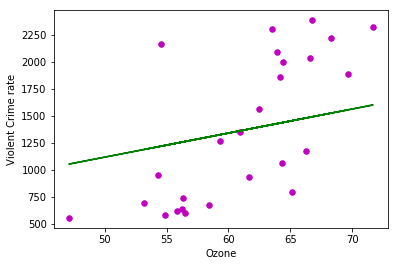

Los Angeles Annual Variance Ozone vs Violent Crime rate
Estimated coefficients:
b_0 = 1.2376692471700608
b_1 = 6.345058445444908


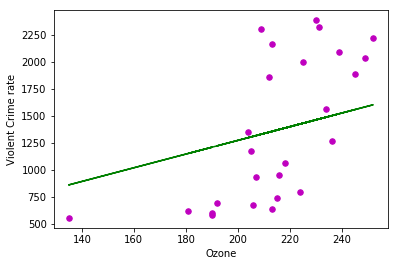

Minimum: [4, 11, 13, 14, 11, 14, 10, 9, 8, 13, 10, 11, 11, 13, 14, 11, 11, 12, 11, 9, 11, 13, 14, 11, 16, 18]
Maximum: [249, 236, 262, 266, 220, 244, 241, 222, 247, 225, 244, 215, 247, 218, 232, 227, 218, 236, 226, 201, 217, 226, 195, 201, 151, 208]
Los Angeles Mean Annual Ozone vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 0.015268834100780282
b_1 = 0.24284488067935084


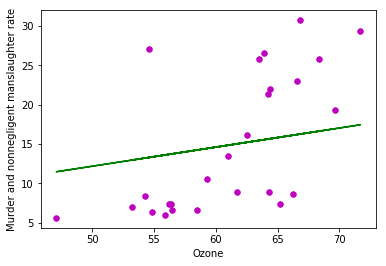

Los Angeles Annual Variance Ozone vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 0.015585483739075201
b_1 = 0.06916079293175087


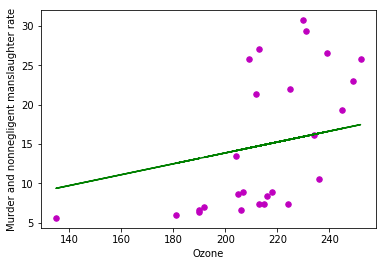

Minimum: [4, 11, 13, 14, 11, 14, 10, 9, 8, 13, 10, 11, 11, 13, 14, 11, 11, 12, 11, 9, 11, 13, 14, 11, 16, 18]
Maximum: [249, 236, 262, 266, 220, 244, 241, 222, 247, 225, 244, 215, 247, 218, 232, 227, 218, 236, 226, 201, 217, 226, 195, 201, 151, 208]
Los Angeles Mean Annual Ozone vs Legacy rape rate
Estimated coefficients:
b_0 = 0.02766275844202326
b_1 = 0.4750853116423542


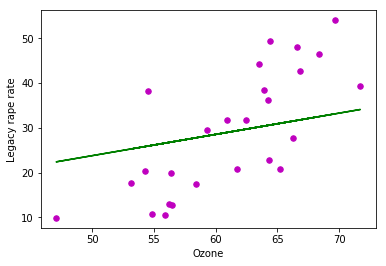

Los Angeles Annual Variance Ozone vs Legacy rape rate
Estimated coefficients:
b_0 = 0.029287444372151583
b_1 = 0.13529680962956814


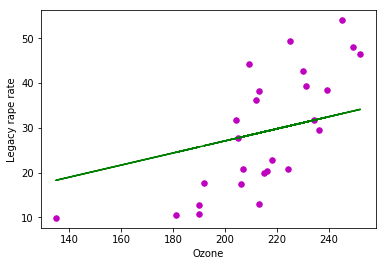

Minimum: [4, 11, 13, 14, 11, 14, 10, 9, 8, 13, 10, 11, 11, 13, 14, 11, 11, 12, 11, 9, 11, 13, 14, 11, 16, 18]
Maximum: [249, 236, 262, 266, 220, 244, 241, 222, 247, 225, 244, 215, 247, 218, 232, 227, 218, 236, 226, 201, 217, 226, 195, 201, 151, 208]
Los Angeles Mean Annual Ozone vs Robbery rate
Estimated coefficients:
b_0 = 0.8042845169478596
b_1 = 11.530843231910245


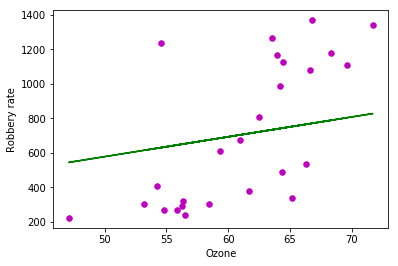

Los Angeles Annual Variance Ozone vs Robbery rate
Estimated coefficients:
b_0 = 0.8114970266254886
b_1 = 3.283952805117167


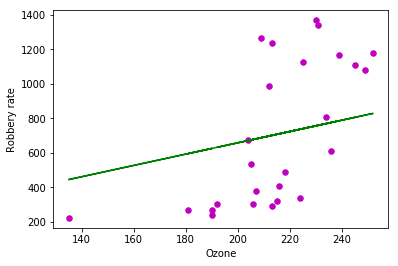

Minimum: [4, 11, 13, 14, 11, 14, 10, 9, 8, 13, 10, 11, 11, 13, 14, 11, 11, 12, 11, 9, 11, 13, 14, 11, 16, 18]
Maximum: [249, 236, 262, 266, 220, 244, 241, 222, 247, 225, 244, 215, 247, 218, 232, 227, 218, 236, 226, 201, 217, 226, 195, 201, 151, 208]
Los Angeles Mean Annual Ozone vs Aggravated assault rate
Estimated coefficients:
b_0 = 0.39901128920234896
b_1 = 10.030257068719223


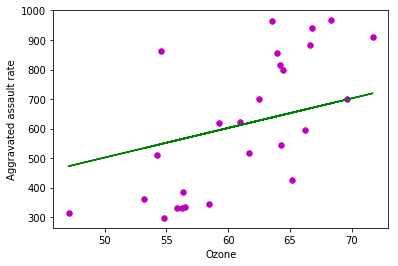

Los Angeles Annual Variance Ozone vs Aggravated assault rate
Estimated coefficients:
b_0 = 0.3813323366895247
b_1 = 2.856701733844206


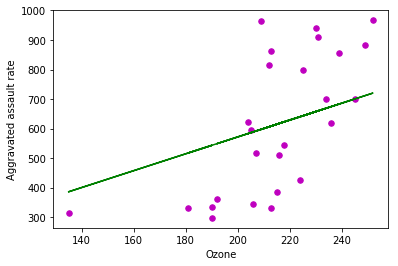

Minimum: [4, 11, 13, 14, 11, 14, 10, 9, 8, 13, 10, 11, 11, 13, 14, 11, 11, 12, 11, 9, 11, 13, 14, 11, 16, 18]
Maximum: [249, 236, 262, 266, 220, 244, 241, 222, 247, 225, 244, 215, 247, 218, 232, 227, 218, 236, 226, 201, 217, 226, 195, 201, 151, 208]
Los Angeles Mean Annual Ozone vs Property crime rate
Estimated coefficients:
b_0 = 4.253879909016177
b_1 = 68.12429471015952


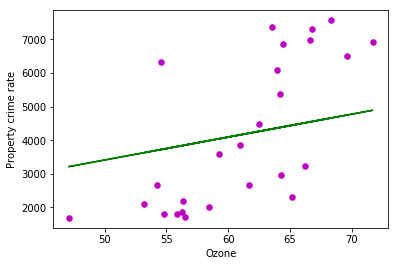

Los Angeles Annual Variance Ozone vs Property crime rate
Estimated coefficients:
b_0 = 4.302708232738951
b_1 = 19.401584919394868


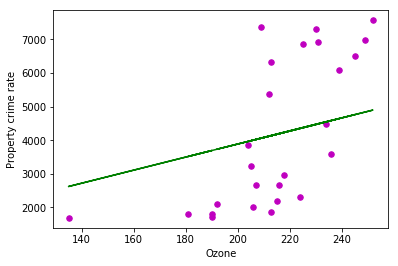

Minimum: [4, 11, 13, 14, 11, 14, 10, 9, 8, 13, 10, 11, 11, 13, 14, 11, 11, 12, 11, 9, 11, 13, 14, 11, 16, 18]
Maximum: [249, 236, 262, 266, 220, 244, 241, 222, 247, 225, 244, 215, 247, 218, 232, 227, 218, 236, 226, 201, 217, 226, 195, 201, 151, 208]
Los Angeles Mean Annual Ozone vs Burglary rate
Estimated coefficients:
b_0 = 1.2492541780603688
b_1 = 14.378421938658697


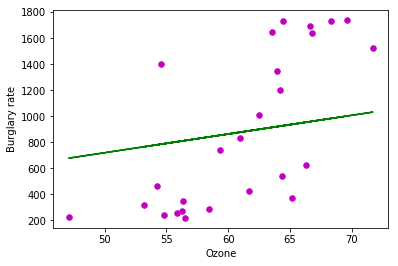

Los Angeles Annual Variance Ozone vs Burglary rate
Estimated coefficients:
b_0 = 1.3161921400957226
b_1 = 4.094665051939959


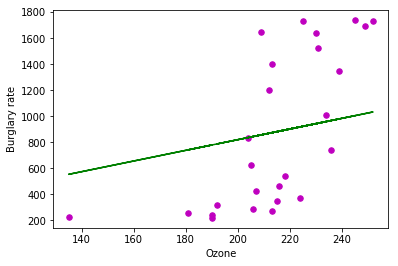

Minimum: [4, 11, 13, 14, 11, 14, 10, 9, 8, 13, 10, 11, 11, 13, 14, 11, 11, 12, 11, 9, 11, 13, 14, 11, 16, 18]
Maximum: [249, 236, 262, 266, 220, 244, 241, 222, 247, 225, 244, 215, 247, 218, 232, 227, 218, 236, 226, 201, 217, 226, 195, 201, 151, 208]
Los Angeles Mean Annual Ozone vs Larceny-theft rate
Estimated coefficients:
b_0 = 1.7637919042945214
b_1 = 39.954850427164544


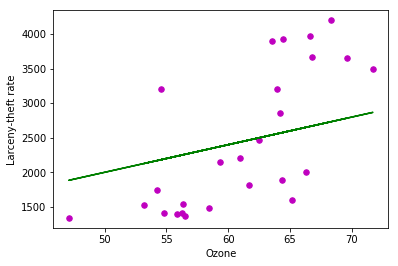

Los Angeles Annual Variance Ozone vs Larceny-theft rate
Estimated coefficients:
b_0 = 1.729278191568028
b_1 = 11.379310494887674


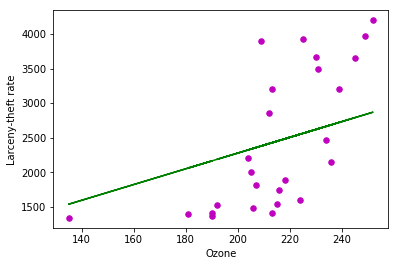

Minimum: [4, 11, 13, 14, 11, 14, 10, 9, 8, 13, 10, 11, 11, 13, 14, 11, 11, 12, 11, 9, 11, 13, 14, 11, 16, 18]
Maximum: [249, 236, 262, 266, 220, 244, 241, 222, 247, 225, 244, 215, 247, 218, 232, 227, 218, 236, 226, 201, 217, 226, 195, 201, 151, 208]
Los Angeles Mean Annual Ozone vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 1.240791965705057
b_1 = 13.791212111275371


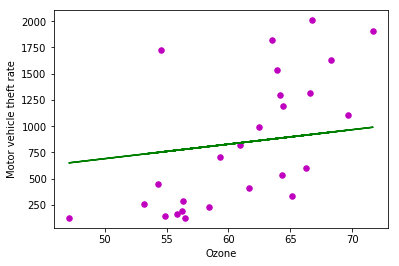

Los Angeles Annual Variance Ozone vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 1.2571768388334021
b_1 = 3.9276635078424573


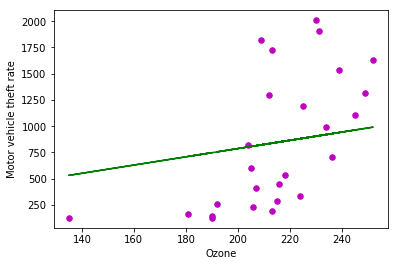

Minimum: [4, 11, 13, 14, 11, 14, 10, 9, 8, 13, 10, 11, 11, 13, 14, 11, 11, 12, 11, 9, 11, 13, 14, 11, 16, 18]
Maximum: [249, 236, 262, 266, 220, 244, 241, 222, 247, 225, 244, 215, 247, 218, 232, 227, 218, 236, 226, 201, 217, 226, 195, 201, 151, 208]
Los Angeles Mean Annual Sulfur Dioxide vs Violent Crime rate
Estimated coefficients:
b_0 = 1.8984208170668353
b_1 = 25.331410579835314


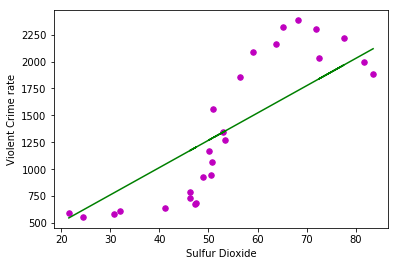

Los Angeles Annual Variance Sulfur Dioxide vs Violent Crime rate
Estimated coefficients:
b_0 = 1.2054736727989166
b_1 = 10.608990901712856


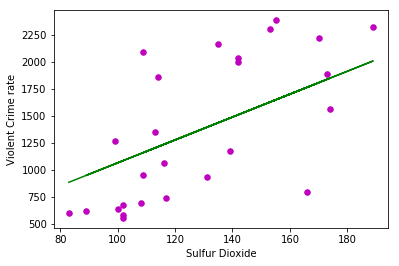

Minimum: [27, 26, 14, 19, 19, 23, 11, 16, 14, 14, 16, 16, 11, 9, 13, 10, 10, 10, 11, 11, 11, 6, 7, 3, 4, 3]
Maximum: [200, 168, 156, 189, 172, 178, 200, 151, 123, 128, 190, 129, 110, 148, 129, 119, 141, 176, 128, 119, 113, 106, 96, 105, 106, 86]
Los Angeles Mean Annual Sulfur Dioxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 0.02908346068013401
b_1 = 0.27599363949930966


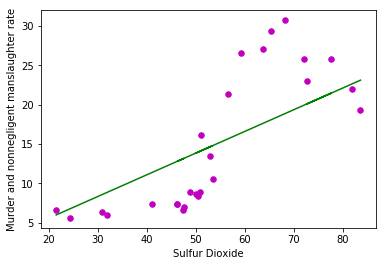

Los Angeles Annual Variance Sulfur Dioxide vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 0.01870316391770288
b_1 = 0.11561035946522802


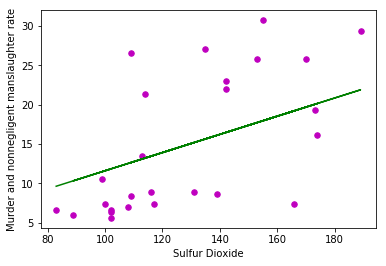

Minimum: [27, 26, 14, 19, 19, 23, 11, 16, 14, 14, 16, 16, 11, 9, 13, 10, 10, 10, 11, 11, 11, 6, 7, 3, 4, 3]
Maximum: [200, 168, 156, 189, 172, 178, 200, 151, 123, 128, 190, 129, 110, 148, 129, 119, 141, 176, 128, 119, 113, 106, 96, 105, 106, 86]
Los Angeles Mean Annual Sulfur Dioxide vs Legacy rape rate
Estimated coefficients:
b_0 = 0.04803381042399835
b_1 = 0.5400593595955817


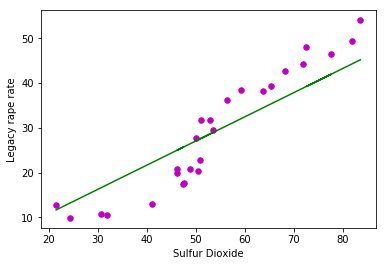

Los Angeles Annual Variance Sulfur Dioxide vs Legacy rape rate
Estimated coefficients:
b_0 = 0.024587491407984885
b_1 = 0.22624871705383925


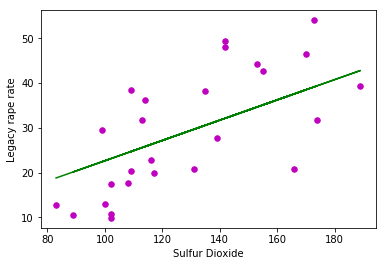

Minimum: [27, 26, 14, 19, 19, 23, 11, 16, 14, 14, 16, 16, 11, 9, 13, 10, 10, 10, 11, 11, 11, 6, 7, 3, 4, 3]
Maximum: [200, 168, 156, 189, 172, 178, 200, 151, 123, 128, 190, 129, 110, 148, 129, 119, 141, 176, 128, 119, 113, 106, 96, 105, 106, 86]
Los Angeles Mean Annual Sulfur Dioxide vs Robbery rate
Estimated coefficients:
b_0 = 1.6705718643910359
b_1 = 13.100902937827655


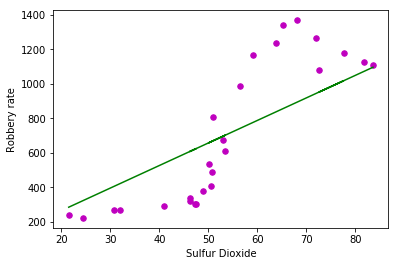

Los Angeles Annual Variance Sulfur Dioxide vs Robbery rate
Estimated coefficients:
b_0 = 1.032219446782733
b_1 = 5.488944266021503


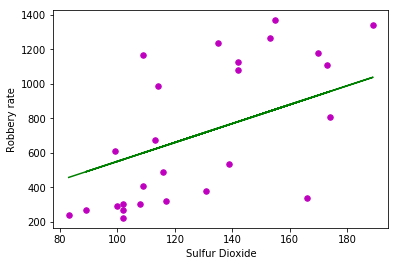

Minimum: [27, 26, 14, 19, 19, 23, 11, 16, 14, 14, 16, 16, 11, 9, 13, 10, 10, 10, 11, 11, 11, 6, 7, 3, 4, 3]
Maximum: [200, 168, 156, 189, 172, 178, 200, 151, 123, 128, 190, 129, 110, 148, 129, 119, 141, 176, 128, 119, 113, 106, 96, 105, 106, 86]
Los Angeles Mean Annual Sulfur Dioxide vs Aggravated assault rate
Estimated coefficients:
b_0 = 0.15078291464499216
b_1 = 11.41466877922398


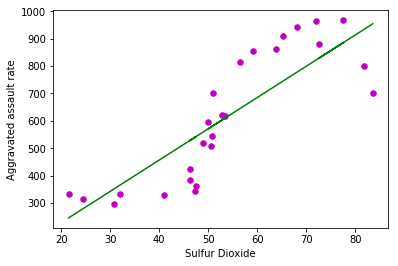

Los Angeles Annual Variance Sulfur Dioxide vs Aggravated assault rate
Estimated coefficients:
b_0 = 0.1300859469047282
b_1 = 4.778276640270251


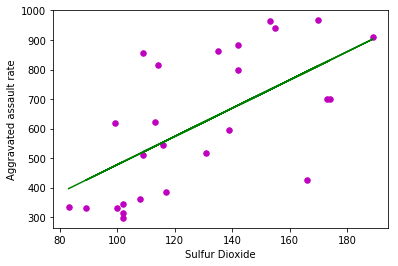

Minimum: [27, 26, 14, 19, 19, 23, 11, 16, 14, 14, 16, 16, 11, 9, 13, 10, 10, 10, 11, 11, 11, 6, 7, 3, 4, 3]
Maximum: [200, 168, 156, 189, 172, 178, 200, 151, 123, 128, 190, 129, 110, 148, 129, 119, 141, 176, 128, 119, 113, 106, 96, 105, 106, 86]
Los Angeles Mean Annual Sulfur Dioxide vs Property crime rate
Estimated coefficients:
b_0 = 8.286511664507088
b_1 = 77.420450580656


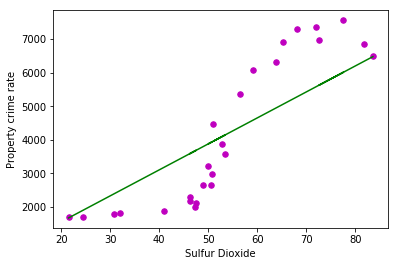

Los Angeles Annual Variance Sulfur Dioxide vs Property crime rate
Estimated coefficients:
b_0 = 4.9192845081597625
b_1 = 32.434033194114


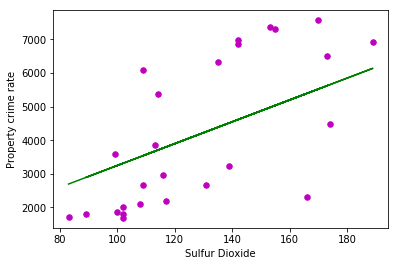

Minimum: [27, 26, 14, 19, 19, 23, 11, 16, 14, 14, 16, 16, 11, 9, 13, 10, 10, 10, 11, 11, 11, 6, 7, 3, 4, 3]
Maximum: [200, 168, 156, 189, 172, 178, 200, 151, 123, 128, 190, 129, 110, 148, 129, 119, 141, 176, 128, 119, 113, 106, 96, 105, 106, 86]
Los Angeles Mean Annual Sulfur Dioxide vs Burglary rate
Estimated coefficients:
b_0 = 3.2459515433060915
b_1 = 16.319128634167953


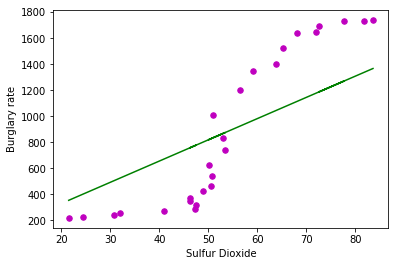

Los Angeles Annual Variance Sulfur Dioxide vs Burglary rate
Estimated coefficients:
b_0 = 1.8346371165908977
b_1 = 6.842106673159855


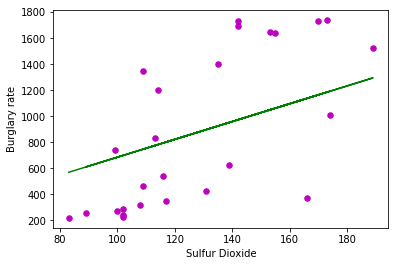

Minimum: [27, 26, 14, 19, 19, 23, 11, 16, 14, 14, 16, 16, 11, 9, 13, 10, 10, 10, 11, 11, 11, 6, 7, 3, 4, 3]
Maximum: [200, 168, 156, 189, 172, 178, 200, 151, 123, 128, 190, 129, 110, 148, 129, 119, 141, 176, 128, 119, 113, 106, 96, 105, 106, 86]
Los Angeles Mean Annual Sulfur Dioxide vs Larceny-theft rate
Estimated coefficients:
b_0 = 2.0549988145544376
b_1 = 45.44569986456096


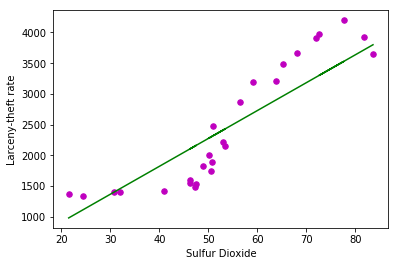

Los Angeles Annual Variance Sulfur Dioxide vs Larceny-theft rate
Estimated coefficients:
b_0 = 1.0945050912841907
b_1 = 19.030805182360925


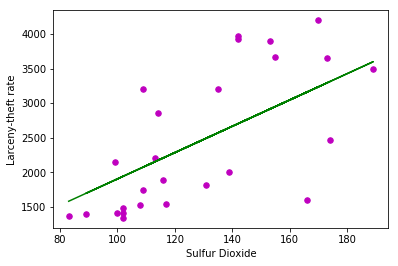

Minimum: [27, 26, 14, 19, 19, 23, 11, 16, 14, 14, 16, 16, 11, 9, 13, 10, 10, 10, 11, 11, 11, 6, 7, 3, 4, 3]
Maximum: [200, 168, 156, 189, 172, 178, 200, 151, 123, 128, 190, 129, 110, 148, 129, 119, 141, 176, 128, 119, 113, 106, 96, 105, 106, 86]
Los Angeles Mean Annual Sulfur Dioxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 2.985325109429027
b_1 = 15.65584157629854


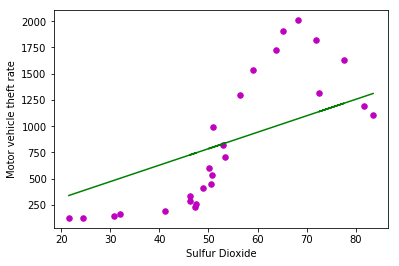

Los Angeles Annual Variance Sulfur Dioxide vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 1.9898532643620683
b_1 = 6.561213629989971


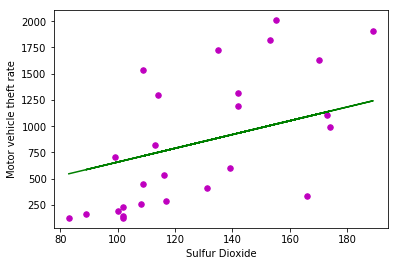

Minimum: [27, 26, 14, 19, 19, 23, 11, 16, 14, 14, 16, 16, 11, 9, 13, 10, 10, 10, 11, 11, 11, 6, 7, 3, 4, 3]
Maximum: [200, 168, 156, 189, 172, 178, 200, 151, 123, 128, 190, 129, 110, 148, 129, 119, 141, 176, 128, 119, 113, 106, 96, 105, 106, 86]
Los Angeles Mean Annual PM10 vs Violent Crime rate
Estimated coefficients:
b_0 = -18.241563230422344
b_1 = 115.62175261561924


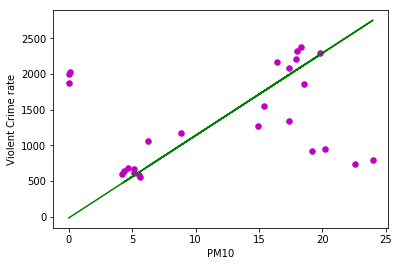

Los Angeles Annual Variance PM10 vs Violent Crime rate
Estimated coefficients:
b_0 = 839467604.0574527
b_1 = 10.163588023162642


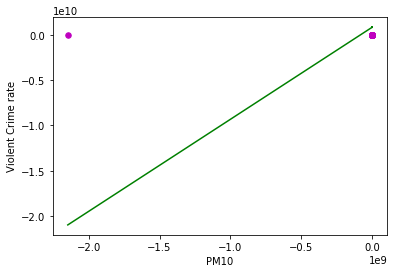

Minimum: [2147483647, 16, 46, 7, 10, 10, 9, 6, 10, 10, 12, 10, 6, 22, 13, 6, 6, 5, 6, 10, 3, 10, 8, 7, 6, 7]
Maximum: [0, 16, 46, 78, 88, 80, 92, 74, 71, 90, 80, 97, 77, 140, 69, 101, 69, 80, 98, 57, 75, 66, 60, 70, 70, 65]
Los Angeles Mean Annual PM10 vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -0.18724122334877613
b_1 = 1.2594746723113748


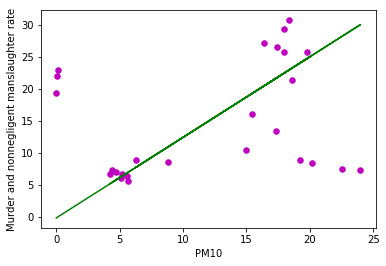

Los Angeles Annual Variance PM10 vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 9181739.540106503
b_1 = 0.11116500275854889


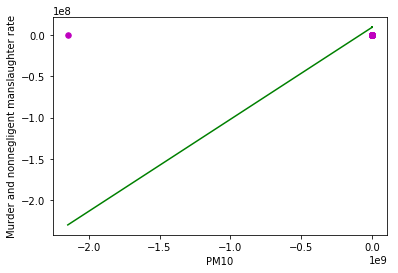

Minimum: [2147483647, 16, 46, 7, 10, 10, 9, 6, 10, 10, 12, 10, 6, 22, 13, 6, 6, 5, 6, 10, 3, 10, 8, 7, 6, 7]
Maximum: [0, 16, 46, 78, 88, 80, 92, 74, 71, 90, 80, 97, 77, 140, 69, 101, 69, 80, 98, 57, 75, 66, 60, 70, 70, 65]
Los Angeles Mean Annual PM10 vs Legacy rape rate
Estimated coefficients:
b_0 = -0.44634843634738175
b_1 = 2.470476964527482


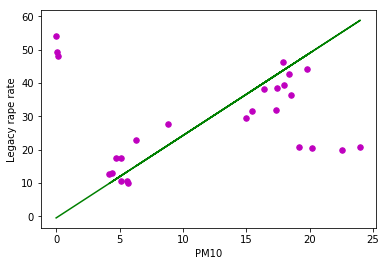

Los Angeles Annual Variance PM10 vs Legacy rape rate
Estimated coefficients:
b_0 = 17554062.957229257
b_1 = 0.21253024826307787


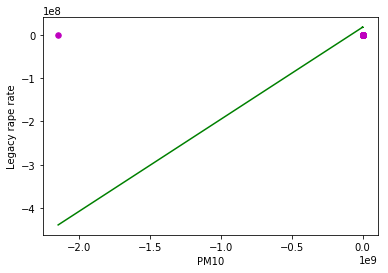

Minimum: [2147483647, 16, 46, 7, 10, 10, 9, 6, 10, 10, 12, 10, 6, 22, 13, 6, 6, 5, 6, 10, 3, 10, 8, 7, 6, 7]
Maximum: [0, 16, 46, 78, 88, 80, 92, 74, 71, 90, 80, 97, 77, 140, 69, 101, 69, 80, 98, 57, 75, 66, 60, 70, 70, 65]
Los Angeles Mean Annual PM10 vs Robbery rate
Estimated coefficients:
b_0 = -9.363957356151104
b_1 = 59.849135555976545


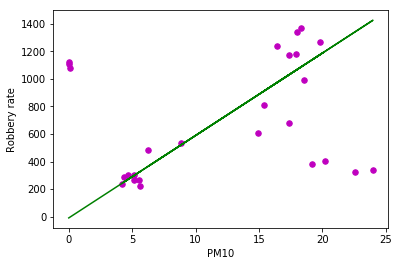

Los Angeles Annual Variance PM10 vs Robbery rate
Estimated coefficients:
b_0 = 431243556.21788573
b_1 = 5.221144647958015


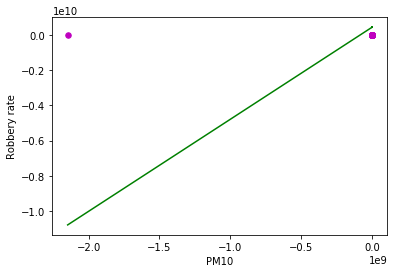

Minimum: [2147483647, 16, 46, 7, 10, 10, 9, 6, 10, 10, 12, 10, 6, 22, 13, 6, 6, 5, 6, 10, 3, 10, 8, 7, 6, 7]
Maximum: [0, 16, 46, 78, 88, 80, 92, 74, 71, 90, 80, 97, 77, 140, 69, 101, 69, 80, 98, 57, 75, 66, 60, 70, 70, 65]
Los Angeles Mean Annual PM10 vs Aggravated assault rate
Estimated coefficients:
b_0 = -8.243635386044048
b_1 = 52.043600910110236


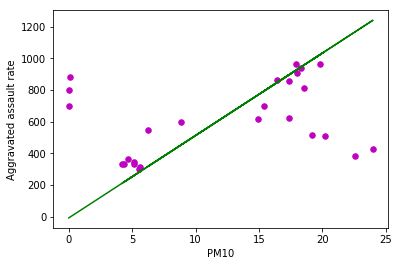

Los Angeles Annual Variance PM10 vs Aggravated assault rate
Estimated coefficients:
b_0 = 381495763.14181644
b_1 = 4.618839143567241


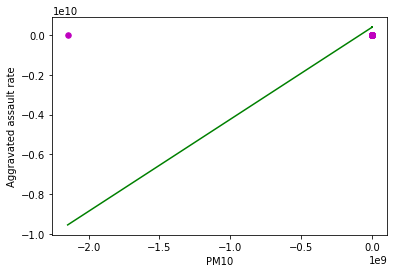

Minimum: [2147483647, 16, 46, 7, 10, 10, 9, 6, 10, 10, 12, 10, 6, 22, 13, 6, 6, 5, 6, 10, 3, 10, 8, 7, 6, 7]
Maximum: [0, 16, 46, 78, 88, 80, 92, 74, 71, 90, 80, 97, 77, 140, 69, 101, 69, 80, 98, 57, 75, 66, 60, 70, 70, 65]
Los Angeles Mean Annual PM10 vs Property crime rate
Estimated coefficients:
b_0 = -59.598854288978146
b_1 = 353.90588779024637


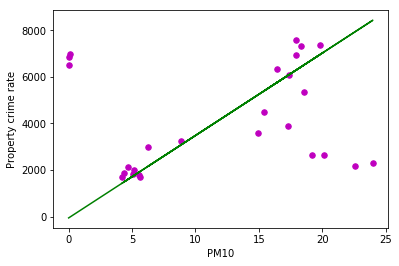

Los Angeles Annual Variance PM10 vs Property crime rate
Estimated coefficients:
b_0 = 2548712088.782983
b_1 = 30.857723669448816


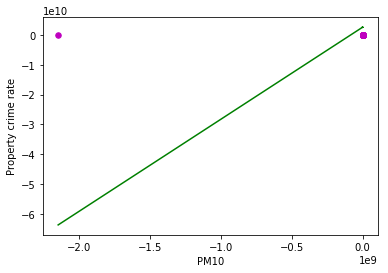

Minimum: [2147483647, 16, 46, 7, 10, 10, 9, 6, 10, 10, 12, 10, 6, 22, 13, 6, 6, 5, 6, 10, 3, 10, 8, 7, 6, 7]
Maximum: [0, 16, 46, 78, 88, 80, 92, 74, 71, 90, 80, 97, 77, 140, 69, 101, 69, 80, 98, 57, 75, 66, 60, 70, 70, 65]
Los Angeles Mean Annual PM10 vs Burglary rate
Estimated coefficients:
b_0 = -13.070348250033021
b_1 = 74.7665972090046


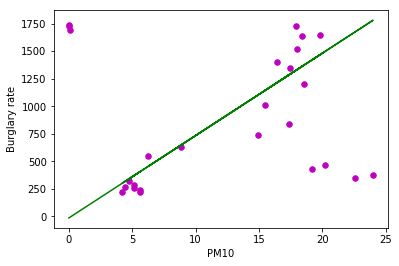

Los Angeles Annual Variance PM10 vs Burglary rate
Estimated coefficients:
b_0 = 528949902.4637997
b_1 = 6.404093084301934


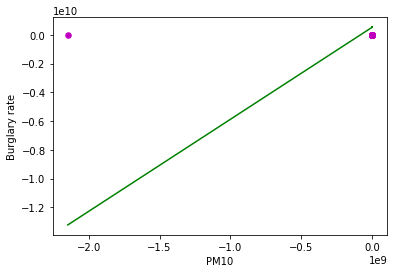

Minimum: [2147483647, 16, 46, 7, 10, 10, 9, 6, 10, 10, 12, 10, 6, 22, 13, 6, 6, 5, 6, 10, 3, 10, 8, 7, 6, 7]
Maximum: [0, 16, 46, 78, 88, 80, 92, 74, 71, 90, 80, 97, 77, 140, 69, 101, 69, 80, 98, 57, 75, 66, 60, 70, 70, 65]
Los Angeles Mean Annual PM10 vs Larceny-theft rate
Estimated coefficients:
b_0 = -37.90827150245059
b_1 = 207.75189062937991


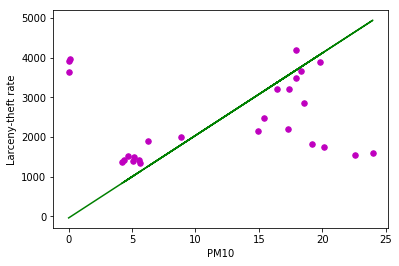

Los Angeles Annual Variance PM10 vs Larceny-theft rate
Estimated coefficients:
b_0 = 1498332600.659585
b_1 = 18.14058706717439


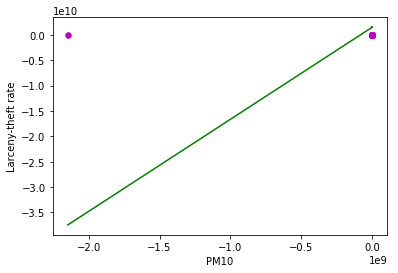

Minimum: [2147483647, 16, 46, 7, 10, 10, 9, 6, 10, 10, 12, 10, 6, 22, 13, 6, 6, 5, 6, 10, 3, 10, 8, 7, 6, 7]
Maximum: [0, 16, 46, 78, 88, 80, 92, 74, 71, 90, 80, 97, 77, 140, 69, 101, 69, 80, 98, 57, 75, 66, 60, 70, 70, 65]
Los Angeles Mean Annual PM10 vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -8.62038858201845
b_1 = 71.38838028451208


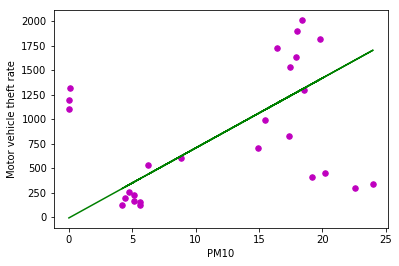

Los Angeles Annual Variance PM10 vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 521437103.45913684
b_1 = 6.313134537356165


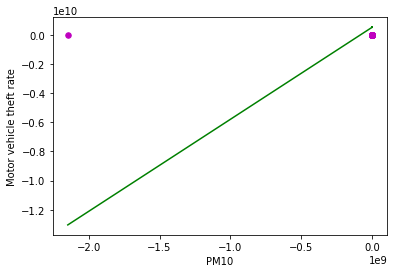

Minimum: [2147483647, 16, 46, 7, 10, 10, 9, 6, 10, 10, 12, 10, 6, 22, 13, 6, 6, 5, 6, 10, 3, 10, 8, 7, 6, 7]
Maximum: [0, 16, 46, 78, 88, 80, 92, 74, 71, 90, 80, 97, 77, 140, 69, 101, 69, 80, 98, 57, 75, 66, 60, 70, 70, 65]
Los Angeles Mean Annual PM2.5 vs Violent Crime rate
Estimated coefficients:
b_0 = -94.94524587164915
b_1 = 52.497445918823026


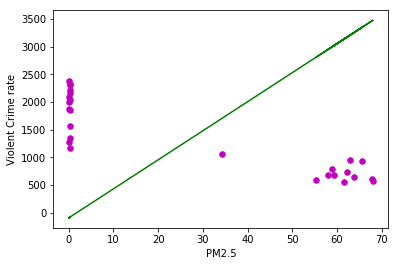

Los Angeles Annual Variance PM2.5 vs Violent Crime rate
Estimated coefficients:
b_0 = 857151524.8455275
b_1 = 10.377690673551594


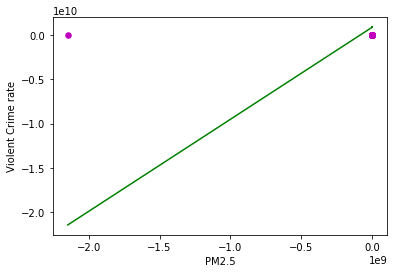

Minimum: [2147483647, 52, 84, 104, 81, 64, 72, 137, 35, 102, 67, 78, 42, 79, 13, 21, 17, 16, 18, 12, 13, 17, 26, 21, 20, 13]
Maximum: [0, 52, 84, 104, 81, 64, 72, 137, 35, 102, 67, 78, 42, 79, 137, 162, 155, 167, 167, 151, 143, 157, 156, 151, 147, 128]
Los Angeles Mean Annual PM2.5 vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = -1.0653791178791767
b_1 = 0.5733940879814611


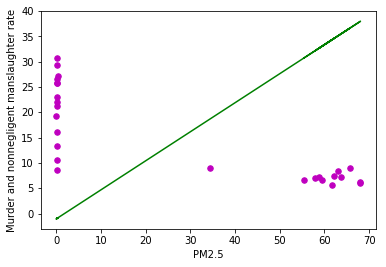

Los Angeles Annual Variance PM2.5 vs Murder and nonnegligent manslaughter rate
Estimated coefficients:
b_0 = 9375158.730473608
b_1 = 0.11350676631822317


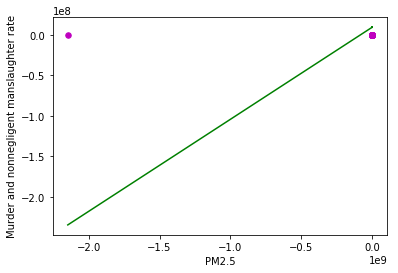

Minimum: [2147483647, 52, 84, 104, 81, 64, 72, 137, 35, 102, 67, 78, 42, 79, 13, 21, 17, 16, 18, 12, 13, 17, 26, 21, 20, 13]
Maximum: [0, 52, 84, 104, 81, 64, 72, 137, 35, 102, 67, 78, 42, 79, 137, 162, 155, 167, 167, 151, 143, 157, 156, 151, 147, 128]
Los Angeles Mean Annual PM2.5 vs Legacy rape rate
Estimated coefficients:
b_0 = -1.9953162376455182
b_1 = 1.1184631474165545


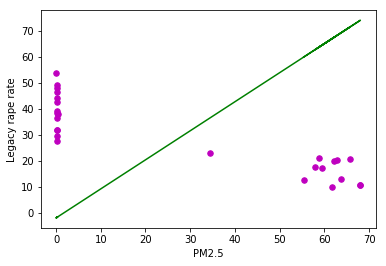

Los Angeles Annual Variance PM2.5 vs Legacy rape rate
Estimated coefficients:
b_0 = 17923850.52040951
b_1 = 0.21700733783538353


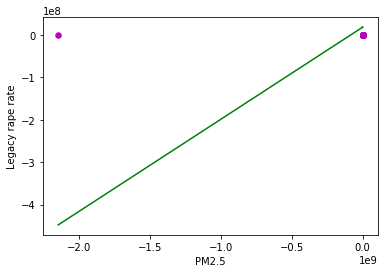

Minimum: [2147483647, 52, 84, 104, 81, 64, 72, 137, 35, 102, 67, 78, 42, 79, 13, 21, 17, 16, 18, 12, 13, 17, 26, 21, 20, 13]
Maximum: [0, 52, 84, 104, 81, 64, 72, 137, 35, 102, 67, 78, 42, 79, 137, 162, 155, 167, 167, 151, 143, 157, 156, 151, 147, 128]
Los Angeles Mean Annual PM2.5 vs Robbery rate
Estimated coefficients:
b_0 = -51.707223566295966
b_1 = 27.269361482797713


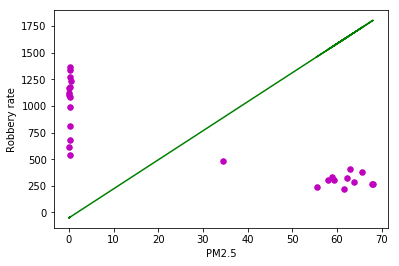

Los Angeles Annual Variance PM2.5 vs Robbery rate
Estimated coefficients:
b_0 = 440327975.8520498
b_1 = 5.3311314740826505


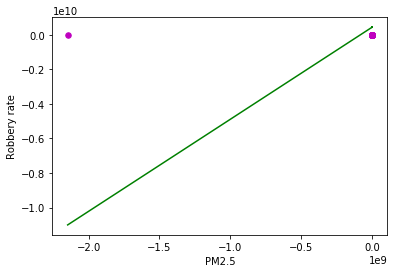

Minimum: [2147483647, 52, 84, 104, 81, 64, 72, 137, 35, 102, 67, 78, 42, 79, 13, 21, 17, 16, 18, 12, 13, 17, 26, 21, 20, 13]
Maximum: [0, 52, 84, 104, 81, 64, 72, 137, 35, 102, 67, 78, 42, 79, 137, 162, 155, 167, 167, 151, 143, 157, 156, 151, 147, 128]
Los Angeles Mean Annual PM2.5 vs Aggravated assault rate
Estimated coefficients:
b_0 = -40.17840406805419
b_1 = 23.536682150397997


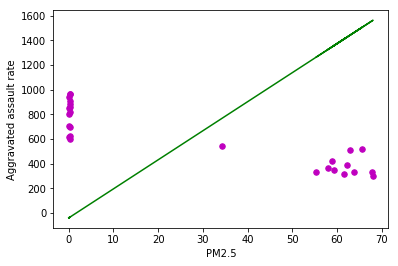

Los Angeles Annual Variance PM2.5 vs Aggravated assault rate
Estimated coefficients:
b_0 = 389532215.9092885
b_1 = 4.716138032080803


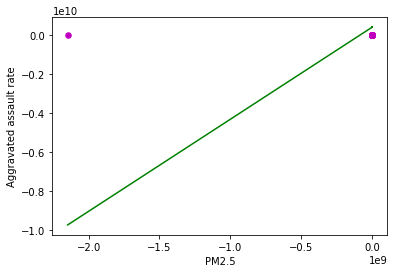

Minimum: [2147483647, 52, 84, 104, 81, 64, 72, 137, 35, 102, 67, 78, 42, 79, 13, 21, 17, 16, 18, 12, 13, 17, 26, 21, 20, 13]
Maximum: [0, 52, 84, 104, 81, 64, 72, 137, 35, 102, 67, 78, 42, 79, 137, 162, 155, 167, 167, 151, 143, 157, 156, 151, 147, 128]
Los Angeles Mean Annual PM2.5 vs Property crime rate
Estimated coefficients:
b_0 = -293.9420729780177
b_1 = 160.67328170030248


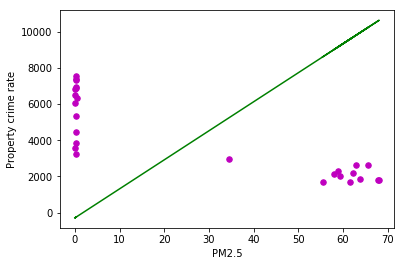

Los Angeles Annual Variance PM2.5 vs Property crime rate
Estimated coefficients:
b_0 = 2602402335.1330566
b_1 = 31.507761869763442


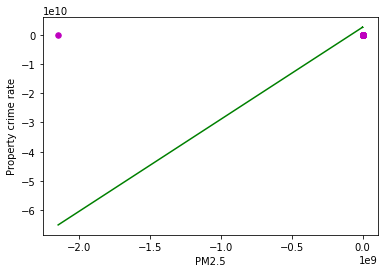

Minimum: [2147483647, 52, 84, 104, 81, 64, 72, 137, 35, 102, 67, 78, 42, 79, 13, 21, 17, 16, 18, 12, 13, 17, 26, 21, 20, 13]
Maximum: [0, 52, 84, 104, 81, 64, 72, 137, 35, 102, 67, 78, 42, 79, 137, 162, 155, 167, 167, 151, 143, 157, 156, 151, 147, 128]
Los Angeles Mean Annual PM2.5 vs Burglary rate
Estimated coefficients:
b_0 = -67.24450527745398
b_1 = 34.11232341170204


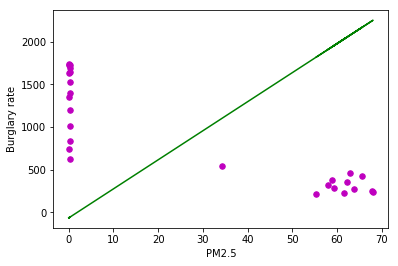

Los Angeles Annual Variance PM2.5 vs Burglary rate
Estimated coefficients:
b_0 = 540092567.6772586
b_1 = 6.538999487875448


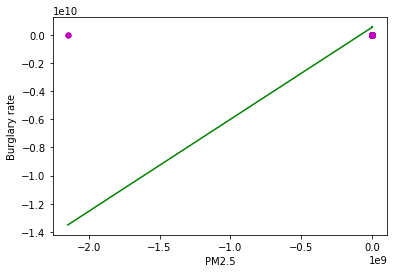

Minimum: [2147483647, 52, 84, 104, 81, 64, 72, 137, 35, 102, 67, 78, 42, 79, 13, 21, 17, 16, 18, 12, 13, 17, 26, 21, 20, 13]
Maximum: [0, 52, 84, 104, 81, 64, 72, 137, 35, 102, 67, 78, 42, 79, 137, 162, 155, 167, 167, 151, 143, 157, 156, 151, 147, 128]
Los Angeles Mean Annual PM2.5 vs Larceny-theft rate
Estimated coefficients:
b_0 = -160.19495620771977
b_1 = 93.76836998263855


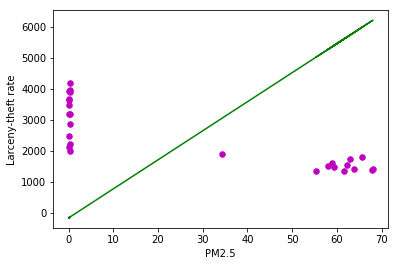

Los Angeles Annual Variance PM2.5 vs Larceny-theft rate
Estimated coefficients:
b_0 = 1529895938.448691
b_1 = 18.522730504523835


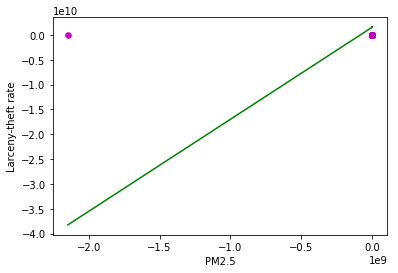

Minimum: [2147483647, 52, 84, 104, 81, 64, 72, 137, 35, 102, 67, 78, 42, 79, 13, 21, 17, 16, 18, 12, 13, 17, 26, 21, 20, 13]
Maximum: [0, 52, 84, 104, 81, 64, 72, 137, 35, 102, 67, 78, 42, 79, 137, 162, 155, 167, 167, 151, 143, 157, 156, 151, 147, 128]
Los Angeles Mean Annual PM2.5 vs Motor vehicle theft rate
Estimated coefficients:
b_0 = -66.50213971188634
b_1 = 32.79298739850354


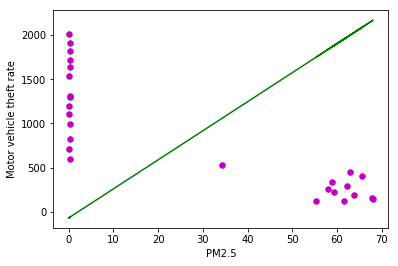

Los Angeles Annual Variance PM2.5 vs Motor vehicle theft rate
Estimated coefficients:
b_0 = 532421505.17442447
b_1 = 6.446124814137169


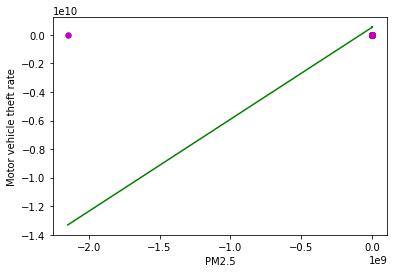

Minimum: [2147483647, 52, 84, 104, 81, 64, 72, 137, 35, 102, 67, 78, 42, 79, 13, 21, 17, 16, 18, 12, 13, 17, 26, 21, 20, 13]
Maximum: [0, 52, 84, 104, 81, 64, 72, 137, 35, 102, 67, 78, 42, 79, 137, 162, 155, 167, 167, 151, 143, 157, 156, 151, 147, 128]


In [88]:
for i, x in enumerate(cities):
    print(x)
    for j, y in enumerate(pollution[i]):
        data = pollution_data(y, pollution_index[j])
        mean = np.array(data[0])
        variance = np.array(data[3])
        for k, z in enumerate(rates[i]):
            print(x, 'Mean Annual', pollution_index[j], 'vs', crime_index[k])
            arrays_to_reg(mean, z, pollution_index[j], crime_index[k])
            print(x, 'Annual Variance', pollution_index[j], 'vs', crime_index[k])
            arrays_to_reg(variance, z, pollution_index[j], crime_index[k])
            print('Minimum:', data[1])
            print('Maximum:', data[2])

In [94]:
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score

In [205]:
def linear_regression(x, y, z):
    #print(x)
    x_sets = []
    y_sets = []
    mean_square_total = 0
    variance_total = 0
    for i in range(3):
        x_sets.append(x[(z + i) % 3])
        y_sets.append(y[(z + i) % 3])
    for i in range(2):
        regress = linear_model.LinearRegression()
        regress.fit(x_sets[i], y_sets[i])
        predict_y = regress.predict(x_sets[2])
        print()
        print('Coefficients: \n', regress.coef_)
        mean_square_total += mean_squared_error(y_sets[i], predict_y)
        print("Mean squared error: %.2f"
              % mean_squared_error(y_sets[i], predict_y))
        variance_total += r2_score(y_sets[i], predict_y)
        print('Variance score: %.2f' % r2_score(y_sets[i], predict_y))
        plt.scatter(x_sets[2], y_sets[2], color='black')
        plt.plot(x_sets[2], predict_y, color='blue', linewidth=3)
        plt.xticks(())
        plt.yticks(())
        plt.xlabel(pollution_index[j])
        plt.ylabel(crime_index[k])
        plt.show()
    return([mean_square_total, variance_total])

Coefficients: 
 [[0.00237059]]
Mean squared error: 1032.41
Variance score: -10.25


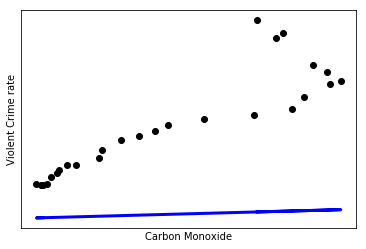

Coefficients: 
 [[0.02486859]]
Mean squared error: 55.59
Variance score: 0.81


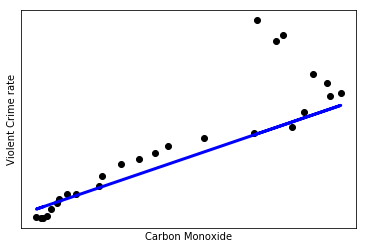

Coefficients: 
 [[0.00516698]]
Mean squared error: 4889.96
Variance score: -10.41


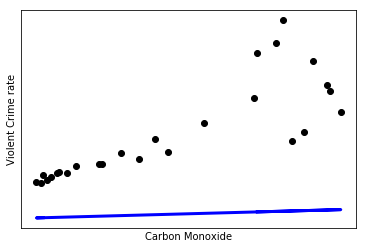

Coefficients: 
 [[0.10263096]]
Mean squared error: 1335.02
Variance score: 0.76


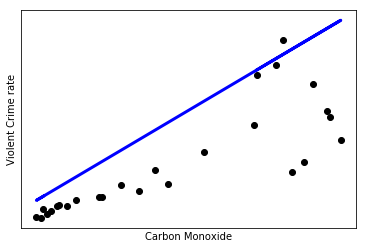

Coefficients: 
 [[0.02486859]]
Mean squared error: 107174.79
Variance score: -365.01


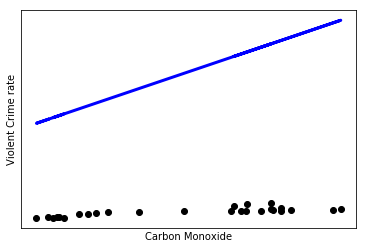

Coefficients: 
 [[0.03573599]]
Mean squared error: 228087.44
Variance score: -329.06


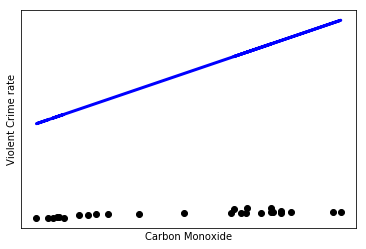

Coefficients: 
 [[0.10263096]]
Mean squared error: 1824766.37
Variance score: -331.31


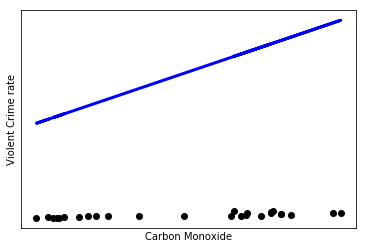

Coefficients: 
 [[0.06812631]]
Mean squared error: 830252.97
Variance score: -282.62


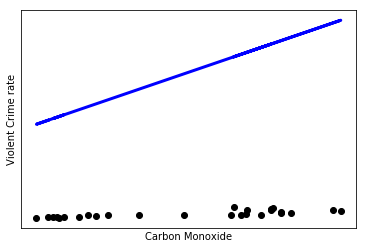

Coefficients: 
 [[0.03573599]]
Mean squared error: 318.68
Variance score: 0.54


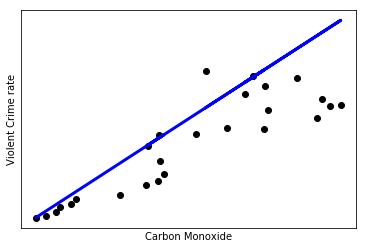

Coefficients: 
 [[0.00237059]]
Mean squared error: 1006.78
Variance score: -9.97


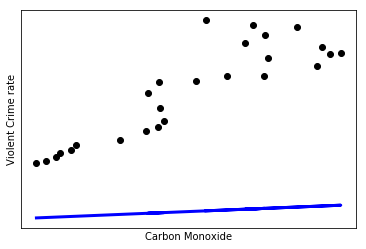

Coefficients: 
 [[0.06812631]]
Mean squared error: 1742.86
Variance score: 0.40


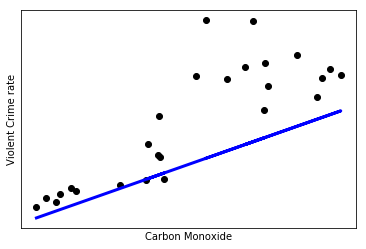

Coefficients: 
 [[0.00516698]]
Mean squared error: 4773.58
Variance score: -10.14


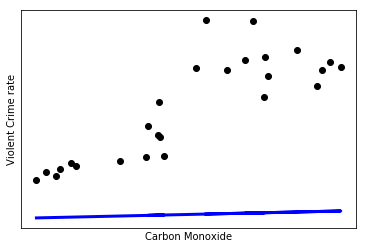

In [171]:
# using the data from cities to train the algorithm to predict other
# cities doesn't work due to scaling, must scale
j = 0
k = 0
for i, x in enumerate(cities):
    data = pollution_data(pollution[i][j], pollution_index[j])
    crime = [[c] for c in rates[i][k]]
    mean = [[a] for a in data[0]]
    variance = [[b] for b in data[3]]
    if i == 0:
        values = [[crime], [mean], [variance]]
    else:
        values[0].append(crime)
        values[1].append(mean)
        values[2].append(variance)
for l in range(3):
    linear_regression(values[0], values[1], l)
    linear_regression(values[0], values[2], l)

In [174]:
# used to scale data from other cities to make it comparable
def flat_scale(values):
    data = []
    for i in values:
        container = []
        for j in i:
            low = min(j)
            high = max(j)
            points = [[(k - low) / high] for k in j]
            container.append(points)
        data.append(container)
    return data

Mean

Coefficients: 
 [[1.00349543]]
Mean squared error: 0.03
Variance score: 0.20


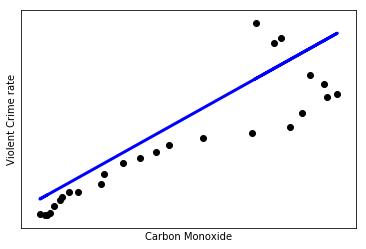


Coefficients: 
 [[0.95779636]]
Mean squared error: 0.01
Variance score: 0.85


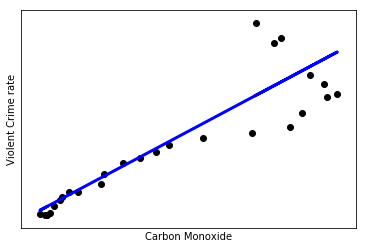

Variance

Coefficients: 
 [[1.05211054]]
Mean squared error: 0.03
Variance score: 0.34


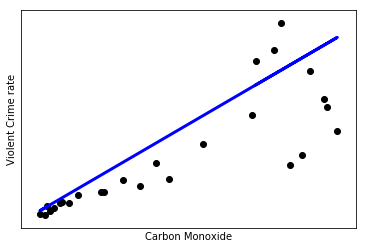


Coefficients: 
 [[0.95655086]]
Mean squared error: 0.02
Variance score: 0.79


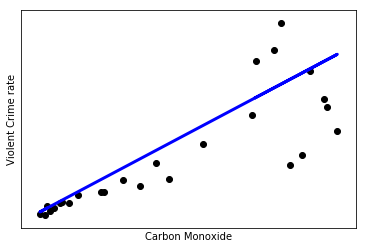

Mean

Coefficients: 
 [[0.95779636]]
Mean squared error: 0.03
Variance score: 0.50


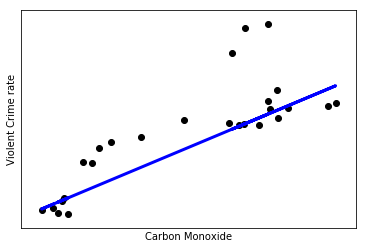


Coefficients: 
 [[0.87498421]]
Mean squared error: 0.04
Variance score: 0.52


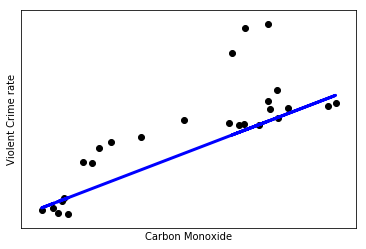

Variance

Coefficients: 
 [[0.95655086]]
Mean squared error: 0.04
Variance score: 0.48


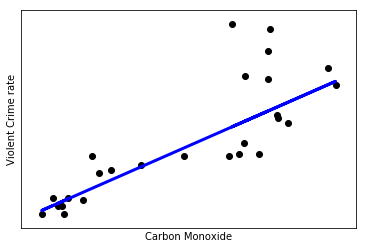


Coefficients: 
 [[0.78070129]]
Mean squared error: 0.04
Variance score: 0.41


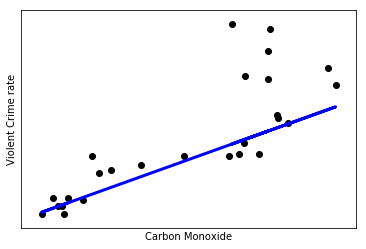

Mean

Coefficients: 
 [[0.87498421]]
Mean squared error: 0.03
Variance score: 0.58


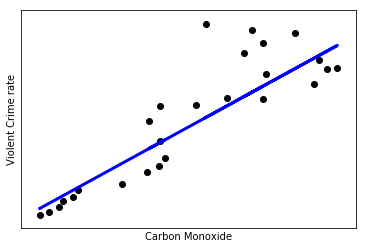


Coefficients: 
 [[1.00349543]]
Mean squared error: 0.04
Variance score: -0.02


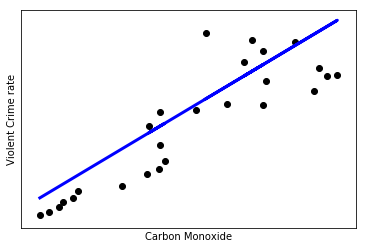

Variance

Coefficients: 
 [[0.78070129]]
Mean squared error: 0.04
Variance score: 0.44


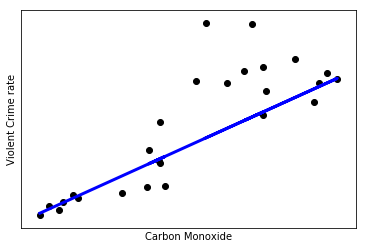


Coefficients: 
 [[1.05211054]]
Mean squared error: 0.05
Variance score: 0.02


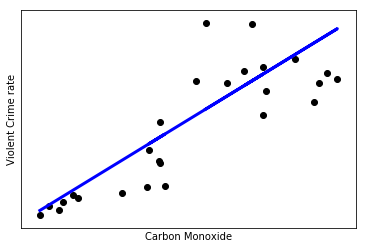

Mean mean squared error for mean: 0.18805781270173585
Mean variance score for mean: 0.43919448576394204
Mean mean squared error for variance: 0.03472651773239904
Mean variance score for variance: 0.4139211627024735


In [223]:
# using a flat scale, then training the algorithm to predict other cities 
j = 0
k = 0
for i, x in enumerate(cities):
    data = pollution_data(pollution[i][j], pollution_index[j])
    crime = rates[i][k]
    mean = data[0]
    variance = data[3]
    if i == 0:
        values = [[crime], [mean], [variance]]
    else:
        values[0].append(crime)
        values[1].append(mean)
        values[2].append(variance)
scaled = flat_scale(values)
mean_variance_total = 0
variance_mean_total = 0
variance_variance_total = 0
for l in range(3):
    print('Mean')
    a, b = linear_regression(scaled[0], scaled[1], l)
    mean_mean_total += a
    mean_variance_total += b
    print('Variance')
    a, b = linear_regression(scaled[0], scaled[2], l)
    variance_mean_total += a
    variance_variance_total += b
print('Mean mean squared error for mean:', (mean_mean_total / 6))
print('Mean variance score for mean:', (mean_variance_total / 6))
print('Mean mean squared error for variance:', (variance_mean_total / 6))
print('Mean variance score for variance:', (variance_variance_total / 6))

Mean

Coefficients: 
 [[0.13116692]]
Mean squared error: 0.01
Variance score: 0.09


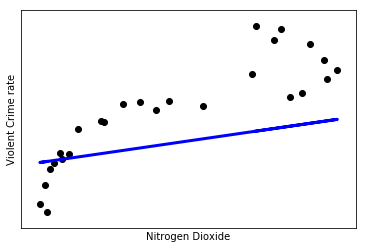


Coefficients: 
 [[0.60616717]]
Mean squared error: 0.01
Variance score: 0.81


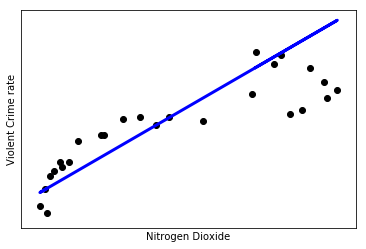

Variance

Coefficients: 
 [[0.10655775]]
Mean squared error: 0.01
Variance score: 0.06


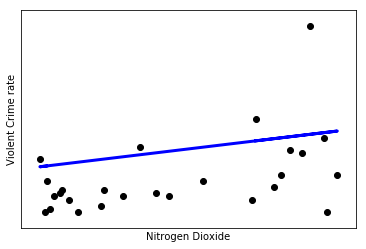


Coefficients: 
 [[0.24354405]]
Mean squared error: 0.00
Variance score: 0.48


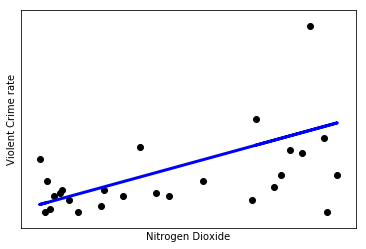

Mean

Coefficients: 
 [[0.60616717]]
Mean squared error: 0.01
Variance score: 0.47


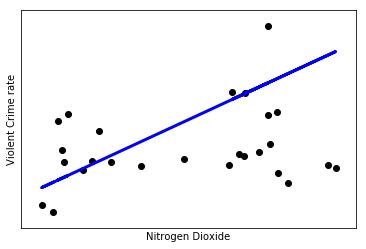


Coefficients: 
 [[0.37679619]]
Mean squared error: 0.01
Variance score: 0.54


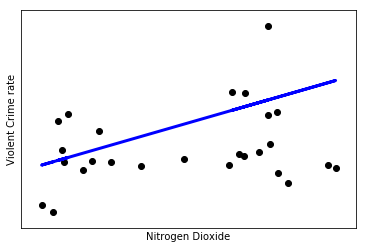

Variance

Coefficients: 
 [[0.24354405]]
Mean squared error: 0.01
Variance score: 0.16


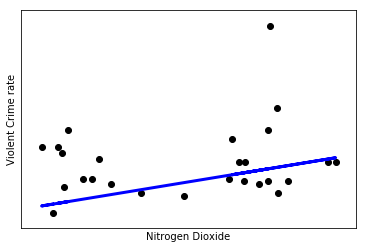


Coefficients: 
 [[0.15287885]]
Mean squared error: 0.01
Variance score: 0.11


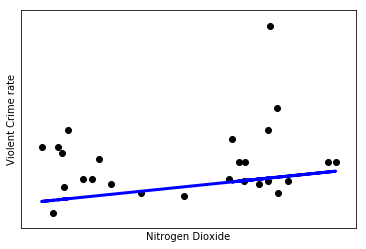

Mean

Coefficients: 
 [[0.37679619]]
Mean squared error: 0.01
Variance score: 0.63


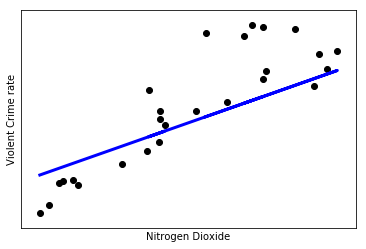


Coefficients: 
 [[0.13116692]]
Mean squared error: 0.01
Variance score: -0.02


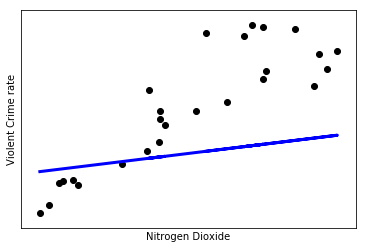

Variance

Coefficients: 
 [[0.15287885]]
Mean squared error: 0.01
Variance score: 0.07


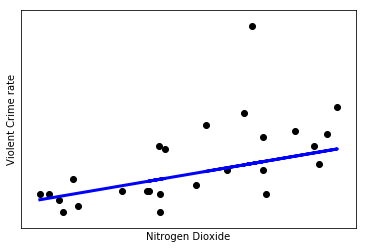


Coefficients: 
 [[0.10655775]]
Mean squared error: 0.01
Variance score: -0.00


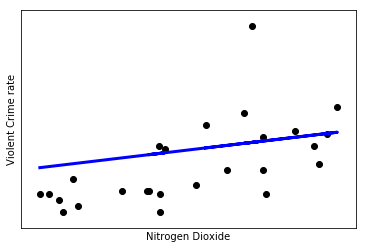

Mean mean squared error for mean: 0.19564866438601983
Mean variance score for mean: 0.4208706999301161
Mean mean squared error for variance: 0.007267302891284446
Mean variance score for variance: 0.14538521202959362


In [228]:
# using a flat scale, then training the algorithm to predict other cities 
j = 1
k = 0
for i, x in enumerate(cities):
    data = pollution_data(pollution[i][j], pollution_index[j])
    crime = rates[i][k]
    mean = data[0]
    variance = data[3]
    if i == 0:
        values = [[crime], [mean], [variance]]
    else:
        values[0].append(crime)
        values[1].append(mean)
        values[2].append(variance)
scaled = flat_scale(values)
mean_variance_total = 0
variance_mean_total = 0
variance_variance_total = 0
for l in range(3):
    print('Mean')
    a, b = linear_regression(scaled[0], scaled[1], l)
    mean_mean_total += a
    mean_variance_total += b
    print('Variance')
    a, b = linear_regression(scaled[0], scaled[2], l)
    variance_mean_total += a
    variance_variance_total += b
print('Mean mean squared error for mean:', (mean_mean_total / 6))
print('Mean variance score for mean:', (mean_variance_total / 6))
print('Mean mean squared error for variance:', (variance_mean_total / 6))
print('Mean variance score for variance:', (variance_variance_total / 6))

Mean

Coefficients: 
 [[0.31340307]]
Mean squared error: 0.01
Variance score: 0.12


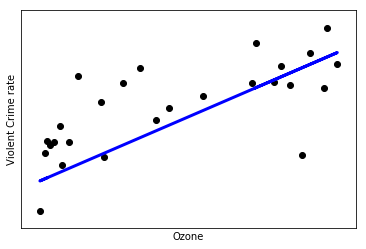


Coefficients: 
 [[0.46946953]]
Mean squared error: 0.01
Variance score: 0.65


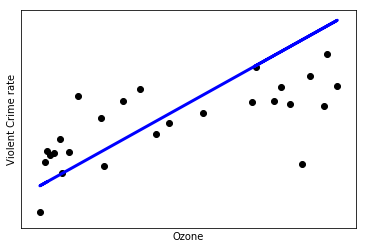

Variance

Coefficients: 
 [[0.43310902]]
Mean squared error: 0.01
Variance score: 0.19


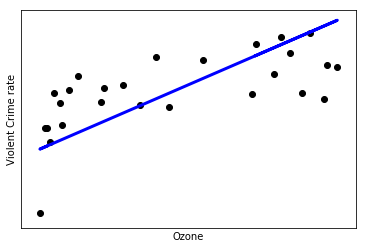


Coefficients: 
 [[0.42191149]]
Mean squared error: 0.00
Variance score: 0.76


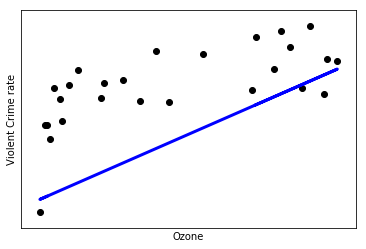

Mean

Coefficients: 
 [[0.46946953]]
Mean squared error: 0.02
Variance score: 0.23


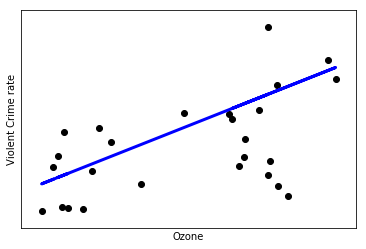


Coefficients: 
 [[0.20422553]]
Mean squared error: 0.00
Variance score: 0.37


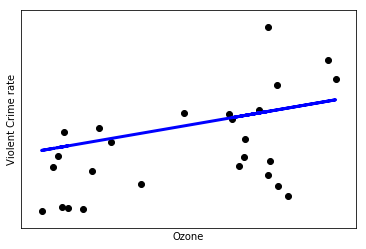

Variance

Coefficients: 
 [[0.42191149]]
Mean squared error: 0.01
Variance score: 0.37


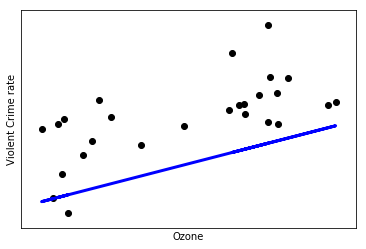


Coefficients: 
 [[0.22614307]]
Mean squared error: 0.01
Variance score: 0.32


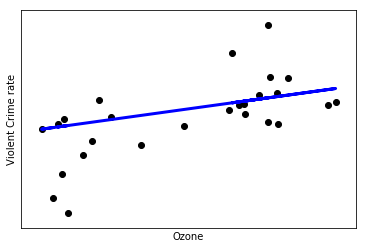

Mean

Coefficients: 
 [[0.20422553]]
Mean squared error: 0.00
Variance score: 0.39


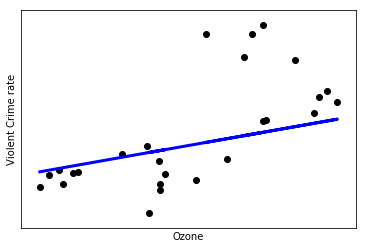


Coefficients: 
 [[0.31340307]]
Mean squared error: 0.01
Variance score: -0.07


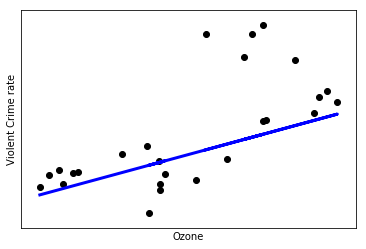

Variance

Coefficients: 
 [[0.22614307]]
Mean squared error: 0.01
Variance score: 0.41


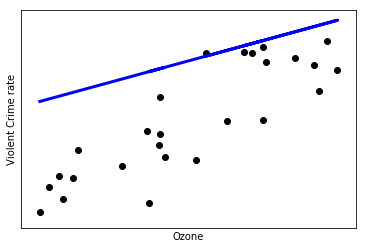


Coefficients: 
 [[0.43310902]]
Mean squared error: 0.01
Variance score: 0.07


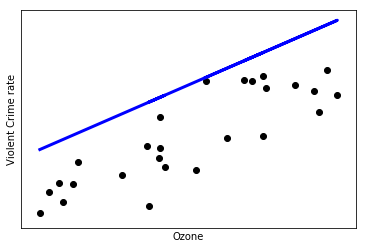

Mean mean squared error for mean: 0.2051308685460357
Mean variance score for mean: 0.2819971696238548
Mean mean squared error for variance: 0.007590776478541746
Mean variance score for variance: 0.35242686513384375


In [229]:
# using a flat scale, then training the algorithm to predict other cities 
j = 2
k = 0
for i, x in enumerate(cities):
    data = pollution_data(pollution[i][j], pollution_index[j])
    crime = rates[i][k]
    mean = data[0]
    variance = data[3]
    if i == 0:
        values = [[crime], [mean], [variance]]
    else:
        values[0].append(crime)
        values[1].append(mean)
        values[2].append(variance)
scaled = flat_scale(values)
mean_variance_total = 0
variance_mean_total = 0
variance_variance_total = 0
for l in range(3):
    print('Mean')
    a, b = linear_regression(scaled[0], scaled[1], l)
    mean_mean_total += a
    mean_variance_total += b
    print('Variance')
    a, b = linear_regression(scaled[0], scaled[2], l)
    variance_mean_total += a
    variance_variance_total += b
print('Mean mean squared error for mean:', (mean_mean_total / 6))
print('Mean variance score for mean:', (mean_variance_total / 6))
print('Mean mean squared error for variance:', (variance_mean_total / 6))
print('Mean variance score for variance:', (variance_variance_total / 6))

Mean

Coefficients: 
 [[0.92178331]]
Mean squared error: 0.02
Variance score: 0.33


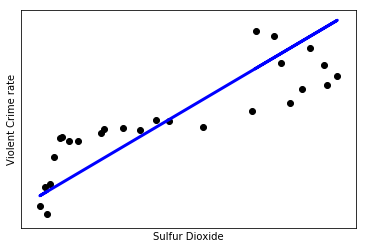


Coefficients: 
 [[0.70786112]]
Mean squared error: 0.02
Variance score: 0.68


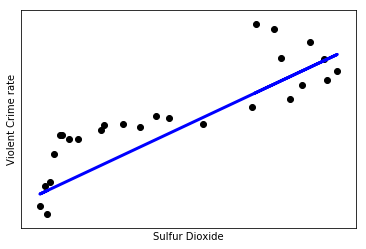

Variance

Coefficients: 
 [[0.49396797]]
Mean squared error: 0.01
Variance score: 0.02


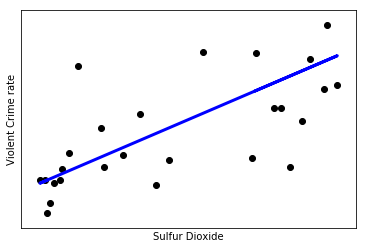


Coefficients: 
 [[0.53284697]]
Mean squared error: 0.02
Variance score: 0.35


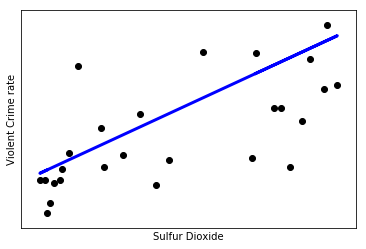

Mean

Coefficients: 
 [[0.70786112]]
Mean squared error: 0.03
Variance score: 0.33


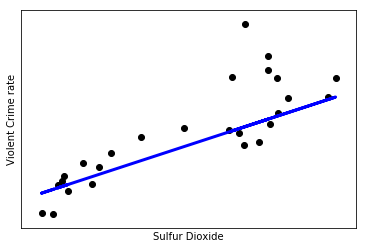


Coefficients: 
 [[0.60036223]]
Mean squared error: 0.02
Variance score: 0.49


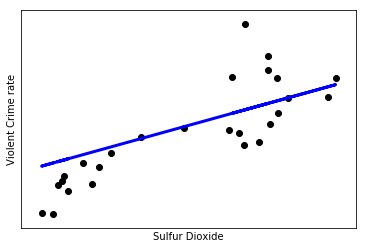

Variance

Coefficients: 
 [[0.53284697]]
Mean squared error: 0.03
Variance score: 0.24


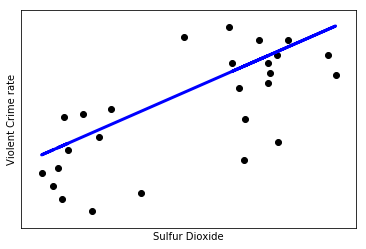


Coefficients: 
 [[0.37430602]]
Mean squared error: 0.02
Variance score: 0.31


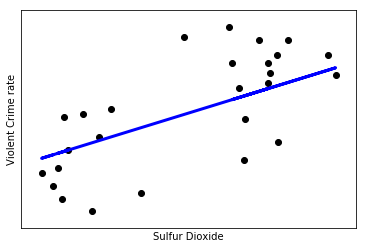

Mean

Coefficients: 
 [[0.60036223]]
Mean squared error: 0.01
Variance score: 0.61


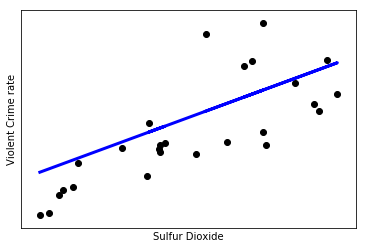


Coefficients: 
 [[0.92178331]]
Mean squared error: 0.04
Variance score: -0.04


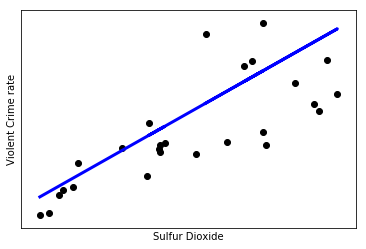

Variance

Coefficients: 
 [[0.37430602]]
Mean squared error: 0.01
Variance score: 0.42


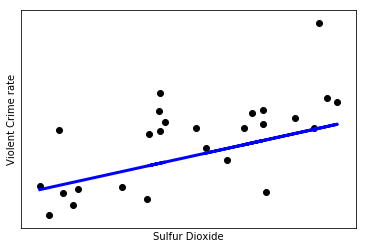


Coefficients: 
 [[0.49396797]]
Mean squared error: 0.02
Variance score: -0.12


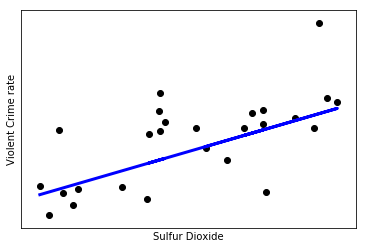

Mean mean squared error for mean: 0.2284089023095748
Mean variance score for mean: 0.39934004085849883
Mean mean squared error for variance: 0.018533452569440556
Mean variance score for variance: 0.20484092059858194


In [230]:
# using a flat scale, then training the algorithm to predict other cities 
j = 3
k = 0
for i, x in enumerate(cities):
    data = pollution_data(pollution[i][j], pollution_index[j])
    crime = rates[i][k]
    mean = data[0]
    variance = data[3]
    if i == 0:
        values = [[crime], [mean], [variance]]
    else:
        values[0].append(crime)
        values[1].append(mean)
        values[2].append(variance)
scaled = flat_scale(values)
mean_variance_total = 0
variance_mean_total = 0
variance_variance_total = 0
for l in range(3):
    print('Mean')
    a, b = linear_regression(scaled[0], scaled[1], l)
    mean_mean_total += a
    mean_variance_total += b
    print('Variance')
    a, b = linear_regression(scaled[0], scaled[2], l)
    variance_mean_total += a
    variance_variance_total += b
print('Mean mean squared error for mean:', (mean_mean_total / 6))
print('Mean variance score for mean:', (mean_variance_total / 6))
print('Mean mean squared error for variance:', (variance_mean_total / 6))
print('Mean variance score for variance:', (variance_variance_total / 6))

Mean

Coefficients: 
 [[0.10120706]]
Mean squared error: 0.08
Variance score: -0.02


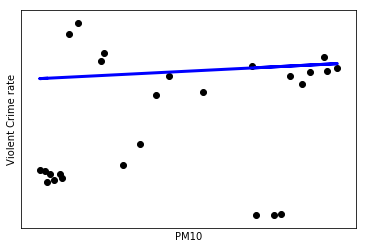


Coefficients: 
 [[-0.54322666]]
Mean squared error: 0.06
Variance score: 0.32


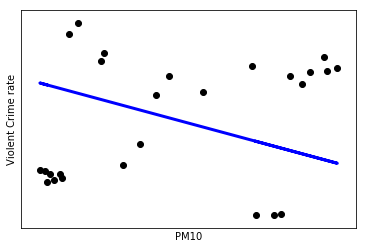

Variance

Coefficients: 
 [[-618711.57366116]]
Mean squared error: 688713480824.40
Variance score: 0.02


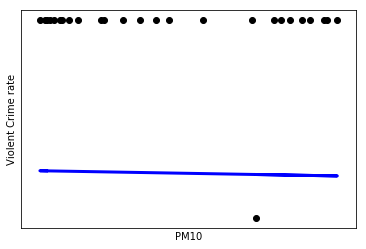


Coefficients: 
 [[-88768.41876996]]
Mean squared error: 382625361331.90
Variance score: 0.01


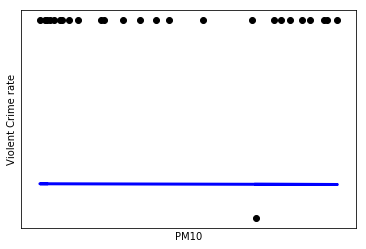

Mean

Coefficients: 
 [[-0.54322666]]
Mean squared error: 0.07
Variance score: 0.13


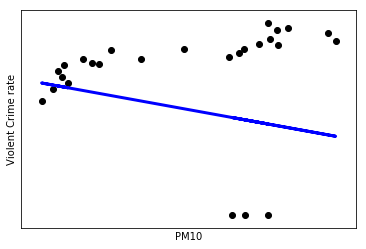


Coefficients: 
 [[0.2878098]]
Mean squared error: 0.09
Variance score: 0.07


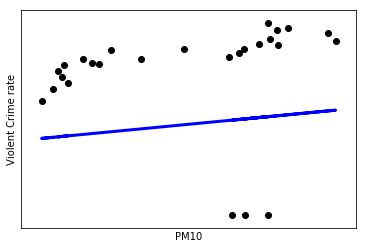

Variance

Coefficients: 
 [[-88768.41876996]]
Mean squared error: 384909248522.46
Variance score: 0.00


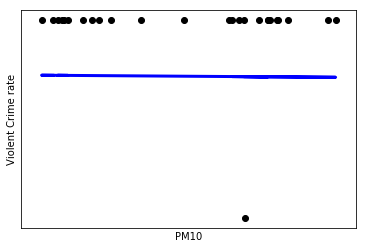


Coefficients: 
 [[-2007444.42373365]]
Mean squared error: 12102681742367.94
Variance score: 0.01


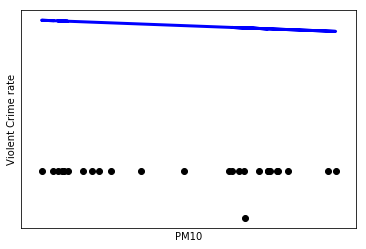

Mean

Coefficients: 
 [[0.2878098]]
Mean squared error: 0.09
Variance score: 0.15


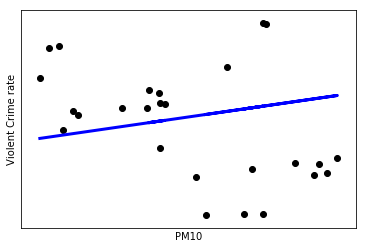


Coefficients: 
 [[0.10120706]]
Mean squared error: 0.08
Variance score: 0.01


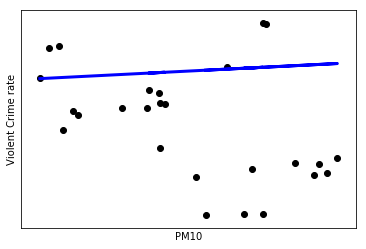

Variance

Coefficients: 
 [[-2007444.42373365]]
Mean squared error: 12376799928364.18
Variance score: -0.01


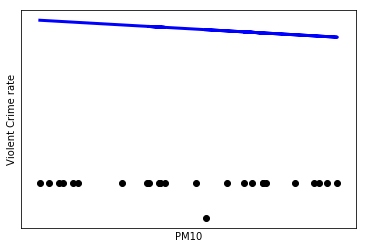


Coefficients: 
 [[-618711.57366116]]
Mean squared error: 723028616501.03
Variance score: -0.03


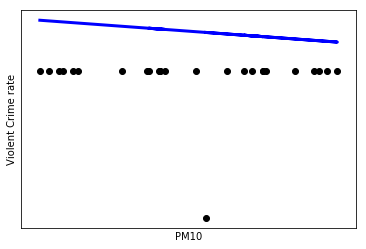

Mean mean squared error for mean: 0.30659596843850545
Mean variance score for mean: 0.10931250888728845
Mean mean squared error for variance: 4443126396318.649
Mean variance score for variance: 0.0009043855451623672


In [231]:
# using a flat scale, then training the algorithm to predict other cities 
j = 4
k = 0
for i, x in enumerate(cities):
    data = pollution_data(pollution[i][j], pollution_index[j])
    crime = rates[i][k]
    mean = data[0]
    variance = data[3]
    if i == 0:
        values = [[crime], [mean], [variance]]
    else:
        values[0].append(crime)
        values[1].append(mean)
        values[2].append(variance)
scaled = flat_scale(values)
mean_variance_total = 0
variance_mean_total = 0
variance_variance_total = 0
for l in range(3):
    print('Mean')
    a, b = linear_regression(scaled[0], scaled[1], l)
    mean_mean_total += a
    mean_variance_total += b
    print('Variance')
    a, b = linear_regression(scaled[0], scaled[2], l)
    variance_mean_total += a
    variance_variance_total += b
print('Mean mean squared error for mean:', (mean_mean_total / 6))
print('Mean variance score for mean:', (mean_variance_total / 6))
print('Mean mean squared error for variance:', (variance_mean_total / 6))
print('Mean variance score for variance:', (variance_variance_total / 6))

Mean

Coefficients: 
 [[-2.43541946]]
Mean squared error: 0.18
Variance score: 0.11


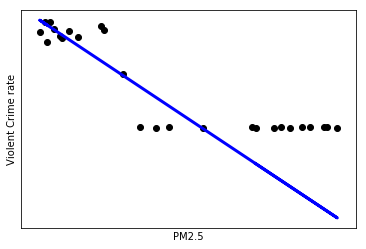


Coefficients: 
 [[-1.45834907]]
Mean squared error: 0.05
Variance score: 0.73


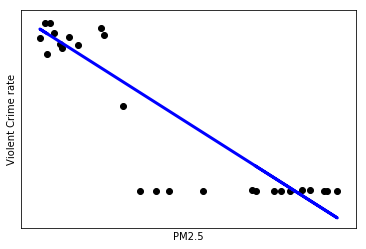

Variance

Coefficients: 
 [[-1773402.35179238]]
Mean squared error: 5658163545154.25
Variance score: 0.02


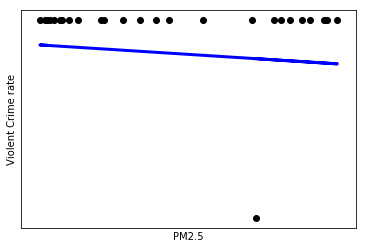


Coefficients: 
 [[-338750.44626046]]
Mean squared error: 5572003287144.54
Variance score: 0.01


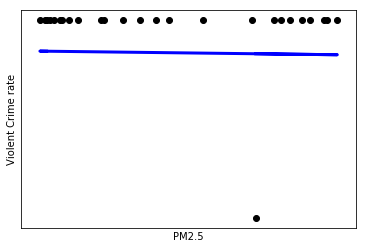

Mean

Coefficients: 
 [[-1.45834907]]
Mean squared error: 0.09
Variance score: 0.51


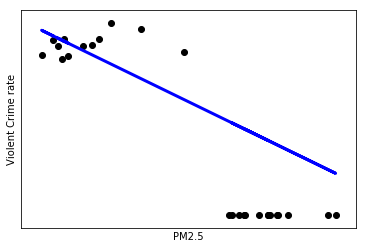


Coefficients: 
 [[-1.42638361]]
Mean squared error: 0.07
Variance score: 0.65


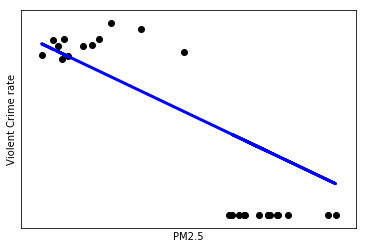

Variance

Coefficients: 
 [[-338750.44626046]]
Mean squared error: 5605262732352.56
Variance score: 0.00


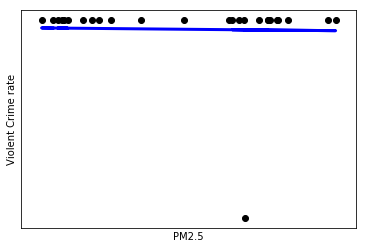


Coefficients: 
 [[-1568732.70307156]]
Mean squared error: 7390804590608.21
Variance score: 0.01


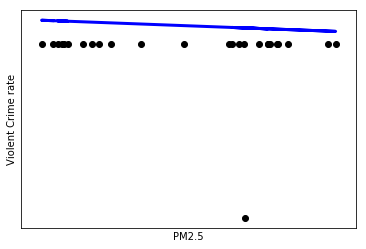

Mean

Coefficients: 
 [[-1.42638361]]
Mean squared error: 0.06
Variance score: 0.68


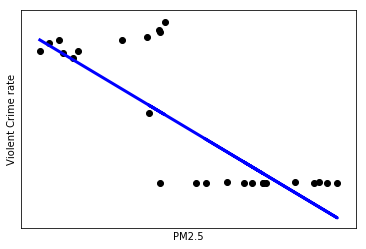


Coefficients: 
 [[-2.43541946]]
Mean squared error: 0.23
Variance score: -0.17


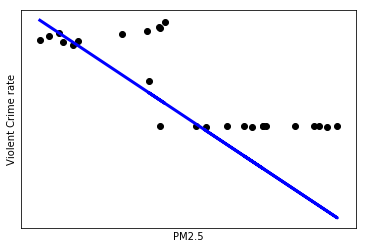

Variance

Coefficients: 
 [[-1568732.70307156]]
Mean squared error: 7558201834773.05
Variance score: -0.01


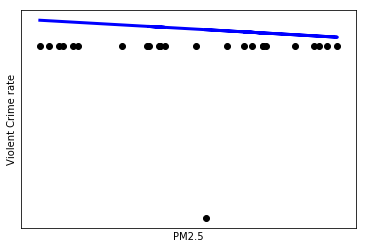


Coefficients: 
 [[-1773402.35179238]]
Mean squared error: 5940081796401.37
Variance score: -0.03


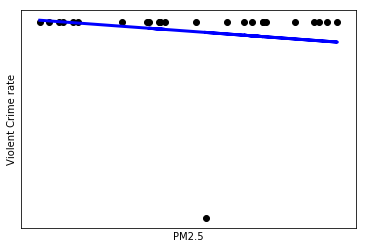

Mean mean squared error for mean: 0.4197448486193654
Mean variance score for mean: 0.4183391064388253
Mean mean squared error for variance: 6287419631072.331
Mean variance score for variance: 0.0009044046304140055


In [232]:
# using a flat scale, then training the algorithm to predict other cities 
j = 5
k = 0
for i, x in enumerate(cities):
    data = pollution_data(pollution[i][j], pollution_index[j])
    crime = rates[i][k]
    mean = data[0]
    variance = data[3]
    if i == 0:
        values = [[crime], [mean], [variance]]
    else:
        values[0].append(crime)
        values[1].append(mean)
        values[2].append(variance)
scaled = flat_scale(values)
mean_variance_total = 0
variance_mean_total = 0
variance_variance_total = 0
for l in range(3):
    print('Mean')
    a, b = linear_regression(scaled[0], scaled[1], l)
    mean_mean_total += a
    mean_variance_total += b
    print('Variance')
    a, b = linear_regression(scaled[0], scaled[2], l)
    variance_mean_total += a
    variance_variance_total += b
print('Mean mean squared error for mean:', (mean_mean_total / 6))
print('Mean variance score for mean:', (mean_variance_total / 6))
print('Mean mean squared error for variance:', (variance_mean_total / 6))
print('Mean variance score for variance:', (variance_variance_total / 6))

Mean

Coefficients: 
 [[0.71779568]]
Mean squared error: 0.03
Variance score: 0.41


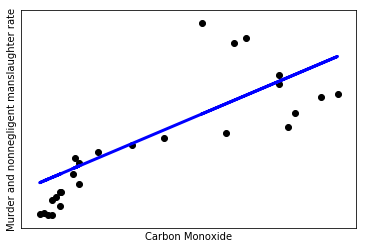


Coefficients: 
 [[0.9425873]]
Mean squared error: 0.02
Variance score: 0.69


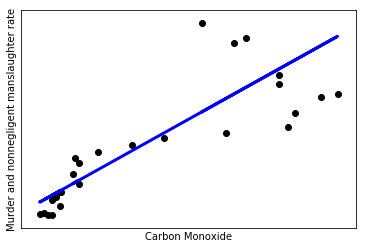

Variance

Coefficients: 
 [[0.8200985]]
Mean squared error: 0.02
Variance score: 0.59


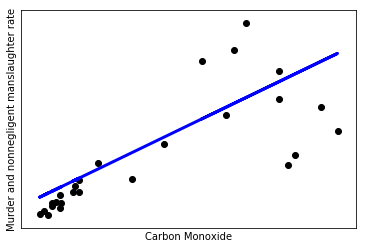


Coefficients: 
 [[0.95007683]]
Mean squared error: 0.03
Variance score: 0.63


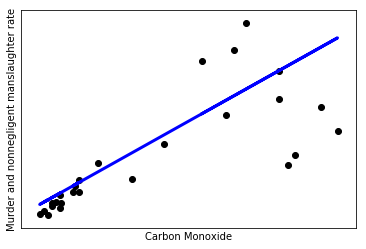

Mean

Coefficients: 
 [[0.9425873]]
Mean squared error: 0.05
Variance score: 0.34


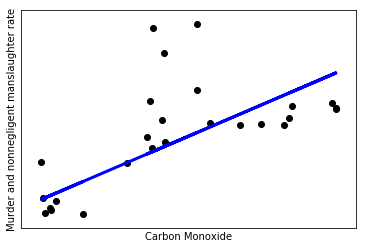


Coefficients: 
 [[0.79731243]]
Mean squared error: 0.05
Variance score: 0.27


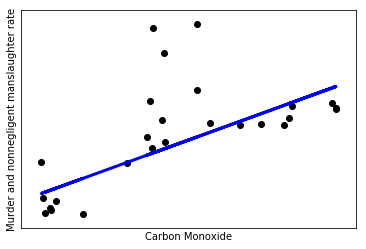

Variance

Coefficients: 
 [[0.95007683]]
Mean squared error: 0.05
Variance score: 0.32


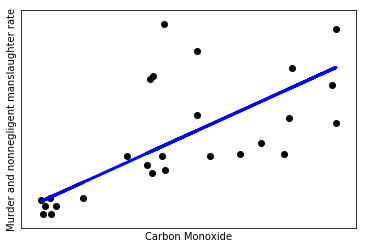


Coefficients: 
 [[0.71134751]]
Mean squared error: 0.06
Variance score: 0.17


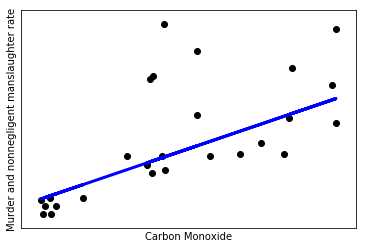

Mean

Coefficients: 
 [[0.79731243]]
Mean squared error: 0.03
Variance score: 0.61


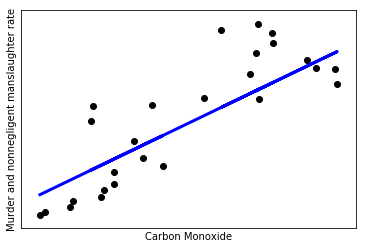


Coefficients: 
 [[0.71779568]]
Mean squared error: 0.02
Variance score: 0.42


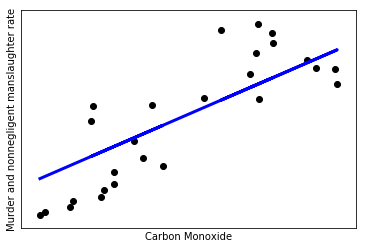

Variance

Coefficients: 
 [[0.71134751]]
Mean squared error: 0.03
Variance score: 0.49


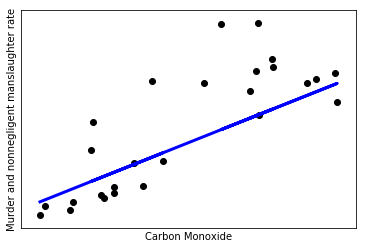


Coefficients: 
 [[0.8200985]]
Mean squared error: 0.03
Variance score: 0.42


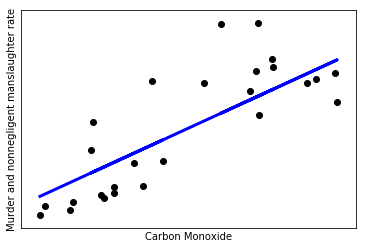

Mean mean squared error for mean: 0.45279067546531954
Mean variance score for mean: 0.45643812904432757
Mean mean squared error for variance: 0.03596538664381291
Mean variance score for variance: 0.43540286969124936


In [233]:
# using a flat scale, then training the algorithm to predict other cities 
j = 0
k = 1
for i, x in enumerate(cities):
    data = pollution_data(pollution[i][j], pollution_index[j])
    crime = rates[i][k]
    mean = data[0]
    variance = data[3]
    if i == 0:
        values = [[crime], [mean], [variance]]
    else:
        values[0].append(crime)
        values[1].append(mean)
        values[2].append(variance)
scaled = flat_scale(values)
mean_variance_total = 0
variance_mean_total = 0
variance_variance_total = 0
for l in range(3):
    print('Mean')
    a, b = linear_regression(scaled[0], scaled[1], l)
    mean_mean_total += a
    mean_variance_total += b
    print('Variance')
    a, b = linear_regression(scaled[0], scaled[2], l)
    variance_mean_total += a
    variance_variance_total += b
print('Mean mean squared error for mean:', (mean_mean_total / 6))
print('Mean variance score for mean:', (mean_variance_total / 6))
print('Mean mean squared error for variance:', (variance_mean_total / 6))
print('Mean variance score for variance:', (variance_variance_total / 6))

Mean

Coefficients: 
 [[0.00197245]]
Mean squared error: 0.01
Variance score: 0.00


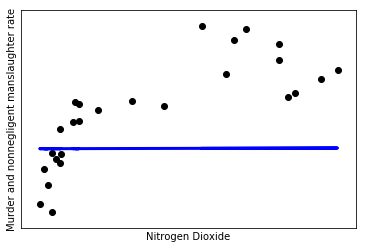


Coefficients: 
 [[0.59302512]]
Mean squared error: 0.01
Variance score: 0.66


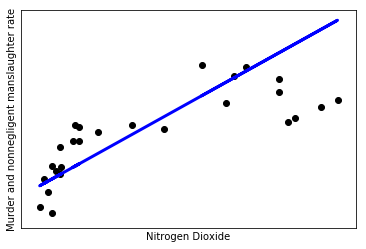

Variance

Coefficients: 
 [[0.10081132]]
Mean squared error: 0.01
Variance score: 0.07


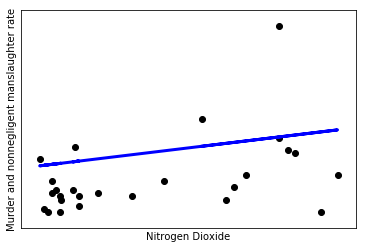


Coefficients: 
 [[0.25885191]]
Mean squared error: 0.00
Variance score: 0.47


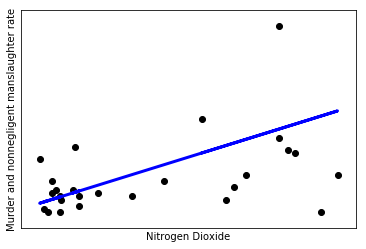

Mean

Coefficients: 
 [[0.59302512]]
Mean squared error: 0.02
Variance score: 0.31


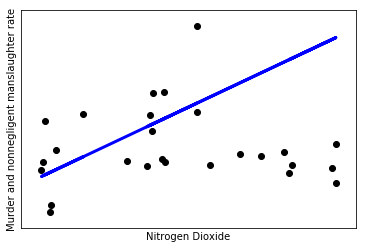


Coefficients: 
 [[0.33245771]]
Mean squared error: 0.01
Variance score: 0.34


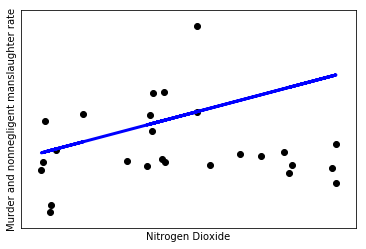

Variance

Coefficients: 
 [[0.25885191]]
Mean squared error: 0.01
Variance score: -0.01


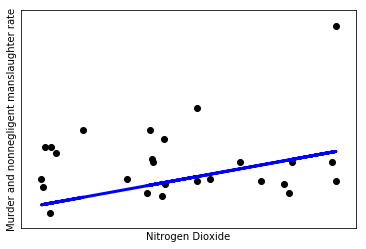


Coefficients: 
 [[0.13841274]]
Mean squared error: 0.01
Variance score: -0.05


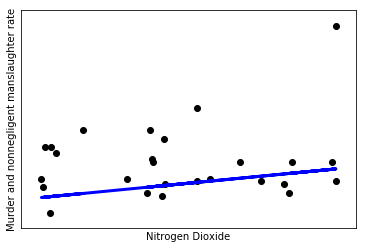

Mean

Coefficients: 
 [[0.33245771]]
Mean squared error: 0.01
Variance score: 0.59


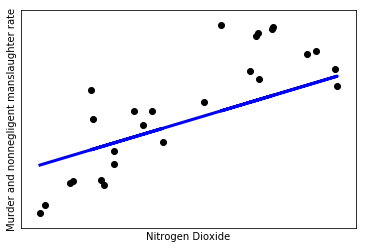


Coefficients: 
 [[0.00197245]]
Mean squared error: 0.01
Variance score: 0.00


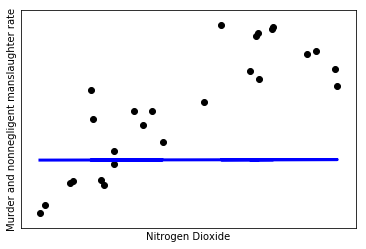

Variance

Coefficients: 
 [[0.13841274]]
Mean squared error: 0.01
Variance score: 0.07


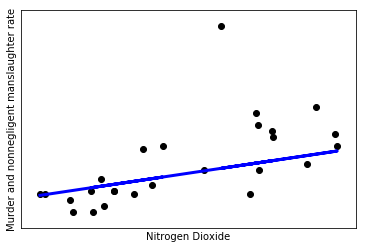


Coefficients: 
 [[0.10081132]]
Mean squared error: 0.01
Variance score: 0.01


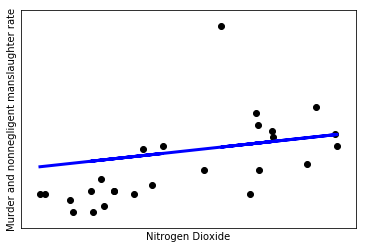

Mean mean squared error for mean: 0.4624148686949161
Mean variance score for mean: 0.31901522857028547
Mean mean squared error for variance: 0.007720712944748594
Mean variance score for variance: 0.09282033914302547


In [234]:
# using a flat scale, then training the algorithm to predict other cities 
j = 1
k = 1
for i, x in enumerate(cities):
    data = pollution_data(pollution[i][j], pollution_index[j])
    crime = rates[i][k]
    mean = data[0]
    variance = data[3]
    if i == 0:
        values = [[crime], [mean], [variance]]
    else:
        values[0].append(crime)
        values[1].append(mean)
        values[2].append(variance)
scaled = flat_scale(values)
mean_variance_total = 0
variance_mean_total = 0
variance_variance_total = 0
for l in range(3):
    print('Mean')
    a, b = linear_regression(scaled[0], scaled[1], l)
    mean_mean_total += a
    mean_variance_total += b
    print('Variance')
    a, b = linear_regression(scaled[0], scaled[2], l)
    variance_mean_total += a
    variance_variance_total += b
print('Mean mean squared error for mean:', (mean_mean_total / 6))
print('Mean variance score for mean:', (mean_variance_total / 6))
print('Mean mean squared error for variance:', (variance_mean_total / 6))
print('Mean variance score for variance:', (variance_variance_total / 6))

Mean

Coefficients: 
 [[0.18236708]]
Mean squared error: 0.01
Variance score: 0.25


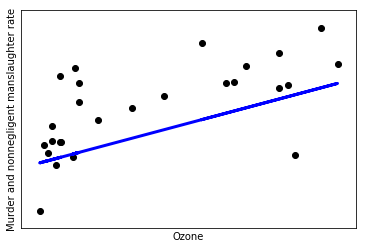


Coefficients: 
 [[0.5416124]]
Mean squared error: 0.01
Variance score: 0.61


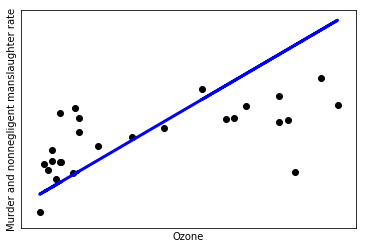

Variance

Coefficients: 
 [[0.34605714]]
Mean squared error: 0.01
Variance score: 0.28


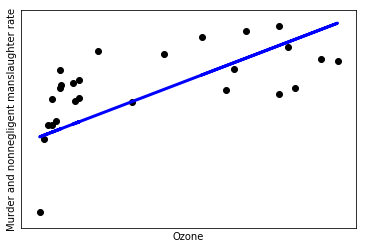


Coefficients: 
 [[0.44263557]]
Mean squared error: 0.00
Variance score: 0.67


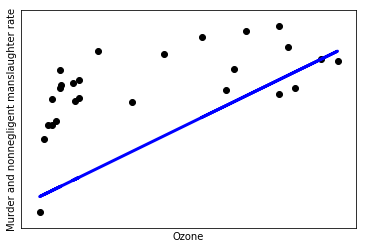

Mean

Coefficients: 
 [[0.5416124]]
Mean squared error: 0.03
Variance score: -0.04


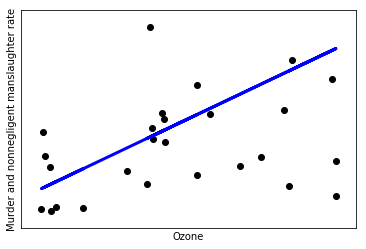


Coefficients: 
 [[0.18071215]]
Mean squared error: 0.00
Variance score: 0.25


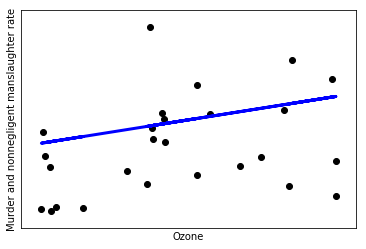

Variance

Coefficients: 
 [[0.44263557]]
Mean squared error: 0.01
Variance score: 0.27


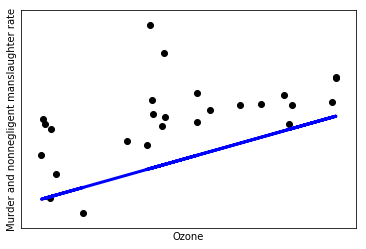


Coefficients: 
 [[0.20209296]]
Mean squared error: 0.01
Variance score: 0.22


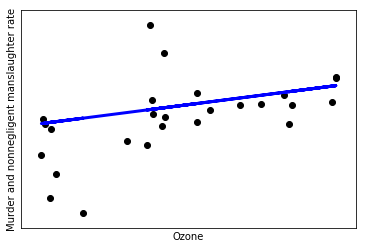

Mean

Coefficients: 
 [[0.18071215]]
Mean squared error: 0.00
Variance score: 0.34


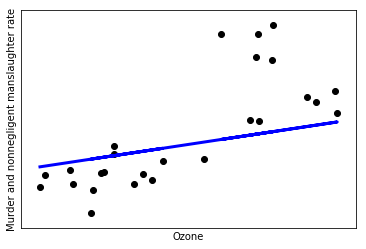


Coefficients: 
 [[0.18236708]]
Mean squared error: 0.01
Variance score: 0.09


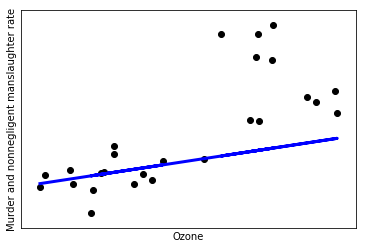

Variance

Coefficients: 
 [[0.20209296]]
Mean squared error: 0.01
Variance score: 0.39


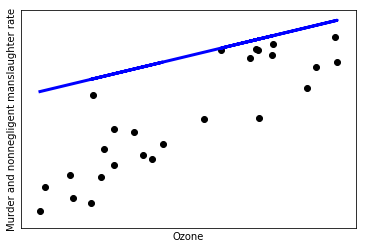


Coefficients: 
 [[0.34605714]]
Mean squared error: 0.01
Variance score: 0.22


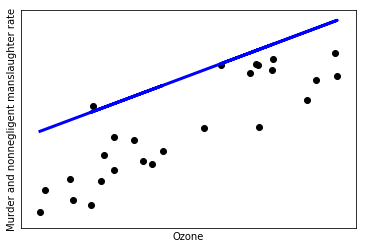

Mean mean squared error for mean: 0.47300717497778133
Mean variance score for mean: 0.25077587993047595
Mean mean squared error for variance: 0.007723235888229196
Mean variance score for variance: 0.341615535097269


In [235]:
# using a flat scale, then training the algorithm to predict other cities 
j = 2
k = 1
for i, x in enumerate(cities):
    data = pollution_data(pollution[i][j], pollution_index[j])
    crime = rates[i][k]
    mean = data[0]
    variance = data[3]
    if i == 0:
        values = [[crime], [mean], [variance]]
    else:
        values[0].append(crime)
        values[1].append(mean)
        values[2].append(variance)
scaled = flat_scale(values)
mean_variance_total = 0
variance_mean_total = 0
variance_variance_total = 0
for l in range(3):
    print('Mean')
    a, b = linear_regression(scaled[0], scaled[1], l)
    mean_mean_total += a
    mean_variance_total += b
    print('Variance')
    a, b = linear_regression(scaled[0], scaled[2], l)
    variance_mean_total += a
    variance_variance_total += b
print('Mean mean squared error for mean:', (mean_mean_total / 6))
print('Mean variance score for mean:', (mean_variance_total / 6))
print('Mean mean squared error for variance:', (variance_mean_total / 6))
print('Mean variance score for variance:', (variance_variance_total / 6))

Mean

Coefficients: 
 [[0.604835]]
Mean squared error: 0.01
Variance score: 0.61


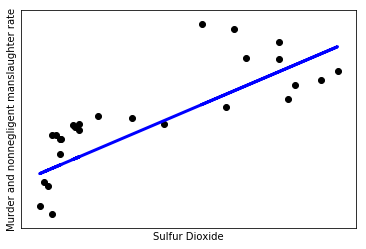


Coefficients: 
 [[0.75014818]]
Mean squared error: 0.02
Variance score: 0.55


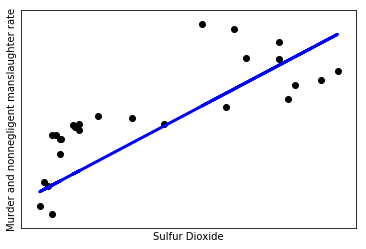

Variance

Coefficients: 
 [[0.39327274]]
Mean squared error: 0.01
Variance score: 0.15


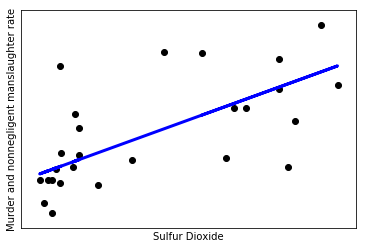


Coefficients: 
 [[0.49242005]]
Mean squared error: 0.02
Variance score: 0.33


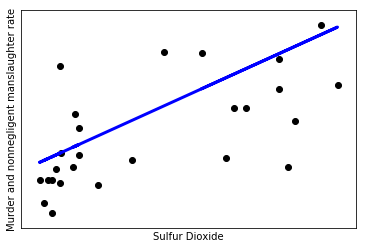

Mean

Coefficients: 
 [[0.75014818]]
Mean squared error: 0.04
Variance score: 0.11


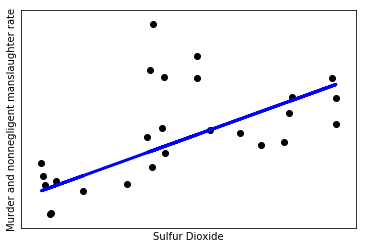


Coefficients: 
 [[0.54311301]]
Mean squared error: 0.03
Variance score: 0.26


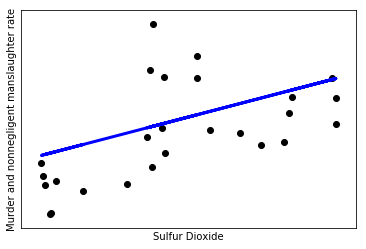

Variance

Coefficients: 
 [[0.49242005]]
Mean squared error: 0.03
Variance score: 0.24


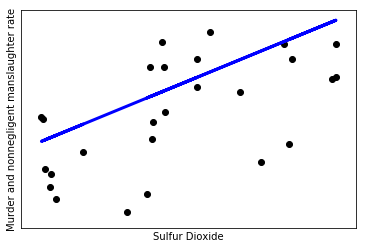


Coefficients: 
 [[0.34291348]]
Mean squared error: 0.02
Variance score: 0.22


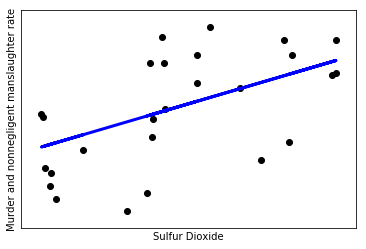

Mean

Coefficients: 
 [[0.54311301]]
Mean squared error: 0.01
Variance score: 0.61


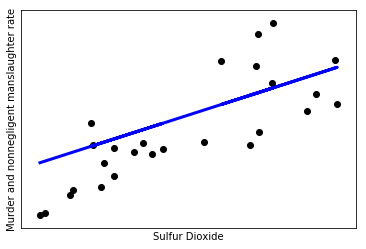


Coefficients: 
 [[0.604835]]
Mean squared error: 0.02
Variance score: 0.49


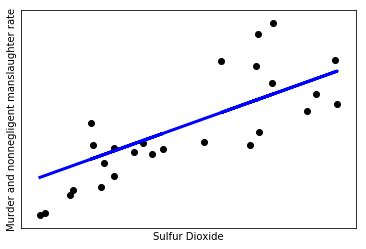

Variance

Coefficients: 
 [[0.34291348]]
Mean squared error: 0.01
Variance score: 0.39


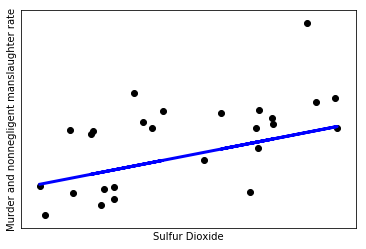


Coefficients: 
 [[0.39327274]]
Mean squared error: 0.01
Variance score: 0.06


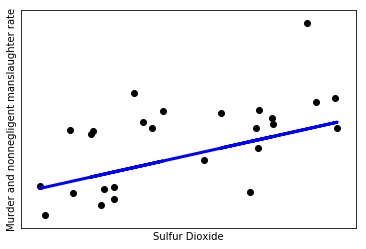

Mean mean squared error for mean: 0.49598797684724144
Mean variance score for mean: 0.4368368995064851
Mean mean squared error for variance: 0.0184304407044093
Mean variance score for variance: 0.23273715641153783


In [236]:
# using a flat scale, then training the algorithm to predict other cities 
j = 3
k = 1
for i, x in enumerate(cities):
    data = pollution_data(pollution[i][j], pollution_index[j])
    crime = rates[i][k]
    mean = data[0]
    variance = data[3]
    if i == 0:
        values = [[crime], [mean], [variance]]
    else:
        values[0].append(crime)
        values[1].append(mean)
        values[2].append(variance)
scaled = flat_scale(values)
mean_variance_total = 0
variance_mean_total = 0
variance_variance_total = 0
for l in range(3):
    print('Mean')
    a, b = linear_regression(scaled[0], scaled[1], l)
    mean_mean_total += a
    mean_variance_total += b
    print('Variance')
    a, b = linear_regression(scaled[0], scaled[2], l)
    variance_mean_total += a
    variance_variance_total += b
print('Mean mean squared error for mean:', (mean_mean_total / 6))
print('Mean variance score for mean:', (mean_variance_total / 6))
print('Mean mean squared error for variance:', (variance_mean_total / 6))
print('Mean variance score for variance:', (variance_variance_total / 6))

Mean

Coefficients: 
 [[0.43326534]]
Mean squared error: 0.09
Variance score: -0.19


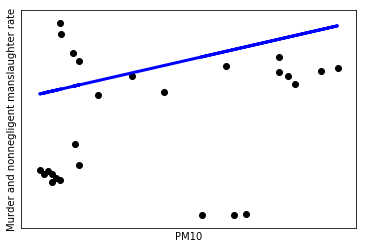


Coefficients: 
 [[-0.60782356]]
Mean squared error: 0.06
Variance score: 0.28


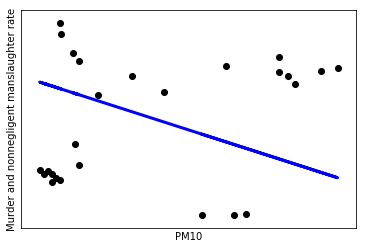

Variance

Coefficients: 
 [[222004.93075958]]
Mean squared error: 716608948422.20
Variance score: -0.02


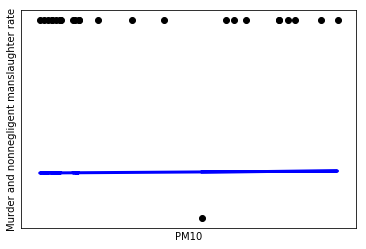


Coefficients: 
 [[-428404.98956265]]
Mean squared error: 386448018902.37
Variance score: 0.00


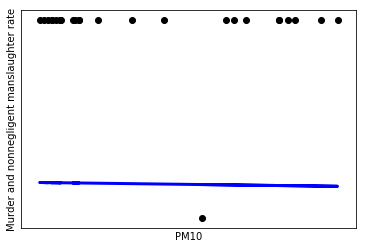

Mean

Coefficients: 
 [[-0.60782356]]
Mean squared error: 0.09
Variance score: -0.06


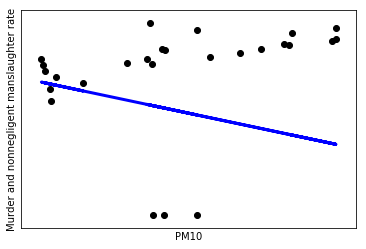


Coefficients: 
 [[0.29231748]]
Mean squared error: 0.09
Variance score: 0.14


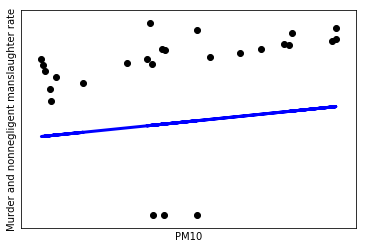

Variance

Coefficients: 
 [[-428404.98956265]]
Mean squared error: 398994822646.91
Variance score: -0.03


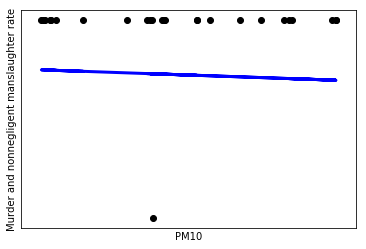


Coefficients: 
 [[-1284114.96004325]]
Mean squared error: 12375565836474.73
Variance score: -0.01


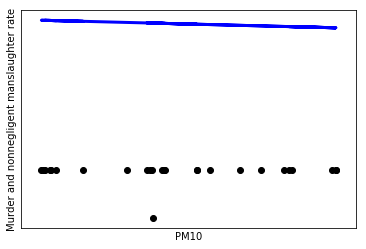

Mean

Coefficients: 
 [[0.29231748]]
Mean squared error: 0.09
Variance score: 0.09


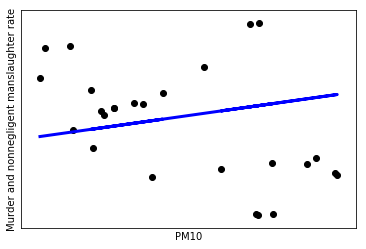


Coefficients: 
 [[0.43326534]]
Mean squared error: 0.09
Variance score: -0.18


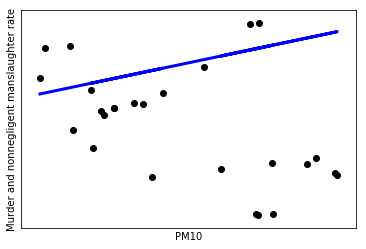

Variance

Coefficients: 
 [[-1284114.96004325]]
Mean squared error: 12002010267602.78
Variance score: 0.02


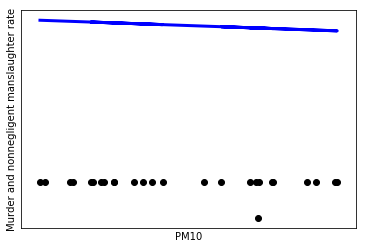


Coefficients: 
 [[222004.93075958]]
Mean squared error: 719291374635.52
Variance score: -0.03


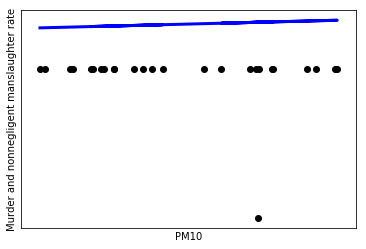

Mean mean squared error for mean: 0.5819902410035107
Mean variance score for mean: 0.012280620906810258
Mean mean squared error for variance: 4433153211447.419
Mean variance score for variance: -0.011162777774556635


In [237]:
# using a flat scale, then training the algorithm to predict other cities 
j = 4
k = 1
for i, x in enumerate(cities):
    data = pollution_data(pollution[i][j], pollution_index[j])
    crime = rates[i][k]
    mean = data[0]
    variance = data[3]
    if i == 0:
        values = [[crime], [mean], [variance]]
    else:
        values[0].append(crime)
        values[1].append(mean)
        values[2].append(variance)
scaled = flat_scale(values)
mean_variance_total = 0
variance_mean_total = 0
variance_variance_total = 0
for l in range(3):
    print('Mean')
    a, b = linear_regression(scaled[0], scaled[1], l)
    mean_mean_total += a
    mean_variance_total += b
    print('Variance')
    a, b = linear_regression(scaled[0], scaled[2], l)
    variance_mean_total += a
    variance_variance_total += b
print('Mean mean squared error for mean:', (mean_mean_total / 6))
print('Mean variance score for mean:', (mean_variance_total / 6))
print('Mean mean squared error for variance:', (variance_mean_total / 6))
print('Mean variance score for variance:', (variance_variance_total / 6))

Mean

Coefficients: 
 [[-1.97974471]]
Mean squared error: 0.12
Variance score: 0.39


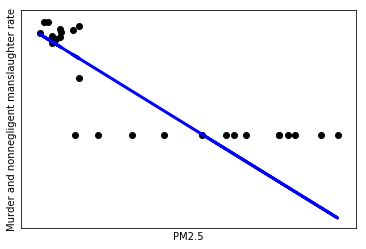


Coefficients: 
 [[-1.41570528]]
Mean squared error: 0.07
Variance score: 0.59


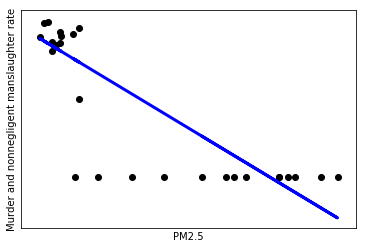

Variance

Coefficients: 
 [[636325.85906196]]
Mean squared error: 5887339951686.10
Variance score: -0.02


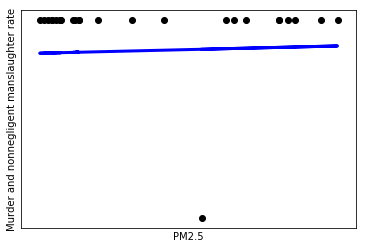


Coefficients: 
 [[-1634834.71006274]]
Mean squared error: 5627671145900.94
Variance score: 0.00


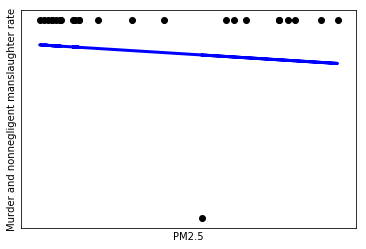

Mean

Coefficients: 
 [[-1.41570528]]
Mean squared error: 0.11
Variance score: 0.41


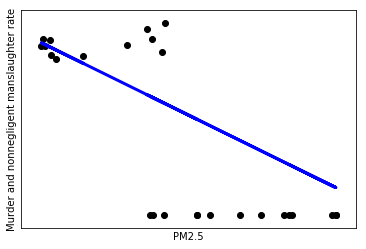


Coefficients: 
 [[-1.28031898]]
Mean squared error: 0.10
Variance score: 0.52


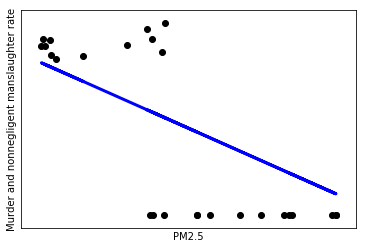

Variance

Coefficients: 
 [[-1634834.71006274]]
Mean squared error: 5810384961782.03
Variance score: -0.03


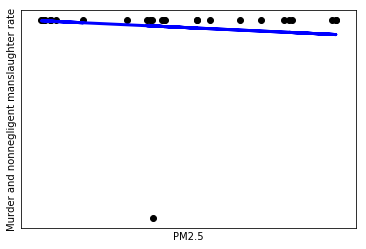


Coefficients: 
 [[-1003481.73788992]]
Mean squared error: 7557448288233.29
Variance score: -0.01


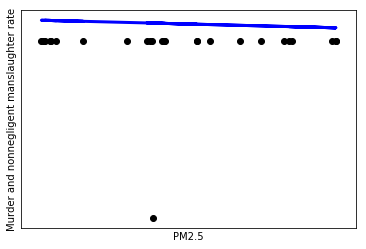

Mean

Coefficients: 
 [[-1.28031898]]
Mean squared error: 0.08
Variance score: 0.60


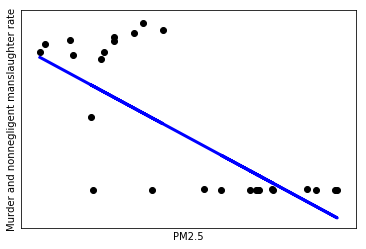


Coefficients: 
 [[-1.97974471]]
Mean squared error: 0.13
Variance score: 0.32


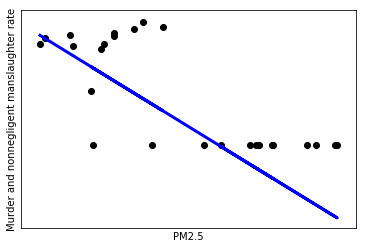

Variance

Coefficients: 
 [[-1003481.73788992]]
Mean squared error: 7329326998335.07
Variance score: 0.02


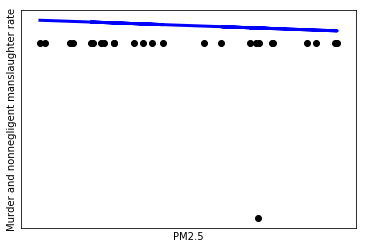


Coefficients: 
 [[636325.85906196]]
Mean squared error: 5909377502382.35
Variance score: -0.03


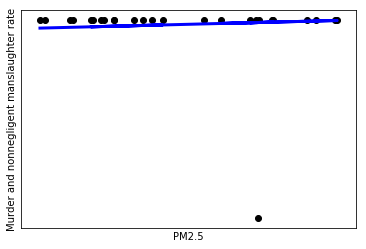

Mean mean squared error for mean: 0.6840873605817069
Mean variance score for mean: 0.47222861944200956
Mean mean squared error for variance: 6353591474719.962
Mean variance score for variance: -0.01116274009757251


In [238]:
# using a flat scale, then training the algorithm to predict other cities 
j = 5
k = 1
for i, x in enumerate(cities):
    data = pollution_data(pollution[i][j], pollution_index[j])
    crime = rates[i][k]
    mean = data[0]
    variance = data[3]
    if i == 0:
        values = [[crime], [mean], [variance]]
    else:
        values[0].append(crime)
        values[1].append(mean)
        values[2].append(variance)
scaled = flat_scale(values)
mean_variance_total = 0
variance_mean_total = 0
variance_variance_total = 0
for l in range(3):
    print('Mean')
    a, b = linear_regression(scaled[0], scaled[1], l)
    mean_mean_total += a
    mean_variance_total += b
    print('Variance')
    a, b = linear_regression(scaled[0], scaled[2], l)
    variance_mean_total += a
    variance_variance_total += b
print('Mean mean squared error for mean:', (mean_mean_total / 6))
print('Mean variance score for mean:', (mean_variance_total / 6))
print('Mean mean squared error for variance:', (variance_mean_total / 6))
print('Mean variance score for variance:', (variance_variance_total / 6))